In [ ]:
import numpy as np
import pandas as pd

In [ ]:
new=pd.read_csv('/content/june_aftermerge_6_15_2026.csv')

In [ ]:
old=pd.read_csv('/content/1324image_3_14_2026.csv')

In [ ]:
nsd_df=pd.read_csv('/content/nsd-iss-june.csv')

In [ ]:
epworth=pd.read_csv('/content/Epworth_Sleepiness_Scale_18Jun2026.csv')
hopkins=pd.read_csv("/content/Hopkins_Verbal_Learning_Test_-_Revised_18Jun2026.csv")
sem_fluency=pd.read_csv('/content/Modified_Semantic_Fluency_18Jun2026.csv')
scopa_aut=pd.read_csv('/content/SCOPA-AUT_18Jun2026.csv')

In [ ]:
bio=pd.read_csv('/content/Current_Biospecimen_Analysis_Results_13Jun2026.csv')

/tmp/ipykernel_6636/687970385.py:1: DtypeWarning: Columns (6,7) have mixed types. Specify dtype option on import or set low_memory=False.
  bio=pd.read_csv('/content/Current_Biospecimen_Analysis_Results_13Jun2026.csv')


In [ ]:
epworth.columns.tolist()

['REC_ID',
 'PATNO',
 'EVENT_ID',
 'PAG_NAME',
 'INFODT',
 'PTCGBOTH',
 'ESS1',
 'ESS2',
 'ESS3',
 'ESS4',
 'ESS5',
 'ESS6',
 'ESS7',
 'ESS8',
 'ORIG_ENTRY',
 'LAST_UPDATE']

In [ ]:
epworth.isnull().sum()

,0
REC_ID,0
PATNO,0
EVENT_ID,0
PAG_NAME,0
INFODT,0
PTCGBOTH,1
ESS1,0
ESS2,2
ESS3,1
ESS4,1


In [ ]:
hopkins.columns.tolist()

['REC_ID',
 'PATNO',
 'EVENT_ID',
 'PAG_NAME',
 'INFODT',
 'HVLTRT1',
 'HVLTRT2',
 'HVLTRT3',
 'HVLTRDLY',
 'HVLTREC',
 'HVLTFPRL',
 'HVLTFPUN',
 'HVLTVRSN',
 'AGE_ASSESS_HVLT',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'ORIG_ENTRY',
 'LAST_UPDATE']

In [ ]:
hopkins.isnull().sum()

,0
REC_ID,0
PATNO,0
EVENT_ID,0
PAG_NAME,0
INFODT,0
HVLTRT1,5
HVLTRT2,8
HVLTRT3,11
HVLTRDLY,45
HVLTREC,66


In [ ]:
scopa_aut.columns.tolist()

['REC_ID',
 'PATNO',
 'EVENT_ID',
 'PAG_NAME',
 'INFODT',
 'PTCGBOTH',
 'SCAU1',
 'SCAU2',
 'SCAU3',
 'SCAU4',
 'SCAU5',
 'SCAU6',
 'SCAU7',
 'SCAU8',
 'SCAU9',
 'SCAU10',
 'SCAU11',
 'SCAU12',
 'SCAU13',
 'SCAU14',
 'SCAU15',
 'SCAU16',
 'SCAU17',
 'SCAU18',
 'SCAU19',
 'SCAU20',
 'SCAU21',
 'SCAU22',
 'SCAU23',
 'SCAU23A',
 'SCAU23AT',
 'SCAU24',
 'SCAU25',
 'SCAU26A',
 'SCAU26AT',
 'SCAU26B',
 'SCAU26BT',
 'SCAU26C',
 'SCAU26CT',
 'SCAU26D',
 'SCAU26DT',
 'ORIG_ENTRY',
 'LAST_UPDATE']

In [ ]:
scopa_aut.isnull().sum()

,0
REC_ID,0
PATNO,0
EVENT_ID,0
PAG_NAME,0
INFODT,0
PTCGBOTH,1
SCAU1,3
SCAU2,2
SCAU3,3
SCAU4,6


In [ ]:
sem_fluency.columns.tolist()

['REC_ID',
 'PATNO',
 'EVENT_ID',
 'PAG_NAME',
 'INFODT',
 'VLTANIM',
 'VLTVEG',
 'VLTFRUIT',
 'AGE_ASSESS_SFTANIM',
 'DVS_SFTANIM',
 'DVT_SFTANIM',
 'ORIG_ENTRY',
 'LAST_UPDATE']

In [ ]:
sem_fluency.isnull().sum()

,0
REC_ID,0
PATNO,0
EVENT_ID,0
PAG_NAME,0
INFODT,0
VLTANIM,0
VLTVEG,12514
VLTFRUIT,12514
AGE_ASSESS_SFTANIM,0
DVS_SFTANIM,0


In [ ]:
keep_events=['BL','V02','V04','V05', 'V06', 'V08', 'V10', 'V12','V11','V13','V14', 'V15','V16', 'V17', 'V18','V20']

In [ ]:
epworth = epworth[epworth['EVENT_ID'].isin(keep_events)].copy()
hopkins = hopkins[hopkins['EVENT_ID'].isin(keep_events)].copy()
scopa_aut = scopa_aut[scopa_aut['EVENT_ID'].isin(keep_events)].copy()
sem_fluency = sem_fluency[sem_fluency['EVENT_ID'].isin(keep_events)].copy()
# bio = bio[bio['EVENT_ID'].isin(keep_events)].copy()

add these new

In [ ]:
import pandas as pd
import numpy as np

# ================================================================
# STEP 0: LOAD FILES
# ================================================================
ess   = epworth.copy()
hvlt  = hopkins.copy()
scopa = scopa_aut.copy()
sft   = sem_fluency.copy()


print(f"ESS raw:   {ess.shape}")
print(f"HVLT raw:  {hvlt.shape}")
print(f"SCOPA raw: {scopa.shape}")
print(f"SFT raw:   {sft.shape}")


# ================================================================
# STEP 1: DEDUPLICATE SOURCE FILES BEFORE ANY AGGREGATION
# ================================================================
# PPMI questionnaire files can contain duplicate/corrected rows
# for the same PATNO+EVENT_ID. groupby().mean() would SILENTLY
# blend conflicting values — instead, explicitly resolve by
# keeping the most recently updated row.
def dedupe_visits(df, name, keys=['PATNO','EVENT_ID']):
    before = len(df)
    dupe_mask = df.duplicated(subset=keys, keep=False)
    n_dupes = dupe_mask.sum()

    if n_dupes > 0:
        print(f"  ⚠️  {name}: {n_dupes} duplicate "
              f"PATNO+EVENT_ID rows found")
        if 'LAST_UPDATE' in df.columns:
            df['LAST_UPDATE'] = pd.to_datetime(
                df['LAST_UPDATE'], errors='coerce')
            df = df.sort_values('LAST_UPDATE')
        elif 'ORIG_ENTRY' in df.columns:
            df['ORIG_ENTRY'] = pd.to_datetime(
                df['ORIG_ENTRY'], errors='coerce')
            df = df.sort_values('ORIG_ENTRY')
        # Keep the LAST (most recent) entry per visit
        df = df.drop_duplicates(subset=keys, keep='last')
    else:
        print(f"  ✅ {name}: no duplicate visit rows")

    after = len(df)
    print(f"     {name}: {before} → {after} rows "
          f"({before-after} removed)")
    return df.reset_index(drop=True)

print("="*60)
print("DEDUPLICATION")
print("="*60)
ess   = dedupe_visits(ess,   'ESS')
hvlt  = dedupe_visits(hvlt,  'HVLT')
scopa = dedupe_visits(scopa, 'SCOPA')
sft   = dedupe_visits(sft,   'SFT')

# Final hard check — after dedup, PATNO+EVENT_ID must be unique
for name, d in [('ESS',ess),('HVLT',hvlt),
                ('SCOPA',scopa),('SFT',sft)]:
    n_dupe_final = d.duplicated(
        subset=['PATNO','EVENT_ID']).sum()
    assert n_dupe_final == 0, \
        f"{name} still has {n_dupe_final} duplicates after dedup!"
print("\n✅ All four files confirmed unique on PATNO+EVENT_ID")


# ================================================================
# STEP 2: FIX DTYPES (PATNO + EVENT_ID) — BEFORE ANY MERGE
# ================================================================
def fix_keys(df):
    df_one = df.copy()
    df_one['PATNO'] = pd.to_numeric(
        df_one['PATNO'], errors='coerce').astype('int64')
    df_one['EVENT_ID'] = (df_one['EVENT_ID']
                       .astype(str).str.strip().str.upper())
    return df_one

ess   = fix_keys(ess)
hvlt  = fix_keys(hvlt)
scopa = fix_keys(scopa)
sft   = fix_keys(sft)


# ================================================================
# STEP 3: ESS — EPWORTH SLEEPINESS SCALE
# ================================================================
ESS_ITEMS = ['ESS1','ESS2','ESS3','ESS4',
             'ESS5','ESS6','ESS7','ESS8']

for col in ESS_ITEMS:
    ess[col] = pd.to_numeric(ess[col], errors='coerce')

# require >=6 of 8 items present, else NaN (not 0)
ess['ESS_total'] = ess[ESS_ITEMS].sum(
    axis=1, skipna=True, min_count=6)

# Nullable Int64 — if ESS_total is NaN, ESS_high stays NaN too
ess['ESS_high'] = pd.array(
    ess['ESS_total'] > 10, dtype='Int64')
ess.loc[ess['ESS_total'].isna(), 'ESS_high'] = pd.NA

ess_final = ess[['PATNO','EVENT_ID','ESS_total','ESS_high']].copy()

print(f"\n=== ESS ===")
print(f"Shape: {ess_final.shape}")
print(f"ESS_total coverage: "
      f"{ess_final['ESS_total'].notna().mean():.1%}")
print(f"ESS_total stats:\n{ess_final['ESS_total'].describe()}")


# ================================================================
# STEP 4: HVLT — VERBAL LEARNING
# ================================================================
HVLT_KEEP = [
    'DVT_TOTAL_RECALL', 'DVT_DELAYED_RECALL',
    'DVT_RETENTION', 'DVT_RECOG_DISC_INDEX',
]
for col in HVLT_KEEP + ['HVLTRT1','HVLTRT3',
                        'HVLTFPRL','HVLTFPUN']:
    if col in hvlt.columns:
        hvlt[col] = pd.to_numeric(hvlt[col], errors='coerce')

# Learning slope — NaN if either trial missing (no fillna trick)
hvlt['HVLT_learning_slope'] = np.where(
    hvlt[['HVLTRT1','HVLTRT3']].notna().all(axis=1),
    hvlt['HVLTRT3'] - hvlt['HVLTRT1'],
    np.nan)

# False positives — NaN only if BOTH source cols missing;
# floors at 0 if at least one is present (clinically valid,
# since a missing sub-item with a present one usually means 0)
hvlt['HVLT_false_pos'] = np.where(
    hvlt[['HVLTFPRL','HVLTFPUN']].isna().all(axis=1),
    np.nan,
    hvlt['HVLTFPRL'].fillna(0) + hvlt['HVLTFPUN'].fillna(0))

final_hvlt_cols = HVLT_KEEP + [
    'HVLT_learning_slope', 'HVLT_false_pos']

hvlt_final = hvlt[['PATNO','EVENT_ID'] + final_hvlt_cols].copy()

print(f"\n=== HVLT ===")
print(f"Shape: {hvlt_final.shape}")
for col in final_hvlt_cols:
    n = hvlt_final[col].isna().sum()
    pct = n / len(hvlt_final) * 100
    print(f"  {col:<28}: {n} null ({pct:.1f}%)")

# ================================================================
# STEP 5: SCOPA-AUT — AUTONOMIC SYMPTOMS
# ================================================================
SCOPA_GI    = ['SCAU1','SCAU2','SCAU3','SCAU4',
               'SCAU5','SCAU6','SCAU7']
SCOPA_URIN  = ['SCAU8','SCAU9','SCAU10',
               'SCAU11','SCAU12','SCAU13']
SCOPA_CARD  = ['SCAU14','SCAU15','SCAU16']
SCOPA_THERM = ['SCAU17','SCAU18','SCAU19']
SCOPA_PUPIL = ['SCAU20','SCAU21']
# SCAU22-26 (sexual function) intentionally excluded:
# higher missingness/sensitivity in PPMI, handled separately
# if needed — not a silent omission, a deliberate scope choice.

all_scopa_items = (SCOPA_GI + SCOPA_URIN + SCOPA_CARD +
                   SCOPA_THERM + SCOPA_PUPIL)

for col in all_scopa_items:
    if col in scopa.columns:
        scopa[col] = pd.to_numeric(scopa[col], errors='coerce')

# Sanity check item ranges against PPMI's actual scale
print(f"\n=== SCOPA-AUT item range check (BEFORE sentinel fix) ===")
print(scopa[all_scopa_items].describe().T[['min','max']])

# ──────────────────────────────────────────────────────────────
# ★ NEW STEP — FIX SENTINEL/SKIP CODE ★
# SCAU8-13 (urinary) showed max=9 vs max=3 everywhere else.
# Value counts confirmed a small isolated cluster of ~65-74
# rows at exactly 9 per item — a "not applicable / not
# assessed" sentinel code, NOT a real severity score.
# Must be treated as missing BEFORE any summing, or it
# inflates SCOPA_urinary and SCOPA_total for those patients.
# ──────────────────────────────────────────────────────────────
print(f"\n=== Fixing SCAU urinary sentinel code (9 -> NaN) ===")
for col in SCOPA_URIN:
    n_nine = (scopa[col] == 9).sum()
    if n_nine > 0:
        print(f"  {col}: replacing {n_nine} rows of 9 with NaN")
    scopa[col] = scopa[col].replace({9: np.nan, 99: np.nan})

# Re-check range — should now show max=3.0 like other domains
print(f"\n=== SCOPA-AUT item range check (AFTER sentinel fix) ===")
print(scopa[all_scopa_items].describe().T[['min','max']])
# ──────────────────────────────────────────────────────────────
# ★ END NEW STEP ★
# ──────────────────────────────────────────────────────────────

def safe_subscale_sum(df, items, min_frac=0.6):
    """Sum only items present in df; require min_frac of
    items non-null per row, else NaN (not silent 0)."""
    present_items = [c for c in items if c in df.columns]
    min_count = max(1, int(np.ceil(len(present_items)*min_frac)))
    return df[present_items].sum(
        axis=1, skipna=True, min_count=min_count)

scopa['SCOPA_GI']             = safe_subscale_sum(scopa, SCOPA_GI)
scopa['SCOPA_urinary']        = safe_subscale_sum(scopa, SCOPA_URIN)
scopa['SCOPA_cardiovascular'] = safe_subscale_sum(scopa, SCOPA_CARD)
scopa['SCOPA_thermoregulatory'] = safe_subscale_sum(scopa, SCOPA_THERM)
scopa['SCOPA_pupillomotor']   = safe_subscale_sum(
    scopa, SCOPA_PUPIL, min_frac=0.5)  # only 2 items, require >=1

subscale_cols = ['SCOPA_GI','SCOPA_urinary',
                 'SCOPA_cardiovascular',
                 'SCOPA_thermoregulatory',
                 'SCOPA_pupillomotor']

# Total — require at least 4 of 5 subscales present
scopa['SCOPA_total'] = scopa[subscale_cols].sum(
    axis=1, skipna=True, min_count=4)

SCOPA_FEATURES = subscale_cols + ['SCOPA_total']

scopa_final = scopa[['PATNO','EVENT_ID'] + SCOPA_FEATURES].copy()

print(f"\n=== SCOPA-AUT ===")
print(f"Shape: {scopa_final.shape}")
for col in SCOPA_FEATURES:
    n = scopa_final[col].isna().sum()
    pct = n / len(scopa_final) * 100
    print(f"  {col:<28}: {n} null ({pct:.1f}%)")

# Sanity check the fix worked downstream too
print(f"\nSCOPA_urinary stats after fix:")
print(scopa_final['SCOPA_urinary'].describe())

# Add this after recomputing to confirm fix worked
print("=== VERIFY SENTINEL FIX ===")
expected_max = {
    'SCOPA_GI':               21,
    'SCOPA_urinary':          18,
    'SCOPA_cardiovascular':    9,
    'SCOPA_thermoregulatory':  9,
    'SCOPA_pupillomotor':      6,
    'SCOPA_total':            63,
}

for col, exp_max in expected_max.items():
    actual_max = scopa[col].max()
    ok = "✅" if actual_max <= exp_max else "❌ STILL HAS 9s"
    print(f"  {ok} {col:<25}: max={actual_max:.0f} "
          f"(expected ≤{exp_max})")
# ================================================================
# STEP 6: SEMANTIC FLUENCY
# ================================================================
SFT_RAW_COLS = ['DVT_SFTANIM','DVS_SFTANIM',
                ]
for col in SFT_RAW_COLS:
    if col in sft.columns:
        sft[col] = pd.to_numeric(sft[col], errors='coerce')

# Composite — NaN unless all three raw counts present
# (no fillna(0)-before-multiply; missing should not look
# like "named zero animals")
# sft['SFT_composite'] = np.where(
#     sft[['VLTANIM','VLTVEG','VLTFRUIT']].notna().all(axis=1),
#     sft['VLTANIM']*0.5 + sft['VLTVEG']*0.25 + sft['VLTFRUIT']*0.25,
#     np.nan)

SFT_FEATURES = ['DVT_SFTANIM','DVS_SFTANIM']

sft_final = sft[['PATNO','EVENT_ID'] + SFT_FEATURES].copy()

print(f"\n=== SEMANTIC FLUENCY ===")
print(f"Shape: {sft_final.shape}")
for col in SFT_FEATURES:
    n = sft_final[col].isna().sum()
    pct = n / len(sft_final) * 100
    print(f"  {col:<20}: {n} null ({pct:.1f}%)")


# ================================================================
# STEP 7: FIX KEYS ON BASE DF TOO — CONFIRM MATCH BEFORE MERGE
# ================================================================
nsd_df = fix_keys(nsd_df)

print(f"\n{'='*60}")
print("KEY FORMAT CHECK (base vs new files)")
print(f"{'='*60}")
print(f"nsd_bio EVENT_ID sample: "
      f"{nsd_df['EVENT_ID'].unique()[:5].tolist()}")
print(f"ess_final EVENT_ID sample: "
      f"{ess_final['EVENT_ID'].unique()[:5].tolist()}")
print(f"nsd_bio PATNO dtype: {nsd_df['PATNO'].dtype}")
print(f"ess_final PATNO dtype: {ess_final['PATNO'].dtype}")


# ================================================================
# STEP 8: SAFE LEFT JOIN — ASSERTS NO ROW INFLATION
# ================================================================
def safe_left_join(base, new_df, name, keys=['PATNO','EVENT_ID']):
    # Hard guarantee: new_df must be unique on keys before merging,
    # otherwise a left join WILL inflate row count.
    n_dupe = new_df.duplicated(subset=keys).sum()
    assert n_dupe == 0, \
        f"{name}: new_df has {n_dupe} duplicate keys — " \
        f"dedupe before merging!"

    before = len(base)
    merged = base.merge(new_df, on=keys, how='left')
    after = len(merged)
    assert before == after, \
        f"{name}: Row inflation {before} → {after}!"

    matched = base.set_index(keys).index.isin(
        new_df.set_index(keys).index).sum()
    print(f"  {name:<8}: ✅ rows={after} | "
          f"matched={matched}/{before} "
          f"({matched/before:.1%})")
    return merged

print(f"\n{'='*60}")
print("MERGING INTO nsd_bio")
print(f"{'='*60}")
base_shape = nsd_df.shape
print(f"Base shape: {base_shape}\n")


nsd_df_new = safe_left_join(nsd_df, ess_final,   'ESS')
nsd_df_new = safe_left_join(nsd_df_new, hvlt_final,  'HVLT')
nsd_df_new = safe_left_join(nsd_df_new, scopa_final, 'SCOPA')
nsd_df_new = safe_left_join(nsd_df_new, sft_final,   'SFT')

assert nsd_df_new.shape[0] == base_shape[0], \
    "Final row count changed — merge inflated rows!"
print(f"\n✅ Final row count unchanged: {nsd_df.shape[0]}")


# ================================================================
# STEP 9: FINAL DUPLICATE CHECK ON MERGED RESULT
# ================================================================
final_dupes = nsd_df_new.duplicated(
    subset=['PATNO','EVENT_ID']).sum()
print(f"\nDuplicate PATNO+EVENT_ID in final merged df: "
      f"{final_dupes}")
assert final_dupes == 0, "Final merged df has duplicate visits!"

full_row_dupes = nsd_df_new.duplicated().sum()
print(f"Fully duplicate rows (all columns identical): "
      f"{full_row_dupes}")


# ================================================================
# STEP 10: NULL SUMMARY FOR ALL NEW FEATURES
# ================================================================
new_features = (
    ['ESS_total','ESS_high'] +
    final_hvlt_cols +
    SCOPA_FEATURES +
    SFT_FEATURES
)

print(f"\n{'='*60}")
print("NEW FEATURES NULL SUMMARY")
print(f"{'='*60}")
print(f"\n{'Feature':<28} {'Coverage%':>10} "
      f"{'Null%':>8}  {'Action':>15}")
print("-"*68)

for col in new_features:
    if col not in nsd_df_new.columns:
        print(f"  ❌ MISSING: {col}")
        continue
    null_pct = nsd_df_new[col].isna().mean() * 100
    cov_pct  = 100 - null_pct
    action   = "KNN impute" if null_pct < 70 else "consider drop"
    flag     = "⚠️ " if null_pct > 70 else "✅"
    print(f"  {flag} {col:<26} {cov_pct:>9.1f}% "
          f"{null_pct:>7.1f}%  {action:>15}")

print(f"\nFinal shape: {nsd_df_new.shape}")
print(f"Unique PATNO: {nsd_df_new['PATNO'].nunique()}")
print(f"\nstage_merged distribution:")
print(nsd_df['stage_merged'].value_counts().sort_index())


# ================================================================
# STEP 11: SAVE
# ================================================================
nsd_df_new.to_csv('nsd_bio_early_features.csv', index=False)
print(f"\n✅ Saved: nsd_bio_early_features.csv {nsd_df_new.shape}")

ESS raw:   (20395, 16)
HVLT raw:  (18671, 20)
SCOPA raw: (20373, 43)
SFT raw:   (18679, 13)
DEDUPLICATION
  ⚠️  ESS: 2 duplicate PATNO+EVENT_ID rows found
     ESS: 20395 → 20394 rows (1 removed)
  ✅ HVLT: no duplicate visit rows
     HVLT: 18671 → 18671 rows (0 removed)
  ⚠️  SCOPA: 2 duplicate PATNO+EVENT_ID rows found
     SCOPA: 20373 → 20372 rows (1 removed)
  ✅ SFT: no duplicate visit rows
     SFT: 18679 → 18679 rows (0 removed)

✅ All four files confirmed unique on PATNO+EVENT_ID

=== ESS ===
Shape: (20394, 4)
ESS_total coverage: 100.0%
ESS_total stats:
count    20394.000000
mean         6.066931
std          4.054571
min          0.000000
25%          3.000000
50%          5.000000
75%          8.000000
max         24.000000
Name: ESS_total, dtype: float64

=== HVLT ===
Shape: (18671, 8)
  DVT_TOTAL_RECALL            : 12 null (0.1%)
  DVT_DELAYED_RECALL          : 45 null (0.2%)
  DVT_RETENTION               : 46 null (0.2%)
  DVT_RECOG_DISC_INDEX        : 106 null (0.6%)
  H

In [ ]:
# nsd_df_new.columns.tolist()

In [ ]:
# Check this directly before trusting anything downstream
print(scopa[['SCAU8','SCAU9','SCAU10',
            'SCAU11','SCAU12','SCAU13']].apply(
    lambda c: c.value_counts()).fillna(0).astype(int))

# If you see a meaningful count of 9s clustered separately
# from 0/1/2/3, that confirms it's a sentinel/skip code

     SCAU8  SCAU9  SCAU10  SCAU11  SCAU12  SCAU13
0.0  12772  13904   11118   10957    4283    2531
1.0   5853   5398    7414    6945   11057    6832
2.0   1009    592    1146    1595    3114    7134
3.0    651    399     610     792    1837    3795
9.0     74     65      73      70      66      68


In [ ]:
nsd_df_new['EVENT_ID'].unique()

array(['BL', 'V04', 'V06', 'V08', 'V10', 'V12', 'V14', 'V15', 'V02',
       'V05', 'V11', 'V13', 'V16'], dtype=object)

NULL handling Two stage handling technique

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer

# ================================================================
# STEP 0: CONFIRM BASE
# ================================================================
# Use whatever variable holds the freshly merged 117-column df
df = nsd_df_new.copy()   # adjust name if yours differs
print(f"Starting shape: {df.shape}")

new_features = [
    'ESS_total', 'ESS_high',
    'DVT_TOTAL_RECALL', 'DVT_DELAYED_RECALL',
    'DVT_RETENTION', 'DVT_RECOG_DISC_INDEX',
    'HVLT_learning_slope', 'HVLT_false_pos',
    'SCOPA_GI', 'SCOPA_urinary',
    'SCOPA_cardiovascular', 'SCOPA_thermoregulatory',
    'SCOPA_pupillomotor', 'SCOPA_total',
    'DVT_SFTANIM', 'DVS_SFTANIM',
]
continuous_new = [c for c in new_features if c != 'ESS_high']
binary_new = ['ESS_high']


# ================================================================
# STEP 1: VISIT ORDERING — verify coverage before relying on it
# ================================================================
visit_order = ['BL','V02','V04','V05', 'V06', 'V08', 'V10', 'V12','V11','V13','V14', 'V15','V16', 'V17', 'V18','V20']

unmapped = set(df['EVENT_ID'].astype(str).unique()) - set(visit_order)
print(f"\nEVENT_ID values not in visit_order: {unmapped}")
if unmapped:
    print("⚠️  Add these to visit_order in correct chronological "
          "position before trusting ffill/bfill order")

def visit_rank(v):
    try:
        return visit_order.index(str(v))
    except ValueError:
        return 99

df['_visit_rank'] = df['EVENT_ID'].apply(visit_rank)
df = df.sort_values(['PATNO', '_visit_rank']).reset_index(drop=True)


# ================================================================
# STEP 2: DIAGNOSE — visit-level gaps vs never-tested patients
# ================================================================
print(f"\n{'='*60}")
print("NULL DIAGNOSIS — visit gap vs never-tested")
print(f"{'='*60}")

for feat in ['ESS_total', 'DVT_TOTAL_RECALL',
             'SCOPA_GI', 'DVT_SFTANIM']:
    null_mask = df[feat].isna()
    null_patnos = df.loc[null_mask, 'PATNO'].unique()
    if len(null_patnos) == 0:
        continue
    sample = null_patnos[:100]
    has_other = sum(
        df.loc[df['PATNO'] == p, feat].notna().any()
        for p in sample)
    pct = has_other / len(sample)
    tag = "visit-level gap → fill+KNN both fine" if pct > 0.5 \
          else "never tested → KNN only option"
    print(f"  {feat:<22}: {pct*100:.0f}% of null patients have "
          f"value elsewhere ({tag})")

print(f"\nNull% by stage (checking MAR vs MNAR):")
print(f"{'Stage':<10} {'ESS':>8} {'HVLT':>8} {'SCOPA':>8} {'SFT':>8}")
for stage in [0, 1, 2, 3]:
    sub = df[df['stage_merged'] == stage]
    name = {0:'HC',1:'Early',2:'Moderate',3:'Advanced'}[stage]
    print(f"{name:<10} "
          f"{sub['ESS_total'].isna().mean()*100:>7.1f}% "
          f"{sub['DVT_TOTAL_RECALL'].isna().mean()*100:>7.1f}% "
          f"{sub['SCOPA_GI'].isna().mean()*100:>7.1f}% "
          f"{sub['DVT_SFTANIM'].isna().mean()*100:>7.1f}%")
print("Similar % across stages → MAR, KNN is valid.\n"
      "Much higher in one stage → MNAR, note as limitation.")


# ================================================================
# STEP 3: WITHIN-PATIENT FORWARD/BACKWARD FILL
# ================================================================
print(f"\n{'='*60}")
print("STEP 3: WITHIN-PATIENT FILL")
print(f"{'='*60}")

null_before = {f: df[f].isna().sum() for f in new_features}

for col in continuous_new:
    df[col] = df.groupby('PATNO')[col].transform(
        lambda s: s.ffill().bfill())

null_after_fill = {f: df[f].isna().sum() for f in new_features}

print(f"{'Feature':<26} {'Before':>8} {'After':>8} {'Filled':>8}")
for f in new_features:
    b, a = null_before[f], null_after_fill[f]
    print(f"  {f:<24} {b:>8} {a:>8} {b-a:>8}")


# ================================================================
# STEP 4: MISSINGNESS FLAGS — capture BEFORE KNN fills the rest
# ================================================================
for col in new_features:
    df[f'{col}_never_tested'] = df[col].isna().astype(int)
    if df[f'{col}_never_tested'].sum() == 0:
        df = df.drop(columns=[f'{col}_never_tested'])

flag_cols = [c for c in df.columns if c.endswith('_never_tested')]
print(f"\nMissingness flags created: {len(flag_cols)}")


# ================================================================
# STEP 5: KNN IMPUTATION FOR REMAINING NULLS
# ================================================================
print(f"\n{'='*60}")
print("STEP 5: KNN IMPUTATION")
print(f"{'='*60}")

still_null = [f for f in continuous_new if df[f].isna().sum() > 0]

if not still_null:
    print("✅ No nulls remaining — KNN not needed")
else:
    print(f"Columns needing KNN: {still_null}")

    # Context features — INPUTS ONLY, never the target
    aux_cols = [c for c in [
        'ENROLL_AGE', 'SEX',
        'SDM_composite', 'NP3BRADY',
        'GFAP', 'NFL'
        # stage_merged intentionally excluded — leakage risk
    ] if c in df.columns]
    assert 'stage_merged' not in aux_cols, \
        "Target leaked into KNN context — remove it!"

    impute_cols = still_null + aux_cols
    imp_matrix = df[impute_cols].apply(
        pd.to_numeric, errors='coerce')

    from sklearn.preprocessing import RobustScaler
    scaler_knn = RobustScaler()
    imp_scaled = scaler_knn.fit_transform(imp_matrix)

    knn = KNNImputer(n_neighbors=5, weights='distance',
                     metric='nan_euclidean')
    imp_result = knn.fit_transform(imp_scaled)
    imp_original = scaler_knn.inverse_transform(imp_result)
    imp_df = pd.DataFrame(imp_original, columns=impute_cols,
                          index=df.index)

    for col in still_null:
        df[col] = imp_df[col]

    print("✅ KNN imputation complete")

# Re-derive ESS_high from imputed ESS_total (don't KNN a binary)
df['ESS_high'] = (df['ESS_total'] > 10).astype(int)

# Clip SCOPA subscales to their true max ranges
scopa_clip = {
    'SCOPA_GI': 21, 'SCOPA_urinary': 18,
    'SCOPA_cardiovascular': 9, 'SCOPA_thermoregulatory': 9,
    'SCOPA_pupillomotor': 6, 'SCOPA_total': 63,
}
for col, hi in scopa_clip.items():
    df[col] = df[col].clip(lower=0, upper=hi)


# ================================================================
# STEP 6: FINAL VERIFICATION
# ================================================================
print(f"\n{'='*60}")
print("FINAL NULL CHECK")
print(f"{'='*60}")

all_clean = True
for col in new_features:
    n = df[col].isna().sum()
    ok = "✅" if n == 0 else "❌"
    if n > 0:
        all_clean = False
    print(f"  {ok} {col:<26}: {n} null")

print(f"\n{'✅ ALL FEATURES FULLY IMPUTED' if all_clean else '❌ NULLS REMAIN'}")
print(f"\nFinal shape: {df.shape}")
print(f"Unique PATNO: {df['PATNO'].nunique()}")
print(df['stage_merged'].value_counts().sort_index())

df = df.drop(columns=['_visit_rank'], errors='ignore')

df.to_csv('nsd_bio_imputed_final.csv', index=False)
print(f"\n✅ Saved: nsd_bio_imputed_final.csv {df.shape}")

Starting shape: (5978, 117)

EVENT_ID values not in visit_order: set()

NULL DIAGNOSIS — visit gap vs never-tested
  ESS_total             : 100% of null patients have value elsewhere (visit-level gap → fill+KNN both fine)
  DVT_TOTAL_RECALL      : 97% of null patients have value elsewhere (visit-level gap → fill+KNN both fine)
  SCOPA_GI              : 100% of null patients have value elsewhere (visit-level gap → fill+KNN both fine)
  DVT_SFTANIM           : 97% of null patients have value elsewhere (visit-level gap → fill+KNN both fine)

Null% by stage (checking MAR vs MNAR):
Stage           ESS     HVLT    SCOPA      SFT
HC             0.2%     0.3%     0.2%     0.3%
Early         19.4%    33.4%    19.1%    33.2%
Moderate      19.2%    30.5%    19.2%    30.5%
Advanced      20.4%    29.7%    20.5%    29.2%
Similar % across stages → MAR, KNN is valid.
Much higher in one stage → MNAR, note as limitation.

STEP 3: WITHIN-PATIENT FILL
Feature                      Before    After   Filled

In [ ]:
nsd_imputed = pd.read_csv('/content/nsd_bio_imputed_final.csv')

In [ ]:
nsd_imputed.head()

,PATNO,COHORT_DEFINITION,ENROLL_STATUS,ENROLL_DATE,ENROLL_AGE,ENRLNORM,EVENT_ID,INFODT,PDSTATE,PDMEDYN,...,ESS_high_never_tested,DVT_TOTAL_RECALL_never_tested,DVT_DELAYED_RECALL_never_tested,DVT_RETENTION_never_tested,DVT_RECOG_DISC_INDEX_never_tested,HVLT_learning_slope_never_tested,HVLT_false_pos_never_tested,SCOPA_urinary_never_tested,DVT_SFTANIM_never_tested,DVS_SFTANIM_never_tested
0,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,BL,2011-02-01,NaN,0,...,0,0,0,0,0,0,0,0,0,0
1,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V04,2012-03-01,NaN,0,...,0,0,0,0,0,0,0,0,0,0
2,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V06,2013-02-01,NaN,0,...,0,0,0,0,0,0,0,0,0,0
3,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V08,2014-03-01,NaN,0,...,0,0,0,0,0,0,0,0,0,0
4,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V10,2015-03-01,NaN,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
nsd_imputed.columns.tolist()

['PATNO',
 'COHORT_DEFINITION',
 'ENROLL_STATUS',
 'ENROLL_DATE',
 'ENROLL_AGE',
 'ENRLNORM',
 'EVENT_ID',
 'INFODT',
 'PDSTATE',
 'PDMEDYN',
 'NP3RIGN',
 'NP3RIGRU',
 'NP3RIGLU',
 'NP3RIGRL',
 'NP3RIGLL',
 'NP3PSTBL',
 'NP3BRADY',
 'NP3GAIT',
 'NP3FRZGT',
 'HY_STAGE_NUM',
 'Part3',
 'COG1',
 'Part1',
 'Part1P',
 'Part2',
 'Part1_excl_COG1',
 'subthreshold_parkinsonism',
 'MCAALTTM',
 'MCACUBE',
 'MCACLCKC',
 'MCACLCKN',
 'MCACLCKH',
 'MCALION',
 'MCARHINO',
 'MCACAMEL',
 'MCAFDS',
 'MCABDS',
 'MCAVIGIL',
 'MCASER7',
 'MCASNTNC',
 'MCAVFNUM',
 'MCAVF',
 'MCAABSTR',
 'MCAREC1',
 'MCAREC2',
 'MCAREC3',
 'MCAREC4',
 'MCAREC5',
 'MCADATE',
 'MCAMONTH',
 'MCAYR',
 'MCADAY',
 'MCAPLACE',
 'MCACITY',
 'MCATOT',
 'SDMTOTAL',
 'SDMTVRSN',
 'AGE_ASSESS_SDM',
 'DVSD_SDM',
 'DVT_SDM',
 'AFICBERB',
 'ASHKJEW',
 'BASQUE',
 'BIRTHDT',
 'SEX',
 'CHLDBEAR',
 'HOWLIVE',
 'GAYLES',
 'HETERO',
 'BISEXUAL',
 'PANSEXUAL',
 'ASEXUAL',
 'OTHSEXUALITY',
 'HANDED',
 'HISPLAT',
 'RAASIAN',
 'RABLACK',
 'RAHAWOPI

In [ ]:
len(n)

128

In [ ]:
bio.columns.tolist()

['PATNO',
 'SEX',
 'COHORT',
 'CLINICAL_EVENT',
 'TYPE',
 'TESTNAME',
 'TESTVALUE',
 'UNITS',
 'RUNDATE',
 'PROJECTID',
 'PI_NAME',
 'PI_INSTITUTION',
 'update_stamp']

In [ ]:
bio = bio.rename(columns={'CLINICAL_EVENT': 'EVENT_ID'})

In [ ]:
bio = bio[bio['EVENT_ID'].isin(keep_events)].copy()

In [ ]:
bio['COHORT'].value_counts()

,count
COHORT,
PD,487568
Control,229284
Prodromal,96138
SWEDD,5561


In [ ]:
bio.shape

(818551, 13)

In [ ]:
import numpy as np

In [ ]:
# ================================================================
# STEP 1: FILTER BIOMARKERS < 60% NULL
# ================================================================

BIOMARKER_MAP_FILTERED = {
    'NFL':           'NFL',
    'GFAP':          'GFAP',
    'pTau181':       'pTau181',
    'ABeta42':       'ABeta42',
    'ABeta40':       'ABeta40',
    'eMTBR_TAU243':  'eMTBR-TAU243',
    'pTau':          'pTau',
    'tTau':          'tTau',
    'Ptau217p':      'Ptau217p',
    'NfL_serum':     'NfL',

}

target_testnames = list(BIOMARKER_MAP_FILTERED.values())



bio_filt = bio[
    bio['TESTNAME'].isin(target_testnames)
].copy()

# ── Convert TESTVALUE to numeric ──────────────────────────
bio_filt['TESTVALUE'] = pd.to_numeric(
    bio_filt['TESTVALUE'], errors='coerce')

# Drop null TESTVALUE rows
bio_filt = bio_filt[bio_filt['TESTVALUE'].notna()].copy()

print(f"Filtered rows:  {len(bio_filt)}")
print(f"Unique PATNO:   {bio_filt['PATNO'].nunique()}")
print(f"Unique EVENT_ID:{bio_filt['EVENT_ID'].nunique()}")
print(f"\nEVENT_ID values:")
print(bio_filt['EVENT_ID'].value_counts().head(10))


# ================================================================
# STEP 2: PIVOT WITH PATNO + EVENT_ID AS INDEX
# ================================================================

bio_pivot = bio_filt.pivot_table(
    index   = ['PATNO', 'EVENT_ID'],   # ← both keys
    columns = 'TESTNAME',
    values  = 'TESTVALUE',
    aggfunc = 'median'                 # handles duplicates
).reset_index()

# ── Flatten MultiIndex columns ─────────────────────────────
bio_pivot.columns.name = None

# ── Rename to clean names ──────────────────────────────────
reverse_map = {v: k for k, v in BIOMARKER_MAP_FILTERED.items()}
bio_pivot   = bio_pivot.rename(columns=reverse_map)

print(f"\nPivoted shape:     {bio_pivot.shape}")
print(f"Unique PATNO:      {bio_pivot['PATNO'].nunique()}")
print(f"Unique EVENT_ID:   {bio_pivot['EVENT_ID'].nunique()}")
print(f"Columns:           {bio_pivot.columns.tolist()}")


# ================================================================
# STEP 3: COMPUTED RATIO FEATURES
# ================================================================
if 'ABeta42' in bio_pivot.columns and \
   'ABeta40' in bio_pivot.columns:
    bio_pivot['ABeta42_40_ratio'] = (
        bio_pivot['ABeta42'] /
        bio_pivot['ABeta40'].replace(0, np.nan)
    )
    print(f"✅ ABeta42/ABeta40 ratio computed")

if 'pTau' in bio_pivot.columns and \
   'tTau' in bio_pivot.columns:
    bio_pivot['pTau_tTau_ratio'] = (
        bio_pivot['pTau'] /
        bio_pivot['tTau'].replace(0, np.nan)
    )
    print(f"✅ pTau/tTau ratio computed")

if 'pTau181' in bio_pivot.columns and \
   'ABeta42' in bio_pivot.columns:
    bio_pivot['pTau181_ABeta42_ratio'] = (
        bio_pivot['pTau181'] /
        bio_pivot['ABeta42'].replace(0, np.nan)
    )
    print(f"✅ pTau181/ABeta42 ratio computed")


# ================================================================
# STEP 4: NULL CHECK BEFORE MERGE
# ================================================================
print(f"\n{'='*55}")
print("BIOMARKER NULL CHECK (before merge)")
print(f"{'='*55}")

bio_cols = [c for c in bio_pivot.columns
            if c not in ['PATNO','EVENT_ID']]

print(f"\n{'Biomarker':<25} {'N valid':>8} "
      f"{'Coverage%':>10} {'Null%':>8}")
print("-" * 53)

for col in bio_cols:
    n_valid  = bio_pivot[col].notna().sum()
    cov_pct  = n_valid / len(bio_pivot) * 100
    null_pct = 100 - cov_pct
    print(f"  {col:<23} {n_valid:>8} "
          f"{cov_pct:>9.1f}% {null_pct:>7.1f}%")


# ================================================================
# STEP 5: ALIGN PATNO TYPES BEFORE MERGE
# ================================================================
# Ensure PATNO types match
bio_pivot['PATNO'] = pd.to_numeric(
    bio_pivot['PATNO'], errors='coerce').astype('Int64')

nsd_imputed['PATNO'] = pd.to_numeric(
    nsd_imputed['PATNO'], errors='coerce').astype('Int64')

# Check EVENT_ID types
print(f"\nEVENT_ID type in nsd_imputed:   "
      f"{nsd_imputed['EVENT_ID'].dtype}")
print(f"EVENT_ID type in bio_pivot: "
      f"{bio_pivot['EVENT_ID'].dtype}")

# Standardize EVENT_ID to string
nsd_imputed['EVENT_ID']    = nsd_imputed['EVENT_ID']\
                            .astype(str).str.strip()
bio_pivot['EVENT_ID'] = bio_pivot['EVENT_ID']\
                            .astype(str).str.strip()

# ── Overlap check ─────────────────────────────────────────
nsd_keys = set(zip(nsd_imputed['PATNO'],
                   nsd_imputed['EVENT_ID']))
bio_keys = set(zip(bio_pivot['PATNO'],
                   bio_pivot['EVENT_ID']))

overlap = nsd_keys & bio_keys
print(f"\nKey overlap (PATNO+EVENT_ID):")
print(f"  nsd_imputed keys:    {len(nsd_keys)}")
print(f"  bio_pivot keys: {len(bio_keys)}")
print(f"  Overlap:        {len(overlap)}")
print(f"  No match:       {len(nsd_keys) - len(overlap)}"
      f" ← will be NaN (KNN handles later)")


# ================================================================
# STEP 6: LEFT JOIN
# ================================================================
nsd_im_bio = nsd_imputed.merge(
    bio_pivot,
    on     = ['PATNO', 'EVENT_ID'],
    how    = 'left'
)

print(f"\n{'='*55}")
print("AFTER MERGE")
print(f"{'='*55}")
print(f"nsd_df shape:      {nsd_imputed.shape}")
print(f"nsd_bio shape:     {nsd_im_bio.shape}")
print(f"Row diff:          "
      f"{len(nsd_im_bio) - len(nsd_imputed)} ← must be 0")

# ── Verify no row inflation ───────────────────────────────
assert len(nsd_im_bio) == len(nsd_imputed), \
    f"Row inflation! {len(nsd_im_bio)} vs {len(nsd_imputed)}"
print(f"✅ No row inflation")

# ── Null summary after merge ──────────────────────────────
print(f"\n{'='*55}")
print("NULL SUMMARY AFTER MERGE")
print(f"{'='*55}")
print(f"\n{'Biomarker':<25} {'Non-null':>8} "
      f"{'Coverage%':>10} {'Null%':>8}")
print("-" * 53)

for col in bio_cols:
    if col in nsd_im_bio.columns:
        n_valid  = nsd_im_bio[col].notna().sum()
        cov_pct  = n_valid / len(nsd_im_bio) * 100
        null_pct = 100 - cov_pct
        flag     = " ⚠️" if null_pct > 70 else ""
        print(f"  {col:<23} {n_valid:>8} "
              f"{cov_pct:>9.1f}% "
              f"{null_pct:>7.1f}%{flag}")

# ── Stage distribution preserved ──────────────────────────
print(f"\nStage distribution (must match original):")
print(nsd_im_bio['stage_merged']\
      .value_counts().sort_index())

# ── Save ──────────────────────────────────────────────────
nsd_im_bio.to_csv('nsd_bio_merged.csv', index=False)
print(f"\n✅ Saved: nsd_bio_merged.csv {nsd_im_bio.shape}")
print(f"   Unique PATNO: {nsd_im_bio['PATNO'].nunique()}")
print(f"\n→ Next step: KNN imputation on biomarker columns")
print(f"   Columns to impute: {bio_cols}")

Filtered rows:  47595
Unique PATNO:   2551
Unique EVENT_ID:15

EVENT_ID values:
EVENT_ID
BL     26783
V10     5719
V04     3489
V08     3271
V06     2950
V02     2677
V12     1285
V16      595
V14      489
V13      150
Name: count, dtype: int64

Pivoted shape:     (8237, 12)
Unique PATNO:      2551
Unique EVENT_ID:   15
Columns:           ['PATNO', 'EVENT_ID', 'ABeta40', 'ABeta42', 'GFAP', 'NFL', 'NfL_serum', 'Ptau217p', 'eMTBR_TAU243', 'pTau', 'pTau181', 'tTau']
✅ ABeta42/ABeta40 ratio computed
✅ pTau/tTau ratio computed
✅ pTau181/ABeta42 ratio computed

BIOMARKER NULL CHECK (before merge)

Biomarker                  N valid  Coverage%    Null%
-----------------------------------------------------
  ABeta40                     2333      28.3%    71.7%
  ABeta42                     2333      28.3%    71.7%
  GFAP                        3255      39.5%    60.5%
  NFL                         3255      39.5%    60.5%
  NfL_serum                   4952      60.1%    39.9%
  Ptau217p       

In [ ]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import RobustScaler
import numpy as np
import pandas as pd

# ================================================================
# STEP 1: DROP HIGH-NULL BIOMARKERS
# ================================================================
drop_bio = [
    'ABeta40',
    'ABeta42',
    'Ptau217p',
    'eMTBR_TAU243',
    'pTau181',
    'ABeta42_40_ratio',
    'pTau181_ABeta42_ratio',
]

keep_bio = [
    'GFAP',
    'NFL',
    'NfL_serum',
    'pTau',
    'tTau',
    'pTau_tTau_ratio',
]

# Drop high-null columns
drop_safe = [c for c in drop_bio
             if c in nsd_im_bio.columns]
nsd_im_bio   = nsd_im_bio.drop(columns=drop_safe)

print(f"Dropped:       {drop_safe}")
print(f"Kept biomarkers: {keep_bio}")
print(f"Shape after drop: {nsd_im_bio.shape}")

# Verify all kept cols exist
missing = [c for c in keep_bio
           if c not in nsd_im_bio.columns]
if missing:
    raise ValueError(f"Missing keep cols: {missing}")
print(f"✅ All keep columns present")


# ================================================================
# STEP 2: NULL CHECK BEFORE KNN
# ================================================================
print(f"\n{'='*55}")
print("NULL CHECK BEFORE KNN")
print(f"{'='*55}")

for col in keep_bio:
    null_n   = nsd_im_bio[col].isna().sum()
    null_pct = nsd_im_bio[col].isna().mean() * 100
    print(f"  {col:<20}: {null_n:>5} null "
          f"({null_pct:.1f}%)")


# ================================================================
# STEP 3: KNN IMPUTATION
# ================================================================
# Strategy:
# 1. Use auxiliary features to help KNN find
#    similar patients (age, stage, sex)
# 2. Scale before KNN — KNN is distance-based
# 3. Impute only the biomarker columns
# 4. Inverse scale after imputation

# ── Auxiliary features for KNN context ───────────────────
# These help KNN find truly similar patients
# Not imputed themselves — used as reference only
aux_cols = []
for col in ['ENROLL_AGE', 'SEX',
            'NP3BRADY']:
    if col in nsd_im_bio.columns:
        aux_cols.append(col)

print(f"\nAuxiliary cols for KNN: {aux_cols}")

# ── Build imputation matrix ───────────────────────────────
# Combine biomarkers + aux features for imputation
impute_cols = keep_bio + aux_cols

# Extract matrix
imp_matrix = nsd_im_bio[impute_cols].copy()

# Convert to float
for col in impute_cols:
    imp_matrix[col] = pd.to_numeric(
        imp_matrix[col], errors='coerce')

# ── Scale before KNN ──────────────────────────────────────
# RobustScaler handles biomarker outliers better
# than StandardScaler
scaler_knn = RobustScaler()
imp_scaled = scaler_knn.fit_transform(imp_matrix)

# ── Apply KNN imputation ───────────────────────────────────
# n_neighbors=5: standard starting point
# weights='distance': closer neighbors matter more
knn = KNNImputer(
    n_neighbors = 5,
    weights     = 'distance',
    metric      = 'nan_euclidean'  # handles remaining NaN
)

imp_result = knn.fit_transform(imp_scaled)

# ── Inverse scale ─────────────────────────────────────────
imp_original = scaler_knn.inverse_transform(imp_result)
imp_df = pd.DataFrame(
    imp_original,
    columns = impute_cols,
    index   = nsd_im_bio.index
)

# ── Put imputed biomarker values back ─────────────────────
# Only update the biomarker columns — aux cols unchanged
for col in keep_bio:
    nsd_im_bio[col] = imp_df[col]

# ── Verify: no nulls remaining in biomarkers ──────────────
print(f"\n{'='*55}")
print("NULL CHECK AFTER KNN")
print(f"{'='*55}")

all_good = True
for col in keep_bio:
    null_n   = nsd_im_bio[col].isna().sum()
    null_pct = nsd_im_bio[col].isna().mean() * 100
    status   = "✅" if null_n == 0 else "❌"
    print(f"  {status} {col:<20}: "
          f"{null_n} null ({null_pct:.1f}%)")
    if null_n > 0:
        all_good = False

if all_good:
    print(f"\n✅ All biomarkers fully imputed")
else:
    print(f"\n❌ Some nulls remain — check aux coverage")

# ── Distribution check ────────────────────────────────────
print(f"\n{'='*55}")
print("BIOMARKER STATS AFTER IMPUTATION")
print(f"{'='*55}")
print(f"\n{'Biomarker':<20} {'Mean':>10} "
      f"{'Std':>10} {'Min':>10} {'Max':>10}")
print("-" * 62)

for col in keep_bio:
    mn  = nsd_im_bio[col].mean()
    std = nsd_im_bio[col].std()
    mi  = nsd_im_bio[col].min()
    mx  = nsd_im_bio[col].max()
    print(f"  {col:<18} {mn:>10.3f} "
          f"{std:>10.3f} {mi:>10.3f} {mx:>10.3f}")

# ── Final shape ───────────────────────────────────────────
print(f"\n{'='*55}")
print("FINAL STATE")
print(f"{'='*55}")
print(f"Shape:           {nsd_im_bio.shape}")
print(f"Unique PATNO:    {nsd_im_bio['PATNO'].nunique()}")
print(f"stage_merged dist:")
print(nsd_im_bio['stage_merged'].value_counts()
                              .sort_index())

# ── Save ──────────────────────────────────────────────────
nsd_im_bio.to_csv('nsd_bio_imputed.csv', index=False)
print(f"\n✅ Saved: nsd_bio_imputed.csv {nsd_im_bio.shape}")
print(f"\nFinal biomarker features: {keep_bio}")

Dropped:       ['ABeta40', 'ABeta42', 'Ptau217p', 'eMTBR_TAU243', 'pTau181', 'ABeta42_40_ratio', 'pTau181_ABeta42_ratio']
Kept biomarkers: ['GFAP', 'NFL', 'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio']
Shape after drop: (5978, 134)
✅ All keep columns present

NULL CHECK BEFORE KNN
  GFAP                :  3928 null (65.7%)
  NFL                 :  3928 null (65.7%)
  NfL_serum           :  2539 null (42.5%)
  pTau                :  2793 null (46.7%)
  tTau                :  2640 null (44.2%)
  pTau_tTau_ratio     :  2793 null (46.7%)

Auxiliary cols for KNN: ['ENROLL_AGE', 'SEX', 'NP3BRADY']

NULL CHECK AFTER KNN
  ✅ GFAP                : 0 null (0.0%)
  ✅ NFL                 : 0 null (0.0%)
  ✅ NfL_serum           : 0 null (0.0%)
  ✅ pTau                : 0 null (0.0%)
  ✅ tTau                : 0 null (0.0%)
  ✅ pTau_tTau_ratio     : 0 null (0.0%)

✅ All biomarkers fully imputed

BIOMARKER STATS AFTER IMPUTATION

Biomarker                  Mean        Std        Min        Max
------

In [ ]:
merged_bio=pd.read_csv('/content/nsd_bio_imputed.csv')

In [ ]:
nsd_im_bio['GFAP'].isnull().sum()

np.int64(0)

In [ ]:
nsd_im_bio['EVENT_ID'].unique()

array(['BL', 'V04', 'V06', 'V08', 'V10', 'V12', 'V14', 'V15', 'V02',
       'V05', 'V11', 'V13', 'V16'], dtype=object)

In [ ]:
nsd_im_bio.columns.tolist()

['PATNO',
 'COHORT_DEFINITION',
 'ENROLL_STATUS',
 'ENROLL_DATE',
 'ENROLL_AGE',
 'ENRLNORM',
 'EVENT_ID',
 'INFODT',
 'PDSTATE',
 'PDMEDYN',
 'NP3RIGN',
 'NP3RIGRU',
 'NP3RIGLU',
 'NP3RIGRL',
 'NP3RIGLL',
 'NP3PSTBL',
 'NP3BRADY',
 'NP3GAIT',
 'NP3FRZGT',
 'HY_STAGE_NUM',
 'Part3',
 'COG1',
 'Part1',
 'Part1P',
 'Part2',
 'Part1_excl_COG1',
 'subthreshold_parkinsonism',
 'MCAALTTM',
 'MCACUBE',
 'MCACLCKC',
 'MCACLCKN',
 'MCACLCKH',
 'MCALION',
 'MCARHINO',
 'MCACAMEL',
 'MCAFDS',
 'MCABDS',
 'MCAVIGIL',
 'MCASER7',
 'MCASNTNC',
 'MCAVFNUM',
 'MCAVF',
 'MCAABSTR',
 'MCAREC1',
 'MCAREC2',
 'MCAREC3',
 'MCAREC4',
 'MCAREC5',
 'MCADATE',
 'MCAMONTH',
 'MCAYR',
 'MCADAY',
 'MCAPLACE',
 'MCACITY',
 'MCATOT',
 'SDMTOTAL',
 'SDMTVRSN',
 'AGE_ASSESS_SDM',
 'DVSD_SDM',
 'DVT_SDM',
 'AFICBERB',
 'ASHKJEW',
 'BASQUE',
 'BIRTHDT',
 'SEX',
 'CHLDBEAR',
 'HOWLIVE',
 'GAYLES',
 'HETERO',
 'BISEXUAL',
 'PANSEXUAL',
 'ASEXUAL',
 'OTHSEXUALITY',
 'HANDED',
 'HISPLAT',
 'RAASIAN',
 'RABLACK',
 'RAHAWOPI

In [ ]:
df=merged_bio.copy()

In [ ]:
biomarker_cols = ['GFAP','NFL','NfL_serum','pTau',
                   'tTau','pTau_tTau_ratio']

print("="*60)
print("BIOMARKER CLUSTER — MISSINGNESS")
print("="*60)
for col in biomarker_cols:
    n_null = df[col].isna().sum()
    pct = n_null / len(df) * 100
    print(f"  {col:<18}: {n_null:>5} null ({pct:.1f}%)")

BIOMARKER CLUSTER — MISSINGNESS
  GFAP              :     0 null (0.0%)
  NFL               :     0 null (0.0%)
  NfL_serum         :     0 null (0.0%)
  pTau              :     0 null (0.0%)
  tTau              :     0 null (0.0%)
  pTau_tTau_ratio   :     0 null (0.0%)


In [ ]:
from sklearn.feature_selection import mutual_info_classif

bio_complete = df[biomarker_cols + ['stage_merged']].dropna()
print(f"Complete-case rows for biomarkers: "
      f"{len(bio_complete)} / {len(df)}")

mi = mutual_info_classif(
    bio_complete[biomarker_cols],
    bio_complete['stage_merged'],
    random_state=42)

for col, score in sorted(zip(biomarker_cols, mi),
                         key=lambda x: -x[1]):
    print(f"  {col:<18}: MI={score:.4f}")

Complete-case rows for biomarkers: 5978 / 5978
  NFL               : MI=0.1230
  GFAP              : MI=0.1225
  pTau              : MI=0.1013
  tTau              : MI=0.0943
  NfL_serum         : MI=0.0884
  pTau_tTau_ratio   : MI=0.0879


In [ ]:
biomarker_cols = ['GFAP','NFL','NfL_serum','pTau',
                   'tTau','pTau_tTau_ratio']
corr = df[biomarker_cols].corr()
print(corr.round(3))

                  GFAP    NFL  NfL_serum   pTau   tTau  pTau_tTau_ratio
GFAP             1.000 -0.341      0.070  0.173  0.179            0.040
NFL             -0.341  1.000      0.042  0.200  0.199            0.034
NfL_serum        0.070  0.042      1.000  0.028  0.077           -0.105
pTau             0.173  0.200      0.028  1.000  0.955            0.421
tTau             0.179  0.199      0.077  0.955  1.000            0.216
pTau_tTau_ratio  0.040  0.034     -0.105  0.421  0.216            1.000


In [ ]:
biomarkers_df=bio.copy()

In [ ]:
# ================================================================
# STEP 2 — Search for clinically important biomarkers
# ================================================================
priority_keywords = [
    'SNCA', 'ALPHA-SYN', 'ASYN',        # alpha-synuclein (S anchor — you likely already have SAA)
    'TTAU', 'TOTAL TAU', 'TAU',         # neurodegeneration marker
    'PTAU', 'P-TAU',                     # phosphorylated tau
    'ABETA', 'AB42', 'A-BETA',           # amyloid beta (co-pathology marker)
    'NFL', 'NEUROFILAMENT',              # neurofilament light — axonal damage,
                                          # tracks progression well in PD
    'DJ-1', 'DJ1',                       # oxidative stress marker
    'URATE', 'URIC ACID',                # neuroprotective marker, lower = faster progression
    'GBA', 'LRRK2',                      # genetic — you've already handled these
    'CSF', 'SERUM', 'PLASMA',            # to identify specimen type per test
]

found_tests = {}
for kw in priority_keywords:
    matches = biomarkers_df[
        biomarkers_df['TESTNAME'].str.contains(
            kw, case=False, na=False)
    ]['TESTNAME'].unique()
    if len(matches) > 0:
        found_tests[kw] = list(matches)

print(f"\n{'='*60}")
print("MATCHED BIOMARKER TESTNAMES")
print(f"{'='*60}")
for kw, matches in found_tests.items():
    print(f"\n{kw}:")
    for m in matches:
        n_pat = biomarkers_df[
            biomarkers_df['TESTNAME']==m]['PATNO'].nunique()
        print(f"  '{m}'  (n_patients={n_pat})")


MATCHED BIOMARKER TESTNAMES

SNCA:
  'SNCA-007'  (n_patients=341)
  'SNCA-3UTR-1'  (n_patients=341)
  'SNCA-3UTR-2'  (n_patients=341)
  'SNCA-E3E4'  (n_patients=341)
  'SNCA-E4E6'  (n_patients=341)
  'SNCA_multiplication'  (n_patients=619)
  'SNCA (rep 1)control'  (n_patients=12)
  'SNCA (rep 1)H2O2'  (n_patients=12)
  'SNCA (rep 1)H2O2+CCM'  (n_patients=12)
  'SNCA (rep 1)H2O2+UCM'  (n_patients=12)
  'SNCA (rep 2)control'  (n_patients=12)
  'SNCA (rep 2)H2O2'  (n_patients=12)
  'SNCA (rep 2)H2O2+CCM'  (n_patients=12)
  'SNCA (rep 2)H2O2+UCM'  (n_patients=12)
  'SNCA (rep 3)control'  (n_patients=12)
  'SNCA (rep 3)H2O2'  (n_patients=12)
  'SNCA (rep 3)H2O2+UCM'  (n_patients=12)
  'SNCA (rep 3)H2O2+CCM'  (n_patients=11)
  'SNCA (UniProt:P37840)'  (n_patients=48)

ALPHA-SYN:
  'CSF Alpha-synuclein'  (n_patients=920)
  'total alpha-Syn ELISA'  (n_patients=88)
  'NEV alpha-synuclein (rep1)'  (n_patients=140)
  'NEV alpha-synuclein (rep2)'  (n_patients=37)
  'alpha-Syn-C'  (n_patients=60)


In [ ]:
merged_bio.head()

,PATNO,COHORT_DEFINITION,ENROLL_STATUS,ENROLL_DATE,ENROLL_AGE,ENRLNORM,EVENT_ID,INFODT,PDSTATE,PDMEDYN,...,HVLT_false_pos_never_tested,SCOPA_urinary_never_tested,DVT_SFTANIM_never_tested,DVS_SFTANIM_never_tested,GFAP,NFL,NfL_serum,pTau,tTau,pTau_tTau_ratio
0,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,BL,2011-02-01,NaN,0,...,0,0,0,0,6.776291,83.900942,16.400,17.500,213.40,0.082006
1,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V04,2012-03-01,NaN,0,...,0,0,0,0,8.103989,65.951912,16.700,17.300,203.10,0.085180
2,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V06,2013-02-01,NaN,0,...,0,0,0,0,9.354729,70.759751,20.500,14.530,173.60,0.083698
3,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V08,2014-03-01,NaN,0,...,0,0,0,0,44.637258,43.394804,21.700,21.150,236.90,0.089278
4,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V10,2015-03-01,NaN,0,...,0,0,0,0,6.874000,109.186000,19.175,18.265,210.85,0.086384


In [ ]:
old.equals(new)

False

In [ ]:
same_rows = (
    old.sort_values(list(old.columns))
          .reset_index(drop=True)
          .equals(
              new.sort_values(list(new.columns))
                    .reset_index(drop=True)
          )
)

print(same_rows)

False


In [ ]:
diff = pd.concat([old, new]).drop_duplicates(keep=False)

print(diff)

     Image Data ID  Subject    Group Sex  Age Visit Modality  \
1291       I994202    40533       PD   M   60    BL      MRI   
1302       I994319    40533       PD   M   60    BL      MRI   
72         I331413     3555  Control   M   40    BL      MRI   
73         I331414     3555  Control   M   40    BL      MRI   

                    Description           Type   Acq Date Format Downloaded  
1291  T2 in T1-anatomical space  Pre-processed  6/21/2017  NiFTI        Yes  
1302              T1-anatomical  Pre-processed  6/21/2017  NiFTI        Yes  
72    T2 in T1-anatomical space  Pre-processed  4/27/2011  NiFTI        Yes  
73                T1-anatomical  Pre-processed  4/27/2011  NiFTI        Yes  


In [ ]:
key_cols = ['Subject', 'Visit']

rows_only_in_new = (
    new.merge(
        old[key_cols],
        on=key_cols,
        how='left',
        indicator=True
    )
    .query('_merge == "left_only"')
    .drop(columns='_merge')
)

print(rows_only_in_new)

    Image Data ID  Subject    Group Sex  Age Visit Modality  \
144       I331413     3555  Control   M   40    BL      MRI   
145       I331414     3555  Control   M   40    BL      MRI   

                   Description           Type   Acq Date Format Downloaded  
144  T2 in T1-anatomical space  Pre-processed  4/27/2011  NiFTI        Yes  
145              T1-anatomical  Pre-processed  4/27/2011  NiFTI        Yes  


In [ ]:
rows_only_in_new = (
    new.merge(
        old,
        how='outer',
        indicator=True
    )
    .query('_merge == "left_only"')
    .drop(columns='_merge')
)

print(rows_only_in_new)

    Image Data ID  Subject    Group Sex  Age Visit Modality  \
150       I331413     3555  Control   M   40    BL      MRI   
151       I331414     3555  Control   M   40    BL      MRI   

                   Description           Type   Acq Date Format Downloaded  
150  T2 in T1-anatomical space  Pre-processed  4/27/2011  NiFTI        Yes  
151              T1-anatomical  Pre-processed  4/27/2011  NiFTI        Yes  


In [ ]:
old['Visit'].unique().tolist()

['V04', 'BL', 'V06', 'V08', 'V10']

In [ ]:
new['Visit'].unique().tolist()

['V04', 'BL', 'V06', 'V08', 'V10']

In [ ]:
# old['Subject'].unique().tolist()

In [ ]:
# new['Subject'].unique().tolist()

In [ ]:
print('yes') if o == n else print('no')

no


In [ ]:
len(o)

263

In [ ]:
len(n)

263

In [ ]:
modal.shape

(1310, 111)

In [ ]:
modal.duplicated().sum()

np.int64(0)

In [ ]:
modal['EVENT_ID'].unique()

array(['BL', 'V06', 'V04', 'V10', 'V08'], dtype=object)

In [ ]:
modal['stage_merged'].value_counts()

,count
stage_merged,
2,712
0,268
1,176
3,154


In [ ]:
modal['COHORT_DEFINITION'].value_counts()

,count
COHORT_DEFINITION,
Parkinson's Disease,1042
Healthy Control,268


In [ ]:
nsd.head()

,PATNO,COHORT_DEFINITION,ENROLL_STATUS,ENROLL_DATE,ENROLL_AGE,ENRLNORM,EVENT_ID,INFODT,PDSTATE,PDMEDYN,...,UPSITTOTAL,UPSIT_mean,hyposmic,upsit_n_visits,LEDD_total,LEDD_max,LEDD_on_meds,SNCA_pos,NSD_ISS_raw,stage_merged
0,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,BL,2011-02-01,NaN,0,...,NaN,NaN,0,NaN,0.0,0.0,0,0,0,0
1,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V04,2012-03-01,NaN,0,...,NaN,NaN,0,NaN,0.0,0.0,0,0,0,0
2,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V06,2013-02-01,NaN,0,...,NaN,NaN,0,NaN,0.0,0.0,0,0,0,0
3,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V08,2014-03-01,NaN,0,...,NaN,NaN,0,NaN,0.0,0.0,0,0,0,0
4,3000,Healthy Control,Withdrew,02/2011,69.1,0.0,V10,2015-03-01,NaN,0,...,NaN,NaN,0,NaN,0.0,0.0,0,0,0,0


In [ ]:
len(n)

101

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

# ================================================================
# STEP 1: FIXED DROP LIST (comma added)
# ================================================================
col_drop = [
    'HY_STAGE_NUM',
    'DAT_pos',
    'SAA_pos',
    'COHORT_DEFINITION',
    'COG1',
    'SAA_inconclusive',
    'SAA_Type_encoded',
    'Part1',
    'Part1P',
    'Part2',
    'Part1_excl_COG1',
    'subthreshold_parkinsonism',
    'BIRTHDT',
    'ENROLL_STATUS',
    'ENROLL_DATE',

    'ENRLNORM',
    'NSD_ISS_raw',
    'rbd_n_visits',
    'UPSITTOTAL',
    'UPSIT_mean',
    'hyposmic',
    'upsit_n_visits',
    'INFODT',
    'PDSTATE',
    'PDMEDYN',
    'RBDTOT',
    'RBD_pos',
    'LEDD_on_meds',
    'SNCA_pos',        # ← comma fixed here
    'CHLDBEAR',
    'HOWLIVE',
    'GAYLES',
    'HETERO',
    'BISEXUAL',
    'PANSEXUAL',
    'ASEXUAL',
    'OTHSEXUALITY',
    'LEDD_total',
    'SAA_Status',
    'MCADAY',
    'MCAVIGIL' ,
      'MCAMONTH',
      'MCAPLACE',
      'MCACLCKC'   ,
      'MCAYR',
    'DAT_n_scans',
    'MCATOT',
    'LEDD_max' ,
    'Part3'
    # string version of SAA_pos
]

# ── Safe drop (only existing columns) ─────────────────────
col_drop_safe = [c for c in col_drop
                 if c in merged_bio.columns]
col_not_found = [c for c in col_drop
                 if c not in merged_bio.columns]

df_clean = merged_bio.drop(
    columns=col_drop_safe).copy()

print("=" * 55)
print("AFTER DROP")
print("=" * 55)
print(f"Shape before: {merged_bio.shape}")
print(f"Shape after:  {df_clean.shape}")
print(f"Cols dropped: {len(col_drop_safe)}")

if col_not_found:
    print(f"\n⚠️  Not found (already absent):")
    for c in col_not_found:
        print(f"  {c}")

print(f"\nRemaining columns ({df_clean.shape[1]}):")
for c in df_clean.columns.tolist():
    print(f"  {c}")


AFTER DROP
Shape before: (5978, 134)
Shape after:  (5978, 85)
Cols dropped: 49

Remaining columns (85):
  PATNO
  ENROLL_AGE
  EVENT_ID
  NP3RIGN
  NP3RIGRU
  NP3RIGLU
  NP3RIGRL
  NP3RIGLL
  NP3PSTBL
  NP3BRADY
  NP3GAIT
  NP3FRZGT
  MCAALTTM
  MCACUBE
  MCACLCKN
  MCACLCKH
  MCALION
  MCARHINO
  MCACAMEL
  MCAFDS
  MCABDS
  MCASER7
  MCASNTNC
  MCAVFNUM
  MCAVF
  MCAABSTR
  MCAREC1
  MCAREC2
  MCAREC3
  MCAREC4
  MCAREC5
  MCADATE
  MCACITY
  SDMTOTAL
  SDMTVRSN
  AGE_ASSESS_SDM
  DVSD_SDM
  DVT_SDM
  AFICBERB
  ASHKJEW
  BASQUE
  SEX
  HANDED
  HISPLAT
  RAASIAN
  RABLACK
  RAHAWOPI
  RAINDALS
  RANOS
  RAWHITE
  RAUNKNOWN
  stage_merged
  ESS_total
  ESS_high
  DVT_TOTAL_RECALL
  DVT_DELAYED_RECALL
  DVT_RETENTION
  DVT_RECOG_DISC_INDEX
  HVLT_learning_slope
  HVLT_false_pos
  SCOPA_GI
  SCOPA_urinary
  SCOPA_cardiovascular
  SCOPA_thermoregulatory
  SCOPA_pupillomotor
  SCOPA_total
  DVT_SFTANIM
  DVS_SFTANIM
  ESS_total_never_tested
  ESS_high_never_tested
  DVT_TOTAL_RECALL_neve

In [ ]:
df_base=df_clean.copy()

In [ ]:

# ================================================================
# STEP 2: FEATURE IMPORTANCE
# ================================================================
print(f"\n{'='*55}")
print("FEATURE IMPORTANCE")
print(f"{'='*55}")

target = 'stage_merged'
id_cols = ['PATNO', 'EVENT_ID', target]

feature_cols = [c for c in df_clean.columns
                if c not in id_cols]

# ── Prepare X, y ──────────────────────────────────────────
df_model = df_clean[df_clean[target].notna()].copy()
y = df_model[target].astype(int)
X = df_model[feature_cols].copy()

# ── Encode categoricals ────────────────────────────────────
cat_cols = X.select_dtypes(
    include=['object','category']).columns.tolist()

for col in cat_cols:
    le = LabelEncoder()
    X[col] = X[col].astype(str)
    X[col] = le.fit_transform(X[col])

# ── Convert all to float ───────────────────────────────────
X = X.apply(pd.to_numeric, errors='coerce')

# ── Impute missing ─────────────────────────────────────────
imputer = SimpleImputer(strategy='median')
X_imp   = imputer.fit_transform(X)

# ── Random Forest importance ───────────────────────────────
rf = RandomForestClassifier(
    n_estimators  = 200,
    max_depth     = 6,
    random_state  = 42,
    class_weight  = 'balanced',
    n_jobs        = -1
)
rf.fit(X_imp, y)

importance_df = pd.DataFrame({
    'feature':    feature_cols,
    'importance': rf.feature_importances_
}).sort_values('importance', ascending=False)\
  .reset_index(drop=True)

importance_df['importance_pct'] = (
    importance_df['importance'] /
    importance_df['importance'].sum() * 100
).round(2)

importance_df['cumulative_pct'] = \
    importance_df['importance_pct'].cumsum().round(2)

# ── Print results ──────────────────────────────────────────
print(f"\n{'Rank':<5} {'Feature':<30} "
      f"{'Importance%':>12} {'Cumulative%':>12}")
print("-" * 62)

for i, row in importance_df.iterrows():
    flag = ""
    if row['importance_pct'] < 0.5:
        flag = " ← LOW"
    if row['cumulative_pct'] <= 80:
        marker = "▓"
    elif row['cumulative_pct'] <= 95:
        marker = "░"
    else:
        marker = " "

    print(f"  {i+1:<3} {marker} "
          f"{row['feature']:<28} "
          f"{row['importance_pct']:>11.2f}% "
          f"{row['cumulative_pct']:>11.2f}%"
          f"{flag}")

# ── Low importance features ────────────────────────────────
low_imp = importance_df[
    importance_df['importance_pct'] < 0.5
]['feature'].tolist()

print(f"\n{'='*55}")
print(f"LOW IMPORTANCE (<0.5%) — consider dropping")
print(f"{'='*55}")
print(low_imp)

print(f"\n{'='*55}")
print("STAGE DISTRIBUTION IN df_feat")
print(f"{'='*55}")
dist = df_clean[target].value_counts().sort_index()
total = dist.sum()
label_map = {
    0: 'HC / Stage 0',
    1: 'Early (1-2)',
    2: 'Moderate (3-4)',
    3: 'Advanced (5-6)'
}
for stage, count in dist.items():
    name = label_map.get(int(stage), f'Stage {stage}')
    pct  = count / total * 100
    bar  = '█' * int(pct / 2)
    print(f"  {name:<20}: {count:>5} "
          f"({pct:>5.1f}%) {bar}")

print(f"\n  Total: {total}")
print(f"\n✅ df_feat ready for feature engineering")
print(f"   Shape: {df_feat.shape}")


FEATURE IMPORTANCE

Rank  Feature                         Importance%  Cumulative%
--------------------------------------------------------------
  1   ▓ NP3BRADY                           19.04%       19.04%
  2   ▓ NP3GAIT                             8.15%       27.19%
  3   ▓ SCOPA_GI                            8.00%       35.19%
  4   ▓ NP3RIGLU                            7.57%       42.76%
  5   ▓ NP3RIGRU                            7.31%       50.07%
  6   ▓ SCOPA_total                         7.11%       57.18%
  7   ▓ NP3RIGN                             4.56%       61.74%
  8   ▓ NP3RIGRL                            4.15%       65.89%
  9   ▓ DVSD_SDM                            3.12%       69.01%
  10  ▓ NP3RIGLL                            2.95%       71.96%
  11  ▓ DVT_SDM                             2.70%       74.66%
  12  ▓ NP3PSTBL                            2.66%       77.32%
  13  ▓ SDMTOTAL                            2.24%       79.56%
  14  ░ ESS_total                 

NameError: name 'df_feat' is not defined

In [ ]:
len(n)

901

feature importance

Feature leakage

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder
from scipy import stats

# ================================================================
# LEAKAGE DETECTION — finds columns suspiciously correlated
# with stage_merged using 3 methods
# ================================================================

def detect_leaky_columns(df, target='stage_merged',
                          mi_threshold=0.5,
                          corr_threshold=0.7):
    """
    3-method leakage detection:
    1. Mutual Information  — catches non-linear relationships
    2. Spearman Correlation — catches monotonic relationships
    3. ANOVA F-test        — catches group mean differences
    """

    # ── Setup ──────────────────────────────────────────────
    df_work = df_clean.copy() # Changed from nsd.copy() to use the passed df

    # Drop rows where target is null
    df_work = df_work[df_work[target].notna()].copy()

    y = df_work[target].astype(int)

    # Only check columns that are not the target
    # and not pure identifiers
    skip_cols = [target, 'PATNO', 'EVENT_ID',
                 'BIRTHDT', 'ORIG_ENTRY',
                 'LAST_UPDATE', 'update_stamp']
    feature_cols = [c for c in df_work.columns
                    if c not in skip_cols]

    results = []

    for col in feature_cols:
        series = df_work[col].copy()

        # ── Encode non-numeric ─────────────────────────
        if series.dtype == object or \
           str(series.dtype) == 'category':
            le = LabelEncoder()
            not_null = series.notna()
            encoded  = series.copy().astype(str)
            encoded  = pd.Series(
                le.fit_transform(encoded),
                index=series.index)
            series = encoded

        series = pd.to_numeric(series, errors='coerce')

        # Skip if all null or constant
        valid = series.dropna()
        if len(valid) < 10 or valid.nunique() < 2:
            continue

        # Align y with valid series
        common_idx = series.dropna().index
        y_aligned  = y.loc[common_idx]
        x_aligned  = series.loc[common_idx]

        coverage = len(common_idx) / len(df_work) * 100

        # ── Method 1: Mutual Information ───────────────
        try:
            mi = mutual_info_classif(
                x_aligned.values.reshape(-1, 1),
                y_aligned,
                discrete_features=False,
                random_state=42)[0]
        except Exception:
            mi = 0.0

        # ── Method 2: Spearman Correlation ─────────────
        try:
            corr, corr_p = stats.spearmanr(
                x_aligned, y_aligned)
            corr = abs(corr)
        except Exception:
            corr, corr_p = 0.0, 1.0

        # ── Method 3: ANOVA F-test ─────────────────────
        try:
            groups = [x_aligned[y_aligned == cls].values
                      for cls in y_aligned.unique()
                      if (y_aligned == cls).sum() > 1]
            if len(groups) >= 2:
                f_stat, f_p = stats.f_oneway(*groups)
            else:
                f_stat, f_p = 0.0, 1.0
        except Exception:
            f_stat, f_p = 0.0, 1.0

        # ── Flag as leaky ──────────────────────────────
        leaky = (mi   >= mi_threshold or
                 corr >= corr_threshold or
                 f_p  <  0.001)

        results.append({
            'column':      col,
            'dtype':       str(df[col].dtype),
            'coverage%':   round(coverage, 1),
            'mutual_info': round(mi,   4),
            'spearman_r':  round(corr, 4),
            'spearman_p':  round(corr_p, 4),
            'anova_F':     round(f_stat, 2),
            'anova_p':     round(f_p, 6),
            'LEAKY':       leaky,
        })

    result_df = pd.DataFrame(results)\
                  .sort_values('mutual_info',
                               ascending=False)\
                  .reset_index(drop=True)

    return result_df


# ── Run ────────────────────────────────────────────────────
leak_df = detect_leaky_columns(
    df_clean, # Changed from final_staged
    target       = 'stage_merged',
    mi_threshold = 0.5,
    corr_threshold = 0.7
)

# ── Print leaky columns ────────────────────────────────────
leaky_cols = leak_df[leak_df['LEAKY'] == True]
safe_cols  = leak_df[leak_df['LEAKY'] == False]

print("=" * 65)
print(f"LEAKY COLUMNS ({len(leaky_cols)} found)")
print("=" * 65)
print(f"{'Column':<30} {'MI':>6} {'Corr':>6} "
      f"{'F-stat':>8} {'Cov%':>6}")
print("-" * 65)
for _, row in leaky_cols.iterrows():
    print(f"  {row['column']:<28} "
          f"{row['mutual_info']:>6.3f} "
          f"{row['spearman_r']:>6.3f} "
          f"{row['anova_F']:>8.1f} "
          f"{row['coverage%']:>5.1f}%")

print(f"\n{'='*65}")
print(f"SAFE COLUMNS ({len(safe_cols)} found)")
print(f"{'='*65}")
print(f"{'Column':<30} {'MI':>6} {'Corr':>6} "
      f"{'F-stat':>8} {'Cov%':>6}")
print("-" * 65)
for _, row in safe_cols.iterrows():
    print(f"  {row['column']:<28} "
          f"{row['mutual_info']:>6.3f} "
          f"{row['spearman_r']:>6.3f} "
          f"{row['anova_F']:>8.1f} "
          f"{row['coverage%']:>5.1f}%")

# ── Summary ────────────────────────────────────────────────
print(f"\n{'='*65}")
print("RECOMMENDED DROP LIST")
print(f"{'='*65}")
drop_list = leaky_cols['column'].tolist()
print(drop_list)

# ── Save result ────────────────────────────────────────────
leak_df.to_csv('leakage_report.csv', index=False)
print(f"\n✅ Full report saved: leakage_report.csv")

LEAKY COLUMNS (62 found)
Column                             MI   Corr   F-stat   Cov%
-----------------------------------------------------------------
  ENROLL_AGE                    0.339  0.046      6.6  99.8%
  NP3BRADY                      0.327  0.637   1526.6 100.0%
  NP3GAIT                       0.195  0.537    764.8 100.0%
  NP3RIGLU                      0.177  0.463    596.8 100.0%
  NP3RIGRU                      0.174  0.482    686.7 100.0%
  SCOPA_GI                      0.171  0.542    717.0 100.0%
  NP3RIGN                       0.159  0.485    593.2 100.0%
  SCOPA_total                   0.150  0.516    691.8 100.0%
  NFL                           0.125  0.131     57.1 100.0%
  NP3RIGRL                      0.125  0.429    432.1 100.0%
  GFAP                          0.123  0.164     70.0 100.0%
  NP3RIGLL                      0.116  0.410    390.1 100.0%
  pTau                          0.099  0.125     60.2 100.0%
  tTau                          0.093  0.117     53.3 1

NULL handling

In [ ]:
df_base.columns

Index(['PATNO', 'ENROLL_AGE', 'EVENT_ID', 'NP3RIGN', 'NP3RIGRU', 'NP3RIGLU',
       'NP3RIGRL', 'NP3RIGLL', 'NP3PSTBL', 'NP3BRADY', 'NP3GAIT', 'NP3FRZGT',
       'MCAALTTM', 'MCACUBE', 'MCACLCKN', 'MCACLCKH', 'MCALION', 'MCARHINO',
       'MCACAMEL', 'MCAFDS', 'MCABDS', 'MCASER7', 'MCASNTNC', 'MCAVFNUM',
       'MCAVF', 'MCAABSTR', 'MCAREC1', 'MCAREC2', 'MCAREC3', 'MCAREC4',
       'MCAREC5', 'MCADATE', 'MCACITY', 'SDMTOTAL', 'SDMTVRSN',
       'AGE_ASSESS_SDM', 'DVSD_SDM', 'DVT_SDM', 'AFICBERB', 'ASHKJEW',
       'BASQUE', 'SEX', 'HANDED', 'HISPLAT', 'RAASIAN', 'RABLACK', 'RAHAWOPI',
       'RAINDALS', 'RANOS', 'RAWHITE', 'RAUNKNOWN', 'stage_merged', 'GFAP',
       'NFL', 'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio'],
      dtype='object')

In [ ]:
df_clean.shape

(5978, 85)

In [ ]:
df=df_clean.copy()

In [ ]:
df.shape

(5978, 85)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

# ---------- MCA block: KNN imputation ----------
mca_cols = ['MCAALTTM','MCACUBE','MCACLCKN','MCACLCKH','MCALION','MCARHINO','MCACAMEL',
            'MCAFDS','MCABDS','MCASER7','MCASNTNC','MCAVFNUM','MCAVF','MCAABSTR',
            'MCAREC1','MCAREC2','MCAREC3','MCAREC4','MCAREC5','MCADATE','MCACITY']

# always-present covariates give KNN something to compute distance on,
# since MCA columns are missing together (~39%) for the same rows
support_cols = ['ENROLL_AGE','NP3RIGN','NP3RIGRU','NP3RIGLU','NP3RIGRL','NP3RIGLL',
                'NP3BRADY','NP3GAIT','NP3PSTBL','NP3FRZGT','SEX','HANDED']

mca_indicator = df['MCAALTTM'].isna().astype(int)  # all 21 items missing together, one flag suffices

mca_block = df[mca_cols + support_cols].copy()
scaler_mca = StandardScaler()
mca_scaled = scaler_mca.fit_transform(mca_block)  # nan-aware, NaNs stay NaN

imputer_mca = KNNImputer(n_neighbors=10, weights='distance')
mca_imputed_scaled = imputer_mca.fit_transform(mca_scaled)

mca_imputed = scaler_mca.inverse_transform(mca_imputed_scaled)
mca_imputed_df = pd.DataFrame(mca_imputed, columns=mca_cols + support_cols, index=df.index)

for c in mca_cols:
    df[c] = mca_imputed_df[c].round().clip(lower=0)  # MCA items are integer-coded (0/1/2)

df['MCA_was_missing'] = mca_indicator

# ---------- SDM block: KNN imputation (same family, same reasoning as MCA) ----------
sdm_cols = ['SDMTOTAL','DVT_SDM','DVSD_SDM','SDMTVRSN','AGE_ASSESS_SDM']

sdm_indicator = df['SDMTOTAL'].isna().astype(int)

sdm_block = df[sdm_cols + support_cols].copy()
scaler_sdm = StandardScaler()
sdm_scaled = scaler_sdm.fit_transform(sdm_block)

imputer_sdm = KNNImputer(n_neighbors=10, weights='distance')
sdm_imputed_scaled = imputer_sdm.fit_transform(sdm_scaled)

sdm_imputed = scaler_sdm.inverse_transform(sdm_imputed_scaled)
sdm_imputed_df = pd.DataFrame(sdm_imputed, columns=sdm_cols + support_cols, index=df.index)

for c in sdm_cols:
    df[c] = sdm_imputed_df[c]

df['SDM_was_missing'] = sdm_indicator

# ---------- ASHKJEW / AFICBERB / BASQUE: low coverage, near-zero predictive power ----------
# mode imputation is enough here, KNN isn't worth it for ~0 mutual_info columns
for c in ['ASHKJEW','AFICBERB','BASQUE']:
    df[c] = df[c].fillna(df[c].mode()[0])

# ---------- verify ----------
print(df[mca_cols + sdm_cols + ['MCA_was_missing','SDM_was_missing']].isna().sum())

MCAALTTM           0
MCACUBE            0
MCACLCKN           0
MCACLCKH           0
MCALION            0
MCARHINO           0
MCACAMEL           0
MCAFDS             0
MCABDS             0
MCASER7            0
MCASNTNC           0
MCAVFNUM           0
MCAVF              0
MCAABSTR           0
MCAREC1            0
MCAREC2            0
MCAREC3            0
MCAREC4            0
MCAREC5            0
MCADATE            0
MCACITY            0
SDMTOTAL           0
DVT_SDM            0
DVSD_SDM           0
SDMTVRSN           0
AGE_ASSESS_SDM     0
MCA_was_missing    0
SDM_was_missing    0
dtype: int64


In [ ]:
print(df['MCA_was_missing'].value_counts())
print(df['SDM_was_missing'].value_counts())

MCA_was_missing
0    3645
1    2333
Name: count, dtype: int64
SDM_was_missing
0    4494
1    1484
Name: count, dtype: int64


In [ ]:
null_counts = df.isnull().sum()
null_report = null_counts[null_counts > 0].sort_values(ascending=False)

print(null_report)
print(f"\nTotal columns with nulls: {len(null_report)} out of {df.shape[1]}")

ENROLL_AGE    11
NP3PSTBL       9
NP3FRZGT       4
NP3RIGLL       1
NP3RIGRL       1
dtype: int64

Total columns with nulls: 5 out of 87


In [ ]:
# trivial counts (<0.2% each) — simple imputation is enough, no need for KNN here

df['ENROLL_AGE'] = df['ENROLL_AGE'].fillna(df['ENROLL_AGE'].median())

ordinal_cols = ['NP3PSTBL', 'NP3FRZGT', 'NP3RIGLL', 'NP3RIGRL']
for c in ordinal_cols:
    df[c] = df[c].fillna(df[c].mode()[0])

print(df[['ENROLL_AGE'] + ordinal_cols].isnull().sum())

ENROLL_AGE    0
NP3PSTBL      0
NP3FRZGT      0
NP3RIGLL      0
NP3RIGRL      0
dtype: int64


In [ ]:
print(df.isnull().sum()>0)

PATNO              False
ENROLL_AGE         False
EVENT_ID           False
NP3RIGN            False
NP3RIGRU           False
                   ...  
pTau               False
tTau               False
pTau_tTau_ratio    False
MCA_was_missing    False
SDM_was_missing    False
Length: 87, dtype: bool


Feature Engineering

In [ ]:
import pandas as pd
import numpy as np

# ================================================================
# STEP 1: NULL CHECK ON ALL REMAINING COLUMNS
# ================================================================
print("=" * 60)
print("NULL CHECK")
print("=" * 60)

target   = 'stage_merged'
id_cols  = ['PATNO', 'EVENT_ID', target]
feat_cols = [c for c in df.columns
             if c not in id_cols]

null_report = pd.DataFrame({
    'column':   feat_cols,
    'dtype':    [str(df[c].dtype)
                 for c in feat_cols],
    'null_count': [df[c].isna().sum()
                   for c in feat_cols],
    'null_pct': [round(df[c].isna().mean()*100, 1)
                 for c in feat_cols],
    'unique':   [df[c].nunique()
                 for c in feat_cols],
}).sort_values('null_pct', ascending=False)

print(f"\n{'Column':<28} {'Type':<10} "
      f"{'Nulls':>7} {'Null%':>7} {'Unique':>7}")
print("-" * 65)
for _, r in null_report.iterrows():
    flag = ""
    if r['null_pct'] > 50:
        flag = " ❌ HIGH"
    elif r['null_pct'] > 20:
        flag = " ⚠️"
    print(f"  {r['column']:<26} {r['dtype']:<10} "
          f"{r['null_count']:>7} {r['null_pct']:>6.1f}% "
          f"{r['unique']:>7}{flag}")

high_null = null_report[
    null_report['null_pct'] > 50]['column'].tolist()
med_null  = null_report[
    (null_report['null_pct'] > 20) &
    (null_report['null_pct'] <= 50)]['column'].tolist()

print(f"\n❌ High null (>50%):  {high_null}")
print(f"⚠️  Med null (20-50%): {med_null}")

# ================================================================
# STEP 2: LEAKAGE FLAG ON HIGH IMPORTANCE COLUMNS
# ================================================================
print(f"\n{'='*60}")
print("LEAKAGE WARNING — HIGH IMPORTANCE COLUMNS")
print(f"{'='*60}")

# leaky_high = {
#     'LEDD_max': 'Used to compute LEDD_on_meds → PDMEDYN → staging',
#     'Part3':    'UPDRS III total → subthreshold_parkinsonism → staging',
#     'NP3BRADY': 'UPDRS III item → Part3 → staging',
#     'NP3GAIT':  'UPDRS III item → Part3 → staging',
#     'NP3RIGRU': 'UPDRS III item → Part3 → staging',
#     'NP3RIGN':  'UPDRS III item → Part3 → staging',
#     'NP3RIGLU': 'UPDRS III item → Part3 → staging',
#     'NP3PSTBL': 'UPDRS III item → Part3 → staging',
#     'NP3RIGRL': 'UPDRS III item → Part3 → staging',
#     'NP3RIGLL': 'UPDRS III item → Part3 → staging',
#     'NP3FRZGT': 'UPDRS III item → Part3 → staging',
# }

# for col, reason in leaky_high.items():
#     if col in df_feat.columns:
#         print(f"  ⚠️  {col:<12}: {reason}")

# print("""
# Decision needed:
#   Option A: DROP all leaky → model learns from
#             cognitive + demographic only
#             (harder task, more meaningful)
#   Option B: KEEP → model gets easy signal
#             (inflated accuracy, not publishable)

# Recommended: DROP for thesis integrity.
# """)

# ================================================================
# STEP 3: FEATURE ENGINEERING
# ================================================================
print(f"{'='*60}")
print("FEATURE ENGINEERING")
print(f"{'='*60}")

df_eng = df.copy()

# ── 3A: MCA COGNITIVE DOMAIN SCORES ──────────────────────────
print("\n[1] MCA Domain Engineering...")

# Executive function
# Trails (1pt) + Cube (1pt) + Clock contour/numbers/hands (3pt)
mca_exec = ['MCAALTTM','MCACUBE',
            'MCACLCKC','MCACLCKN','MCACLCKH']
mca_exec_avail = [c for c in mca_exec
                  if c in df_eng.columns]
if mca_exec_avail:
    df_eng['MCA_executive'] = df_eng[mca_exec_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_executive: sum of {mca_exec_avail}")

# Language / naming
# Lion + Rhino + Camel + repeat sentence
mca_lang = ['MCALION','MCARHINO',
            'MCACAMEL','MCASNTNC']
mca_lang_avail = [c for c in mca_lang
                  if c in df_eng.columns]
if mca_lang_avail:
    df_eng['MCA_language'] = df_eng[mca_lang_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_language: sum of {mca_lang_avail}")

# Memory / recall
# 5-word delayed recall
mca_mem = ['MCAREC1','MCAREC2','MCAREC3',
           'MCAREC4','MCAREC5']
mca_mem_avail = [c for c in mca_mem
                 if c in df_eng.columns]
if mca_mem_avail:
    df_eng['MCA_memory'] = df_eng[mca_mem_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_memory: sum of {mca_mem_avail}")

# Attention
# Forward digit + backward digit + vigilance + serial 7s
mca_attn = ['MCAFDS','MCABDS',
            'MCAVIGIL','MCASER7']
mca_attn_avail = [c for c in mca_attn
                  if c in df_eng.columns]
if mca_attn_avail:
    df_eng['MCA_attention'] = df_eng[mca_attn_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_attention: sum of {mca_attn_avail}")

# Abstraction
mca_abs = ['MCAABSTR']
mca_abs_avail = [c for c in mca_abs
                 if c in df_eng.columns]
if mca_abs_avail:
    df_eng['MCA_abstraction'] = df_eng[mca_abs_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_abstraction: sum of {mca_abs_avail}")

# Verbal fluency
mca_vf = ['MCAVF','MCAVFNUM']
mca_vf_avail = [c for c in mca_vf
                if c in df_eng.columns]
if mca_vf_avail:
    df_eng['MCA_verbal_fluency'] = df_eng[mca_vf_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .max(axis=1)
    print(f"  MCA_verbal_fluency: max of {mca_vf_avail}")

# Orientation
mca_ori = ['MCADATE','MCAMONTH','MCAYR',
           'MCADAY','MCAPLACE','MCACITY']
mca_ori_avail = [c for c in mca_ori
                 if c in df_eng.columns]
if mca_ori_avail:
    df_eng['MCA_orientation'] = df_eng[mca_ori_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_orientation: sum of {mca_ori_avail}")

# Total MCA from subitems (cross-check)
all_mca_items = (mca_exec_avail + mca_lang_avail +
                 mca_mem_avail  + mca_attn_avail  +
                 mca_abs_avail  + mca_vf_avail    +
                 mca_ori_avail)
all_mca_items = list(set(all_mca_items))
if all_mca_items:
    df_eng['MCA_total_computed'] = df_eng[all_mca_items]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  MCA_total_computed: sum of all {len(all_mca_items)} items")

# # Drop individual MCA subitems
# mca_drop = [c for c in all_mca_items
#             if c in df_eng.columns]
# df_eng = df_eng.drop(columns=mca_drop)
# print(f"  → Dropped {len(mca_drop)} MCA subitems")
# print(f"  → Kept 6 domain scores + 1 total")


# ── 3B: ETHNICITY ENGINEERING ─────────────────────────────
print("\n[2] Ethnicity Engineering...")

eth_cols = {
    'RAWHITE':   'White',
    'RABLACK':   'Black',
    'RAASIAN':   'Asian',
    'HISPLAT':   'Hispanic',
    'RAHAWOPI':  'Pacific_Islander',
    'RAINDALS':  'Indigenous',
    'RANOS':     'Other',
    'RAUNKNOWN': 'Unknown',
    'AFICBERB':  'African_Berber',
    'ASHKJEW':   'Ashkenazi_Jewish',
    'BASQUE':    'Basque',
}

eth_avail = {k: v for k, v in eth_cols.items()
             if k in df_eng.columns}

if eth_avail:
    def assign_ethnicity(row):
        for col, label in eth_avail.items():
            val = row.get(col, 0)
            if pd.notna(val) and val == 1:
                return label
        return 'Unknown'

    df_eng['ethnicity'] = df_eng.apply(
        assign_ethnicity, axis=1)

    # Also create minority flag
    # (non-White for clinical diversity analysis)
    majority = ['White']
    df_eng['ethnicity_minority'] = (
        ~df_eng['ethnicity'].isin(majority)
    ).astype(int)

    # # Drop individual cols
    # eth_drop = [c for c in eth_avail.keys()
    #             if c in df_eng.columns]
    # df_eng = df_eng.drop(columns=eth_drop)

    # print(f"  ethnicity (categorical):")
    # print(df_eng['ethnicity'].value_counts())
    # print(f"  → Dropped {len(eth_drop)} binary columns")


# ── 3C: NP3 UPDRS PART III SUBSCALES ─────────────────────
print("\n[3] UPDRS Part III Subscale Engineering...")
print("    Note: these are leaky — keep only if")
print("    you decide to use them as features")

# Rigidity subscale (5 body parts)
np3_rigid = ['NP3RIGN','NP3RIGRU',
             'NP3RIGLU','NP3RIGRL','NP3RIGLL']
np3_rigid_avail = [c for c in np3_rigid
                   if c in df_eng.columns]
if np3_rigid_avail:
    df_eng['NP3_rigidity'] = df_eng[np3_rigid_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  NP3_rigidity: sum of {np3_rigid_avail}")

# Gait/postural subscale
np3_gait = ['NP3GAIT','NP3PSTBL','NP3FRZGT']
np3_gait_avail = [c for c in np3_gait
                  if c in df_eng.columns]
if np3_gait_avail:
    df_eng['NP3_gait_postural'] = df_eng[np3_gait_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .sum(axis=1, skipna=True)
    print(f"  NP3_gait_postural: sum of {np3_gait_avail}")

# Bradykinesia (keep as is — already single item)
# NP3BRADY stays

# Drop individual NP3 subitems
# (keep subscale composites + NP3BRADY)
# np3_drop = [c for c in
#             (np3_rigid_avail + np3_gait_avail)
#             if c in df_eng.columns]
# df_eng = df_eng.drop(columns=np3_drop)
# print(f"  → Dropped {len(np3_drop)} NP3 subitems")
# print(f"  → Kept NP3_rigidity, NP3_gait_postural,"
#       f" NP3BRADY")


# ── 3D: AGE & SDM FEATURES ────────────────────────────────
print("\n[4] Age & SDM Features...")

# SDM composite: processing speed
sdm_cols = ['SDMTOTAL','DVT_SDM','DVSD_SDM']
sdm_avail = [c for c in sdm_cols
             if c in df_eng.columns]
if len(sdm_avail) >= 2:
    df_eng['SDM_composite'] = df_eng[sdm_avail]\
        .apply(pd.to_numeric, errors='coerce')\
        .mean(axis=1, skipna=True)
    print(f"  SDM_composite: mean of {sdm_avail}")

# ENROLL_AGE bins (if present)
age_col = None
for c in ['ENROLL_AGE', 'AGE_ASSESS_SDM']:
    if c in df_eng.columns:
        age_col = c
        break

if age_col:
    df_eng['age_group'] = pd.cut(
        pd.to_numeric(df_eng[age_col],
                      errors='coerce'),
        bins  = [0, 50, 60, 70, 80, 120],
        labels= ['<50', '50-60', '60-70',
                 '70-80', '80+'],
        right = True
    ).astype(str)
    print(f"  age_group: binned from {age_col}")
    print(df_eng['age_group'].value_counts())


# ================================================================
# STEP 4: FINAL STATE AFTER ENGINEERING
# ================================================================
print(f"\n{'='*60}")
print("FINAL STATE AFTER ENGINEERING")
print(f"{'='*60}")
print(f"Shape: {df_eng.shape}")
print(f"\nAll columns:")
for i, c in enumerate(df_eng.columns.tolist(), 1):
    null_pct = df_eng[c].isna().mean() * 100
    flag = " ⚠️" if null_pct > 20 else ""
    print(f"  {i:>3}. {c:<35} "
          f"null={null_pct:.1f}%{flag}")

print(f"\nStage distribution:")
dist = df_eng[target].value_counts().sort_index()
for s, n in dist.items():
    print(f"  {s}: {n}")

print(f"\n✅ df_eng ready for correlation check")
print(f"   Next: run leakage detection on df_eng")

NULL CHECK

Column                       Type         Nulls   Null%  Unique
-----------------------------------------------------------------
  ENROLL_AGE                 float64          0    0.0%     359
  NP3RIGN                    float64          0    0.0%       5
  NP3RIGRU                   float64          0    0.0%       5
  NP3RIGLU                   float64          0    0.0%       5
  NP3RIGRL                   float64          0    0.0%       5
  NP3RIGLL                   float64          0    0.0%       5
  NP3PSTBL                   float64          0    0.0%       5
  NP3BRADY                   float64          0    0.0%       5
  NP3GAIT                    float64          0    0.0%       5
  NP3FRZGT                   float64          0    0.0%       5
  MCAALTTM                   float64          0    0.0%       2
  MCACUBE                    float64          0    0.0%       2
  MCACLCKN                   float64          0    0.0%       2
  MCACLCKH                

In [ ]:
df_eng['rigidity_asymmetry'] = (
    (df_eng['NP3RIGRU'] - df_eng['NP3RIGLU']).abs() +
    (df_eng['NP3RIGRL'] - df_eng['NP3RIGLL']).abs()
)

# Check if it adds signal beyond the composite
from sklearn.feature_selection import mutual_info_classif
mi = mutual_info_classif(
    df_eng[['rigidity_asymmetry']],
    df_eng['stage_merged'])
print(f"rigidity_asymmetry MI: {mi[0]:.4f}")
# Compare against NP3_rigidity's MI=0.3134

rigidity_asymmetry MI: 0.1600


In [ ]:
leaky=pd.read_csv('/content/leakage_report.csv')

In [ ]:
leaky.head()

,column,dtype,coverage%,mutual_info,spearman_r,spearman_p,anova_F,anova_p,LEAKY
0,NSD_ISS_raw,object,100.0,1.2006,0.9990,0.0,227581.92,0.0,True
1,Part2,float64,100.0,0.9090,0.8806,0.0,5297.70,0.0,True
2,LEDD_total,float64,100.0,0.6653,0.5557,0.0,728.47,0.0,True
3,LEDD_max,float64,100.0,0.5083,0.5703,0.0,948.60,0.0,True
4,HY_STAGE_NUM,float64,99.9,0.5043,0.7148,0.0,4629.21,0.0,True


In [ ]:
df_eng.columns.tolist()

['PATNO',
 'ENROLL_AGE',
 'EVENT_ID',
 'NP3RIGN',
 'NP3RIGRU',
 'NP3RIGLU',
 'NP3RIGRL',
 'NP3RIGLL',
 'NP3PSTBL',
 'NP3BRADY',
 'NP3GAIT',
 'NP3FRZGT',
 'MCAALTTM',
 'MCACUBE',
 'MCACLCKN',
 'MCACLCKH',
 'MCALION',
 'MCARHINO',
 'MCACAMEL',
 'MCAFDS',
 'MCABDS',
 'MCASER7',
 'MCASNTNC',
 'MCAVFNUM',
 'MCAVF',
 'MCAABSTR',
 'MCAREC1',
 'MCAREC2',
 'MCAREC3',
 'MCAREC4',
 'MCAREC5',
 'MCADATE',
 'MCACITY',
 'SDMTOTAL',
 'SDMTVRSN',
 'AGE_ASSESS_SDM',
 'DVSD_SDM',
 'DVT_SDM',
 'AFICBERB',
 'ASHKJEW',
 'BASQUE',
 'SEX',
 'HANDED',
 'HISPLAT',
 'RAASIAN',
 'RABLACK',
 'RAHAWOPI',
 'RAINDALS',
 'RANOS',
 'RAWHITE',
 'RAUNKNOWN',
 'stage_merged',
 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_learning_slope',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_total_never_tested',
 'ESS_high_ne

In [ ]:
import numpy as np
import pandas as pd
from scipy import stats
from sklearn.feature_selection import mutual_info_classif
from sklearn.preprocessing import LabelEncoder

TARGET = 'stage_merged'
EXCLUDE = {'PATNO', 'EVENT_ID', TARGET}

feature_cols =[

 'ENROLL_AGE',

 'NP3RIGN',
 'NP3RIGRU',
 'NP3RIGLU',
 'NP3RIGRL',
 'NP3RIGLL',
 'NP3PSTBL',
 'NP3BRADY',
 'NP3GAIT',
 'NP3FRZGT',
 'MCAALTTM',
 'MCACUBE',
 'MCACLCKN',
 'MCACLCKH',
 'MCALION',
 'MCARHINO',
 'MCACAMEL',
 'MCAFDS',
 'MCABDS',
 'MCASER7',
 'MCASNTNC',
 'MCAVFNUM',
 'MCAVF',
 'MCAABSTR',
 'MCAREC1',
 'MCAREC2',
 'MCAREC3',
 'MCAREC4',
 'MCAREC5',
 'MCADATE',
 'MCACITY',
 'SDMTOTAL',
 'SDMTVRSN',
 'AGE_ASSESS_SDM',
 'DVSD_SDM',
 'DVT_SDM',
 'AFICBERB',
 'ASHKJEW',
 'BASQUE',
 'SEX',
 'HANDED',
 'HISPLAT',
 'RAASIAN',
 'RABLACK',
 'RAHAWOPI',
 'RAINDALS',
 'RANOS',
 'RAWHITE',
 'RAUNKNOWN',

 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_learning_slope',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_total_never_tested',
 'ESS_high_never_tested',
 'DVT_TOTAL_RECALL_never_tested',
 'DVT_DELAYED_RECALL_never_tested',
 'DVT_RETENTION_never_tested',
 'DVT_RECOG_DISC_INDEX_never_tested',
 'HVLT_learning_slope_never_tested',
 'HVLT_false_pos_never_tested',
 'SCOPA_urinary_never_tested',
 'DVT_SFTANIM_never_tested',
 'DVS_SFTANIM_never_tested',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'tTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_language',
 'MCA_memory',
 'MCA_attention',
 'MCA_abstraction',
 'MCA_verbal_fluency',
 'MCA_orientation',
 'MCA_total_computed',
 'ethnicity',
 'ethnicity_minority',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'age_group',
 'rigidity_asymmetry']

feature_cols = [c for c in feature_cols if c not in EXCLUDE]

def correlation_report(df_eng, feature_cols, target_col):
    y_full = df_eng[target_col]
    rows = []

    for col in feature_cols:
        x_full = df_eng[col]
        coverage = x_full.notna().mean() * 100

        mask = x_full.notna() & y_full.notna()
        x = x_full[mask].copy()
        y = y_full[mask].copy()

        if len(x) < 10 or x.nunique() < 2:
            rows.append({'column': col, 'dtype': str(x_full.dtype), 'coverage%': round(coverage, 1),
                         'mutual_info': np.nan, 'spearman_r': np.nan, 'spearman_p': np.nan,
                         'anova_F': np.nan, 'anova_p': np.nan})
            continue

        is_categorical = x.dtype == object or str(x.dtype).startswith('category')
        if is_categorical:
            x_enc = LabelEncoder().fit_transform(x.astype(str))
        else:
            x_enc = x.values

        # mutual information
        mi = mutual_info_classif(
            x_enc.reshape(-1, 1), y,
            discrete_features=is_categorical,
            random_state=42
        )[0]

        # spearman correlation (works on encoded values for categoricals too)
        spear_r, spear_p = stats.spearmanr(x_enc, y)

        # one-way ANOVA across target classes
        groups = [x_enc[y == cls] for cls in np.unique(y)]
        groups = [g for g in groups if len(g) > 0]
        f_stat, anova_p = stats.f_oneway(*groups)

        rows.append({
            'column': col, 'dtype': str(x_full.dtype), 'coverage%': round(coverage, 1),
            'mutual_info': round(mi, 4), 'spearman_r': round(spear_r, 4),
            'spearman_p': round(spear_p, 6), 'anova_F': round(f_stat, 2),
            'anova_p': round(anova_p, 6)
        })

    result = pd.DataFrame(rows).sort_values('mutual_info', ascending=False).reset_index(drop=True)
    return result

report = correlation_report(df_eng, feature_cols, TARGET)
report.to_csv('clinical_branch_correlation_report.csv', index=False)
print(report.to_string(index=False))

                           column   dtype  coverage%  mutual_info  spearman_r  spearman_p  anova_F  anova_p
                       ENROLL_AGE float64      100.0       0.3469      0.0460    0.000369     6.56 0.000201
                         NP3BRADY float64      100.0       0.3265      0.6375    0.000000  1526.60 0.000000
                     NP3_rigidity float64      100.0       0.3208      0.6035    0.000000  1003.72 0.000000
                NP3_gait_postural float64      100.0       0.2058      0.5512    0.000000   632.09 0.000000
                          NP3GAIT float64      100.0       0.1954      0.5371    0.000000   764.77 0.000000
                         NP3RIGLU float64      100.0       0.1772      0.4632    0.000000   596.80 0.000000
                         NP3RIGRU float64      100.0       0.1741      0.4816    0.000000   686.74 0.000000
                         SCOPA_GI float64      100.0       0.1710      0.5416    0.000000   717.01 0.000000
                          NP

In [ ]:
# ================================================================
# FINAL CLEAN DROP
# ================================================================

final_drop = [
    # All NP3 UPDRS Part III (leaky)
    'NP3RIGN',
    'NP3GAIT', 'NP3RIGRU', 'NP3RIGLU',
    'NP3RIGRL', 'NP3RIGLL', 'NP3PSTBL', 'NP3FRZGT',

    # All MCA/MoCA columns (leaky)

    'MCA_total_computed', 'MCAVFNUM','MCA_memory', 'MCA_verbal_fluency','MCA_language',
    'MCADATE', 'MCACLCKH', 'MCASER7', 'MCACLCKN',
    'MCABDS', 'MCALION', 'MCARHINO', 'MCASNTNC',
    'MCAALTTM', 'MCACUBE', 'MCAABSTR', 'MCAVF',
    'MCAFDS', 'MCACAMEL', 'MCACITY', 'MCAREC1',
    'MCAREC2', 'MCAREC3', 'MCAREC4', 'MCAREC5','ethnicity','age_group','ethnicity_minority',


    # Low importance demographics
     'ASHKJEW', 'HISPLAT',
    'BASQUE', 'AFICBERB', 'RAWHITE', 'RABLACK',
    'RAASIAN', 'RAINDALS', 'RAUNKNOWN', 'RAHAWOPI',
    'RANOS', 'SDMTVRSN', 'HANDED', 'SDMTOTAL',
    'AGE_ASSESS_SDM',
    'DVSD_SDM',

    'ESS_total_never_tested',
    'SCOPA_urinary_never_tested',
    # 'HVLT_learning_slope',
    'HVLT_false_pos_never_tested',
    'DVT_SFTANIM_never_tested',
    'DVS_SFTANIM_never_tested',
    'DVT_TOTAL_RECALL_never_tested',
    'DVT_RETENTION_never_tested',
    'DVT_DELAYED_RECALL_never_tested',
    'DVT_RECOG_DISC_INDEX_never_tested',
    'HVLT_learning_slope_never_tested',
]

# Safe drop
final_drop_safe = [c for c in final_drop
                   if c in df_eng.columns]

df_final = df_eng.drop(columns=final_drop_safe).copy()

print("=" * 55)
print("FINAL CLEAN DATASET")
print("=" * 55)
print(f"Shape before: {df_eng.shape}")
print(f"Shape after:  {df_final.shape}")

print(f"\nFinal features:")
id_skip = ['PATNO', 'EVENT_ID', 'stage_merged']
feat_remaining = [c for c in df_final.columns
                  if c not in id_skip]

for i, col in enumerate(feat_remaining, 1):
    mi_val = 'N/A'
    print(f"  {i:>2}. {col}")

print(f"\nTotal features: {len(feat_remaining)}")
print(f"\nStage distribution:")
print(df_final['stage_merged'].value_counts()
                               .sort_index())

FINAL CLEAN DATASET
Shape before: (5978, 102)
Shape after:  (5978, 40)

Final features:
   1. ENROLL_AGE
   2. NP3BRADY
   3. DVT_SDM
   4. SEX
   5. ESS_total
   6. ESS_high
   7. DVT_TOTAL_RECALL
   8. DVT_DELAYED_RECALL
   9. DVT_RETENTION
  10. DVT_RECOG_DISC_INDEX
  11. HVLT_learning_slope
  12. HVLT_false_pos
  13. SCOPA_GI
  14. SCOPA_urinary
  15. SCOPA_cardiovascular
  16. SCOPA_thermoregulatory
  17. SCOPA_pupillomotor
  18. SCOPA_total
  19. DVT_SFTANIM
  20. DVS_SFTANIM
  21. ESS_high_never_tested
  22. GFAP
  23. NFL
  24. NfL_serum
  25. pTau
  26. tTau
  27. pTau_tTau_ratio
  28. MCA_was_missing
  29. SDM_was_missing
  30. MCA_executive
  31. MCA_attention
  32. MCA_abstraction
  33. MCA_orientation
  34. NP3_rigidity
  35. NP3_gait_postural
  36. SDM_composite
  37. rigidity_asymmetry

Total features: 37

Stage distribution:
stage_merged
0    1187
1     638
2    3133
3    1020
Name: count, dtype: int64


In [ ]:
# Check correlation between new features and features
# you already have in your 22-feature set, e.g.:
overlap_checks = [
    ('DVT_TOTAL_RECALL', 'MCA_memory'),
    ('DVT_DELAYED_RECALL', 'MCA_memory'),
    ('DVT_SFTANIM', 'MCA_verbal_fluency'),
    ('DVS_SFTANIM', 'MCA_verbal_fluency'),
]
for c1, c2 in overlap_checks:
    if c1 in df.columns and c2 in df.columns:
        r = df[c1].corr(df[c2])
        flag = "🔴 redundant" if abs(r)>0.7 else \
               "⚠️ moderate" if abs(r)>0.4 else "✅ distinct"
        print(f"  {c1:<22} <-> {c2:<22} r={r:.3f}  {flag}")

In [ ]:
df_final.columns.tolist()

['PATNO',
 'ENROLL_AGE',
 'EVENT_ID',
 'NP3BRADY',
 'DVT_SDM',
 'SEX',
 'stage_merged',
 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_learning_slope',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_high_never_tested',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'tTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_attention',
 'MCA_abstraction',
 'MCA_orientation',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'rigidity_asymmetry']

In [ ]:
df_final['stage_merged'].value_counts()

,count
stage_merged,
2,3133
0,1187
3,1020
1,638


In [ ]:
df_final['SEX'].value_counts()

,count
SEX,
1.0,3668
0.0,2310


In [ ]:
# 1. Define your list of 20 features + target and group columns
feature_cols = [

 'ENROLL_AGE',

 'NP3BRADY',
 'DVT_SDM',
 'SEX',

 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_high_never_tested',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'tTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_attention',
 'MCA_orientation',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'rigidity_asymmetry']
metadata_cols = ['PATNO', 'EVENT_ID', 'stage_merged']

# 2. Extract and print a clean datatype summary table
print(f"{'Column Name':<25} | {'Data Type':<15} | {'Null Count':<10}")
print("-" * 58)

all_target_cols = metadata_cols + [col for col in feature_cols if col in df_final.columns]

for col in all_target_cols:
    dtype_str = str(df_final[col].dtype)
    null_count = df_final[col].isna().sum()
    print(f"{col:<25} | {dtype_str:<15} | {null_count:<10}")


Column Name               | Data Type       | Null Count
----------------------------------------------------------
PATNO                     | int64           | 0         
EVENT_ID                  | object          | 0         
stage_merged              | int64           | 0         
ENROLL_AGE                | float64         | 0         
NP3BRADY                  | float64         | 0         
DVT_SDM                   | float64         | 0         
SEX                       | float64         | 0         
ESS_total                 | float64         | 0         
ESS_high                  | int64           | 0         
DVT_TOTAL_RECALL          | float64         | 0         
DVT_DELAYED_RECALL        | float64         | 0         
DVT_RETENTION             | float64         | 0         
DVT_RECOG_DISC_INDEX      | float64         | 0         
HVLT_false_pos            | float64         | 0         
SCOPA_GI                  | float64         | 0         
SCOPA_urinary             | f

In [ ]:
import pandas as pd

In [ ]:
nsd_final=pd.read_csv('/content/nsd_bio_imputed_final.csv')

In [ ]:
nsd_final.columns.tolist()

['PATNO',
 'COHORT_DEFINITION',
 'ENROLL_STATUS',
 'ENROLL_DATE',
 'ENROLL_AGE',
 'ENRLNORM',
 'EVENT_ID',
 'INFODT',
 'PDSTATE',
 'PDMEDYN',
 'NP3RIGN',
 'NP3RIGRU',
 'NP3RIGLU',
 'NP3RIGRL',
 'NP3RIGLL',
 'NP3PSTBL',
 'NP3BRADY',
 'NP3GAIT',
 'NP3FRZGT',
 'HY_STAGE_NUM',
 'Part3',
 'COG1',
 'Part1',
 'Part1P',
 'Part2',
 'Part1_excl_COG1',
 'subthreshold_parkinsonism',
 'MCAALTTM',
 'MCACUBE',
 'MCACLCKC',
 'MCACLCKN',
 'MCACLCKH',
 'MCALION',
 'MCARHINO',
 'MCACAMEL',
 'MCAFDS',
 'MCABDS',
 'MCAVIGIL',
 'MCASER7',
 'MCASNTNC',
 'MCAVFNUM',
 'MCAVF',
 'MCAABSTR',
 'MCAREC1',
 'MCAREC2',
 'MCAREC3',
 'MCAREC4',
 'MCAREC5',
 'MCADATE',
 'MCAMONTH',
 'MCAYR',
 'MCADAY',
 'MCAPLACE',
 'MCACITY',
 'MCATOT',
 'SDMTOTAL',
 'SDMTVRSN',
 'AGE_ASSESS_SDM',
 'DVSD_SDM',
 'DVT_SDM',
 'AFICBERB',
 'ASHKJEW',
 'BASQUE',
 'BIRTHDT',
 'SEX',
 'CHLDBEAR',
 'HOWLIVE',
 'GAYLES',
 'HETERO',
 'BISEXUAL',
 'PANSEXUAL',
 'ASEXUAL',
 'OTHSEXUALITY',
 'HANDED',
 'HISPLAT',
 'RAASIAN',
 'RABLACK',
 'RAHAWOPI

In [ ]:
import pandas as pd
import numpy as np

# 1. Define your explicit feature columns to check


feature_cols=[
  # 'PATNO',
 'ENROLL_AGE',
#  'EVENT_ID',
 'NP3BRADY',
 'DVT_SDM',
 'SEX',
#  'stage_merged',
 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_high_never_tested',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'tTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_attention',
 'MCA_orientation',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'rigidity_asymmetry']

# Initialize empty lists to hold grouped columns
binary_features = []
categorical_features = []
numerical_features = []

print(f"{'Column Name':<25} | {'Unique Values':<13} | {'Assigned Type':<15}")
print("-" * 60)

# 2. Iterate through each feature and evaluate its mathematical distribution
for col in feature_cols:
    # Drop NaNs just in case to get a precise true unique value count
    unique_vals = df_final[col].dropna().unique()
    num_unique = len(unique_vals)

    # Check if the values are boolean / 0 and 1 exclusively
    is_binary = (num_unique == 2) and set(unique_vals).issubset({0, 1, 0.0, 1.0})

    if is_binary:
        assigned_type = "Binary (0/1)"
        binary_features.append(col)

    elif num_unique <= 50:  # Ordinal scales or sub-domain scores (e.g., MoCA components)
        assigned_type = "Categorical"
        categorical_features.append(col)

    else:  # High-cardinality values / continuous measurements
        assigned_type = "Numerical"
        numerical_features.append(col)

    print(f"{col:<25} | {num_unique:<13} | {assigned_type:<15}")

# 3. Print out final grouped summaries
print("\n" + "="*50)
print("FINAL PIPELINE ARRAYS GENERATED")
print("="*50)
print(f"  * Binary Features     ({len(binary_features)}): {binary_features}\n")
print(f"  * Categorical Features({len(categorical_features)}): {categorical_features}\n")
print(f"  * Numerical Features  ({len(numerical_features)}): {numerical_features}")

Column Name               | Unique Values | Assigned Type  
------------------------------------------------------------
ENROLL_AGE                | 359           | Numerical      
NP3BRADY                  | 5             | Categorical    
DVT_SDM                   | 1436          | Numerical      
SEX                       | 2             | Binary (0/1)   
ESS_total                 | 26            | Categorical    
ESS_high                  | 2             | Binary (0/1)   
DVT_TOTAL_RECALL          | 62            | Numerical      
DVT_DELAYED_RECALL        | 47            | Categorical    
DVT_RETENTION             | 65            | Numerical      
DVT_RECOG_DISC_INDEX      | 49            | Categorical    
HVLT_false_pos            | 19            | Categorical    
SCOPA_GI                  | 17            | Categorical    
SCOPA_urinary             | 21            | Categorical    
SCOPA_cardiovascular      | 10            | Categorical    
SCOPA_thermoregulatory    | 10         

In [ ]:
# Ordinal (numeric, ordered, low cardinality) —
# treat as numerical, NOT categorical
ordinal_as_numeric = ['NP3BRADY', 'ESS_total', 'DVT_DELAYED_RECALL',
                      'DVT_RECOG_DISC_INDEX',
                      'HVLT_false_pos', 'SCOPA_GI', 'SCOPA_urinary',
                      'SCOPA_cardiovascular', 'SCOPA_thermoregulatory',
                      'SCOPA_pupillomotor', 'SCOPA_total', 'DVS_SFTANIM',
                      'MCA_executive', 'MCA_attention', 'MCA_orientation',
                      'NP3_rigidity', 'NP3_gait_postural', 'rigidity_asymmetry']


# True continuous numerical
continuous = [
    'ENROLL_AGE', 'DVT_SDM', 'DVT_TOTAL_RECALL',
    'DVT_RETENTION', 'DVT_SFTANIM', 'GFAP', 'NFL',
    'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio',
    'SDM_composite',
]

# Binary — correctly identified
binary = [
    'SEX', 'ESS_high',
    'ESS_high_never_tested',
    'MCA_was_missing', 'SDM_was_missing',

]

# None of your features are TRUE unordered categorical —
# there's no nominal multi-class column here at all
all_numeric_for_mi = ordinal_as_numeric + continuous

In [ ]:
from sklearn.feature_selection import mutual_info_classif
import numpy as np

candidate_cols = all_numeric_for_mi + binary

# Drop rows with missing target
sub = df_final.dropna(subset=['stage_merged'])

# ── Global MI (vs all 4 classes) ──────────────────────────
mi_global = mutual_info_classif(
    sub[candidate_cols].fillna(sub[candidate_cols].median()),
    sub['stage_merged'], random_state=42)

# ── HC-vs-Early only (your specific weak point) ───────────
hc_early = sub[sub['stage_merged'].isin([0,1])]
mi_hc_early = mutual_info_classif(
    hc_early[candidate_cols].fillna(
        hc_early[candidate_cols].median()),
    hc_early['stage_merged'], random_state=42)

results = pd.DataFrame({
    'feature': candidate_cols,
    'MI_global': mi_global,
    'MI_HC_vs_Early': mi_hc_early,
}).sort_values('MI_global', ascending=False)

print(results.to_string(index=False))

               feature  MI_global  MI_HC_vs_Early
            ENROLL_AGE   0.349653        0.292542
              NP3BRADY   0.318435        0.303045
          NP3_rigidity   0.311698        0.330885
     NP3_gait_postural   0.207388        0.130630
              SCOPA_GI   0.168620        0.031765
           SCOPA_total   0.154097        0.034947
    rigidity_asymmetry   0.145573        0.235740
         SDM_composite   0.125242        0.077431
                   NFL   0.123091        0.091550
               DVT_SDM   0.122961        0.062824
                  GFAP   0.122769        0.084682
                  tTau   0.099278        0.060413
                  pTau   0.097219        0.066878
       pTau_tTau_ratio   0.090275        0.052710
             NfL_serum   0.087350        0.034986
  SCOPA_cardiovascular   0.069248        0.000000
         SCOPA_urinary   0.061726        0.004408
       SDM_was_missing   0.051083        0.142579
    SCOPA_pupillomotor   0.044611        0.014254


In [ ]:
df_final['SCOPA_pupillomotor'].value_counts()

,count
SCOPA_pupillomotor,
0.0,2915
1.0,1541
2.0,970
3.0,371
4.0,130
5.0,27
6.0,24


In [ ]:
# List of columns that are structurally binary flags
binary_cols = [
    'SEX', 'ESS_high',
    'ESS_high_never_tested',
    'MCA_was_missing', 'SDM_was_missing',

]

# Force clean integer conversion (drops trailing decimals)
for col in binary_cols:
    if col in df_final.columns:
        df_final[col] = df_final[col].fillna(0).astype(int)

# Verify the clean output matrix format
print(df_final['SEX'].unique())
# Output should now be clean: [0, 1] or [1, 0]


[0 1]


In [ ]:
df_final['ethnicity_minority'].value_counts()

,count
ethnicity_minority,
0,5744
1,234


In [ ]:
len(df_final.columns)

38

In [ ]:
df_final['rigidity_asymmetry'].value_counts()

,count
rigidity_asymmetry,
0.0,2233
1.0,1662
2.0,1368
3.0,497
4.0,192
5.0,23
6.0,2
7.0,1


In [ ]:
df[binary_features] = df[binary_features].astype(np.float32)

Model

In [ ]:
Binary Features =   ['SEX', 'MCA_was_missing', 'SDM_was_missing', 'ethnicity_minority']

ordinal_Categorical Features=['NP3BRADY', 'MCA_executive', 'MCA_language', 'MCA_memory', 'MCA_attention', 'MCA_abstraction', 'MCA_verbal_fluency', 'MCA_orientation', 'NP3_rigidity', 'NP3_gait_postural', 'rigidity_asymmetry']

Numerical Features =['ENROLL_AGE', 'DVT_SDM', 'SDM_composite', 'GFAP', 'NFL', 'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio']

In [ ]:
numerical_features  = ['NP3BRADY', 'ESS_total', 'DVT_DELAYED_RECALL',
                      'DVT_RECOG_DISC_INDEX', 'HVLT_learning_slope',

                       'SCOPA_GI', 'SCOPA_urinary','HVLT_false_pos',
                      'SCOPA_cardiovascular', 'SCOPA_thermoregulatory',
                      'SCOPA_pupillomotor', 'SCOPA_total', 'DVS_SFTANIM',
                      'MCA_executive', 'MCA_attention', 'MCA_orientation',
                      'NP3_rigidity', 'NP3_gait_postural', 'rigidity_asymmetry',


# True continuous numerical

    'ENROLL_AGE', 'DVT_SDM', 'DVT_TOTAL_RECALL',
    'DVT_RETENTION', 'DVT_SFTANIM', 'GFAP', 'NFL',
    'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio',
    'SDM_composite',
]

binary_features = binary = [
     'ESS_high',
    # 'ESS_high_never_tested',
    'MCA_was_missing', 'SDM_was_missing',

]

all_features = numerical_features + binary_features  # 18 + 4 = 22

target_col = 'stage_merged'
group_col  = 'PATNO'

assert 'PATNO' not in all_features and 'EVENT_ID' not in all_features

cont_idx   = [all_features.index(c) for c in numerical_features]
binary_idx = [all_features.index(c) for c in binary_features]

In [ ]:
from sklearn.decomposition import PCA

def maybe_apply_pca(X_train, X_val, col_names, col_indices,
                    corr_threshold=0.85, variance_target=0.90):
    """
    Checks correlation among the given columns (on train data).
    If any pair exceeds corr_threshold, replaces that cluster
    with PCA components explaining variance_target of variance.
    Otherwise returns the columns unchanged.
    """
    sub = X_train[:, col_indices]
    corr = np.corrcoef(sub, rowvar=False)
    np.fill_diagonal(corr, 0)
    max_corr = np.abs(corr).max()

    if max_corr < corr_threshold:
        # No redundant cluster — keep features as-is
        return X_train, X_val, None, col_names, col_indices

    print(f"  PCA triggered: max |r|={max_corr:.3f} "
          f"among {col_names}")
    pca = PCA(n_components=variance_target, random_state=42)
    train_pca = pca.fit_transform(sub)
    val_pca   = pca.transform(X_val[:, col_indices])
    n_comp = train_pca.shape[1]
    print(f"  Reduced {len(col_names)} cols -> "
          f"{n_comp} PCs ({variance_target*100:.0f}% variance)")

    new_names = [f"pca_{i+1}" for i in range(n_comp)]
    return train_pca, val_pca, pca, new_names, None

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1,
                          device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets


class OrdinalFocalLoss(nn.Module):
    """
    Frank & Hall ordinal decomposition (like the paper's CLM
    ordinal regression for progression speed) combined with
    focal loss modulation (like the paper's symptom-subtype
    imbalance handling): L = -alpha_t (1-pt)^gamma log(pt)
    applied independently to each cumulative threshold.
    """
    def __init__(self, class_counts, num_classes=4,
                 device='cpu', gamma=2.5,
                 smoothing='sqrt', cap=2.5):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma

        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            # raw = neg / max(pos, 1.0)
            raw = neg / (pos + 1e-6)
            w = np.sqrt(raw) if smoothing == 'sqrt' else raw
            alphas.append(min(w, cap))

        self.alpha = torch.tensor(alphas, dtype=torch.float32,
                                  device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(
            targets_raw, self.num_classes)

        # Per-threshold BCE (no reduction yet)
        bce = F.binary_cross_entropy_with_logits(
            logits, targets, reduction='none')

        # Focal modulation: pt = predicted prob of TRUE class
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal_weight = (1 - pt) ** self.gamma

        # Class-weight (alpha) broadcast per threshold column,
        # applied only to the positive-class term (matches
        # paper's alpha_t convention — weight scales with
        # how rare that threshold's positive class is)
        alpha_term = torch.where(
            targets == 1,
            self.alpha.unsqueeze(0).expand_as(targets),
            torch.ones_like(targets))

        loss = alpha_term * focal_weight * bce
        return loss.mean()


# def decode_ordinal_predictions(logits, enforce_monotonic=True):
#     probs = torch.sigmoid(logits)
#     if enforce_monotonic:
#         probs, _ = torch.cummin(probs, dim=1)
#     return (probs >= 0.50).int().sum(dim=1)
thresholds = [0.3, 0.5, 0.7]
def decode_with_thresholds(logits, thresholds):
    probs = torch.sigmoid(logits)

    # enforce ordinal structure (optional but recommended)
    probs = torch.minimum.accumulate(probs, dim=1)

    preds = (probs >= torch.tensor(thresholds, device=probs.device)).int().sum(dim=1)
    return preds

different parameter

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1,
                          device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets


class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4,
                 device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma

        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()

        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            w = neg / (pos + 1e-6)
            alphas.append(min(np.sqrt(w), 3.0))

        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)

        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')

        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)

        focal = (1 - pt) ** self.gamma

        alpha = torch.where(
            targets == 1,
            self.alpha.unsqueeze(0).expand_as(targets),
            torch.ones_like(targets)
        )

        loss = alpha * focal * bce
        return loss.mean()


def decode_with_thresholds(logits, thresholds):
    probs = torch.sigmoid(logits)

    # enforce monotonicity correctly
    for i in range(1, probs.shape[1]):
        probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])

    thresholds = torch.tensor(thresholds, device=probs.device)

    preds = (probs > thresholds).sum(dim=1)
    return preds

Different Parameter


In [ ]:
class ClinicalExcitationOrdinal(nn.Module):
    def __init__(self, input_dim, embedding_dim=64,
                 hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        self.excitation = nn.Sequential(
            nn.Linear(input_dim, input_dim // 2),
            nn.ReLU(),
            nn.Linear(input_dim // 2, input_dim),
            nn.Sigmoid()
        )

        self.embedding = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embedding_dim),
            nn.LayerNorm(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(32, num_classes - 1)
        )

    def forward(self, x):
        w = self.excitation(x)
        x = x * w
        emb = self.embedding(x)
        logits = self.classifier(emb)
        return logits, emb, w

In [ ]:
df=df_final.copy()

In [ ]:
df.columns

Index(['PATNO', 'ENROLL_AGE', 'EVENT_ID', 'NP3BRADY', 'DVT_SDM', 'SEX',
       'stage_merged', 'ESS_total', 'ESS_high', 'DVT_TOTAL_RECALL',
       'DVT_DELAYED_RECALL', 'DVT_RETENTION', 'DVT_RECOG_DISC_INDEX',
       'HVLT_learning_slope', 'HVLT_false_pos', 'SCOPA_GI', 'SCOPA_urinary',
       'SCOPA_cardiovascular', 'SCOPA_thermoregulatory', 'SCOPA_pupillomotor',
       'SCOPA_total', 'DVT_SFTANIM', 'DVS_SFTANIM', 'ESS_high_never_tested',
       'GFAP', 'NFL', 'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio',
       'MCA_was_missing', 'SDM_was_missing', 'MCA_executive', 'MCA_attention',
       'MCA_abstraction', 'MCA_orientation', 'NP3_rigidity',
       'NP3_gait_postural', 'SDM_composite', 'rigidity_asymmetry'],
      dtype='object')

In [ ]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

X = df[all_features].copy().astype(float)
y = df[target_col].values
groups = df[group_col].values

NUM_CLASSES, EMBEDDING_DIM, HIDDEN_DIM = 4, 64, 64
DROPOUT, LR, WEIGHT_DECAY = 0.3, 5e-4, 1e-2
EPOCHS, BATCH_SIZE, PATIENCE, N_FOLDS = 200, 128, 45, 10
labels_map = {0:'HC', 1:'Early', 2:'Moderate', 3:'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
oof_probs = np.zeros((len(y), NUM_CLASSES - 1))
fold_results = []

INPUT_DIM = len(all_features)
for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups=groups)):
    print(f"\n{'='*55}\nFOLD {fold+1}/{N_FOLDS}\n{'='*55}")

    X_train_np = X.iloc[train_idx].values.copy()
    X_val_np   = X.iloc[val_idx].values.copy()
    y_train_np, y_val_np = y[train_idx], y[val_idx]

    # ── Scale continuous (fit on train only) ──────────────
    scaler = StandardScaler()
    X_train_np[:, cont_idx] = scaler.fit_transform(X_train_np[:, cont_idx])
    X_val_np[:, cont_idx]   = scaler.transform(X_val_np[:, cont_idx])

    # # ── Conditional PCA on biomarker cluster ──────────────
    # bio_train_pca, bio_val_pca, bio_pca, bio_names, _ = maybe_apply_pca(
    #     X_train_np, X_val_np, biomarker_cols, bio_idx)
    # if bio_pca is not None:
    #     # Replace biomarker columns with PCA components
    #     keep_idx = [i for i in range(X_train_np.shape[1]) if i not in bio_idx]
    #     X_train_np = np.hstack([X_train_np[:, keep_idx], bio_train_pca])
    #     X_val_np   = np.hstack([X_val_np[:, keep_idx], bio_val_pca])
    #     INPUT_DIM = X_train_np.shape[1]
    # else:
    #     INPUT_DIM = len(all_features)

    class_counts = np.bincount(y_train_np, minlength=NUM_CLASSES)
    print(f"  Train counts: {dict(enumerate(class_counts))}")

    criterion = OrdinalFocalLoss(
        class_counts=class_counts, num_classes=NUM_CLASSES,
        device=device, gamma=2.5, smoothing='sqrt', cap=2.5)
    print(f"  alpha (>=1,>=2,>=3): {criterion.alpha.cpu().numpy().round(3)}")

    X_tr = torch.tensor(X_train_np, dtype=torch.float32)
    y_tr = torch.tensor(y_train_np, dtype=torch.long)
    X_vl = torch.tensor(X_val_np,   dtype=torch.float32)
    y_vl = torch.tensor(y_val_np,   dtype=torch.long)

    train_loader = DataLoader(TensorDataset(X_tr, y_tr),
                              batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(TensorDataset(X_vl, y_vl),
                            batch_size=BATCH_SIZE, shuffle=False)

    model = ClinicalExcitationOrdinal(
        input_dim=INPUT_DIM, embedding_dim=EMBEDDING_DIM,
        hidden_dim=HIDDEN_DIM, num_classes=NUM_CLASSES,
        dropout=DROPOUT).to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=LR,
                                 weight_decay=WEIGHT_DECAY)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=15, factor=0.5)

    best_f1, best_epoch, patience_cnt, best_state = 0.0, 0, 0, None

    for epoch in range(EPOCHS):
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

        model.eval()
        preds, trues = [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                logits, _, _ = model(xb.to(device))
                preds.extend(decode_ordinal_predictions(logits).cpu().numpy())
                trues.extend(yb.numpy())
        val_f1 = f1_score(trues, preds, average='macro', zero_division=0)
        scheduler.step(val_f1)

        if val_f1 > best_f1:
            best_f1, best_epoch, patience_cnt = val_f1, epoch+1, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1
        if patience_cnt >= PATIENCE:
            print(f"  Early stop ep={epoch+1} best={best_epoch}")
            break

    model.load_state_dict(best_state)
    model.eval()
    fold_preds, fold_probs = [], []
    with torch.no_grad():
        for xb, yb in val_loader:
            logits, _, _ = model(xb.to(device))
            probs = torch.sigmoid(logits)
            probs, _ = torch.cummin(probs, dim=1)
            fold_probs.append(probs.cpu().numpy())
            fold_preds.extend(decode_ordinal_predictions(logits).cpu().numpy())

    oof_preds[val_idx] = fold_preds
    oof_probs[val_idx] = np.concatenate(fold_probs, axis=0)

    cm = confusion_matrix(y_val_np, fold_preds, labels=[0,1,2,3])
    adj = sum(cm[i,j] for i in range(4) for j in range(4)
              if i!=j and abs(i-j)==1)
    nonadj = sum(cm[i,j] for i in range(4) for j in range(4)
                if i!=j and abs(i-j)>1)

    print(f"\n  Best epoch: {best_epoch}  Val F1: {best_f1:.4f}")
    print(classification_report(y_val_np, fold_preds,
        target_names=list(labels_map.values()), zero_division=0))
    print(f"  Confusion matrix:\n{cm}")
    print(f"  Adjacent errors: {adj}  Non-adjacent: {nonadj}")

    fold_results.append({'fold': fold+1, 'val_f1': best_f1,
                         'adj': adj, 'nonadj': nonadj})

print(f"\n{'='*55}\nSUMMARY\n{'='*55}")
f1s = [r['val_f1'] for r in fold_results]
print(f"Mean F1: {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")
print(f"Total adjacent errors: {sum(r['adj'] for r in fold_results)}")
print(f"Total non-adjacent errors: {sum(r['nonadj'] for r in fold_results)}")

oof_f1 = f1_score(y, oof_preds, average='macro', zero_division=0)
print(f"OOF macro F1: {oof_f1:.4f}")


FOLD 1/10
  Train counts: {0: np.int64(1088), 1: np.int64(578), 2: np.int64(2810), 3: np.int64(928)}
  alpha (>=1,>=2,>=3): [0.502 0.668 2.196]
  Early stop ep=55 best=10

  Best epoch: 10  Val F1: 0.5766
              precision    recall  f1-score   support

          HC       0.87      0.98      0.92        99
       Early       0.18      0.03      0.06        60
    Moderate       0.75      0.73      0.74       323
    Advanced       0.49      0.74      0.59        92

    accuracy                           0.70       574
   macro avg       0.57      0.62      0.58       574
weighted avg       0.67      0.70      0.68       574

  Confusion matrix:
[[ 97   2   0   0]
 [  2   2  54   2]
 [ 12   6 235  70]
 [  0   1  23  68]]
  Adjacent errors: 157  Non-adjacent: 15

FOLD 2/10
  Train counts: {0: np.int64(1066), 1: np.int64(565), 2: np.int64(2827), 3: np.int64(911)}
  alpha (>=1,>=2,>=3): [0.498 0.661 2.212]
  Early stop ep=65 best=20

  Best epoch: 20  Val F1: 0.5851
              p

diff para better result de

In [ ]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

X = df[all_features].copy().astype(float)
y = df[target_col].values
groups = df[group_col].values

NUM_CLASSES = 4
N_FOLDS = 10

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

oof_preds = np.zeros(len(y), dtype=int)
fold_results = []

INPUT_DIM = len(all_features)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    print(f"\nFOLD {fold+1}/{N_FOLDS}")

    X_train = X.iloc[train_idx].values.copy()
    X_val = X.iloc[val_idx].values.copy()
    y_train = y[train_idx]
    y_val = y[val_idx]

    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val = scaler.transform(X_val)

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_train, dtype=torch.float32),
                      torch.tensor(y_train, dtype=torch.long)),
        batch_size=128, shuffle=True
    )

    val_loader = DataLoader(
        TensorDataset(torch.tensor(X_val, dtype=torch.float32),
                      torch.tensor(y_val, dtype=torch.long)),
        batch_size=256
    )

    model = ClinicalExcitationOrdinal(INPUT_DIM).to(device)
    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-2)

    best_f1 = 0
    best_state = None
    best_thresholds = [0.5, 0.5, 0.5]

    for epoch in range(50):  # enough
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)

            optimizer.zero_grad()
            logits, _, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

        # -------- VALIDATION --------
        model.eval()
        logits_list, y_list = [], []

        with torch.no_grad():
            for xb, yb in val_loader:
                logits, _, _ = model(xb.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        logits = torch.cat(logits_list)
        y_list = np.array(y_list)

        probs = torch.sigmoid(logits).numpy()

        # -------- THRESHOLD TUNING --------
        best_local_f1 = 0
        for t1 in np.linspace(0.3, 0.7, 5):
            for t2 in np.linspace(0.3, 0.7, 5):
                for t3 in np.linspace(0.3, 0.7, 5):
                    preds = ((probs[:, 0] > t1).astype(int) +
                             (probs[:, 1] > t2).astype(int) +
                             (probs[:, 2] > t3).astype(int))

                    f1 = f1_score(y_list, preds, average='macro')

                    if f1 > best_local_f1:
                        best_local_f1 = f1
                        best_thresholds = [t1, t2, t3]

        if best_local_f1 > best_f1:
            best_f1 = best_local_f1
            best_state = {k: v.clone() for k, v in model.state_dict().items()}

    # -------- FINAL EVAL --------
    model.load_state_dict(best_state)
    model.eval()

    preds_final = []
    with torch.no_grad():
        for xb, _ in val_loader:
            logits, _, _ = model(xb.to(device))
            probs = torch.sigmoid(logits)
            preds = ((probs[:, 0] > best_thresholds[0]).int() +
                     (probs[:, 1] > best_thresholds[1]).int() +
                     (probs[:, 2] > best_thresholds[2]).int())
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final

    f1 = f1_score(y_val, preds_final, average='macro')

    print("Best thresholds:", best_thresholds)
    print("F1:", f1)
    print(classification_report(y_val, preds_final))


FOLD 1/10
Best thresholds: [np.float64(0.7), np.float64(0.39999999999999997), np.float64(0.5)]
F1: 0.6152863512609378
              precision    recall  f1-score   support

           0       0.83      0.98      0.90        99
           1       0.26      0.15      0.19        60
           2       0.77      0.69      0.73       323
           3       0.54      0.79      0.65        92

    accuracy                           0.70       574
   macro avg       0.60      0.65      0.62       574
weighted avg       0.69      0.70      0.69       574


FOLD 2/10
Best thresholds: [np.float64(0.7), np.float64(0.3), np.float64(0.5)]
F1: 0.6151539871597731
              precision    recall  f1-score   support

           0       0.93      0.94      0.93       121
           1       0.34      0.22      0.27        73
           2       0.68      0.72      0.70       306
           3       0.54      0.58      0.56       109

    accuracy                           0.68       609
   macro avg     

corrected better one

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.decomposition import PCA
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

X = df[all_features].copy().astype(float)
y = df[target_col].values
groups = df[group_col].values

NUM_CLASSES = 4
N_FOLDS = 10
EMBEDDING_DIM = 64
PATIENCE = 15
labels_map = {0:'HC', 1:'Early', 2:'Moderate', 3:'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

oof_preds      = np.zeros(len(y), dtype=int)
oof_embeddings = np.zeros((len(y), EMBEDDING_DIM))
oof_excitation = np.zeros((len(y), INPUT_DIM := len(all_features)))
fold_results   = []
all_histories  = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    print(f"\n{'='*55}\nFOLD {fold+1}/{N_FOLDS}\n{'='*55}")

    X_train_np = X.iloc[train_idx].values.copy()
    X_val_np   = X.iloc[val_idx].values.copy()
    y_train, y_val = y[train_idx], y[val_idx]

    scaler = StandardScaler()
    X_train_np[:, cont_idx] = scaler.fit_transform(X_train_np[:, cont_idx])
    X_val_np[:, cont_idx]   = scaler.transform(X_val_np[:, cont_idx])

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f"  Train counts: {dict(enumerate(class_counts))}")

    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_train_np, dtype=torch.float32),
                     torch.tensor(y_train, dtype=torch.long)),
        batch_size=128, shuffle=True)
    val_loader = DataLoader(
        TensorDataset(torch.tensor(X_val_np, dtype=torch.float32),
                     torch.tensor(y_val, dtype=torch.long)),
        batch_size=256, shuffle=False)

    model = ClinicalExcitationOrdinal(INPUT_DIM).to(device)
    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-2)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=8, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        # ── Validation ──────────────────────────────────────
        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                logits, _, _ = model(xb.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())
        val_logits = torch.cat(logits_list)
        y_val_arr  = np.array(y_list)
        val_loss   = criterion(val_logits.to(device),
                               torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        # ── Threshold search — find this epoch's local best ──
        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.3, 0.7, 5):
            for t2 in np.linspace(0.3, 0.7, 5):
                for t3 in np.linspace(0.3, 0.7, 5):
                    preds = ((probs[:,0]>t1).astype(int) +
                             (probs[:,1]>t2).astype(int) +
                             (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1,t2,t3]

        scheduler.step(epoch_best_f1)
        history.append({'epoch':epoch+1, 'train_loss':train_loss,
                        'val_loss':val_loss, 'val_f1':epoch_best_f1})

        # ── FIX: thresholds saved ONLY together with state ───
        if epoch_best_f1 > best_f1:
            best_f1 = epoch_best_f1
            best_thresholds = epoch_best_t      # tied to this state
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            patience_cnt = 0
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Ep {epoch+1:3d} | train={train_loss:.4f} "
                  f"val={val_loss:.4f} f1={epoch_best_f1:.4f}")

        if patience_cnt >= PATIENCE:
            print(f"  Early stop ep={epoch+1} best_f1={best_f1:.4f}")
            break

    all_histories.append(history)

    # ── Final eval + EMBEDDING EXTRACTION with best state ────
    model.load_state_dict(best_state)
    model.eval()

    preds_final, embs_final, exc_final = [], [], []
    with torch.no_grad():
        for xb, _ in val_loader:
            xb = xb.to(device)
            logits, emb, exc = model(xb)
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())
            embs_final.append(emb.cpu().numpy())
            exc_final.append(exc.cpu().numpy())

    preds_final = np.array(preds_final)
    embs_final  = np.concatenate(embs_final, axis=0)
    exc_final   = np.concatenate(exc_final, axis=0)

    oof_preds[val_idx]      = preds_final
    oof_embeddings[val_idx] = embs_final
    oof_excitation[val_idx] = exc_final

    f1 = f1_score(y_val, preds_final, average='macro')
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    print(f"\n  Best thresholds: {[round(t,3) for t in best_thresholds]}")
    print(f"  F1: {f1:.4f}")
    print(classification_report(y_val, preds_final,
        target_names=list(labels_map.values()), zero_division=0))

    fold_results.append({'fold':fold+1, 'f1':f1, 'cm':cm,
                         'thresholds':best_thresholds})

    # ── Per-fold confusion matrix plot ────────────────────────
    fig, ax = plt.subplots(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=list(labels_map.values()),
               yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — F1={f1:.3f}')
    ax.set_xlabel('Predicted'); ax.set_ylabel('True')
    plt.tight_layout()
    # plt.savefig(f'/kaggle/working/cm_fold{fold+1}.png', dpi=100)
    plt.close()

    # ── Per-fold loss/F1 curve ────────────────────────────────
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11,4))
    axes[0].plot(hist_df['epoch'], hist_df['train_loss'], label='train')
    axes[0].plot(hist_df['epoch'], hist_df['val_loss'], label='val')
    axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
    axes[1].plot(hist_df['epoch'], hist_df['val_f1'], color='green')
    axes[1].set_title(f'Fold {fold+1} Val F1')
    plt.tight_layout()
    # plt.savefig(f'/kaggle/working/curves_fold{fold+1}.png', dpi=100)
    plt.close()


FOLD 1/10
  Train counts: {0: np.int64(1088), 1: np.int64(578), 2: np.int64(2810), 3: np.int64(928)}
  Ep  10 | train=0.0782 val=0.0685 f1=0.6617
  Ep  20 | train=0.0720 val=0.0661 f1=0.6550
  Ep  30 | train=0.0713 val=0.0664 f1=0.6462
  Early stop ep=36 best_f1=0.6785

  Best thresholds: [np.float64(0.6), np.float64(0.6), np.float64(0.5)]
  F1: 0.6785
              precision    recall  f1-score   support

          HC       0.82      1.00      0.90        99
       Early       0.42      0.68      0.52        60
    Moderate       0.86      0.54      0.67       323
    Advanced       0.50      0.83      0.62        92

    accuracy                           0.68       574
   macro avg       0.65      0.76      0.68       574
weighted avg       0.75      0.68      0.69       574


FOLD 2/10
  Train counts: {0: np.int64(1066), 1: np.int64(565), 2: np.int64(2827), 3: np.int64(911)}
  Ep  10 | train=0.0755 val=0.0765 f1=0.6114
  Ep  20 | train=0.0716 val=0.0793 f1=0.6019
  Early stop ep=2


FINAL RESULTS
Mean fold F1: 0.6532 ± 0.0272
OOF macro F1: 0.6571
              precision    recall  f1-score   support

          HC       0.91      0.94      0.92      1187
       Early       0.35      0.45      0.39       638
    Moderate       0.77      0.65      0.70      3133
    Advanced       0.54      0.69      0.61      1020

    accuracy                           0.69      5978
   macro avg       0.64      0.68      0.66      5978
weighted avg       0.71      0.69      0.70      5978



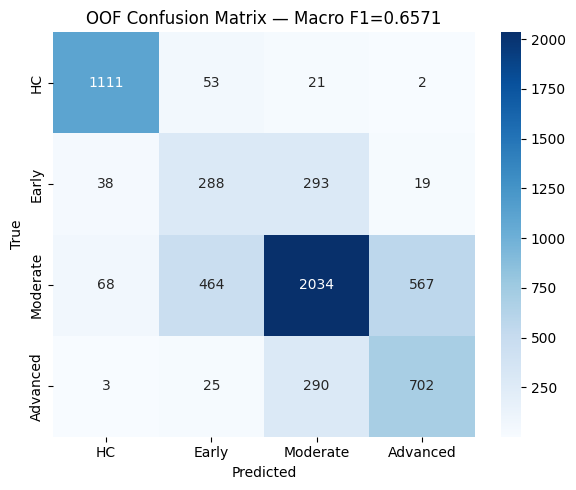

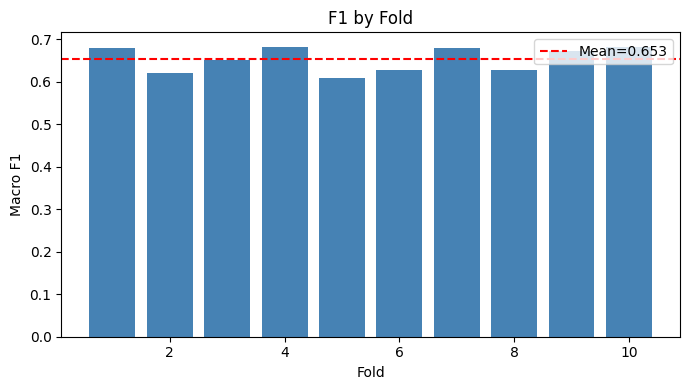

In [ ]:
# ================================================================
# FINAL SUMMARY
# ================================================================
f1s = [r['f1'] for r in fold_results]
oof_f1 = f1_score(y, oof_preds, average='macro', zero_division=0)

print(f"\n{'='*55}\nFINAL RESULTS\n{'='*55}")
print(f"Mean fold F1: {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")
print(f"OOF macro F1: {oof_f1:.4f}")
print(classification_report(y, oof_preds,
    target_names=list(labels_map.values()), zero_division=0))

# ── Aggregate OOF confusion matrix ────────────────────────────
cm_total = confusion_matrix(y, oof_preds, labels=[0,1,2,3])
fig, ax = plt.subplots(figsize=(6,5))
sns.heatmap(cm_total, annot=True, fmt='d', cmap='Blues',
           xticklabels=list(labels_map.values()),
           yticklabels=list(labels_map.values()), ax=ax)
ax.set_title(f'OOF Confusion Matrix — Macro F1={oof_f1:.4f}')
ax.set_xlabel('Predicted'); ax.set_ylabel('True')
plt.tight_layout()
# plt.savefig('/kaggle/working/oof_confusion_matrix.png', dpi=100)
plt.show()

# ── Per-fold F1 bar chart ─────────────────────────────────────
fig, ax = plt.subplots(figsize=(7,4))
ax.bar(range(1, N_FOLDS+1), f1s, color='steelblue')
ax.axhline(np.mean(f1s), color='red', linestyle='--',
          label=f'Mean={np.mean(f1s):.3f}')
ax.set_xlabel('Fold'); ax.set_ylabel('Macro F1')
ax.set_title('F1 by Fold'); ax.legend()
plt.tight_layout()
# plt.savefig('/kaggle/working/fold_f1_bars.png', dpi=100)
plt.show()

In [ ]:
def decode_with_thresholds(probs, thresholds):
    return (probs >= np.array(thresholds)).astype(int).sum(axis=1)

def tune_thresholds(oof_probs, y_true, n_classes=4):
    best_t = [0.5, 0.5, 0.5]
    best_f1 = f1_score(y_true, decode_with_thresholds(oof_probs, best_t),
                       average='macro')
    for _ in range(3):
        for k in range(n_classes - 1):
            for t in np.arange(0.30, 0.75, 0.025):
                trial = best_t.copy(); trial[k] = t
                f1 = f1_score(y_true, decode_with_thresholds(oof_probs, trial),
                             average='macro')
                if f1 > best_f1: best_f1, best_t = f1, trial
    return best_t, best_f1

best_t, tuned_f1 = tune_thresholds(oof_probs, y, NUM_CLASSES)
print(f"Tuned thresholds: {[round(t,3) for t in best_t]}  F1: {tuned_f1:.4f}")
print(classification_report(y, decode_with_thresholds(oof_probs, best_t),
    target_names=list(labels_map.values()), zero_division=0))

NameError: name 'oof_probs' is not defined

In [ ]:
# df_final['PATNO'].unique()

In [ ]:
len(p)

901

In [ ]:
df_final['EVENT_ID'].unique()

array(['BL', 'V04', 'V06', 'V08', 'V10', 'V12', 'V14', 'V15', 'V02',
       'V05', 'V11', 'V13', 'V16'], dtype=object)

In [ ]:
len(n)

41

In [ ]:
event_id_mapping = {
    "BL":  "Baseline (0 months)",
    "V02": "Month 6",
    "V04": "Month 12",
    "V05": "Month 18",
    "V06": "Month 24",
    "V08": "Month 36",
    "V10": "Month 48",
    "V11": "Month 54",
    "V12": "Month 60",
    "V13": "Month 72",
    "V14": "Month 84",
    "V15": "Month 96",
    "V16": "Month 108",
    # V01 (3 months), V03 (9), V07 (30), V09 (42) not in your list
}

In [ ]:
mri=pd.read_csv('/content/mri_metadata_19june.csv')

In [ ]:
mri.columns

Index(['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit', 'Modality',
       'Description', 'Type', 'Acq Date', 'Format', 'Downloaded'],
      dtype='object')

In [ ]:
#rename
mri = mri.rename(columns={'Subject': 'PATNO', 'Visit': 'EVENT_ID'})

In [ ]:
mri.columns

Index(['Image Data ID', 'PATNO', 'Group', 'Sex', 'Age', 'EVENT_ID', 'Modality',
       'Description', 'Type', 'Acq Date', 'Format', 'Downloaded', 'is_T1',
       'is_T2'],
      dtype='object')

MRI metadat

In [ ]:
import pandas as pd

# 1) Flag T1 and T2 rows
mri["is_T1"] = mri["Description"].str.contains("T1-anatomical", case=False, na=False)
mri["is_T2"] = mri["Description"].str.contains("T2 in T1-anatomical space", case=False, na=False)

# 2) For each PATNO+EVENT_ID, check if the group has T1 and T2
pair_flags = (
    mri.groupby(["PATNO", "EVENT_ID"], as_index=False)[["is_T1", "is_T2"]]
            .any()
)

# 3) Keep only (PATNO, EVENT_ID) with both
both_pairs = pair_flags[pair_flags["is_T1"] & pair_flags["is_T2"]][["PATNO", "EVENT_ID"]]

# 4) Filter original rows to those visits
mri_filtered_t1_t2 = mri.merge(both_pairs, on=["PATNO", "EVENT_ID"], how="inner")

print(f"Total rows after filtering for visits with both T1 and T2: {len(mri_filtered_t1_t2)}")
print(f"Unique subjects: {mri_filtered_t1_t2['PATNO'].nunique()}")
print(f"Unique visits (PATNO, EVENT_ID): {mri_filtered_t1_t2[['PATNO','EVENT_ID']].drop_duplicates().shape[0]}")
display(mri_filtered_t1_t2.head())

Total rows after filtering for visits with both T1 and T2: 1328
Unique subjects: 265
Unique visits (PATNO, EVENT_ID): 664


,Image Data ID,PATNO,Group,Sex,Age,EVENT_ID,Modality,Description,Type,Acq Date,Format,Downloaded,is_T1,is_T2
0,I330816,3160,Control,M,81,V04,MRI,T2 in T1-anatomical space,Pre-processed,3/21/2012,NiFTI,Yes,True,True
1,I330817,3160,Control,M,81,V04,MRI,T1-anatomical,Pre-processed,3/21/2012,NiFTI,Yes,True,False
2,I330826,3161,Control,M,45,BL,MRI,T2 in T1-anatomical space,Pre-processed,7/28/2011,NiFTI,Yes,True,True
3,I330827,3161,Control,M,45,BL,MRI,T1-anatomical,Pre-processed,7/28/2011,NiFTI,Yes,True,False
4,I330836,3165,Control,F,59,BL,MRI,T2 in T1-anatomical space,Pre-processed,6/16/2011,NiFTI,Yes,True,True


In [ ]:
rows_per_visit = mri_filtered_t1_t2.groupby(['PATNO','EVENT_ID']).size()
print("Rows per visit in MRI:")
print(rows_per_visit.value_counts())

Rows per visit in MRI:
2    664
Name: count, dtype: int64


In [ ]:
keys = ['PATNO', 'EVENT_ID']

# ── Separate T1 and T2 ────────────────────────────────────────
t1 = (mri_filtered_t1_t2[mri_filtered_t1_t2['is_T1'] & ~mri_filtered_t1_t2['is_T2']]
      .copy()
      .drop(columns=['is_T1','is_T2','Description'])
      .drop_duplicates(subset=keys)
      .rename(columns={
          'Image Data ID': 'Image_ID_T1',
          'Acq Date':      'Acq_Date_T1',
          'Group':         'MRI_Group',
          'Sex':           'MRI_Sex',
          'Age':           'MRI_Age',
          'Modality':      'Modality',
          'Type':          'MRI_Type',
          'Format':        'MRI_Format',
          'Downloaded':    'Downloaded',
      }))

t2 = (mri_filtered_t1_t2[mri_filtered_t1_t2['is_T2']]
      .copy()
      [keys + ['Image Data ID', 'Acq Date']]
      .drop_duplicates(subset=keys)
      .rename(columns={
          'Image Data ID': 'Image_ID_T2',
          'Acq Date':      'Acq_Date_T2',
      }))

# ── Merge T1 and T2 into one row per visit ────────────────────
mri_wide = t1.merge(t2, on=keys, how='inner')

print(f"mri_wide shape:   {mri_wide.shape}")
print(f"Unique patients:  {mri_wide['PATNO'].nunique()}")
print(f"Dupes:            {mri_wide.duplicated(subset=keys).sum()}")
print(f"\nColumns: {mri_wide.columns.tolist()}")

mri_wide shape:   (664, 13)
Unique patients:  265
Dupes:            0

Columns: ['Image_ID_T1', 'PATNO', 'MRI_Group', 'MRI_Sex', 'MRI_Age', 'EVENT_ID', 'Modality', 'MRI_Type', 'Acq_Date_T1', 'MRI_Format', 'Downloaded', 'Image_ID_T2', 'Acq_Date_T2']


In [ ]:
df_final.columns.tolist()

['PATNO',
 'ENROLL_AGE',
 'EVENT_ID',
 'NP3BRADY',
 'DVT_SDM',
 'SEX',
 'stage_merged',
 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_learning_slope',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_high_never_tested',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'tTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_attention',
 'MCA_abstraction',
 'MCA_orientation',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'rigidity_asymmetry']

In [ ]:
# Keep only relevant columns
mri_clean = mri_wide[['PATNO', 'EVENT_ID','MRI_Group','MRI_Sex',
                       'Image_ID_T1', 'Image_ID_T2',
                       'Acq_Date_T1', 'MRI_Age']].copy()

print(f"mri_clean shape: {mri_clean.shape}")
print(f"Columns: {mri_clean.columns.tolist()}")

# ── Inner join with clinical ───────────────────────────────────
keys = ['PATNO', 'EVENT_ID']

main_df = df_final.merge(mri_clean, on=keys, how='inner')

print(f"\nClinical rows:    {len(df_final)}")
print(f"After MRI join:   {len(main_df)}")
print(f"Unique patients:  {main_df['PATNO'].nunique()}")
print(f"Dupes:            {main_df.duplicated(subset=keys).sum()}")

print(f"\nCohort breakdown:")
print(main_df.groupby('stage_merged')['PATNO'].nunique())

mri_clean shape: (664, 8)
Columns: ['PATNO', 'EVENT_ID', 'MRI_Group', 'MRI_Sex', 'Image_ID_T1', 'Image_ID_T2', 'Acq_Date_T1', 'MRI_Age']

Clinical rows:    5978
After MRI join:   655
Unique patients:  263
Dupes:            0

Cohort breakdown:
stage_merged
0     75
1     61
2    161
3     45
Name: PATNO, dtype: int64


In [ ]:
#save
main_df.columns

Index(['PATNO', 'ENROLL_AGE', 'EVENT_ID', 'NP3BRADY', 'DVT_SDM', 'SEX',
       'stage_merged', 'ESS_total', 'ESS_high', 'DVT_TOTAL_RECALL',
       'DVT_DELAYED_RECALL', 'DVT_RETENTION', 'DVT_RECOG_DISC_INDEX',
       'HVLT_learning_slope', 'HVLT_false_pos', 'SCOPA_GI', 'SCOPA_urinary',
       'SCOPA_cardiovascular', 'SCOPA_thermoregulatory', 'SCOPA_pupillomotor',
       'SCOPA_total', 'DVT_SFTANIM', 'DVS_SFTANIM', 'ESS_high_never_tested',
       'GFAP', 'NFL', 'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio',
       'MCA_was_missing', 'SDM_was_missing', 'MCA_executive', 'MCA_attention',
       'MCA_abstraction', 'MCA_orientation', 'NP3_rigidity',
       'NP3_gait_postural', 'SDM_composite', 'rigidity_asymmetry', 'MRI_Group',
       'MRI_Sex', 'Image_ID_T1', 'Image_ID_T2', 'Acq_Date_T1', 'MRI_Age'],
      dtype='object')

In [ ]:
main_df.to_csv('mri_merged_df.csv', index=False)

NameError: name 'main_df' is not defined

noisy features

In [ ]:
from sklearn.feature_selection import VarianceThreshold

vt = VarianceThreshold(threshold=0.0)
vt.fit(X)

constant_features = X.columns[~vt.get_support()]
print("Constant features:", constant_features)

Constant features: Index([], dtype='object')


In [ ]:
from sklearn.feature_selection import mutual_info_classif

mi = mutual_info_classif(X, y, random_state=42)
mi_scores = pd.Series(mi, index=X.columns).sort_values(ascending=False)

print(mi_scores.head(20))
print(mi_scores.tail(20))

ENROLL_AGE              0.349653
NP3BRADY                0.318435
NP3_rigidity            0.311698
NP3_gait_postural       0.207388
SCOPA_GI                0.181076
SCOPA_total             0.172246
rigidity_asymmetry      0.145573
SDM_composite           0.125242
NFL                     0.123091
DVT_SDM                 0.122961
GFAP                    0.122769
tTau                    0.099278
pTau                    0.097219
pTau_tTau_ratio         0.090275
NfL_serum               0.087350
SCOPA_urinary           0.076472
SCOPA_cardiovascular    0.061387
SDM_was_missing         0.051083
ESS_total               0.043413
DVT_TOTAL_RECALL        0.039800
dtype: float64
SCOPA_urinary             0.076472
SCOPA_cardiovascular      0.061387
SDM_was_missing           0.051083
ESS_total                 0.043413
DVT_TOTAL_RECALL          0.039800
SCOPA_pupillomotor        0.039351
SCOPA_thermoregulatory    0.030120
ESS_high_never_tested     0.029738
MCA_was_missing           0.023785
DVT_SFTANI

permutation importance

SE+Focal Loss

In [ ]:
# ================================================================
# IMPORTS
# ================================================================
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report
import joblib


# ================================================================
# STEP 0: FEATURE DEFINITIONS
# ================================================================
# ⚠️ Replace this with your actual merged dataframe variable
df_source = df.copy()   # <-- CHANGE if your dataframe has a different name

binary_features = [
    'SEX', 'MCA_was_missing', 'SDM_was_missing', 'ethnicity_minority'
]

ordinal_features = [
    'NP3BRADY', 'MCA_executive', 'MCA_language', 'MCA_memory',
    'MCA_attention', 'MCA_abstraction', 'MCA_verbal_fluency',
    'MCA_orientation', 'NP3_rigidity', 'NP3_gait_postural',
    'rigidity_asymmetry'
]

numerical_features = ['ENROLL_AGE', 'DVT_SDM', 'SDM_composite']

# Ordinal categoricals get scaled together with numerical features
# (order is meaningful → keep as integer codes, just standardize scale)
continuous_features = ordinal_features + numerical_features

all_features = continuous_features + binary_features   # 18 total channels

target_col = 'stage_merged'
group_col  = 'PATNO'

# PATNO and EVENT_ID are explicitly excluded from the feature set
assert 'PATNO'    not in all_features, "PATNO leaked into features!"
assert 'EVENT_ID' not in all_features, "EVENT_ID leaked into features!"


# ================================================================
# STEP 1: BUILD df_eng — select only what's needed, validate
# ================================================================
required_cols = all_features + [target_col, group_col]
missing_cols = [c for c in required_cols if c not in df_source.columns]
if missing_cols:
    raise ValueError(f"Missing columns in df_source: {missing_cols}")

df = df_source[required_cols].copy()

# Drop rows with missing target — can't train on unlabeled rows
n_before = len(df)
df= df.dropna(subset=[target_col])
print(f"Dropped {n_before - len(df)} rows with missing '{target_col}'")


# Ensure target is integer-coded (0,1,2,3) not strings
df[target_col] = df[target_col].astype(int)

print(f"\nFinal df_eng shape: {df.shape}")
print(f"Unique PATNO:       {df[group_col].nunique()}")
print(f"Feature count:      {len(all_features)} "
      f"({len(continuous_features)} continuous + {len(binary_features)} binary)")



Dropped 0 rows with missing 'stage_merged'

Final df_eng shape: (5978, 20)
Unique PATNO:       901
Feature count:      18 (14 continuous + 4 binary)


In [ ]:
df['stage_merged'].value_counts()

,count
stage_merged,
2,3133
0,1187
3,1020
1,638


In [ ]:
#drop 2
# df = df[df['stage_merged'] != 2]

In [ ]:
df_clean.columns

Index(['PATNO', 'ENROLL_AGE', 'EVENT_ID', 'NP3BRADY', 'DVT_SDM', 'SEX',
       'stage_merged', 'MCA_was_missing', 'SDM_was_missing', 'MCA_executive',
       'MCA_language', 'MCA_memory', 'MCA_attention', 'MCA_abstraction',
       'MCA_verbal_fluency', 'MCA_orientation', 'ethnicity_minority',
       'NP3_rigidity', 'NP3_gait_postural', 'SDM_composite',
       'rigidity_asymmetry'],
      dtype='object')

In [ ]:
df.columns

Index(['PATNO', 'ENROLL_AGE', 'EVENT_ID', 'NP3RIGN', 'NP3RIGRU', 'NP3RIGLU',
       'NP3RIGRL', 'NP3RIGLL', 'NP3PSTBL', 'NP3BRADY', 'NP3GAIT', 'NP3FRZGT',
       'MCAALTTM', 'MCACUBE', 'MCACLCKN', 'MCACLCKH', 'MCALION', 'MCARHINO',
       'MCACAMEL', 'MCAFDS', 'MCABDS', 'MCASER7', 'MCASNTNC', 'MCAVFNUM',
       'MCAVF', 'MCAABSTR', 'MCAREC1', 'MCAREC2', 'MCAREC3', 'MCAREC4',
       'MCAREC5', 'MCADATE', 'MCACITY', 'SDMTOTAL', 'SDMTVRSN',
       'AGE_ASSESS_SDM', 'DVSD_SDM', 'DVT_SDM', 'AFICBERB', 'ASHKJEW',
       'BASQUE', 'SEX', 'HANDED', 'HISPLAT', 'RAASIAN', 'RABLACK', 'RAHAWOPI',
       'RAINDALS', 'RANOS', 'RAWHITE', 'RAUNKNOWN', 'stage_merged',
       'MCA_was_missing', 'SDM_was_missing'],
      dtype='object')

In [ ]:
# ================================================================
# IMPORTS
# ================================================================
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report
import joblib


# ================================================================
# STEP 0: FEATURE DEFINITIONS
# ================================================================
# ⚠️ Replace this with your actual merged dataframe variable
df_source = df_clean.copy()   # <-- CHANGE if your dataframe has a different name

binary_features = [
    'SEX', 'MCA_was_missing', 'SDM_was_missing', 'ethnicity_minority'
]

ordinal_features = [
    'NP3BRADY', 'MCA_executive', 'MCA_language', 'MCA_memory',
    'MCA_attention', 'MCA_abstraction', 'MCA_verbal_fluency',
    'MCA_orientation', 'NP3_rigidity', 'NP3_gait_postural',
    'rigidity_asymmetry'
]

numerical_features = ['ENROLL_AGE', 'DVT_SDM', 'SDM_composite']

# Ordinal categoricals get scaled together with numerical features
# (order is meaningful → keep as integer codes, just standardize scale)
continuous_features = ordinal_features + numerical_features

all_features = continuous_features + binary_features   # 18 total channels

target_col = 'stage_merged'
group_col  = 'PATNO'

# PATNO and EVENT_ID are explicitly excluded from the feature set
assert 'PATNO'    not in all_features, "PATNO leaked into features!"
assert 'EVENT_ID' not in all_features, "EVENT_ID leaked into features!"


# ================================================================
# STEP 1: BUILD df_eng — select only what's needed, validate
# ================================================================
required_cols = all_features + [target_col, group_col]
missing_cols = [c for c in required_cols if c not in df_source.columns]
if missing_cols:
    raise ValueError(f"Missing columns in df_source: {missing_cols}")

df = df_source[required_cols].copy()

# Drop rows with missing target — can't train on unlabeled rows
n_before = len(df)
df= df.dropna(subset=[target_col])
print(f"Dropped {n_before - len(df)} rows with missing '{target_col}'")


# Ensure target is integer-coded (0,1,2,3) not strings
df[target_col] = df[target_col].astype(int)

print(f"\nFinal df_eng shape: {df.shape}")
print(f"Unique PATNO:       {df[group_col].nunique()}")
print(f"Feature count:      {len(all_features)} "
      f"({len(continuous_features)} continuous + {len(binary_features)} binary)")


Dropped 0 rows with missing 'stage_merged'

Final df_eng shape: (5978, 20)
Unique PATNO:       901
Feature count:      18 (14 continuous + 4 binary)


ordinal method

In [ ]:
# ================================================================
# STEP 2: ORDINAL ENCODING / LOSS / DECODING (Frank & Hall)
# ================================================================
def encode_ordinal_targets(y_batch, num_classes=4):
    """
    y_batch: (B,) raw labels in {0,1,2,3}
    Returns: (B, num_classes-1) binary matrix
      col 0 = 1 if y >= 1
      col 1 = 1 if y >= 2
      col 2 = 1 if y >= 3
    """
    batch_size = y_batch.size(0)
    ordinal_targets = torch.zeros(
        batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        ordinal_targets[:, i - 1] = (y_batch >= i).float()
    return ordinal_targets


class OrdinalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu'):
        super().__init__()
        self.num_classes = num_classes
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()

        pos_weights = []
        for i in range(1, num_classes):
            pos_count = class_counts[i:].sum()
            neg_count = total - pos_count
            w = neg_count / max(pos_count, 1.0)
            pos_weights.append(w)

        self.pos_weight = torch.tensor(
            pos_weights, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets_encoded = encode_ordinal_targets(
            targets_raw, num_classes=self.num_classes)
        return F.binary_cross_entropy_with_logits(
            logits, targets_encoded,
            pos_weight=self.pos_weight, reduction='mean')


def decode_ordinal_predictions(logits, enforce_monotonic=True):
    probs = torch.sigmoid(logits)
    if enforce_monotonic:
        # Force P(y>=1) >= P(y>=2) >= P(y>=3)
        probs, _ = torch.cummin(probs, dim=1)
    preds_binary = (probs >= 0.50).int()
    return preds_binary.sum(dim=1)


# ================================================================
# STEP 3: MODEL — Excitation Network with ordinal head
# ================================================================
class ClinicalExcitationNetworkOrdinal(nn.Module):
    def __init__(self, input_dim, embedding_dim=64,
                 hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()
        self.num_classes = num_classes

        self.excitation = nn.Sequential(
            nn.Linear(input_dim, input_dim // 2),
            nn.ReLU(),
            nn.Linear(input_dim // 2, input_dim),
            nn.Sigmoid())

        self.embedding = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embedding_dim),
            nn.BatchNorm1d(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout))

        # num_classes - 1 outputs for cumulative thresholds
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(32, num_classes - 1))

    def forward(self, x):
        weights    = self.excitation(x)
        x_weighted = x * weights
        embedding  = self.embedding(x_weighted)
        logits     = self.classifier(embedding)
        return logits, embedding, weights


# ================================================================
# STEP 4: TRAIN / EVAL UTILITIES
# ================================================================
def train_one_epoch_ordinal(model, loader, optimizer,
                            criterion, device):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for X_batch, y_batch in loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)
        optimizer.zero_grad()
        logits, _, _ = model(X_batch)
        loss = criterion(logits, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(y_batch)
        preds = decode_ordinal_predictions(logits)
        correct += (preds == y_batch).sum().item()
        total += len(y_batch)
    return total_loss / total, correct / total


def evaluate_ordinal(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for X_batch, y_batch in loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            logits, _, _ = model(X_batch)
            loss = criterion(logits, y_batch)
            total_loss += loss.item() * len(y_batch)
            preds = decode_ordinal_predictions(logits)
            correct += (preds == y_batch).sum().item()
            total += len(y_batch)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())
    avg_loss = total_loss / total
    acc = correct / total
    f1 = f1_score(all_labels, all_preds,
                  average='macro', zero_division=0)
    return avg_loss, acc, f1, all_preds, all_labels


# ================================================================
# STEP 5: HYPERPARAMETERS
# ================================================================
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

X      = df[all_features].copy().astype(float)
y      = df[target_col].values
groups = df[group_col].values

cont_idx   = [all_features.index(c) for c in continuous_features]
binary_idx = [all_features.index(c) for c in binary_features]

INPUT_DIM     = len(all_features)
EMBEDDING_DIM = 64
HIDDEN_DIM    = 64
NUM_CLASSES   = 4
DROPOUT       = 0.3
WEIGHT_DECAY  = 1e-4     # lowered from 5e-3 — was too aggressive
LR            = 5e-4     # lowered from 1e-3
EPOCHS        = 200
BATCH_SIZE    = 128
PATIENCE      = 25
N_FOLDS       = 5        # use 5 first while iterating, switch to 10 later

labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

print(f"Input dim:   {INPUT_DIM}")
print(f"N_FOLDS:     {N_FOLDS}")
print(f"\ny distribution:")
for k, v in zip(*np.unique(y, return_counts=True)):
    print(f"  {k} ({labels_map[k]}): {v}")


# ================================================================
# STEP 6: CROSS-VALIDATION LOOP
# ================================================================
oof_embeddings = np.zeros((len(X), EMBEDDING_DIM))
sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True,
                            random_state=42)
fold_results = []

for fold, (train_idx, val_idx) in enumerate(
        sgkf.split(X, y, groups=groups)):

    print(f"\n{'='*55}")
    print(f"FOLD {fold+1}/{N_FOLDS}")
    print(f"{'='*55}")

    X_train_np = X.iloc[train_idx].values.copy()
    X_val_np   = X.iloc[val_idx].values.copy()
    y_train_np = y[train_idx]
    y_val_np   = y[val_idx]

    # Scale continuous — fit on train only
    scaler = StandardScaler()
    X_train_np[:, cont_idx] = scaler.fit_transform(
        X_train_np[:, cont_idx])
    X_val_np[:, cont_idx] = scaler.transform(
        X_val_np[:, cont_idx])

    # No resampling — ordinal pos_weight handles imbalance
    class_counts = np.bincount(y_train_np, minlength=NUM_CLASSES)
    print(f"  Train counts: {dict(enumerate(class_counts))}")

    criterion = OrdinalLoss(
        class_counts=class_counts,
        num_classes=NUM_CLASSES, device=device)
    print(f"  pos_weight (>=1,>=2,>=3): "
          f"{criterion.pos_weight.cpu().numpy().round(3)}")

    X_tr = torch.tensor(X_train_np, dtype=torch.float32)
    y_tr = torch.tensor(y_train_np, dtype=torch.long)
    X_vl = torch.tensor(X_val_np,   dtype=torch.float32)
    y_vl = torch.tensor(y_val_np,   dtype=torch.long)

    train_loader = DataLoader(
        TensorDataset(X_tr, y_tr),
        batch_size=BATCH_SIZE, shuffle=True)
    val_loader = DataLoader(
        TensorDataset(X_vl, y_vl),
        batch_size=BATCH_SIZE, shuffle=False)

    model = ClinicalExcitationNetworkOrdinal(
        input_dim=INPUT_DIM, embedding_dim=EMBEDDING_DIM,
        hidden_dim=HIDDEN_DIM, num_classes=NUM_CLASSES,
        dropout=DROPOUT).to(device)

    optimizer = optim.Adam(model.parameters(),
                           lr=LR, weight_decay=WEIGHT_DECAY)
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=10, factor=0.5)

    best_val_f1, best_epoch, patience_cnt = 0.0, 0, 0
    best_state, history = None, []

    for epoch in range(EPOCHS):
        tr_loss, tr_acc = train_one_epoch_ordinal(
            model, train_loader, optimizer, criterion, device)
        vl_loss, vl_acc, vl_f1, _, _ = evaluate_ordinal(
            model, val_loader, criterion, device)

        scheduler.step(vl_f1)
        history.append({'epoch': epoch+1, 'tr_loss': tr_loss,
                        'tr_acc': tr_acc, 'vl_loss': vl_loss,
                        'vl_acc': vl_acc, 'vl_f1': vl_f1})

        if vl_f1 > best_val_f1:
            best_val_f1, best_epoch, patience_cnt = vl_f1, epoch+1, 0
            best_state = {k: v.clone()
                          for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if patience_cnt >= PATIENCE:
            print(f"  Early stop ep={epoch+1} best={best_epoch}")
            break

        if (epoch + 1) % 10 == 0:
            print(f"  Ep {epoch+1:3d} | "
                  f"tr={tr_loss:.4f}/{tr_acc:.3f} | "
                  f"vl={vl_loss:.4f}/{vl_acc:.3f} f1={vl_f1:.3f}")

    model.load_state_dict(best_state)
    _, val_acc, val_f1, preds, labels_true = evaluate_ordinal(
        model, val_loader, criterion, device)

    model.eval()
    with torch.no_grad():
        _, fold_embs, _ = model(X_vl.to(device))
        oof_embeddings[val_idx] = fold_embs.cpu().numpy()

    print(f"\n  Best epoch: {best_epoch}  Val F1: {val_f1:.4f}  "
          f"Val Acc: {val_acc:.4f}")
    print(classification_report(
        labels_true, preds,
        target_names=list(labels_map.values()),
        zero_division=0))

    # ── Adjacent vs non-adjacent error breakdown ────────────
    cm = confusion_matrix(labels_true, preds, labels=[0,1,2,3])
    adj, nonadj = 0, 0
    for i in range(4):
        for j in range(4):
            if i != j:
                if abs(i-j) == 1: adj += cm[i,j]
                else: nonadj += cm[i,j]
    print(f"  Confusion matrix:\n{cm}")
    print(f"  Adjacent errors: {adj}  Non-adjacent errors: {nonadj}")

    fold_results.append({
        'fold': fold+1, 'val_acc': val_acc, 'val_f1': val_f1,
        'best_epoch': best_epoch, 'preds': preds,
        'labels': labels_true, 'history': history,
        'scaler': scaler, 'best_state': best_state,
        'confusion_matrix': cm, 'adjacent_errors': adj,
        'nonadjacent_errors': nonadj,
    })


# ================================================================
# STEP 7: SUMMARY
# ================================================================
print(f"\n{'='*55}")
print(f"{N_FOLDS}-FOLD CV SUMMARY (Ordinal Frank & Hall)")
print(f"{'='*55}")

accs = [r['val_acc'] for r in fold_results]
f1s  = [r['val_f1']  for r in fold_results]
adjs = [r['adjacent_errors'] for r in fold_results]
nadjs= [r['nonadjacent_errors'] for r in fold_results]

for r in fold_results:
    print(f"  Fold {r['fold']}: Acc={r['val_acc']:.4f}  "
          f"F1={r['val_f1']:.4f}  "
          f"adj_err={r['adjacent_errors']}  "
          f"nonadj_err={r['nonadjacent_errors']}")

print(f"\n  Mean Acc: {np.mean(accs):.4f} ± {np.std(accs):.4f}")
print(f"  Mean F1:  {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")
print(f"  Total adjacent errors:     {sum(adjs)}")
print(f"  Total non-adjacent errors: {sum(nadjs)}")


# ================================================================
# STEP 8: SAVE BEST FOLD
# ================================================================
best_fold_idx = int(np.argmax(f1s))
best_fold     = fold_results[best_fold_idx]

print(f"\nBest fold: {best_fold['fold']} (F1={best_fold['val_f1']:.4f})")

final_counts = np.bincount(y, minlength=NUM_CLASSES)

torch.save({
    'model_state':         best_fold['best_state'],
    'input_dim':           INPUT_DIM,
    'embedding_dim':       EMBEDDING_DIM,
    'hidden_dim':          HIDDEN_DIM,
    'num_classes':         NUM_CLASSES,
    'dropout':             DROPOUT,
    'continuous_features': continuous_features,
    'binary_features':     binary_features,
    'all_features':        all_features,
    'labels_map':          labels_map,
    'cont_idx':            cont_idx,
    'cv_mean_f1':          float(np.mean(f1s)),
    'cv_std_f1':           float(np.std(f1s)),
    'best_fold':           best_fold['fold'],
    'model_type':          'ordinal_frank_hall',
}, 'clinical_ordinal_model.pt')

joblib.dump(best_fold['scaler'], 'clinical_ordinal_scaler.pkl')
print("\n✅ Model saved: clinical_ordinal_model.pt")
print("✅ Scaler saved: clinical_ordinal_scaler.pkl")
print(f"✅ OOF shape: {oof_embeddings.shape}")
print(f"   Zeros left: "
      f"{(oof_embeddings.sum(axis=1)==0).sum()} ← must be 0")

Device: cuda
Input dim:   18
N_FOLDS:     5

y distribution:
  0 (HC): 1187
  1 (Early): 638
  2 (Moderate): 3133
  3 (Advanced): 1020

FOLD 1/5
  Train counts: {0: np.int64(934), 1: np.int64(468), 2: np.int64(2532), 3: np.int64(881)}
  pos_weight (>=1,>=2,>=3): [0.241 0.411 4.465]
  Ep  10 | tr=0.3711/0.594 | vl=0.3424/0.562 f1=0.513
  Ep  20 | tr=0.3520/0.604 | vl=0.3378/0.570 f1=0.515
  Ep  30 | tr=0.3463/0.607 | vl=0.3329/0.587 f1=0.535
  Ep  40 | tr=0.3407/0.608 | vl=0.3344/0.574 f1=0.520
  Ep  50 | tr=0.3378/0.608 | vl=0.3387/0.564 f1=0.511
  Early stop ep=55 best=30

  Best epoch: 30  Val F1: 0.5354  Val Acc: 0.5873
              precision    recall  f1-score   support

          HC       0.84      0.98      0.90       253
       Early       0.39      0.18      0.24       170
    Moderate       0.70      0.51      0.59       601
    Advanced       0.28      0.73      0.41       139

    accuracy                           0.59      1163
   macro avg       0.55      0.60      0.54

In [ ]:
df_clean['stage_merged'].value_counts()

,count
stage_merged,
2,3133
0,1187
3,1020
1,638


In [ ]:
modal['stage_merged'].value_counts()

,count
stage_merged,
2,712
0,268
1,176
3,154


Corrected

In [ ]:
# ================================================================
# IMPORTS
# ================================================================
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report
from imblearn.combine import SMOTEENN
import joblib


# ================================================================
# FEATURE DEFINITIONS
# ================================================================
binary_features = [
    'SEX',
    'MCA_was_missing',
    'SDM_was_missing',
    'ethnicity_minority'
]

ordinal_features = [
    'NP3BRADY',
    'MCA_executive',
    'MCA_language',
    'MCA_memory',
    'MCA_attention',
    'MCA_abstraction',
    'MCA_verbal_fluency',
    'MCA_orientation',
    'NP3_rigidity',
    'NP3_gait_postural',
    'rigidity_asymmetry'
]

numerical_features = [
    'ENROLL_AGE',
    'DVT_SDM',
    'SDM_composite'
]

continuous_features = ordinal_features + numerical_features
all_features        = continuous_features + binary_features

target_col = 'stage_merged'
group_col  = 'PATNO'

assert 'PATNO'    not in all_features, "PATNO leaked!"
assert 'EVENT_ID' not in all_features, "EVENT_ID leaked!"

# ── Index positions (computed once) ───────────────────────
cont_idx   = [all_features.index(c)
              for c in continuous_features]
binary_idx = [all_features.index(c)
              for c in binary_features]

# ── Ordinal valid ranges (defined ONCE before loop) ───────
ordinal_ranges = {
    'NP3BRADY':           (0, 4),
    'MCA_executive':      (0, 5),
    'MCA_language':       (0, 5),
    'MCA_memory':         (0, 5),
    'MCA_attention':      (0, 6),
    'MCA_abstraction':    (0, 2),
    'MCA_verbal_fluency': (0, 5),
    'MCA_orientation':    (0, 6),
    'NP3_rigidity':       (0, 20),
    'NP3_gait_postural':  (0, 12),
    'rigidity_asymmetry': (0, 20),
}

print(f"Total features:  {len(all_features)}")
print(f"  Continuous:    {len(continuous_features)}")
print(f"  Binary:        {len(binary_features)}")
print(f"Binary idx:      {binary_idx}")
print(f"Cont idx:        {cont_idx}")


# ================================================================
# BUILD X, y
# ================================================================
required_cols = all_features + [target_col, group_col]
missing_cols  = [c for c in required_cols
                 if c not in df.columns]
if missing_cols:
    raise ValueError(f"Missing columns: {missing_cols}")

df_model = df[required_cols].copy()
df_model = df_model.dropna(subset=[target_col])
df_model[target_col] = df_model[target_col].astype(int)

X      = df_model[all_features].copy().astype(float)
y      = df_model[target_col].values
groups = df_model[group_col].values

print(f"\nShape: {df_model.shape}")
print(f"Unique PATNO: {df_model[group_col].nunique()}")


# ================================================================
# FOCAL LOSS
# ================================================================
class FocalLoss(nn.Module):
    def __init__(self, weight=None, gamma=2.0,
                 label_smoothing=0.05,
                 reduction='mean'):
        super().__init__()
        self.weight          = weight
        self.gamma           = gamma
        self.label_smoothing = label_smoothing
        self.reduction       = reduction

    def forward(self, logits, targets):
        ce = F.cross_entropy(
            logits, targets,
            weight          = self.weight,
            label_smoothing = self.label_smoothing,
            reduction       = 'none')
        pt           = torch.exp(-ce)
        focal_weight = (1.0 - pt) ** self.gamma
        loss         = focal_weight * ce
        return loss.mean() if self.reduction == 'mean' \
               else loss.sum()


# ================================================================
# MODEL
# ================================================================
class ClinicalExcitationNetwork(nn.Module):
    def __init__(self, input_dim, embedding_dim=64,
                 hidden_dim=64, num_classes=4,
                 dropout=0.3):
        super().__init__()
        self.excitation = nn.Sequential(
            nn.Linear(input_dim, input_dim // 2),
            nn.ReLU(),
            nn.Linear(input_dim // 2, input_dim),
            nn.Sigmoid()
        )
        self.embedding = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.BatchNorm1d(hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embedding_dim),
            nn.BatchNorm1d(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
        )
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(32, num_classes)
        )

    def forward(self, x):
        weights    = self.excitation(x)
        x_weighted = x * weights
        embedding  = self.embedding(x_weighted)
        logits     = self.classifier(embedding)
        return logits, embedding, weights


# ================================================================
# TRAINING UTILITIES
# ================================================================
def train_one_epoch(model, loader, optimizer,
                    criterion, device):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for X_batch, y_batch in loader:
        X_batch = X_batch.to(device)
        y_batch = y_batch.to(device)
        optimizer.zero_grad()
        logits, _, _ = model(X_batch)
        loss = criterion(logits, y_batch)
        loss.backward()
        optimizer.step()
        total_loss += loss.item() * len(y_batch)
        preds       = logits.argmax(dim=1)
        correct    += (preds == y_batch).sum().item()
        total      += len(y_batch)
    return total_loss / total, correct / total


def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_preds, all_labels = [], []
    with torch.no_grad():
        for X_batch, y_batch in loader:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)
            logits, _, _ = model(X_batch)
            loss = criterion(logits, y_batch)
            total_loss += loss.item() * len(y_batch)
            preds       = logits.argmax(dim=1)
            correct    += (preds == y_batch).sum().item()
            total      += len(y_batch)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(y_batch.cpu().numpy())
    avg_loss = total_loss / total
    acc      = correct / total
    f1       = f1_score(all_labels, all_preds,
                        average='macro',
                        zero_division=0)
    return avg_loss, acc, f1, all_preds, all_labels


# ================================================================
# HYPERPARAMETERS
# ================================================================
device = torch.device(
    'cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

INPUT_DIM     = len(all_features)
EMBEDDING_DIM = 64
HIDDEN_DIM    = 64
NUM_CLASSES   = 4
DROPOUT       = 0.3
WEIGHT_DECAY  = 5e-3
LR            = 1e-3
EPOCHS        = 200
BATCH_SIZE    = 128
PATIENCE      = 25
N_FOLDS       = 10

FOCAL_GAMMA     = 1.5
LABEL_SMOOTHING = 0.05

labels_map = {
    0: 'HC',
    1: 'Early',
    2: 'Moderate',
    3: 'Advanced'
}

print(f"Input dim:    {INPUT_DIM}")
print(f"NUM_CLASSES:  {NUM_CLASSES}")
print(f"N_FOLDS:      {N_FOLDS}")
print(f"Focal gamma:  {FOCAL_GAMMA}")

print(f"\ny distribution:")
for k, v in zip(*np.unique(y, return_counts=True)):
    print(f"  {k} ({labels_map[k]}): {v}")


# ================================================================
# CROSS-VALIDATION LOOP
# ================================================================
oof_embeddings = np.zeros((len(X), EMBEDDING_DIM))
sgkf           = StratifiedGroupKFold(
    n_splits   = N_FOLDS,
    shuffle    = True,
    random_state = 42)
fold_results   = []

for fold, (train_idx, val_idx) in enumerate(
        sgkf.split(X, y, groups=groups)):

    print(f"\n{'='*55}")
    print(f"FOLD {fold+1}/{N_FOLDS}")
    print(f"{'='*55}")

    # ── 1. Split ──────────────────────────────────────────
    X_train_np = X.iloc[train_idx].values.copy()
    X_val_np   = X.iloc[val_idx].values.copy()
    y_train_np = y[train_idx]
    y_val_np   = y[val_idx]

    print(f"  Before SMOTEENN:")
    for cls, n in zip(*np.unique(
            y_train_np, return_counts=True)):
        print(f"    {labels_map[cls]:<12}: {n}")

    # ── 2. Scale (fit on train only) ──────────────────────
    scaler = StandardScaler()
    X_train_np[:, cont_idx] = scaler.fit_transform(
        X_train_np[:, cont_idx])
    X_val_np[:, cont_idx]   = scaler.transform(
        X_val_np[:, cont_idx])

    # ── 3. SMOTEENN ───────────────────────────────────────
    sme = SMOTEENN(
        sampling_strategy = 'not majority',
        random_state      = 42,
        n_jobs            = -1)
    X_train_np, y_train_np = sme.fit_resample(
        X_train_np, y_train_np)

    # ── 4. Round binary back to 0/1 ───────────────────────
    for bidx in binary_idx:
        X_train_np[:, bidx] = np.round(
            X_train_np[:, bidx]).clip(0, 1)

    # ── 5. Round ordinal to valid integer range ───────────
    for col, (lo, hi) in ordinal_ranges.items():
        cidx = all_features.index(col)
        X_train_np[:, cidx] = np.round(
            X_train_np[:, cidx]).clip(lo, hi)

    # ── 6. Verify post-SMOTEENN ───────────────────────────
    print(f"\n  After SMOTEENN:")
    for cls, n in zip(*np.unique(
            y_train_np, return_counts=True)):
        print(f"    {labels_map[cls]:<12}: {n}")

    # Quick binary sanity check
    for col, bidx in zip(binary_features, binary_idx):
        unique_vals = np.unique(X_train_np[:, bidx])
        ok = "✅" if set(unique_vals) <= {0.0, 1.0} \
             else "❌"
        print(f"    {ok} {col}: {unique_vals}")

    # ── 7. Class weights ──────────────────────────────────
    class_counts = np.bincount(y_train_np)
    smoothed_cw  = 1.0 / np.sqrt(class_counts)
    smoothed_cw  = smoothed_cw / np.min(smoothed_cw)
    cw_tensor    = torch.tensor(
        smoothed_cw, dtype=torch.float32).to(device)

    print(f"\n  Class weights (after SMOTEENN):")
    for i, (w, n) in enumerate(
            zip(smoothed_cw, class_counts)):
        print(f"    {labels_map[i]:<10} "
              f"n={n:4d}  w={w:.3f}")

    # ── 8. Focal loss criterion ───────────────────────────
    criterion = FocalLoss(
        weight          = cw_tensor,
        gamma           = FOCAL_GAMMA,
        label_smoothing = LABEL_SMOOTHING)

    # ── 9. Tensors + DataLoaders ──────────────────────────
    X_tr = torch.tensor(X_train_np, dtype=torch.float32)
    y_tr = torch.tensor(y_train_np, dtype=torch.long)
    X_vl = torch.tensor(X_val_np,   dtype=torch.float32)
    y_vl = torch.tensor(y_val_np,   dtype=torch.long)

    train_loader = DataLoader(
        TensorDataset(X_tr, y_tr),
        batch_size = BATCH_SIZE,
        shuffle    = True,
        drop_last  = False)

    val_loader = DataLoader(
        TensorDataset(X_vl, y_vl),
        batch_size = BATCH_SIZE,
        shuffle    = False)

    # ── 10. Model ─────────────────────────────────────────
    model = ClinicalExcitationNetwork(
        input_dim     = INPUT_DIM,
        embedding_dim = EMBEDDING_DIM,
        hidden_dim    = HIDDEN_DIM,
        num_classes   = NUM_CLASSES,
        dropout       = DROPOUT,
    ).to(device)

    # ── 11. Optimizer + Scheduler ─────────────────────────
    optimizer = optim.Adam(
        model.parameters(),
        lr           = LR,
        weight_decay = WEIGHT_DECAY)

    scheduler = optim.lr_scheduler.ReduceLROnPlateau(
        optimizer,
        mode     = 'max',
        patience = 10,
        factor   = 0.5)

    # ── 12. Training loop ─────────────────────────────────
    best_val_f1  = 0.0
    best_epoch   = 0
    patience_cnt = 0
    best_state   = None
    history      = []

    for epoch in range(EPOCHS):
        tr_loss, tr_acc = train_one_epoch(
            model, train_loader,
            optimizer, criterion, device)
        vl_loss, vl_acc, vl_f1, _, _ = evaluate(
            model, val_loader, criterion, device)

        scheduler.step(vl_f1)
        history.append({
            'epoch':   epoch + 1,
            'tr_loss': tr_loss, 'tr_acc': tr_acc,
            'vl_loss': vl_loss, 'vl_acc': vl_acc,
            'vl_f1':   vl_f1,
        })

        if vl_f1 > best_val_f1:
            best_val_f1  = vl_f1
            best_epoch   = epoch + 1
            patience_cnt = 0
            best_state   = {
                k: v.clone()
                for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if patience_cnt >= PATIENCE:
            print(f"  Early stop ep={epoch+1} "
                  f"best={best_epoch}")
            break

        if (epoch + 1) % 10 == 0:
            print(f"  Ep {epoch+1:3d} | "
                  f"tr={tr_loss:.4f}/{tr_acc:.3f} | "
                  f"vl={vl_loss:.4f}/{vl_acc:.3f} "
                  f"f1={vl_f1:.3f}")

    # ── 13. Load best + evaluate ──────────────────────────
    model.load_state_dict(best_state)
    _, val_acc, val_f1, preds, labels_true = evaluate(
        model, val_loader, criterion, device)

    # ── 14. OOF embeddings ────────────────────────────────
    model.eval()
    with torch.no_grad():
        _, fold_embs, _ = model(X_vl.to(device))
        oof_embeddings[val_idx] = \
            fold_embs.cpu().numpy()

    # ── 15. Print results ─────────────────────────────────
    print(f"\n  Best epoch:   {best_epoch}")
    print(f"  Val Acc:      {val_acc:.4f}")
    print(f"  Val F1 macro: {val_f1:.4f}")
    print(f"\n  Classification Report:")
    print(classification_report(
        labels_true, preds,
        target_names = list(labels_map.values()),
        zero_division = 0))

    print(f"  Val class distribution:")
    for k, v in zip(*np.unique(
            y_val_np, return_counts=True)):
        print(f"    {labels_map[k]:<10}: {v}")

    # ── 16. Store fold results ────────────────────────────
    fold_results.append({
        'fold':        fold + 1,
        'val_acc':     val_acc,
        'val_f1':      val_f1,
        'best_epoch':  best_epoch,
        'preds':       preds,
        'labels':      labels_true,
        'history':     history,
        'scaler':      scaler,
        'best_state':  best_state,
        'smoothed_cw': smoothed_cw,
    })


# ================================================================
# SUMMARY
# ================================================================
print(f"\n{'='*55}")
print(f"{N_FOLDS}-FOLD CROSS-VALIDATION SUMMARY")
print(f"{'='*55}")

accs = [r['val_acc']    for r in fold_results]
f1s  = [r['val_f1']     for r in fold_results]
eps  = [r['best_epoch'] for r in fold_results]

for r in fold_results:
    print(f"  Fold {r['fold']}: "
          f"Acc={r['val_acc']:.4f}  "
          f"F1={r['val_f1']:.4f}  "
          f"Best_ep={r['best_epoch']}")

print(f"\n  Mean Acc: {np.mean(accs):.4f} "
      f"± {np.std(accs):.4f}")
print(f"  Mean F1:  {np.mean(f1s):.4f} "
      f"± {np.std(f1s):.4f}")
print(f"  Avg best epoch: {int(np.mean(eps))}")


# ================================================================
# SAVE BEST FOLD
# ================================================================
best_fold_idx = int(np.argmax(f1s))
best_fold     = fold_results[best_fold_idx]
best_state    = best_fold['best_state']
best_scaler   = best_fold['scaler']

print(f"\nBest fold: {best_fold['fold']} "
      f"(F1={best_fold['val_f1']:.4f})")

final_counts = np.bincount(y)
final_cw     = 1.0 / np.sqrt(final_counts)
final_cw     = final_cw / np.min(final_cw)

print(f"\nFull dataset class weights:")
for i, (w, n) in enumerate(
        zip(final_cw, final_counts)):
    print(f"  {labels_map[i]:<10} "
          f"n={n:4d}  weight={w:.3f}")

avg_best_epoch = int(np.mean(eps))

torch.save({
    'model_state':         best_state,
    'input_dim':           INPUT_DIM,
    'embedding_dim':       EMBEDDING_DIM,
    'hidden_dim':          HIDDEN_DIM,
    'num_classes':         NUM_CLASSES,
    'dropout':             DROPOUT,
    'continuous_features': continuous_features,
    'binary_features':     binary_features,
    'all_features':        all_features,
    'labels_map':          labels_map,
    'class_weights':       final_cw.tolist(),
    'cont_idx':            cont_idx,
    'focal_gamma':         FOCAL_GAMMA,
    'label_smoothing':     LABEL_SMOOTHING,
    'cv_mean_f1':          float(np.mean(f1s)),
    'cv_std_f1':           float(np.std(f1s)),
    'best_fold':           best_fold['fold'],
    'avg_best_epoch':      avg_best_epoch,
}, 'clinical_excitation_model.pt')

joblib.dump(best_scaler, 'clinical_scaler.pkl')

print("\n✅ Model saved: clinical_excitation_model.pt")
print("✅ Scaler saved: clinical_scaler.pkl")
print(f"✅ OOF shape:   {oof_embeddings.shape}")
print(f"   Zeros left:  "
      f"{(oof_embeddings.sum(axis=1)==0).sum()}"
      f" ← must be 0")

Total features:  18
  Continuous:    14
  Binary:        4
Binary idx:      [14, 15, 16, 17]
Cont idx:        [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13]

Shape: (5978, 20)
Unique PATNO: 901
Device: cuda
Input dim:    18
NUM_CLASSES:  4
N_FOLDS:      10
Focal gamma:  1.5

y distribution:
  0 (HC): 1187
  1 (Early): 638
  2 (Moderate): 3133
  3 (Advanced): 1020

FOLD 1/10
  Before SMOTEENN:
    HC          : 1088
    Early       : 578
    Moderate    : 2810
    Advanced    : 928

  After SMOTEENN:
    HC          : 2665
    Early       : 2539
    Moderate    : 646
    Advanced    : 2242
    ✅ SEX: [0. 1.]
    ✅ MCA_was_missing: [0. 1.]
    ✅ SDM_was_missing: [0. 1.]
    ✅ ethnicity_minority: [0. 1.]

  Class weights (after SMOTEENN):
    HC         n=2665  w=1.000
    Early      n=2539  w=1.025
    Moderate   n= 646  w=2.031
    Advanced   n=2242  w=1.090
  Ep  10 | tr=0.5746/0.717 | vl=2.2411/0.411 f1=0.412
  Ep  20 | tr=0.5430/0.733 | vl=2.4228/0.415 f1=0.410
  Early stop ep=30 bes

In [ ]:
from sklearn.metrics import confusion_matrix
import numpy as np

cm = confusion_matrix(labels_true, preds)
print("Confusion matrix:")
print(cm)

# Check if errors are mostly ADJACENT (good sign,
# means model understands severity ordering)
# vs scattered/non-adjacent (bad sign, model is
# just confused/noisy)
labels_order = [0,1,2,3]  # HC,Early,Moderate,Advanced
adjacent_errors = 0
nonadjacent_errors = 0
for i in range(4):
    for j in range(4):
        if i != j:
            if abs(i-j) == 1:
                adjacent_errors += cm[i,j]
            else:
                nonadjacent_errors += cm[i,j]
print(f"Adjacent-class errors:     {adjacent_errors}")
print(f"Non-adjacent-class errors: {nonadjacent_errors}")

Confusion matrix:
[[186   0   0   0]
 [ 21  23   8   1]
 [ 57  71  53  60]
 [  8   3   6  55]]
Adjacent-class errors:     166
Non-adjacent-class errors: 69


In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedGroupKFold

sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True,
                            random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
f1s = []

for tr_idx, vl_idx in sgkf.split(X, y, groups):
    X_tr, X_vl = X.iloc[tr_idx], X.iloc[vl_idx]
    y_tr, y_vl = y[tr_idx], y[vl_idx]

    counts = np.bincount(y_tr)
    sw = np.array([1.0/np.sqrt(counts[l]) for l in y_tr])

    clf = XGBClassifier(
        n_estimators=400, max_depth=4,
        learning_rate=0.05, subsample=0.8,
        colsample_bytree=0.7, min_child_weight=5,
        eval_metric='mlogloss', random_state=42, n_jobs=-1)
    clf.fit(X_tr, y_tr, sample_weight=sw)

    preds = clf.predict(X_vl)
    oof_preds[vl_idx] = preds
    f1s.append(f1_score(y_vl, preds, average='macro',
                        zero_division=0))

print(f"XGBoost mean F1: {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")

XGBoost mean F1: 0.5830 ± 0.0159


merged part multimodal

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
old_mri=pd.read_csv('/content/1324image_3_14_2026.csv')

In [ ]:
new_mri=pd.read_csv('/content/20june_6_19_2026.csv')

In [ ]:
new_mri = new_mri.rename(columns={'Subject' : 'PATNO', 'Visit' : 'EVENT_ID'})

In [ ]:
print(old_mri.shape)
print(new_mri.shape)

(1324, 12)
(1324, 12)


In [ ]:
new_mri.columns

Index(['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit', 'Modality',
       'Description', 'Type', 'Acq Date', 'Format', 'Downloaded'],
      dtype='object')

In [ ]:
old_mri.equals(new_mri)

False

In [ ]:
diff_rows = pd.concat([old_mri, new_mri]).drop_duplicates(keep=False)
print(diff_rows)

     Image Data ID  Subject    Group Sex  Age Visit Modality  \
1291       I994202    40533       PD   M   60    BL      MRI   
1302       I994319    40533       PD   M   60    BL      MRI   
550        I331413     3555  Control   M   40    BL      MRI   
551        I331414     3555  Control   M   40    BL      MRI   

                    Description           Type   Acq Date Format Downloaded  
1291  T2 in T1-anatomical space  Pre-processed  6/21/2017  NiFTI        Yes  
1302              T1-anatomical  Pre-processed  6/21/2017  NiFTI        Yes  
550   T2 in T1-anatomical space  Pre-processed  4/27/2011  NiFTI        Yes  
551               T1-anatomical  Pre-processed  4/27/2011  NiFTI        Yes  


In [ ]:
# how many diff rows and new rows present in new_mri


In [ ]:
merged_df = new_mri.merge(old_mri, on=list(old_mri.columns), how='outer', indicator=True)
rows_only_in_new_mri = merged_df[merged_df['_merge'] == 'left_only']
diff_rows = merged_df[merged_df['_merge'] != 'both']

print(f"Number of rows present only in new_mri: {len(rows_only_in_new_mri)}")
print(f"Number of rows that differ between old_mri and new_mri: {len(diff_rows)}")

Number of rows present only in new_mri: 2
Number of rows that differ between old_mri and new_mri: 4


In [ ]:
rows_only_in_new_mri
# diff_rows.to_csv('diff_rows.csv', index=False)

,Image Data ID,Subject,Group,Sex,Age,Visit,Modality,Description,Type,Acq Date,Format,Downloaded,_merge
150,I331413,3555,Control,M,40,BL,MRI,T2 in T1-anatomical space,Pre-processed,4/27/2011,NiFTI,Yes,left_only
151,I331414,3555,Control,M,40,BL,MRI,T1-anatomical,Pre-processed,4/27/2011,NiFTI,Yes,left_only


MERGED part

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
modal_df=pd.read_csv('/content/mri_merged_df.csv')

In [ ]:
len(modal_df.columns)

46

In [ ]:
modal_df.columns.to_list()

['PATNO',
 'ENROLL_AGE',
 'EVENT_ID',
 'NP3BRADY',
 'DVT_SDM',
 'SEX',
 'stage_merged',
 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_learning_slope',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'ESS_high_never_tested',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'tTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_attention',
 'MCA_abstraction',
 'MCA_orientation',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'rigidity_asymmetry',
 'MRI_Group',
 'MRI_Sex',
 'Image_ID_T1',
 'Image_ID_T2',
 'Acq_Date_T1',
 'MRI_Age']

In [ ]:
!pip install shap

In [ ]:
df=modal_df.copy()

--- Feature Importance Summary Plot ---


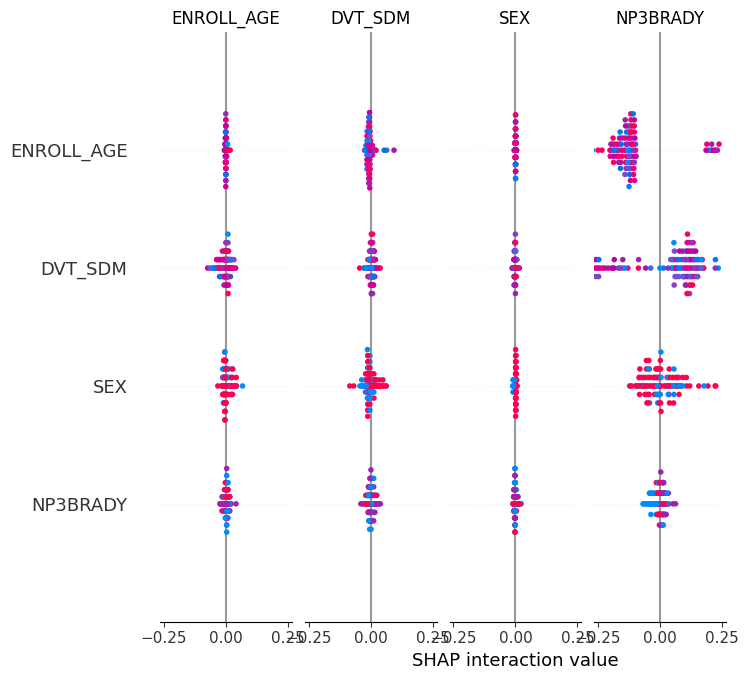

--- Detailed Beeswarm Plot ---


 97%|=================== | 508/524 [00:15<00:00]       

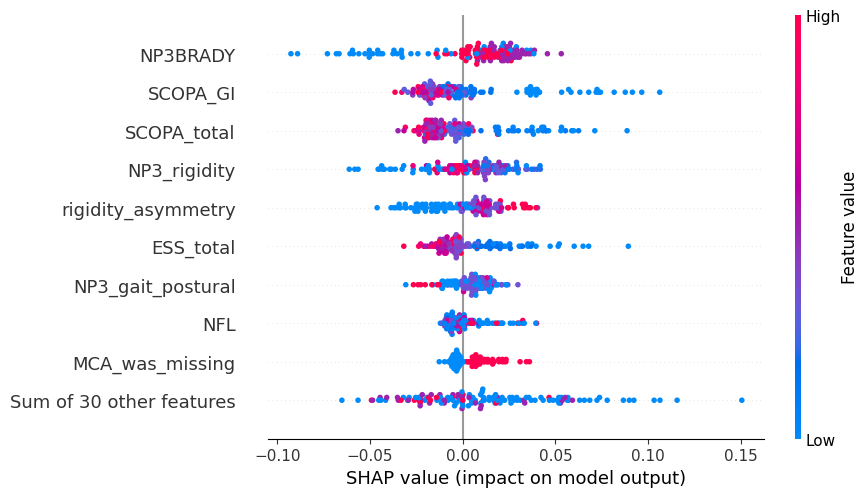

In [ ]:
import numpy as np
import pandas as pd
import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier  # Or your model of choice

# 1. Define your feature columns (removing IDs, target, and metadata/dates)
all_columns = [
    'PATNO', 'ENROLL_AGE', 'EVENT_ID', 'NP3BRADY', 'DVT_SDM', 'SEX', 'stage_merged',
    'ESS_total', 'ESS_high', 'DVT_TOTAL_RECALL', 'DVT_DELAYED_RECALL', 'DVT_RETENTION',
    'DVT_RECOG_DISC_INDEX', 'HVLT_learning_slope', 'HVLT_false_pos', 'SCOPA_GI',
    'SCOPA_urinary', 'SCOPA_cardiovascular', 'SCOPA_thermoregulatory', 'SCOPA_pupillomotor',
    'SCOPA_total', 'DVT_SFTANIM', 'DVS_SFTANIM', 'ESS_high_never_tested', 'GFAP', 'NFL',
    'NfL_serum', 'pTau', 'tTau', 'pTau_tTau_ratio', 'MCA_was_missing', 'SDM_was_missing',
    'MCA_executive', 'MCA_attention', 'MCA_abstraction', 'MCA_orientation', 'NP3_rigidity',
    'NP3_gait_postural', 'SDM_composite', 'rigidity_asymmetry', 'MRI_Group', 'MRI_Sex',
    'Image_ID_T1', 'Image_ID_T2', 'Acq_Date_T1', 'MRI_Age'
]

# Clinical training features (drop metadata, unique IDs, and dates)
feature_cols = [
    'ENROLL_AGE', 'NP3BRADY', 'DVT_SDM', 'SEX', 'ESS_total', 'ESS_high',
    'DVT_TOTAL_RECALL', 'DVT_DELAYED_RECALL', 'DVT_RETENTION', 'DVT_RECOG_DISC_INDEX',
    'HVLT_learning_slope', 'HVLT_false_pos', 'SCOPA_GI', 'SCOPA_urinary',
    'SCOPA_cardiovascular', 'SCOPA_thermoregulatory', 'SCOPA_pupillomotor', 'SCOPA_total',
    'DVT_SFTANIM', 'DVS_SFTANIM', 'ESS_high_never_tested', 'GFAP', 'NFL', 'NfL_serum',
    'pTau', 'tTau', 'pTau_tTau_ratio', 'MCA_was_missing', 'SDM_was_missing',
    'MCA_executive', 'MCA_attention', 'MCA_abstraction', 'MCA_orientation', 'NP3_rigidity',
    'NP3_gait_postural', 'SDM_composite', 'rigidity_asymmetry', 'MRI_Sex', 'MRI_Age'
]

# Target variable for your Parkinson's staging
target_col = 'stage_merged'

# Assuming your dataframe is named 'df'
# Handle simple preprocessing for missing values (SHAP TreeExplainer requires numeric/no NaNs)
X = df[feature_cols].copy()
y = df[target_col]

# Convert categorical variables to codes if not already handled
for col in X.select_dtypes(include=['object', 'category']).columns:
    X[col] = X[col].astype('category').cat.codes

X = X.fillna(X.median()) # Quick imputation for TreeExplainer compatibility

# 2. Split data and train your model
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# 3. Apply SHAP Explainer
# Initialize Javascript in Colab output cell for interactive plots
shap.initjs()

# Use TreeExplainer for tree-based models (RF, XGBoost, LightGBM)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_test)

# 4. Generate Visualizations inside Colab

print("--- Feature Importance Summary Plot ---")
# If multi-class, you can pass a specific class index like shap_values[1]
# or pass the array directly depending on your shap version behavior
shap.summary_plot(shap_values, X_test, feature_names=feature_cols)

print("--- Detailed Beeswarm Plot ---")
# Shows distribution of impacts (high/low feature values vs. output impact)
# For newer versions of SHAP, using the explanation object is preferred:
explainer_obj = shap.Explainer(model, X_train)
shap_values_obj = explainer_obj(X_test)
shap.plots.beeswarm(shap_values_obj if y.nunique() == 2 else shap_values_obj[:,:,1])

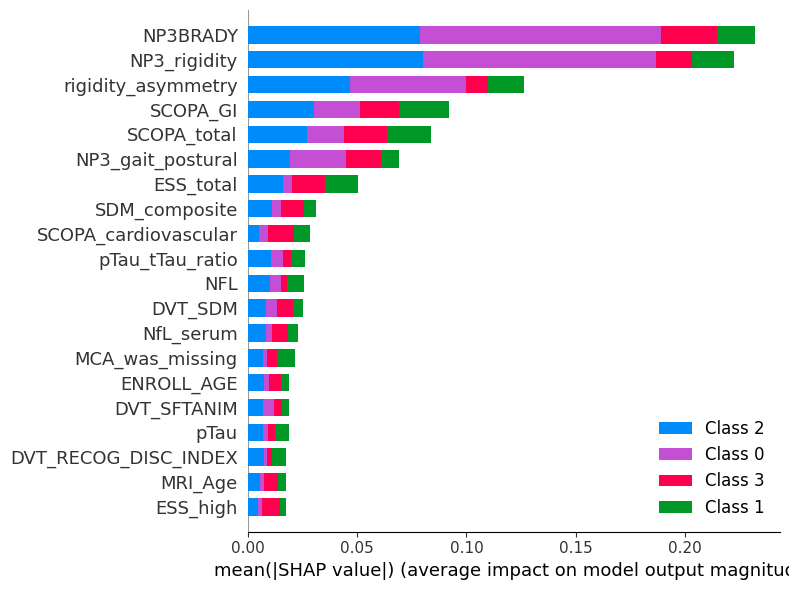

In [ ]:
import matplotlib.pyplot as plt

# Method 1: Using the plot_size parameter directly in SHAP
shap.summary_plot(shap_values, X_test, plot_type="bar", plot_size=(8, 6))

In [ ]:
# modal_df['PATNO'].unique()

In [ ]:
modal_df['EVENT_ID'].unique()

array(['BL', 'V06', 'V04', 'V10', 'V08'], dtype=object)

In [ ]:
modal_df['MRI_Group'].value_counts()

,count
MRI_Group,
PD,521
Control,134


In [ ]:
event_id_mapping = {
    "BL":  "Baseline (0 months)",
    "V02": "Month 6",
    "V04": "Month 12",
    "V05": "Month 18",
    "V06": "Month 24",
    "V08": "Month 36",
    "V10": "Month 48",
    "V11": "Month 54",
    "V12": "Month 60",
    "V13": "Month 72",
    "V14": "Month 84",
    "V15": "Month 96",
    "V16": "Month 108",
    # V01 (3 months), V03 (9), V07 (30), V09 (42) not in your list
}

In [ ]:
df_final=modal_df.copy()

In [ ]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import mutual_info_classif
from scipy import stats
from sklearn.preprocessing import LabelEncoder

# ================================================================
# FEATURE CORRELATION WITH stage_merged
# n=655 after MRI merge
# ================================================================

target    = 'stage_merged'
id_cols   = ['PATNO', 'EVENT_ID', 'stage_merged',
             'Image_ID_T1', 'Image_ID_T2',
             'Acq_Date_T1']  # identifiers only

# Working df — drop rows with null target
df_corr = df_final[
    df_final[target].notna()
].copy()

feat_cols = [c for c in df_corr.columns
             if c not in id_cols]

y = df_corr[target].astype(int)

print(f"Shape:         {df_corr.shape}")
print(f"Unique PATNO:  {df_corr['PATNO'].nunique()}")
print(f"Features:      {len(feat_cols)}")
print(f"\nStage distribution:")
print(df_corr['stage_merged'].value_counts()
                              .sort_index())

# ================================================================
# COMPUTE CORRELATION METRICS
# ================================================================
results = []

for col in feat_cols:
    series = df_corr[col].copy()

    # Encode categorical
    if series.dtype == object or \
       str(series.dtype) == 'category':
        le = LabelEncoder()
        series = pd.Series(
            le.fit_transform(series.astype(str)),
            index=series.index)

    series = pd.to_numeric(series, errors='coerce')

    valid = series.dropna()
    if len(valid) < 10 or valid.nunique() < 2:
        continue

    common  = series.dropna().index
    y_align = y.loc[common]
    x_align = series.loc[common]
    cov_pct = len(common) / len(df_corr) * 100

    # Mutual Information
    try:
        mi = mutual_info_classif(
            x_align.values.reshape(-1, 1),
            y_align,
            random_state=42)[0]
    except Exception:
        mi = 0.0

    # Spearman Correlation
    try:
        corr, p_corr = stats.spearmanr(
            x_align, y_align)
        corr_abs = abs(corr)
    except Exception:
        corr_abs, p_corr = 0.0, 1.0

    # ANOVA F-test
    try:
        groups = [x_align[y_align == c].values
                  for c in sorted(y_align.unique())
                  if (y_align == c).sum() > 1]
        f_stat, p_f = stats.f_oneway(*groups) \
                      if len(groups) >= 2 \
                      else (0.0, 1.0)
    except Exception:
        f_stat, p_f = 0.0, 1.0

    results.append({
        'column':      col,
        'dtype':       str(df_corr[col].dtype),
        'coverage%':   round(cov_pct, 1),
        'mutual_info': round(mi, 4),
        'spearman_r':  round(corr_abs, 4),
        'spearman_p':  round(p_corr, 6),
        'anova_F':     round(f_stat, 2),
        'anova_p':     round(p_f, 6),
    })

result_df = pd.DataFrame(results)\
              .sort_values('mutual_info',
                           ascending=False)\
              .reset_index(drop=True)


# ================================================================
# PRINT RESULTS
# ================================================================
print(f"\n{'='*70}")
print("FEATURE CORRELATION WITH stage_merged (n=655)")
print(f"{'='*70}")

print(f"\n{'Rank':<4} {'Feature':<32} {'MI':>7} "
      f"{'Spearman':>9} {'F-stat':>9} {'Cov%':>6}")
print("-" * 70)

for i, row in result_df.iterrows():
    print(f"  {i+1:<3} {row['column']:<32} "
          f"{row['mutual_info']:>7.4f} "
          f"{row['spearman_r']:>9.4f} "
          f"{row['anova_F']:>9.2f} "
          f"{row['coverage%']:>5.1f}%")


# ================================================================
# DOMAIN GROUPING SUMMARY
# ================================================================
print(f"\n{'='*70}")
print("DOMAIN SUMMARY")
print(f"{'='*70}")

domains = {
    'Demographic': [
        'ENROLL_AGE', 'SEX', 'MRI_Age',
        'MRI_Group', 'MRI_Sex', 'ethnicity'
    ],
    'Processing Speed': [
        'SDMTOTAL', 'SDM_composite',
        'DVSD_SDM', 'DVT_SDM',
        'AGE_ASSESS_SDM', 'SDM_was_missing'
    ],
    'Biofluid Biomarkers': [
        'NFL', 'GFAP', 'NfL_serum',
        'pTau', 'tTau', 'pTau_tTau_ratio'
    ],
    'Sleep (ESS)': [
        'ESS_total', 'ESS_high',
        'ESS_high_never_tested'
    ],
    'Memory (HVLT)': [
        'DVT_TOTAL_RECALL', 'DVT_DELAYED_RECALL',
        'DVT_RETENTION', 'DVT_RECOG_DISC_INDEX',
        'HVLT_learning_slope', 'HVLT_false_pos'
    ],
    'Autonomic (SCOPA)': [
        'SCOPA_GI', 'SCOPA_urinary',
        'SCOPA_cardiovascular',
        'SCOPA_thermoregulatory',
        'SCOPA_pupillomotor', 'SCOPA_total'
    ],
    'Language (SFT)': [
        'DVT_SFTANIM', 'DVS_SFTANIM'
    ],
    'Missingness Flags': [
        'MCA_was_missing', 'SDM_was_missing',
        'ESS_high_never_tested'
    ],
}

print(f"\n{'Domain':<25} {'Best Feature':<28} "
      f"{'Best MI':>8} {'Avg MI':>8}")
print("-" * 72)

for domain, cols in domains.items():
    present = [c for c in cols
               if c in result_df['column'].values]
    if not present:
        continue
    domain_df = result_df[
        result_df['column'].isin(present)
    ]
    best_row  = domain_df.iloc[0]
    avg_mi    = domain_df['mutual_info'].mean()
    print(f"  {domain:<23} {best_row['column']:<28} "
          f"{best_row['mutual_info']:>8.4f} "
          f"{avg_mi:>8.4f}")

# Any features not in any domain
accounted = [c for cols in domains.values()
             for c in cols]
unaccounted = [c for c in result_df['column']
               if c not in accounted]
if unaccounted:
    print(f"\nOther features:")
    for col in unaccounted:
        mi = result_df[
            result_df['column']==col
        ]['mutual_info'].values[0]
        print(f"  {col:<35}: MI={mi:.4f}")


# ================================================================
# SAVE
# ================================================================
result_df.to_csv('correlation_report_655.csv',
                 index=False)
print(f"\n✅ Saved: correlation_report_655.csv")
print(f"   Total features analyzed: {len(result_df)}")

Shape:         (655, 46)
Unique PATNO:  263
Features:      40

Stage distribution:
stage_merged
0    134
1     88
2    356
3     77
Name: count, dtype: int64

FEATURE CORRELATION WITH stage_merged (n=655)

Rank Feature                               MI  Spearman    F-stat   Cov%
----------------------------------------------------------------------
  1   MRI_Group                         0.5165    0.7684       inf 100.0%
  2   NP3_rigidity                      0.3877    0.6417    132.81 100.0%
  3   NP3BRADY                          0.3855    0.6630    190.36 100.0%
  4   ENROLL_AGE                        0.2072    0.0833      3.34 100.0%
  5   SCOPA_GI                          0.1864    0.5468     84.17 100.0%
  6   rigidity_asymmetry                0.1819    0.3381     64.91 100.0%
  7   NP3_gait_postural                 0.1746    0.4863     62.62 100.0%
  8   SCOPA_total                       0.1159    0.4800     58.38 100.0%
  9   SDM_composite                     0.0823    0.3176  

/usr/local/lib/python3.12/dist-packages/scipy/stats/_axis_nan_policy.py:579: ConstantInputWarning: Each of the input arrays is constant; the F statistic is not defined or infinite
  res = hypotest_fun_out(*samples, **kwds)


In [ ]:
(df_final['MRI_Age'] == df_final['ENROLL_AGE']).all()

np.False_

In [ ]:
import numpy as np

np.allclose(
    df_final['MRI_Age'],
    df_final['ENROLL_AGE'],
    equal_nan=True
)

False

In [ ]:
diff = np.abs(df_final['MRI_Age'] - df_final['ENROLL_AGE'])

print("Max difference:", diff.max())
print("Mean difference:", diff.mean())

Max difference: 10.399999999999999
Mean difference: 1.422137404580153


In [ ]:
df_final[['MRI_Age', 'ENROLL_AGE']].corr()

,MRI_Age,ENROLL_AGE
MRI_Age,1.000000,0.988076
ENROLL_AGE,0.988076,1.000000


In [ ]:
features_drop=[
      'DVT_DELAYED_RECALL' ,
    # 'SCOPA_thermoregulatory',
    # 'SCOPA_pupillomotor',
    # 'DVT_SFTANIM' ,
    'tTau'   ,
      'ESS_high_never_tested',
    'MRI_Sex' ,
      'MRI_Group',
      'SEX',
      'MRI_Age',

 'Acq_Date_T1',
      # 'MCA_abstraction',
      # 'MCA_attention'
]
df_final=df_final.drop(columns=features_drop,errors='ignore')

In [ ]:
df_final.columns.tolist()

['PATNO',
 'ENROLL_AGE',
 'EVENT_ID',
 'NP3BRADY',
 'DVT_SDM',
 'stage_merged',
 'ESS_total',
 'ESS_high',
 'DVT_TOTAL_RECALL',
 'DVT_DELAYED_RECALL',
 'DVT_RETENTION',
 'DVT_RECOG_DISC_INDEX',
 'HVLT_learning_slope',
 'HVLT_false_pos',
 'SCOPA_GI',
 'SCOPA_urinary',
 'SCOPA_cardiovascular',
 'SCOPA_thermoregulatory',
 'SCOPA_pupillomotor',
 'SCOPA_total',
 'DVT_SFTANIM',
 'DVS_SFTANIM',
 'GFAP',
 'NFL',
 'NfL_serum',
 'pTau',
 'pTau_tTau_ratio',
 'MCA_was_missing',
 'SDM_was_missing',
 'MCA_executive',
 'MCA_attention',
 'MCA_abstraction',
 'MCA_orientation',
 'NP3_rigidity',
 'NP3_gait_postural',
 'SDM_composite',
 'rigidity_asymmetry',
 'Image_ID_T1',
 'Image_ID_T2']

In [ ]:
len(df_final.columns)

37

Embeddings

In [ ]:
numerical_features  = ['NP3BRADY', 'ESS_total',
                      'DVT_RECOG_DISC_INDEX', 'HVLT_learning_slope',
                      # 'DVT_DELAYED_RECALL',
                      'HVLT_false_pos', 'SCOPA_GI', 'SCOPA_urinary',
                      'SCOPA_cardiovascular',     'SCOPA_thermoregulatory',
                      'SCOPA_pupillomotor',
                      'MCA_abstraction',
                      'SCOPA_total', 'DVS_SFTANIM',
                      'MCA_executive',  'MCA_orientation','MCA_attention',
                      'NP3_rigidity', 'NP3_gait_postural', 'rigidity_asymmetry',
'DVT_SFTANIM',

# True continuous numerical

    'ENROLL_AGE', 'DVT_SDM', 'DVT_TOTAL_RECALL',
    'DVT_RETENTION',  'GFAP', 'NFL',
    'NfL_serum', 'pTau','pTau_tTau_ratio',
    'SDM_composite',
]

binary_features = binary = [
    'ESS_high',
    # 'ESS_high_never_tested',
    'MCA_was_missing', 'SDM_was_missing',

]

all_features = numerical_features + binary_features  # 18 + 4 = 22

target_col = 'stage_merged'
group_col  = 'PATNO'

assert 'PATNO' not in all_features and 'EVENT_ID' not in all_features

cont_idx   = [all_features.index(c) for c in numerical_features]
binary_idx = [all_features.index(c) for c in binary_features]

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1,
                          device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets


class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4,
                 device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma

        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()

        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            w = neg / (pos + 1e-6)
            alphas.append(min(np.sqrt(w), 3.0))

        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)

        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')

        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)

        focal = (1 - pt) ** self.gamma

        alpha = torch.where(
            targets == 1,
            self.alpha.unsqueeze(0).expand_as(targets),
            torch.ones_like(targets)
        )

        loss = alpha * focal * bce
        return loss.mean()


def decode_with_thresholds(logits, thresholds):
    probs = torch.sigmoid(logits)

    # enforce monotonicity correctly
    for i in range(1, probs.shape[1]):
        probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])

    thresholds = torch.tensor(thresholds, device=probs.device)

    preds = (probs > thresholds).sum(dim=1)
    return preds

In [ ]:
class ClinicalExcitationOrdinal(nn.Module):
    def __init__(self, input_dim, embedding_dim=64,
                 hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        self.excitation = nn.Sequential(
            nn.Linear(input_dim, input_dim // 2),
            nn.ReLU(),
            nn.Linear(input_dim // 2, input_dim),
            nn.Sigmoid()
        )

        self.embedding = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, embedding_dim),
            nn.LayerNorm(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Dropout(dropout),
            nn.Linear(32, num_classes - 1)
        )

    def forward(self, x):
        w = self.excitation(x)
        x = x * w
        emb = self.embedding(x)
        logits = self.classifier(emb)
        return logits, emb, w

In [ ]:
df=df_final.copy()

In [ ]:
import torch
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.decomposition import PCA
from torch.utils.data import DataLoader, TensorDataset

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

X = df[all_features].copy().astype(float)
y = df[target_col].values
groups = df[group_col].values

NUM_CLASSES = 4
N_FOLDS = 10
EMBEDDING_DIM = 64
PATIENCE = 15
labels_map = {0:'HC', 1:'Early', 2:'Moderate', 3:'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)

oof_preds      = np.zeros(len(y), dtype=int)
oof_embeddings = np.zeros((len(y), EMBEDDING_DIM))
oof_excitation = np.zeros((len(y), INPUT_DIM := len(all_features)))
fold_results   = []
all_histories  = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    print(f"\n{'='*55}\nFOLD {fold+1}/{N_FOLDS}\n{'='*55}")

    X_train_np = X.iloc[train_idx].values.copy()
    X_val_np   = X.iloc[val_idx].values.copy()
    y_train, y_val = y[train_idx], y[val_idx]

    scaler = StandardScaler()
    X_train_np[:, cont_idx] = scaler.fit_transform(X_train_np[:, cont_idx])
    X_val_np[:, cont_idx]   = scaler.transform(X_val_np[:, cont_idx])

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f"  Train counts: {dict(enumerate(class_counts))}")

    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_train_np, dtype=torch.float32),
                     torch.tensor(y_train, dtype=torch.long)),
        batch_size=128, shuffle=True)
    val_loader = DataLoader(
        TensorDataset(torch.tensor(X_val_np, dtype=torch.float32),
                     torch.tensor(y_val, dtype=torch.long)),
        batch_size=256, shuffle=False)

    model = ClinicalExcitationOrdinal(INPUT_DIM).to(device)
    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-2)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
        optimizer, mode='max', patience=8, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        # ── Validation ──────────────────────────────────────
        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                logits, _, _ = model(xb.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())
        val_logits = torch.cat(logits_list)
        y_val_arr  = np.array(y_list)
        val_loss   = criterion(val_logits.to(device),
                               torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        # ── Threshold search — find this epoch's local best ──
        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.3, 0.7, 5):
            for t2 in np.linspace(0.3, 0.7, 5):
                for t3 in np.linspace(0.3, 0.7, 5):
                    preds = ((probs[:,0]>t1).astype(int) +
                             (probs[:,1]>t2).astype(int) +
                             (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1,t2,t3]

        scheduler.step(epoch_best_f1)
        history.append({'epoch':epoch+1, 'train_loss':train_loss,
                        'val_loss':val_loss, 'val_f1':epoch_best_f1})

        # ── FIX: thresholds saved ONLY together with state ───
        if epoch_best_f1 > best_f1:
            best_f1 = epoch_best_f1
            best_thresholds = epoch_best_t      # tied to this state
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            patience_cnt = 0
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Ep {epoch+1:3d} | train={train_loss:.4f} "
                  f"val={val_loss:.4f} f1={epoch_best_f1:.4f}")

        if patience_cnt >= PATIENCE:
            print(f"  Early stop ep={epoch+1} best_f1={best_f1:.4f}")
            break

    all_histories.append(history)

    # ── Final eval + EMBEDDING EXTRACTION with best state ────
    model.load_state_dict(best_state)
    model.eval()

    preds_final, embs_final, exc_final = [], [], []
    with torch.no_grad():
        for xb, _ in val_loader:
            xb = xb.to(device)
            logits, emb, exc = model(xb)
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())
            embs_final.append(emb.cpu().numpy())
            exc_final.append(exc.cpu().numpy())

    preds_final = np.array(preds_final)
    embs_final  = np.concatenate(embs_final, axis=0)
    exc_final   = np.concatenate(exc_final, axis=0)

    oof_preds[val_idx]      = preds_final
    oof_embeddings[val_idx] = embs_final
    oof_excitation[val_idx] = exc_final

    f1 = f1_score(y_val, preds_final, average='macro')
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    print(f"\n  Best thresholds: {[round(t,3) for t in best_thresholds]}")
    print(f"  F1: {f1:.4f}")
    print(classification_report(y_val, preds_final,
        target_names=list(labels_map.values()), zero_division=0))

    fold_results.append({'fold':fold+1, 'f1':f1, 'cm':cm,
                         'thresholds':best_thresholds})

    # ── Per-fold confusion matrix plot ────────────────────────
    fig, ax = plt.subplots(figsize=(5,4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
               xticklabels=list(labels_map.values()),
               yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — F1={f1:.3f}')
    ax.set_xlabel('Predicted'); ax.set_ylabel('True')
    plt.tight_layout()
    # plt.savefig(f'/kaggle/working/cm_fold{fold+1}.png', dpi=100)
    plt.close()

    # ── Per-fold loss/F1 curve ────────────────────────────────
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11,4))
    axes[0].plot(hist_df['epoch'], hist_df['train_loss'], label='train')
    axes[0].plot(hist_df['epoch'], hist_df['val_loss'], label='val')
    axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
    axes[1].plot(hist_df['epoch'], hist_df['val_f1'], color='green')
    axes[1].set_title(f'Fold {fold+1} Val F1')
    plt.tight_layout()
    # plt.savefig(f'/kaggle/working/curves_fold{fold+1}.png', dpi=100)
    plt.close()


FOLD 1/10
  Train counts: {0: np.int64(122), 1: np.int64(77), 2: np.int64(328), 3: np.int64(66)}
  Ep  10 | train=0.1215 val=0.1149 f1=0.5346
  Ep  20 | train=0.1018 val=0.0895 f1=0.7313
  Ep  30 | train=0.0922 val=0.0817 f1=0.7152
  Early stop ep=35 best_f1=0.7313

  Best thresholds: [np.float64(0.5), np.float64(0.4), np.float64(0.5)]
  F1: 0.7313
              precision    recall  f1-score   support

          HC       1.00      0.92      0.96        12
       Early       0.62      0.45      0.53        11
    Moderate       0.75      0.75      0.75        28
    Advanced       0.60      0.82      0.69        11

    accuracy                           0.74        62
   macro avg       0.74      0.73      0.73        62
weighted avg       0.75      0.74      0.74        62


FOLD 2/10
  Train counts: {0: np.int64(123), 1: np.int64(79), 2: np.int64(316), 3: np.int64(71)}
  Ep  10 | train=0.1159 val=0.0997 f1=0.5546
  Ep  20 | train=0.0939 val=0.0857 f1=0.5784
  Ep  30 | train=0.0869 v

In [ ]:
# ================================================================
# FINAL SUMMARY
# ================================================================
f1s = [r['f1'] for r in fold_results]
oof_f1 = f1_score(y, oof_preds, average='macro', zero_division=0)

print(f"\n{'='*55}\nFINAL RESULTS\n{'='*55}")
print(f"Mean fold F1: {np.mean(f1s):.4f} ± {np.std(f1s):.4f}")
print(f"OOF macro F1: {oof_f1:.4f}")
print(classification_report(y, oof_preds,
    target_names=list(labels_map.values()), zero_division=0))

# ── Aggregate OOF confusion matrix ────────────────────────────
cm_total = confusion_matrix(y, oof_preds, labels=[0,1,2,3])
fig, ax = plt.subplots(figsize=(6,5))
sns.heatmap(cm_total, annot=True, fmt='d', cmap='Blues',
           xticklabels=list(labels_map.values()),
           yticklabels=list(labels_map.values()), ax=ax)
ax.set_title(f'OOF Confusion Matrix — Macro F1={oof_f1:.4f}')
ax.set_xlabel('Predicted'); ax.set_ylabel('True')
plt.tight_layout()
# plt.savefig('/kaggle/working/oof_confusion_matrix.png', dpi=100)
plt.show()

# ── Per-fold F1 bar chart ─────────────────────────────────────
fig, ax = plt.subplots(figsize=(7,4))
ax.bar(range(1, N_FOLDS+1), f1s, color='steelblue')
ax.axhline(np.mean(f1s), color='red', linestyle='--',
          label=f'Mean={np.mean(f1s):.3f}')
ax.set_xlabel('Fold'); ax.set_ylabel('Macro F1')
ax.set_title('F1 by Fold'); ax.legend()
plt.tight_layout()
# plt.savefig('/kaggle/working/fold_f1_bars.png', dpi=100)
plt.show()

TypeError: 'float' object is not subscriptable

In [ ]:

=======================================================
FINAL RESULTS
=======================================================
Mean fold F1: 0.6766 ± 0.0850
OOF macro F1: 0.6824
              precision    recall  f1-score   support

          HC       0.84      0.90      0.87       134
       Early       0.45      0.51      0.48        88
    Moderate       0.82      0.75      0.79       356
    Advanced       0.56      0.64      0.60        77

    accuracy                           0.74       655
   macro avg       0.67      0.70      0.68       655
weighted avg       0.75      0.74      0.74       655



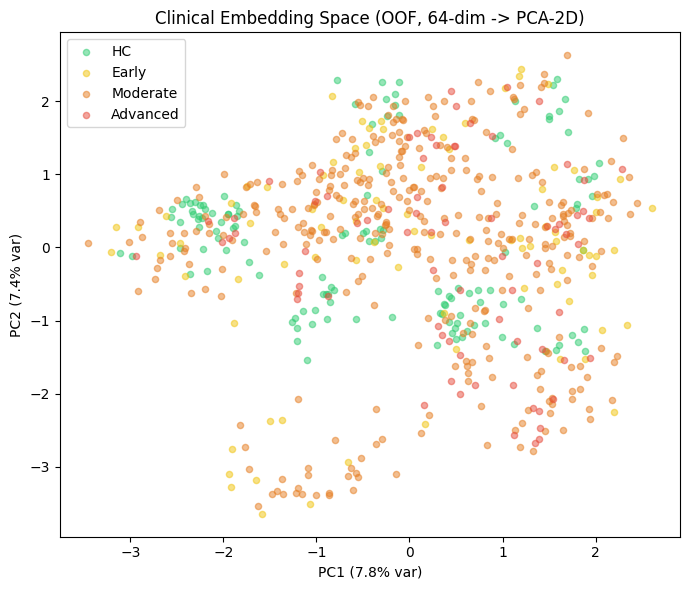

In [ ]:
# ================================================================
# EMBEDDING VISUALIZATION — PCA 2D, colored by true stage
# ================================================================
pca = PCA(n_components=2, random_state=42)
emb_2d = pca.fit_transform(oof_embeddings)

fig, ax = plt.subplots(figsize=(7,6))
colors = {0:'#2ecc71', 1:'#f1c40f', 2:'#e67e22', 3:'#e74c3c'}
for stage, name in labels_map.items():
    mask = y == stage
    ax.scatter(emb_2d[mask,0], emb_2d[mask,1],
              c=colors[stage], label=name, alpha=0.5, s=20)
ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%} var)')
ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%} var)')
ax.set_title('Clinical Embedding Space (OOF, 64-dim -> PCA-2D)')
ax.legend()
plt.tight_layout()
# plt.savefig('/kaggle/working/embedding_pca.png', dpi=100)
plt.show()

In [ ]:
pd.read_csv('/content/clinical_embeddings_v2_oof.csv')

,PATNO,EVENT_ID,emb_0,Image_ID_T1,Image_ID_T2,stage_merged,emb_1,emb_2,emb_3,emb_4,...,emb_54,emb_55,emb_56,emb_57,emb_58,emb_59,emb_60,emb_61,emb_62,emb_63
0,3102,BL,0.000000,I333354,I333353,2,0.716124,0.000000,0.000000,0.896062,...,0.000000,1.201509,0.000000,0.000000,0.000000,0.450726,0.936512,1.174473,0.000000,0.000000
1,3102,V06,0.000000,I406748,I406759,3,0.000000,0.112632,0.000000,0.000000,...,0.370632,1.331026,0.000000,0.081564,0.501961,0.211753,0.612829,0.264190,0.000000,0.136658
2,3104,BL,0.120256,I330120,I330119,0,0.000000,0.000000,2.361355,0.000000,...,0.000000,0.722021,0.504596,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,3104,V04,0.000000,I330133,I330131,0,0.220258,0.000000,2.494882,0.000000,...,0.000000,0.854340,0.339955,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,3105,BL,0.602346,I330401,I330400,2,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.518191,0.000000,0.000000,0.064845,0.000000,0.000000,0.000000,0.503610,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
650,51632,BL,0.570860,I696651,I696656,2,0.506130,0.000000,0.000000,0.000000,...,0.831736,0.000000,0.000000,0.000000,0.000000,1.225597,1.065601,1.929755,0.000000,0.000000
651,51731,BL,0.000000,I696153,I693257,2,0.525697,0.000000,0.000000,0.000000,...,1.328431,0.000000,0.000000,0.000000,0.000000,0.907918,0.000000,1.554739,0.000000,0.000000
652,53060,BL,0.000000,I849671,I848718,1,0.000000,0.000000,0.361215,0.979189,...,0.143595,0.835586,0.000000,0.426769,0.000000,0.000000,0.668067,0.114591,0.635222,0.000000
653,55395,BL,0.000000,I993964,I993427,2,0.730780,0.000000,0.000000,0.000000,...,1.330610,0.000000,0.000000,0.000000,0.000000,0.854045,0.992824,0.692982,0.000000,0.000000


In [ ]:
emb_cols = [f'emb_{i}' for i in range(EMBEDDING_DIM)]
emb_df = pd.DataFrame(oof_embeddings, columns=emb_cols)
emb_df.insert(0, 'PATNO', df['PATNO'].values)
emb_df.insert(1, 'EVENT_ID', df['EVENT_ID'].values)
emb_df.insert(3, 'Image_ID_T1', df['Image_ID_T1'].values)
emb_df.insert(4, 'Image_ID_T2', df['Image_ID_T2'].values)
emb_df.insert(5, 'stage_merged', y)

emb_df.to_csv('clinical_embeddings_v2_oof2.csv', index=False)
np.save('clinical_embeddings_v2_oof2.npy', oof_embeddings)

print(f"\n✅ Saved clinical_embeddings_v2_oof.csv {emb_df.shape}")
print(f"   Use this for fusion with MRI embeddings, same pattern "
      f"as your earlier ResNet/SwinUNETR fusion work — merge on "
      f"PATNO + EVENT_ID (or Image_ID_T1 via clinical's EVENT_ID)")

NameError: name 'EMBEDDING_DIM' is not defined

In [ ]:
# Try a smaller bottleneck — 16 or 32, not 64 or larger
EMBEDDING_DIM_CANDIDATES = [16, 24, 32, 48, 64,128,132]

results_by_dim = {}

for emb_dim in EMBEDDING_DIM_CANDIDATES:
    print(f"\n{'='*60}")
    print(f"TESTING EMBEDDING_DIM = {emb_dim}")
    print(f"{'='*60}")

    fold_f1s = []
    sgkf = StratifiedGroupKFold(n_splits=5, shuffle=True,
                                random_state=42)  # 5 folds
                                # for speed during this sweep

    for fold, (train_idx, val_idx) in enumerate(
            sgkf.split(X, y, groups)):
        X_train_np = X.iloc[train_idx].values.copy()
        X_val_np   = X.iloc[val_idx].values.copy()
        y_train, y_val = y[train_idx], y[val_idx]

        scaler = StandardScaler()
        X_train_np[:, cont_idx] = scaler.fit_transform(
            X_train_np[:, cont_idx])
        X_val_np[:, cont_idx] = scaler.transform(
            X_val_np[:, cont_idx])

        class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

        train_loader = DataLoader(
            TensorDataset(torch.tensor(X_train_np, dtype=torch.float32),
                         torch.tensor(y_train, dtype=torch.long)),
            batch_size=128, shuffle=True)
        val_loader = DataLoader(
            TensorDataset(torch.tensor(X_val_np, dtype=torch.float32),
                         torch.tensor(y_val, dtype=torch.long)),
            batch_size=256, shuffle=False)

        model = ClinicalExcitationOrdinal(
            INPUT_DIM, embedding_dim=emb_dim).to(device)
        criterion = OrdinalFocalLoss(class_counts, device=device)
        optimizer = torch.optim.Adam(
            model.parameters(), lr=5e-4, weight_decay=1e-2)

        best_f1 = 0
        patience_cnt = 0
        for epoch in range(80):
            model.train()
            for xb, yb in train_loader:
                xb, yb = xb.to(device), yb.to(device)
                optimizer.zero_grad()
                logits, _, _ = model(xb)
                loss = criterion(logits, yb)
                loss.backward()
                optimizer.step()

            model.eval()
            logits_list, y_list = [], []
            with torch.no_grad():
                for xb, yb in val_loader:
                    logits, _, _ = model(xb.to(device))
                    logits_list.append(logits.cpu())
                    y_list.extend(yb.numpy())
            probs = torch.sigmoid(torch.cat(logits_list))
            for i in range(1, probs.shape[1]):
                probs[:,i] = torch.minimum(probs[:,i], probs[:,i-1])
            preds = (probs > 0.5).sum(dim=1).numpy()
            f1 = f1_score(y_list, preds, average='macro',
                          zero_division=0)

            if f1 > best_f1:
                best_f1 = f1
                patience_cnt = 0
            else:
                patience_cnt += 1
            if patience_cnt >= 15:
                break

        fold_f1s.append(best_f1)

    results_by_dim[emb_dim] = {
        'mean_f1': np.mean(fold_f1s),
        'std_f1': np.std(fold_f1s),
    }
    print(f"  Mean F1: {np.mean(fold_f1s):.4f} "
          f"± {np.std(fold_f1s):.4f}")

print(f"\n{'='*60}")
print("SUMMARY")
print(f"{'='*60}")
for dim, res in sorted(results_by_dim.items()):
    print(f"  embedding_dim={dim:>3}: "
          f"F1={res['mean_f1']:.4f} ± {res['std_f1']:.4f}")


TESTING EMBEDDING_DIM = 16
  Mean F1: 0.5751 ± 0.0625

TESTING EMBEDDING_DIM = 24
  Mean F1: 0.5489 ± 0.1683

TESTING EMBEDDING_DIM = 32
  Mean F1: 0.6071 ± 0.0468

TESTING EMBEDDING_DIM = 48
  Mean F1: 0.5973 ± 0.0558

TESTING EMBEDDING_DIM = 64
  Mean F1: 0.6339 ± 0.0498

TESTING EMBEDDING_DIM = 128
  Mean F1: 0.6031 ± 0.0630

TESTING EMBEDDING_DIM = 132
  Mean F1: 0.6287 ± 0.0704

SUMMARY
  embedding_dim= 16: F1=0.5751 ± 0.0625
  embedding_dim= 24: F1=0.5489 ± 0.1683
  embedding_dim= 32: F1=0.6071 ± 0.0468
  embedding_dim= 48: F1=0.5973 ± 0.0558
  embedding_dim= 64: F1=0.6339 ± 0.0498
  embedding_dim=128: F1=0.6031 ± 0.0630
  embedding_dim=132: F1=0.6287 ± 0.0704


mri + clinical

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

In [ ]:
clinical=pd.read_csv('/content/clinical_embeddings_v2_oof (1).csv')

In [ ]:
resent10=pd.read_csv('/content/mri_r10_oof_embeddings.csv')
resnet50=pd.read_csv('/content/mri_resnet50_oof_clean.csv')

In [ ]:
clinical.head(3)

,PATNO,EVENT_ID,emb_0,Image_ID_T1,Image_ID_T2,stage_merged,emb_1,emb_2,emb_3,emb_4,...,emb_54,emb_55,emb_56,emb_57,emb_58,emb_59,emb_60,emb_61,emb_62,emb_63
0,3102,BL,0.0,I333354,I333353,2,0.557038,1.679197,0.201530,0.0,...,1.280908,1.160866,0.0,0.0,0.522860,0.538362,0.176820,1.299313,0.795324,0.000000
1,3102,V06,0.0,I406748,I406759,3,1.108874,1.870898,0.000000,0.0,...,1.635283,0.405102,0.0,0.0,0.000000,0.280255,0.829002,2.023286,0.897576,0.000000
2,3104,BL,0.0,I330120,I330119,0,1.076286,0.000000,1.289558,0.0,...,0.000000,0.000000,0.0,0.0,0.608614,0.005026,0.404234,2.158654,0.000000,1.046038


In [ ]:
resent10.head(3)

,Image_ID_T1,PATNO,stage_merged,mri_r10_emb_0,mri_r10_emb_1,mri_r10_emb_2,mri_r10_emb_3,mri_r10_emb_4,mri_r10_emb_5,mri_r10_emb_6,...,mri_r10_emb_502,mri_r10_emb_503,mri_r10_emb_504,mri_r10_emb_505,mri_r10_emb_506,mri_r10_emb_507,mri_r10_emb_508,mri_r10_emb_509,mri_r10_emb_510,mri_r10_emb_511
0,I333354,3102,2,0.456299,0.441895,0.377197,0.436768,0.570801,0.349609,0.812012,...,0.328125,0.485107,0.477783,0.533203,0.479736,0.467773,1.045898,0.504883,0.406494,0.480713
1,I406748,3102,3,0.479736,0.416992,0.374023,0.427002,0.580566,0.388428,0.697754,...,0.319824,0.479736,0.428711,0.510254,0.412598,0.440186,0.951660,0.477539,0.464355,0.512695
2,I330120,3104,0,0.628418,0.405029,0.666992,0.435791,0.416504,0.561035,0.649902,...,0.939453,0.817871,0.624023,0.406006,0.432129,0.494629,0.586426,0.159424,0.448242,0.732910


In [ ]:
resnet50.head(3)

,Image_ID_T1,EVENT_ID,stage_merged,PATNO,mri_emb_0,mri_emb_1,mri_emb_2,mri_emb_3,mri_emb_4,mri_emb_5,...,mri_emb_491,mri_emb_492,mri_emb_493,mri_emb_494,mri_emb_495,mri_emb_496,mri_emb_497,mri_emb_498,mri_emb_499,mri_emb_500
0,I333354,BL,2,3102,0.126047,0.573278,0.000000,0.0,0.247339,0.0,...,0.056587,0.681925,0.194154,0.334472,0.719782,0.000000,0.391003,0.000000,0.000000,0.593571
1,I406748,V06,3,3102,0.187455,0.574305,0.000000,0.0,0.264849,0.0,...,0.143731,0.705762,0.035162,0.493891,0.790619,0.000000,0.372646,0.000000,0.000000,0.623242
2,I330120,BL,0,3104,0.522259,0.000000,0.416734,0.0,0.000000,0.0,...,0.000000,0.000000,0.000000,1.551676,0.469822,0.629262,0.239477,0.699427,0.390412,0.041811


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from sklearn.decomposition import PCA
from torch.utils.data import Dataset, DataLoader

# Enforce hardware acceleration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Execution target environment locked on: {device}")

Execution target environment locked on: cuda


In [ ]:
df_clin=clinical.copy()

In [ ]:
# Extract clean lists of pure feature string headers
clin_features = [col for col in df_clin.columns if col.startswith('emb_')]
r10_features  = [col for col in resent10.columns if col.startswith('mri_r10_emb_')]
r50_features  = [col for col in resnet50.columns if col.startswith('mri_emb_')]

# Clean dataframes prior to merging to prevent _x/_y suffix collision contamination
df_clin_clean = df_clin[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = resent10[['Image_ID_T1'] + r10_features].copy()
df_r50_clean  = resnet50[['Image_ID_T1'] + r50_features].copy()

# Execute sequential relational merges strictly utilizing the unique Image Scan Identifier
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')

print(f"Coherent Patient Alignment Output Shape: {merged_df.shape}")

# STRIP ALL STRINGS & METADATA: Isolate pure, independent numeric embedding feature blocks
X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_resnet10_raw = merged_df[r10_features].values.astype(np.float32)
X_resnet50_raw = merged_df[r50_features].values.astype(np.float32)

# Isolate Target Labels and Stratified Group Variable
y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values # Guarantees non-contamination across cross-validation cuts

print(f"\nExtracted Numeric Arrays Partition Verification:")
print(f" -> Pure Clinical Features Slice : {X_clinical_raw.shape}")
print(f" -> Pure ResNet10 Features Slice : {X_resnet10_raw.shape}")
print(f" -> Pure ResNet50 Features Slice : {X_resnet50_raw.shape}")

Coherent Patient Alignment Output Shape: (654, 1081)

Extracted Numeric Arrays Partition Verification:
 -> Pure Clinical Features Slice : (654, 64)
 -> Pure ResNet10 Features Slice : (654, 512)
 -> Pure ResNet50 Features Slice : (654, 501)


In [ ]:
# merged_df.columns.tolist()

In [ ]:
class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10 = torch.tensor(r10, dtype=torch.float32)
        self.r50 = torch.tensor(r50, dtype=torch.float32)
        self.targets = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.targets[idx]


def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets


class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()

        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            w = neg / (pos + 1e-6)
            alphas.append(min(np.sqrt(w), 3.0))

        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

In [ ]:
#updated cell4
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        # Branch 1: Phenotypic Attention Block
        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        # Branch 2: Volumetric Morphometric Projections (Smooth Step-Down Layers)
        self.r10_proj = nn.Sequential(
            nn.Linear(r10_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.ReLU()
        )
        self.r50_proj = nn.Sequential(
            nn.Linear(r50_dim, 256),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(256, hidden_dim),
            nn.LayerNorm(hidden_dim),
            nn.ReLU()
        )

        # Dual-Modality Visual Feature Squeeze & Excitation Layer
        combined_img_dim = hidden_dim * 2
        self.img_excitation = nn.Sequential(
            nn.Linear(combined_img_dim, combined_img_dim // 4), nn.ReLU(),
            nn.Linear(combined_img_dim // 4, combined_img_dim), nn.Sigmoid()
        )

        # Cross-Domain Concat Integration & Projection Network
        fused_dim = hidden_dim + combined_img_dim
        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim),
            nn.LayerNorm(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        proj_img = torch.cat([self.r10_proj(x_r10), self.r50_proj(x_r50)], dim=1)
        w_img = self.img_excitation(proj_img)
        gated_img = proj_img * w_img

        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))
        return self.classifier(latent), latent

without smote


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 1/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1038 | Val Loss: 0.1163 | Val Macro F1: 0.3577
  Epoch  10 | Train Loss: 0.0754 | Val Loss: 0.1071 | Val Macro F1: 0.4674
  Epoch  15 | Train Loss: 0.0580 | Val Loss: 0.1111 | Val Macro F1: 0.4497
  Epoch  20 | Train Loss: 0.0506 | Val Loss: 0.1156 | Val Macro F1: 0.4370
  Early stopping sequence active on Epoch 22. Metric Stable.


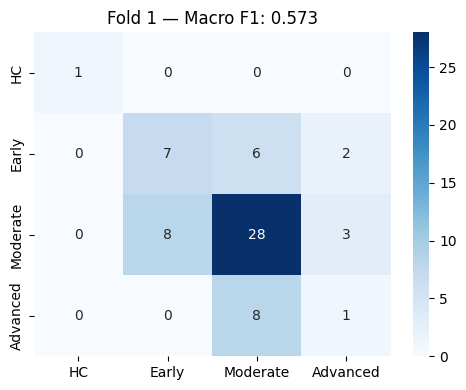

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.47      0.47      0.47        15
    Moderate       0.67      0.72      0.69        39
    Advanced       0.17      0.11      0.13         9

    accuracy                           0.58        64
   macro avg       0.57      0.57      0.57        64
weighted avg       0.55      0.58      0.57        64


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 2/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1084 | Val Loss: 0.1479 | Val Macro F1: 0.5078
  Epoch  10 | Train Loss: 0.0730 | Val Loss: 0.1596 | Val Macro F1: 0.6527
  Epoch  15 | Train Loss: 0.0523 | Val Loss: 0.1773 | Val Macro F1: 0.6445
  Epoch  20 | Train Loss: 0.0395 | Val Loss: 0.2217 | Val Macro F1: 0.6470
  Epoch  25 | Train Loss: 0.0304 | Val Loss: 0.2629 | Val Macro F1: 0.6715
  Epoch  30 | Train Loss: 0.0254 | Val Loss: 0.2747 | Val Macro F1: 0.6776
  Epoch  3

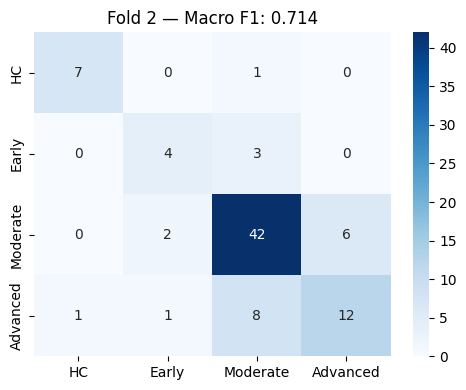

              precision    recall  f1-score   support

          HC       0.88      0.88      0.88         8
       Early       0.57      0.57      0.57         7
    Moderate       0.78      0.84      0.81        50
    Advanced       0.67      0.55      0.60        22

    accuracy                           0.75        87
   macro avg       0.72      0.71      0.71        87
weighted avg       0.74      0.75      0.74        87


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 3/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1056 | Val Loss: 0.0978 | Val Macro F1: 0.4261
  Epoch  10 | Train Loss: 0.0767 | Val Loss: 0.0738 | Val Macro F1: 0.5998
  Epoch  15 | Train Loss: 0.0584 | Val Loss: 0.0654 | Val Macro F1: 0.5934
  Epoch  20 | Train Loss: 0.0471 | Val Loss: 0.0640 | Val Macro F1: 0.6064
  Epoch  25 | Train Loss: 0.0411 | Val Loss: 0.0636 | Val Macro F1: 0.5618
  Epoch  30 | Train Loss: 0.0346 | Val Loss: 0.0648 | Val Macro F1: 0.5982
  Epoch  3

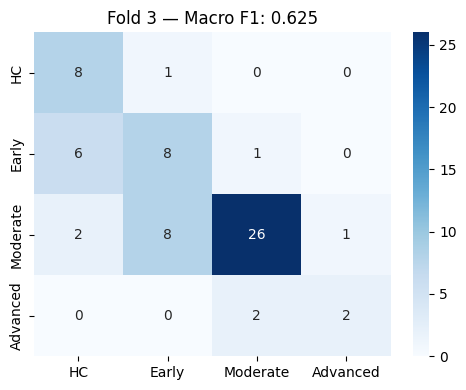

              precision    recall  f1-score   support

          HC       0.50      0.89      0.64         9
       Early       0.47      0.53      0.50        15
    Moderate       0.90      0.70      0.79        37
    Advanced       0.67      0.50      0.57         4

    accuracy                           0.68        65
   macro avg       0.63      0.66      0.62        65
weighted avg       0.73      0.68      0.69        65


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 4/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1109 | Val Loss: 0.1135 | Val Macro F1: 0.4240
  Epoch  10 | Train Loss: 0.0764 | Val Loss: 0.0963 | Val Macro F1: 0.5276
  Epoch  15 | Train Loss: 0.0551 | Val Loss: 0.0937 | Val Macro F1: 0.5459
  Epoch  20 | Train Loss: 0.0423 | Val Loss: 0.1020 | Val Macro F1: 0.5528
  Epoch  25 | Train Loss: 0.0382 | Val Loss: 0.1104 | Val Macro F1: 0.5002
  Early stopping sequence active on Epoch 28. Metric Stable.


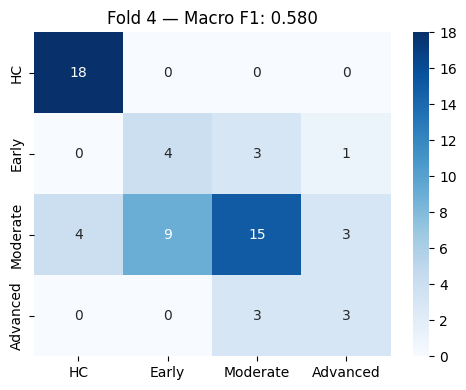

              precision    recall  f1-score   support

          HC       0.82      1.00      0.90        18
       Early       0.31      0.50      0.38         8
    Moderate       0.71      0.48      0.58        31
    Advanced       0.43      0.50      0.46         6

    accuracy                           0.63        63
   macro avg       0.57      0.62      0.58        63
weighted avg       0.67      0.63      0.63        63


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 5/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1123 | Val Loss: 0.1226 | Val Macro F1: 0.3899
  Epoch  10 | Train Loss: 0.0836 | Val Loss: 0.1223 | Val Macro F1: 0.4531
  Epoch  15 | Train Loss: 0.0671 | Val Loss: 0.1216 | Val Macro F1: 0.5388
  Epoch  20 | Train Loss: 0.0503 | Val Loss: 0.1346 | Val Macro F1: 0.5944
  Epoch  25 | Train Loss: 0.0383 | Val Loss: 0.1496 | Val Macro F1: 0.5977
  Epoch  30 | Train Loss: 0.0340 | Val Loss: 0.1561 | Val Macro F1: 0.6140
  Epoch  3

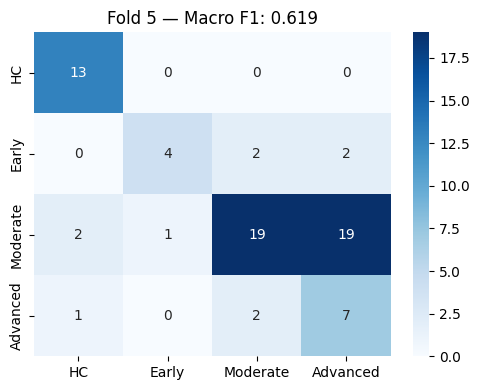

              precision    recall  f1-score   support

          HC       0.81      1.00      0.90        13
       Early       0.80      0.50      0.62         8
    Moderate       0.83      0.46      0.59        41
    Advanced       0.25      0.70      0.37        10

    accuracy                           0.60        72
   macro avg       0.67      0.67      0.62        72
weighted avg       0.74      0.60      0.62        72


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 6/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1103 | Val Loss: 0.1188 | Val Macro F1: 0.4355
  Epoch  10 | Train Loss: 0.0763 | Val Loss: 0.1041 | Val Macro F1: 0.5717
  Epoch  15 | Train Loss: 0.0561 | Val Loss: 0.0946 | Val Macro F1: 0.5746
  Epoch  20 | Train Loss: 0.0435 | Val Loss: 0.0996 | Val Macro F1: 0.5559
  Epoch  25 | Train Loss: 0.0357 | Val Loss: 0.1018 | Val Macro F1: 0.5631
  Early stopping sequence active on Epoch 28. Metric Stable.


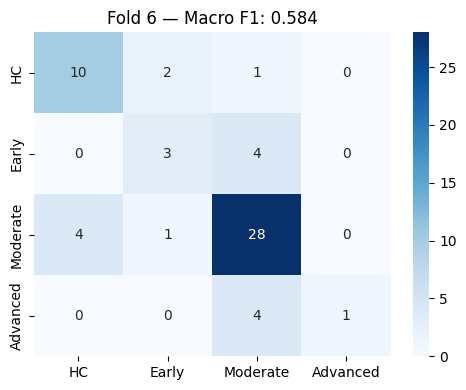

              precision    recall  f1-score   support

          HC       0.71      0.77      0.74        13
       Early       0.50      0.43      0.46         7
    Moderate       0.76      0.85      0.80        33
    Advanced       1.00      0.20      0.33         5

    accuracy                           0.72        58
   macro avg       0.74      0.56      0.58        58
weighted avg       0.74      0.72      0.71        58


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 7/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1023 | Val Loss: 0.1095 | Val Macro F1: 0.4558
  Epoch  10 | Train Loss: 0.0751 | Val Loss: 0.0880 | Val Macro F1: 0.6032
  Epoch  15 | Train Loss: 0.0573 | Val Loss: 0.0817 | Val Macro F1: 0.6177
  Epoch  20 | Train Loss: 0.0453 | Val Loss: 0.0862 | Val Macro F1: 0.6186
  Epoch  25 | Train Loss: 0.0357 | Val Loss: 0.0878 | Val Macro F1: 0.5813
  Epoch  30 | Train Loss: 0.0315 | Val Loss: 0.0917 | Val Macro F1: 0.5813
  Early st

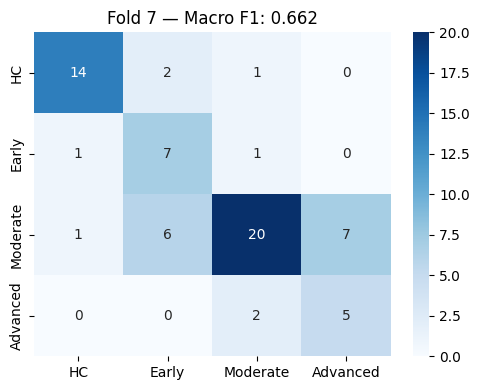

              precision    recall  f1-score   support

          HC       0.88      0.82      0.85        17
       Early       0.47      0.78      0.58         9
    Moderate       0.83      0.59      0.69        34
    Advanced       0.42      0.71      0.53         7

    accuracy                           0.69        67
   macro avg       0.65      0.73      0.66        67
weighted avg       0.75      0.69      0.70        67


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 8/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1065 | Val Loss: 0.1272 | Val Macro F1: 0.4255
  Epoch  10 | Train Loss: 0.0754 | Val Loss: 0.0982 | Val Macro F1: 0.5176
  Epoch  15 | Train Loss: 0.0556 | Val Loss: 0.1024 | Val Macro F1: 0.4856
  Epoch  20 | Train Loss: 0.0411 | Val Loss: 0.1084 | Val Macro F1: 0.5006
  Epoch  25 | Train Loss: 0.0316 | Val Loss: 0.1159 | Val Macro F1: 0.5306
  Epoch  30 | Train Loss: 0.0271 | Val Loss: 0.1297 | Val Macro F1: 0.5000
  Epoch  3

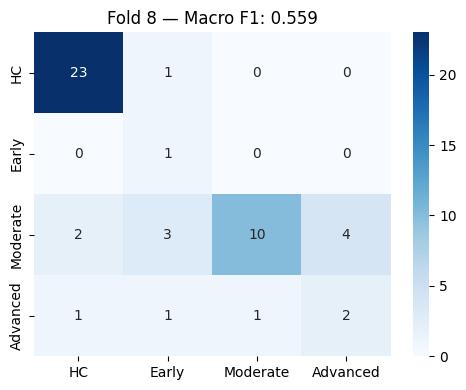

              precision    recall  f1-score   support

          HC       0.88      0.96      0.92        24
       Early       0.17      1.00      0.29         1
    Moderate       0.91      0.53      0.67        19
    Advanced       0.33      0.40      0.36         5

    accuracy                           0.73        49
   macro avg       0.57      0.72      0.56        49
weighted avg       0.82      0.73      0.75        49


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 9/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1152 | Val Loss: 0.1127 | Val Macro F1: 0.3299
  Epoch  10 | Train Loss: 0.0816 | Val Loss: 0.0981 | Val Macro F1: 0.4921
  Epoch  15 | Train Loss: 0.0591 | Val Loss: 0.1015 | Val Macro F1: 0.5428
  Epoch  20 | Train Loss: 0.0445 | Val Loss: 0.1193 | Val Macro F1: 0.4765
  Epoch  25 | Train Loss: 0.0361 | Val Loss: 0.1267 | Val Macro F1: 0.5238
  Epoch  30 | Train Loss: 0.0307 | Val Loss: 0.1319 | Val Macro F1: 0.5256
  Early st

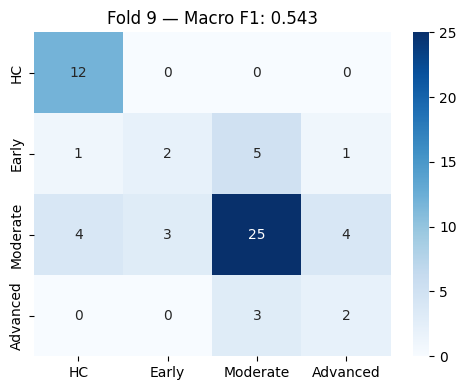

              precision    recall  f1-score   support

          HC       0.71      1.00      0.83        12
       Early       0.40      0.22      0.29         9
    Moderate       0.76      0.69      0.72        36
    Advanced       0.29      0.40      0.33         5

    accuracy                           0.66        62
   macro avg       0.54      0.58      0.54        62
weighted avg       0.66      0.66      0.65        62


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 10/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1077 | Val Loss: 0.1077 | Val Macro F1: 0.4029
  Epoch  10 | Train Loss: 0.0775 | Val Loss: 0.0861 | Val Macro F1: 0.4864
  Epoch  15 | Train Loss: 0.0629 | Val Loss: 0.0769 | Val Macro F1: 0.5090
  Epoch  20 | Train Loss: 0.0477 | Val Loss: 0.0762 | Val Macro F1: 0.6145
  Epoch  25 | Train Loss: 0.0443 | Val Loss: 0.0798 | Val Macro F1: 0.6192
  Epoch  30 | Train Loss: 0.0335 | Val Loss: 0.0825 | Val Macro F1: 0.6324
  Epoch  

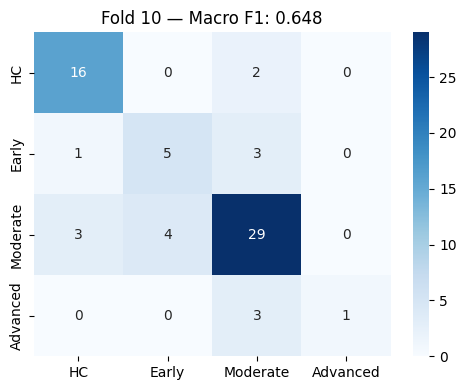

              precision    recall  f1-score   support

          HC       0.80      0.89      0.84        18
       Early       0.56      0.56      0.56         9
    Moderate       0.78      0.81      0.79        36
    Advanced       1.00      0.25      0.40         4

    accuracy                           0.76        67
   macro avg       0.78      0.62      0.65        67
weighted avg       0.77      0.76      0.75        67



In [ ]:
NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 15
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nEXECUTING DIRECT EMBEDDING CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    # Isolate Fold Invariant Index Slices
    c_train_r, c_val_r = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # ── INDEPENDENT STANDARD SCALING (NO PCA BINDING) ──
    scaler_c = StandardScaler()
    c_train = scaler_c.fit_transform(c_train_r)
    c_val = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val = scaler_50.transform(r50_val_r)

    print(f" [Raw Features Connected] -> Clin: {c_train.shape[1]} | R10: {r10_train.shape[1]} | R50: {r50_train.shape[1]}")
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, y_train), batch_size=64, shuffle=True)
    val_loader = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, y_val), batch_size=256, shuffle=False)

    # Re-instantiate model with stable 0.3 dropout
    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1],
        r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1],
        dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)

    # Balanced optimization parameters
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, yb in train_loader:
            xc, xr10, xr50, yb = xc.to(device), xr10.to(device), xr50.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.2, 0.8, 7):
            for t2 in np.linspace(0.2, 0.8, 7):
                for t3 in np.linspace(0.2, 0.8, 7):
                    preds = ((probs[:,0]>t1).astype(int) + (probs[:,1]>t2).astype(int) + (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1, t2, t3]

        scheduler.step(epoch_best_f1)
        history.append({'epoch': epoch+1, 'train_loss': train_loss, 'val_loss': val_loss, 'val_f1': epoch_best_f1})

        if epoch_best_f1 > best_f1:
            best_f1 = epoch_best_f1
            best_thresholds = epoch_best_t
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            patience_cnt = 0
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Macro F1: {epoch_best_f1:.4f}")

        if patience_cnt >= PATIENCE:
            print(f"  Early stopping sequence active on Epoch {epoch+1}. Metric Stable.")
            break

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — Macro F1: {best_f1:.3f}')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

with smote


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 1/10
 [SMOTE] Before: [132  73 317  68]
 [SMOTE] After:  [190 190 317 190]
  Epoch   5 | Train Loss: 0.0912 | Val Loss: 0.1136 | Val F1: 0.5619 | Val Acc: 0.6406
  Epoch  10 | Train Loss: 0.0515 | Val Loss: 0.1164 | Val F1: 0.4482 | Val Acc: 0.5625
  Epoch  15 | Train Loss: 0.0362 | Val Loss: 0.1284 | Val F1: 0.4541 | Val Acc: 0.5312
  Epoch  20 | Train Loss: 0.0275 | Val Loss: 0.1350 | Val F1: 0.4211 | Val Acc: 0.5000
  Early stopping on Epoch 22.


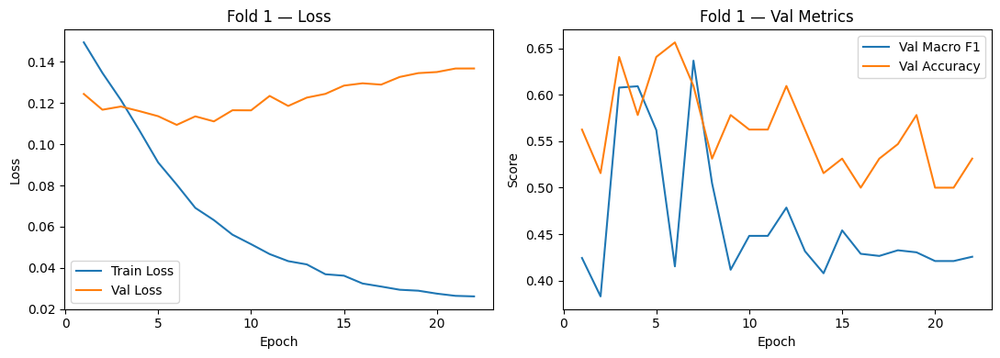

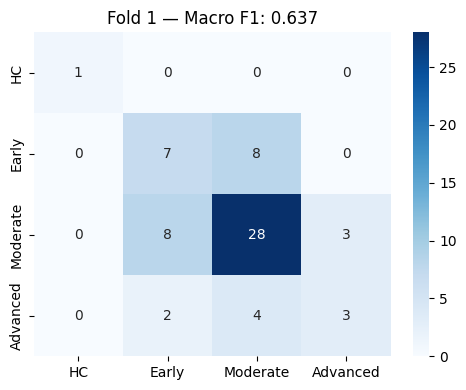

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.41      0.47      0.44        15
    Moderate       0.70      0.72      0.71        39
    Advanced       0.50      0.33      0.40         9

    accuracy                           0.61        64
   macro avg       0.65      0.63      0.64        64
weighted avg       0.61      0.61      0.61        64


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 2/10
 [SMOTE] Before: [125  81 306  55]
 [SMOTE] After:  [183 183 306 183]
  Epoch   5 | Train Loss: 0.0913 | Val Loss: 0.1193 | Val F1: 0.4658 | Val Acc: 0.5057
  Epoch  10 | Train Loss: 0.0592 | Val Loss: 0.1223 | Val F1: 0.6145 | Val Acc: 0.7356
  Epoch  15 | Train Loss: 0.0399 | Val Loss: 0.1381 | Val F1: 0.6034 | Val Acc: 0.6897
  Epoch  20 | Train Loss: 0.0298 | Val Loss: 0.1504 | Val F1: 0.5721 | Val Acc: 0.6207
  Epoch  25 | Train Loss: 0.0240 | Val Loss: 0.1571 | Val F1: 0.5969 | Val Acc: 0.6322
  Early stoppin

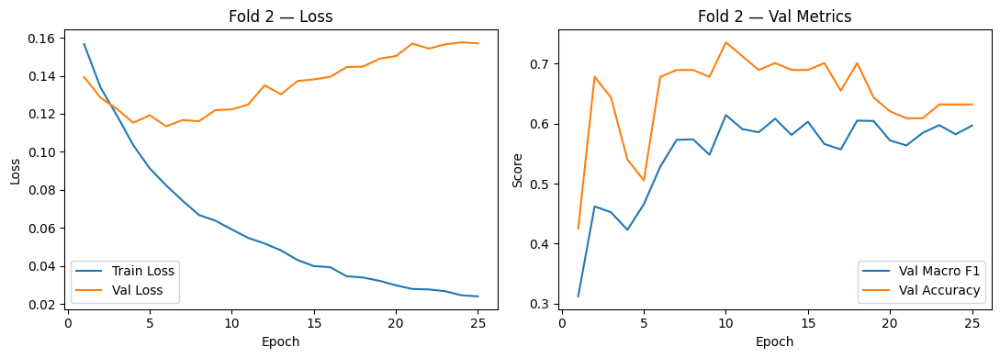

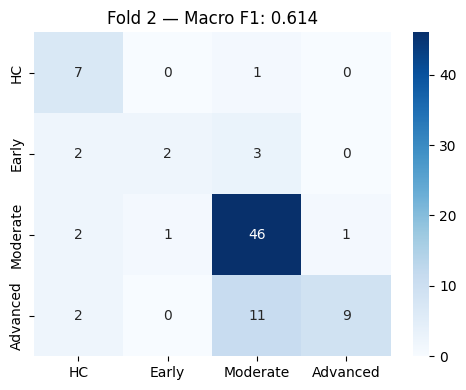

              precision    recall  f1-score   support

          HC       0.54      0.88      0.67         8
       Early       0.67      0.29      0.40         7
    Moderate       0.75      0.92      0.83        50
    Advanced       0.90      0.41      0.56        22

    accuracy                           0.74        87
   macro avg       0.71      0.62      0.61        87
weighted avg       0.76      0.74      0.71        87


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 3/10
 [SMOTE] Before: [124  73 319  73]
 [SMOTE] After:  [191 191 319 191]
  Epoch   5 | Train Loss: 0.0883 | Val Loss: 0.0858 | Val F1: 0.4873 | Val Acc: 0.6308
  Epoch  10 | Train Loss: 0.0569 | Val Loss: 0.0727 | Val F1: 0.5750 | Val Acc: 0.6308
  Epoch  15 | Train Loss: 0.0405 | Val Loss: 0.0686 | Val F1: 0.5660 | Val Acc: 0.6308
  Epoch  20 | Train Loss: 0.0325 | Val Loss: 0.0694 | Val F1: 0.5983 | Val Acc: 0.6308
  Epoch  25 | Train Loss: 0.0272 | Val Loss: 0.0718 | Val F1: 0.5998 | Val Acc: 0.5846
  Epoch  30 | T

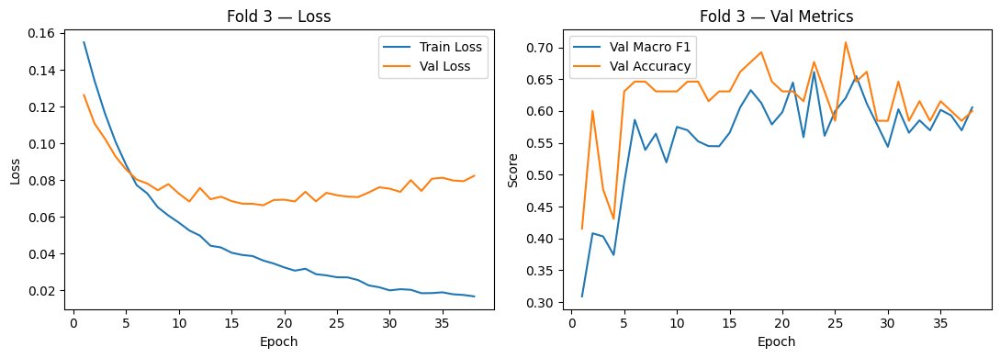

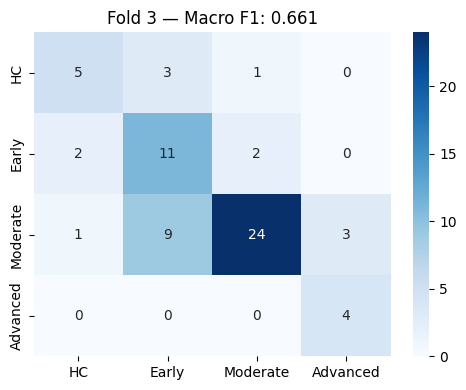

              precision    recall  f1-score   support

          HC       0.62      0.56      0.59         9
       Early       0.48      0.73      0.58        15
    Moderate       0.89      0.65      0.75        37
    Advanced       0.57      1.00      0.73         4

    accuracy                           0.68        65
   macro avg       0.64      0.73      0.66        65
weighted avg       0.74      0.68      0.69        65


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 4/10
 [SMOTE] Before: [115  80 325  71]
 [SMOTE] After:  [195 195 325 195]
  Epoch   5 | Train Loss: 0.0884 | Val Loss: 0.0996 | Val F1: 0.5083 | Val Acc: 0.5714
  Epoch  10 | Train Loss: 0.0543 | Val Loss: 0.0980 | Val F1: 0.6276 | Val Acc: 0.6667
  Epoch  15 | Train Loss: 0.0363 | Val Loss: 0.1149 | Val F1: 0.5887 | Val Acc: 0.7302
  Epoch  20 | Train Loss: 0.0267 | Val Loss: 0.1269 | Val F1: 0.6094 | Val Acc: 0.7460
  Epoch  25 | Train Loss: 0.0200 | Val Loss: 0.1326 | Val F1: 0.5859 | Val Acc: 0.7302
  Early stoppin

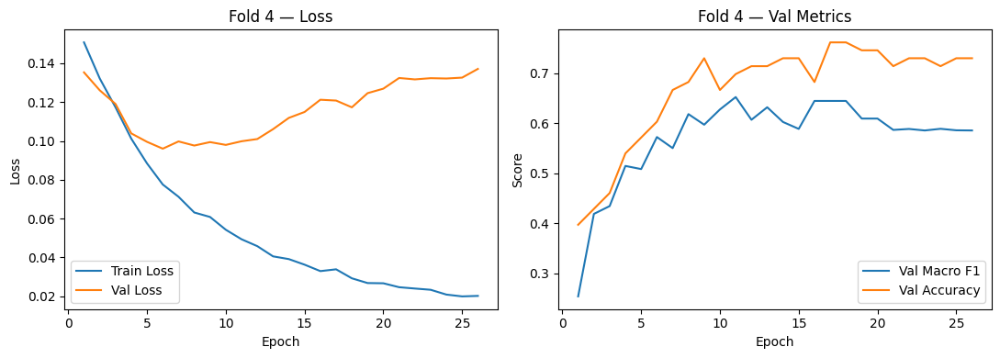

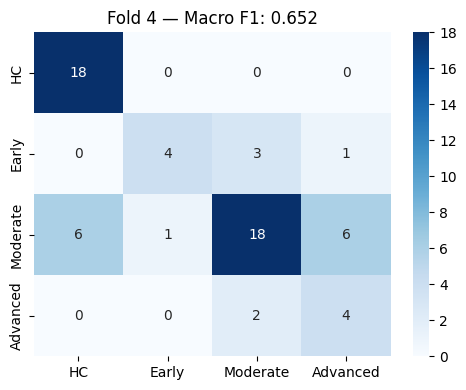

              precision    recall  f1-score   support

          HC       0.75      1.00      0.86        18
       Early       0.80      0.50      0.62         8
    Moderate       0.78      0.58      0.67        31
    Advanced       0.36      0.67      0.47         6

    accuracy                           0.70        63
   macro avg       0.67      0.69      0.65        63
weighted avg       0.74      0.70      0.70        63


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 5/10
 [SMOTE] Before: [120  80 315  67]
 [SMOTE] After:  [189 189 315 189]
  Epoch   5 | Train Loss: 0.0913 | Val Loss: 0.1183 | Val F1: 0.5078 | Val Acc: 0.5139
  Epoch  10 | Train Loss: 0.0533 | Val Loss: 0.1172 | Val F1: 0.5811 | Val Acc: 0.5972
  Epoch  15 | Train Loss: 0.0379 | Val Loss: 0.1309 | Val F1: 0.5452 | Val Acc: 0.5556
  Epoch  20 | Train Loss: 0.0259 | Val Loss: 0.1493 | Val F1: 0.5967 | Val Acc: 0.7222
  Epoch  25 | Train Loss: 0.0213 | Val Loss: 0.1655 | Val F1: 0.5810 | Val Acc: 0.5556
  Epoch  30 | T

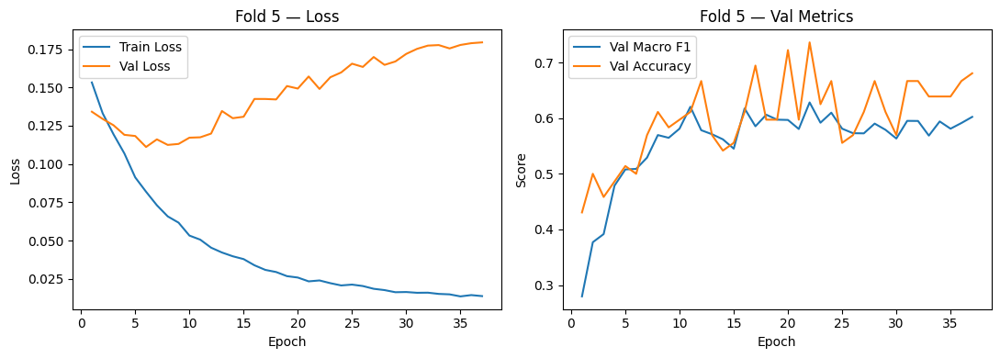

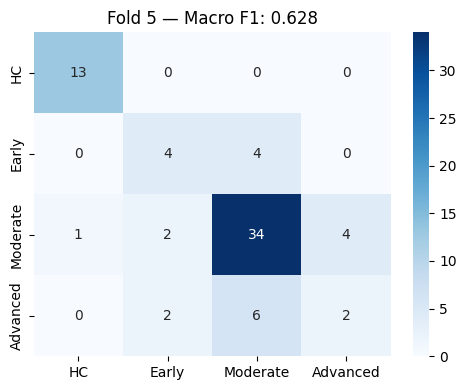

              precision    recall  f1-score   support

          HC       0.93      1.00      0.96        13
       Early       0.50      0.50      0.50         8
    Moderate       0.77      0.83      0.80        41
    Advanced       0.33      0.20      0.25        10

    accuracy                           0.74        72
   macro avg       0.63      0.63      0.63        72
weighted avg       0.71      0.74      0.72        72


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 6/10
 [SMOTE] Before: [120  81 323  72]
 [SMOTE] After:  [193 193 323 193]
  Epoch   5 | Train Loss: 0.0926 | Val Loss: 0.1071 | Val F1: 0.5372 | Val Acc: 0.6034
  Epoch  10 | Train Loss: 0.0600 | Val Loss: 0.0973 | Val F1: 0.5607 | Val Acc: 0.6552
  Epoch  15 | Train Loss: 0.0432 | Val Loss: 0.1034 | Val F1: 0.5420 | Val Acc: 0.6207
  Epoch  20 | Train Loss: 0.0335 | Val Loss: 0.1035 | Val F1: 0.5706 | Val Acc: 0.6724
  Epoch  25 | Train Loss: 0.0273 | Val Loss: 0.1227 | Val F1: 0.5382 | Val Acc: 0.6379
  Early stoppin

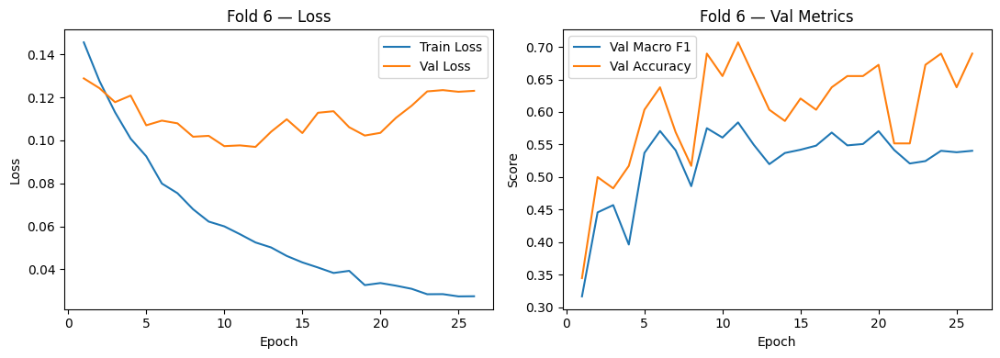

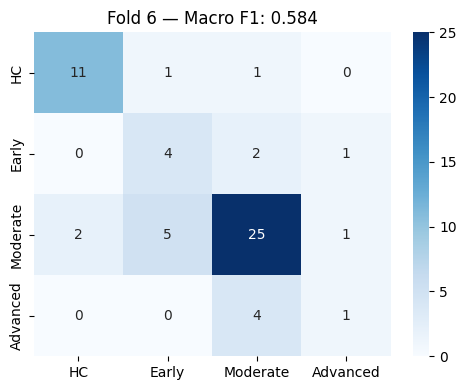

              precision    recall  f1-score   support

          HC       0.85      0.85      0.85        13
       Early       0.40      0.57      0.47         7
    Moderate       0.78      0.76      0.77        33
    Advanced       0.33      0.20      0.25         5

    accuracy                           0.71        58
   macro avg       0.59      0.59      0.58        58
weighted avg       0.71      0.71      0.71        58


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 7/10
 [SMOTE] Before: [116  79 322  70]
 [SMOTE] After:  [193 193 322 193]
  Epoch   5 | Train Loss: 0.0860 | Val Loss: 0.0974 | Val F1: 0.5352 | Val Acc: 0.5522
  Epoch  10 | Train Loss: 0.0566 | Val Loss: 0.0890 | Val F1: 0.5876 | Val Acc: 0.6269
  Epoch  15 | Train Loss: 0.0463 | Val Loss: 0.0949 | Val F1: 0.5873 | Val Acc: 0.6269
  Epoch  20 | Train Loss: 0.0317 | Val Loss: 0.1063 | Val F1: 0.6190 | Val Acc: 0.6119
  Epoch  25 | Train Loss: 0.0263 | Val Loss: 0.1116 | Val F1: 0.6226 | Val Acc: 0.6567
  Early stoppin

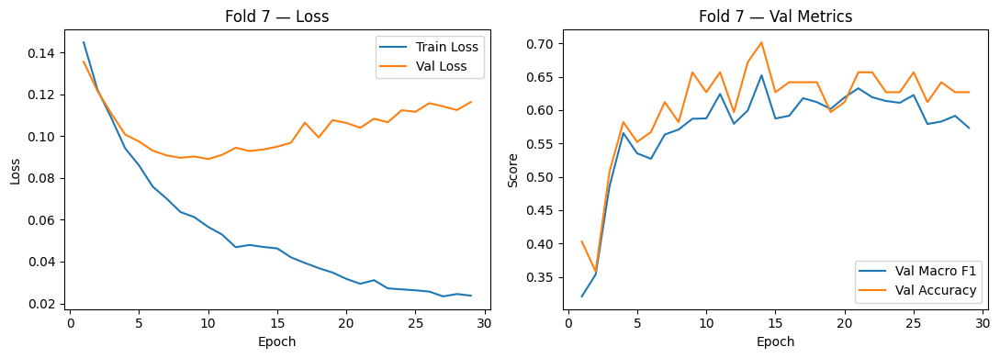

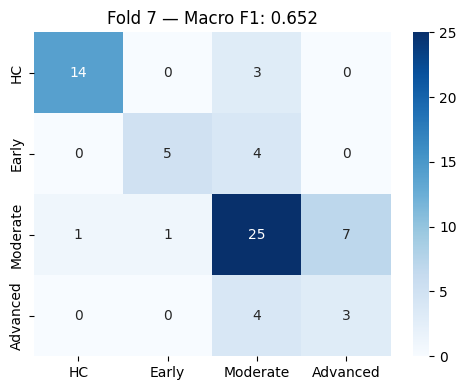

              precision    recall  f1-score   support

          HC       0.93      0.82      0.88        17
       Early       0.83      0.56      0.67         9
    Moderate       0.69      0.74      0.71        34
    Advanced       0.30      0.43      0.35         7

    accuracy                           0.70        67
   macro avg       0.69      0.64      0.65        67
weighted avg       0.73      0.70      0.71        67


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 8/10
 [SMOTE] Before: [109  87 337  72]
 [SMOTE] After:  [202 202 337 202]
  Epoch   5 | Train Loss: 0.0869 | Val Loss: 0.0978 | Val F1: 0.5426 | Val Acc: 0.7347
  Epoch  10 | Train Loss: 0.0549 | Val Loss: 0.1056 | Val F1: 0.5282 | Val Acc: 0.7143
  Epoch  15 | Train Loss: 0.0377 | Val Loss: 0.1162 | Val F1: 0.5939 | Val Acc: 0.7959
  Epoch  20 | Train Loss: 0.0278 | Val Loss: 0.1341 | Val F1: 0.5950 | Val Acc: 0.7755
  Epoch  25 | Train Loss: 0.0187 | Val Loss: 0.1456 | Val F1: 0.6827 | Val Acc: 0.7347
  Epoch  30 | T

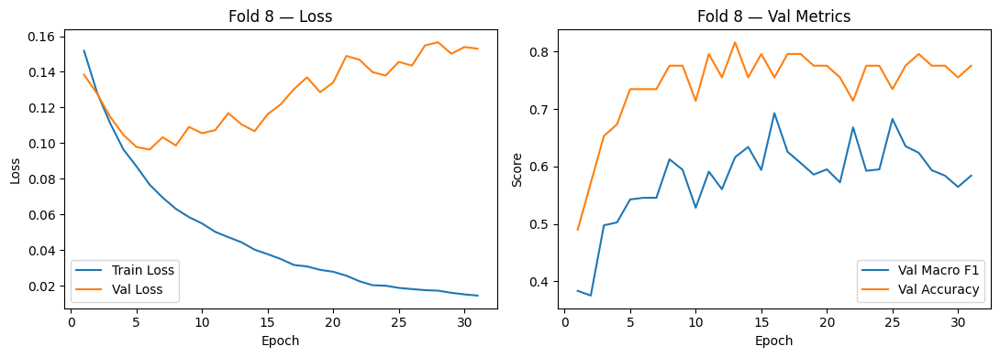

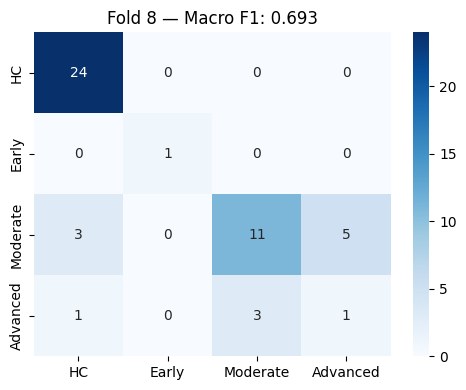

              precision    recall  f1-score   support

          HC       0.86      1.00      0.92        24
       Early       1.00      1.00      1.00         1
    Moderate       0.79      0.58      0.67        19
    Advanced       0.17      0.20      0.18         5

    accuracy                           0.76        49
   macro avg       0.70      0.69      0.69        49
weighted avg       0.76      0.76      0.75        49


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 9/10
 [SMOTE] Before: [121  79 320  72]
 [SMOTE] After:  [192 192 320 192]
  Epoch   5 | Train Loss: 0.0956 | Val Loss: 0.1054 | Val F1: 0.4452 | Val Acc: 0.5645
  Epoch  10 | Train Loss: 0.0609 | Val Loss: 0.1035 | Val F1: 0.4593 | Val Acc: 0.6129
  Epoch  15 | Train Loss: 0.0409 | Val Loss: 0.1075 | Val F1: 0.5044 | Val Acc: 0.6452
  Epoch  20 | Train Loss: 0.0301 | Val Loss: 0.1240 | Val F1: 0.5793 | Val Acc: 0.6613
  Epoch  25 | Train Loss: 0.0211 | Val Loss: 0.1519 | Val F1: 0.5475 | Val Acc: 0.6129
  Epoch  30 | T

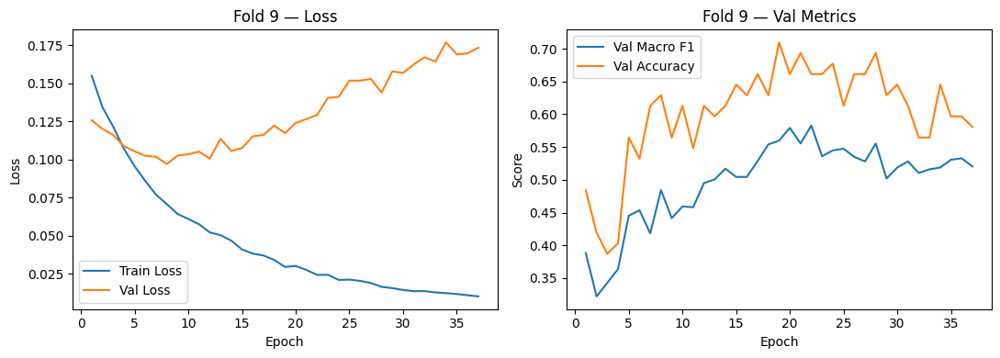

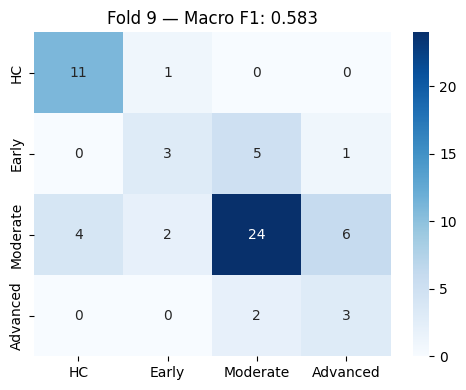

              precision    recall  f1-score   support

          HC       0.73      0.92      0.81        12
       Early       0.50      0.33      0.40         9
    Moderate       0.77      0.67      0.72        36
    Advanced       0.30      0.60      0.40         5

    accuracy                           0.66        62
   macro avg       0.58      0.63      0.58        62
weighted avg       0.69      0.66      0.66        62


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 10/10
 [SMOTE] Before: [115  79 320  73]
 [SMOTE] After:  [192 192 320 192]
  Epoch   5 | Train Loss: 0.0899 | Val Loss: 0.0911 | Val F1: 0.4932 | Val Acc: 0.6269
  Epoch  10 | Train Loss: 0.0547 | Val Loss: 0.0805 | Val F1: 0.5914 | Val Acc: 0.7015
  Epoch  15 | Train Loss: 0.0363 | Val Loss: 0.0824 | Val F1: 0.6725 | Val Acc: 0.7313
  Epoch  20 | Train Loss: 0.0254 | Val Loss: 0.0941 | Val F1: 0.6318 | Val Acc: 0.6866
  Epoch  25 | Train Loss: 0.0184 | Val Loss: 0.0965 | Val F1: 0.6193 | Val Acc: 0.6866
  Epoch  30 | 

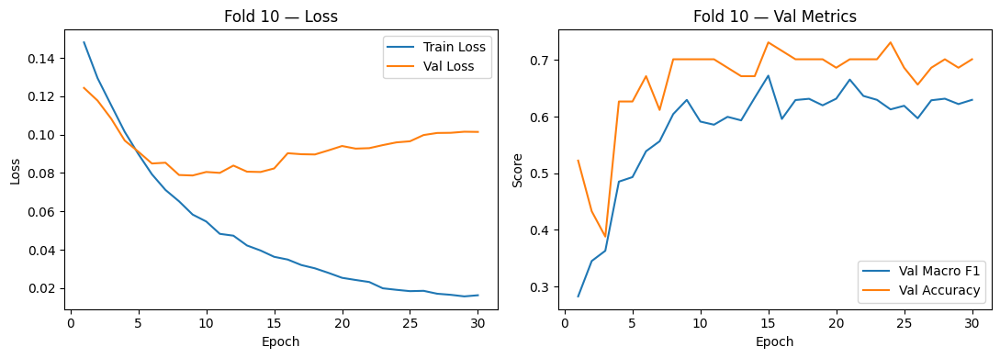

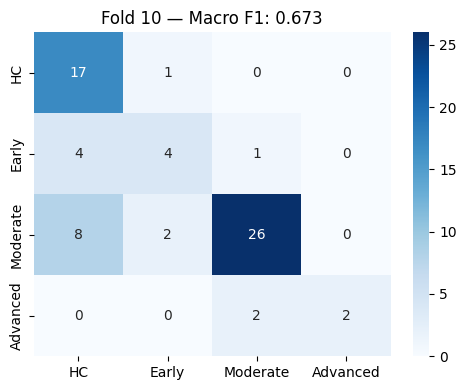

              precision    recall  f1-score   support

          HC       0.59      0.94      0.72        18
       Early       0.57      0.44      0.50         9
    Moderate       0.90      0.72      0.80        36
    Advanced       1.00      0.50      0.67         4

    accuracy                           0.73        67
   macro avg       0.76      0.65      0.67        67
weighted avg       0.78      0.73      0.73        67


OVERALL OOF MACRO F1: 0.6322


In [ ]:
from imblearn.over_sampling import SMOTE
from sklearn.metrics import accuracy_score
import pandas as pd

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 15
SMOTE_TARGET_RATIO = 0.6  # minority classes raised to 60% of majority count per fold; use 1.0 for full balance
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nEXECUTING DIRECT EMBEDDING CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r     = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    y_train, y_val         = y[train_idx], y[val_idx]

    scaler_c = StandardScaler()
    c_train = scaler_c.fit_transform(c_train_r)
    c_val   = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val   = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val   = scaler_50.transform(r50_val_r)

    # ── SMOTE: fit on concatenated train blocks so one interpolation ratio applies
    # consistently across clinical + R10 + R50 for each synthetic sample ──
    c_dim, r10_dim, r50_dim = c_train.shape[1], r10_train.shape[1], r50_train.shape[1]
    X_train_concat = np.concatenate([c_train, r10_train, r50_train], axis=1)

    pre_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [SMOTE] Before: {pre_counts}")
    majority_count = pre_counts.max()
    sampling_strategy = {c: max(pre_counts[c], int(majority_count * SMOTE_TARGET_RATIO)) for c in range(NUM_CLASSES)}
    sampling_strategy = {c: n for c, n in sampling_strategy.items() if n > pre_counts[c]}

    if sampling_strategy:
        smallest_involved = min(pre_counts[c] for c in sampling_strategy)
        k_neighbors = max(1, min(5, smallest_involved - 1))
        smote = SMOTE(sampling_strategy=sampling_strategy, k_neighbors=k_neighbors, random_state=42)
        X_train_concat, y_train = smote.fit_resample(X_train_concat, y_train)

    c_train   = X_train_concat[:, :c_dim]
    r10_train = X_train_concat[:, c_dim:c_dim + r10_dim]
    r50_train = X_train_concat[:, c_dim + r10_dim:]

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [SMOTE] After:  {class_counts}")

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1], r50_dim=r50_train.shape[1], dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, yb in train_loader:
            xc, xr10, xr50, yb = xc.to(device), xr10.to(device), xr50.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.2, 0.8, 7):
            for t2 in np.linspace(0.2, 0.8, 7):
                for t3 in np.linspace(0.2, 0.8, 7):
                    preds = ((probs[:,0]>t1).astype(int) + (probs[:,1]>t2).astype(int) + (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1, t2, t3]

        # NEW: accuracy at this epoch's best thresholds, for the accuracy curve
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        scheduler.step(epoch_best_f1)
        history.append({'epoch': epoch+1, 'train_loss': train_loss, 'val_loss': val_loss,
                         'val_f1': epoch_best_f1, 'val_acc': epoch_val_acc})

        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    # ── Loss + F1/accuracy curves for this fold ──
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df['epoch'], hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df['epoch'], hist_df['val_loss'], label='Val Loss')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss'); axes[0].set_title(f'Fold {fold+1} — Loss'); axes[0].legend()

    axes[1].plot(hist_df['epoch'], hist_df['val_f1'], label='Val Macro F1')
    axes[1].plot(hist_df['epoch'], hist_df['val_acc'], label='Val Accuracy')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Score'); axes[1].set_title(f'Fold {fold+1} — Val Metrics'); axes[1].legend()
    plt.tight_layout()
    plt.show()
    plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — Macro F1: {best_f1:.3f}')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")

without smote


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 1/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1071 | Val Loss: 0.1122 | Val F1: 0.4582 | Val Acc: 0.5781
  Epoch  10 | Train Loss: 0.0760 | Val Loss: 0.1045 | Val F1: 0.4714 | Val Acc: 0.5625
  Epoch  15 | Train Loss: 0.0623 | Val Loss: 0.1092 | Val F1: 0.4642 | Val Acc: 0.5156
  Early stopping on Epoch 19.


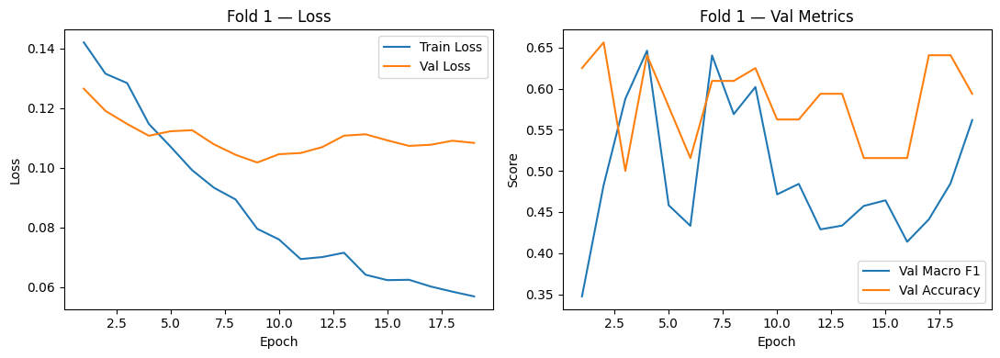

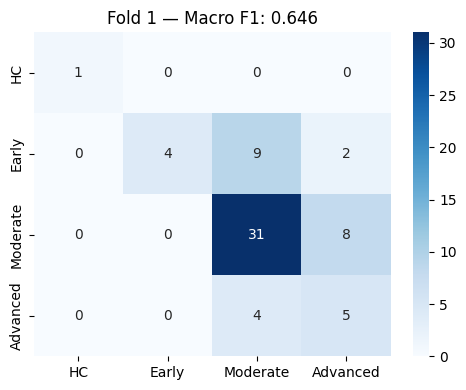

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       1.00      0.27      0.42        15
    Moderate       0.70      0.79      0.75        39
    Advanced       0.33      0.56      0.42         9

    accuracy                           0.64        64
   macro avg       0.76      0.65      0.65        64
weighted avg       0.73      0.64      0.63        64


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 2/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1058 | Val Loss: 0.1616 | Val F1: 0.3878 | Val Acc: 0.4253
  Epoch  10 | Train Loss: 0.0744 | Val Loss: 0.1712 | Val F1: 0.5371 | Val Acc: 0.5977
  Epoch  15 | Train Loss: 0.0564 | Val Loss: 0.1925 | Val F1: 0.6404 | Val Acc: 0.6552
  Epoch  20 | Train Loss: 0.0436 | Val Loss: 0.2353 | Val F1: 0.6701 | Val Acc: 0.7011
  Epoch  25 | Train Loss: 0.0361 | Val Loss: 0.2728 | Val F1: 0.6293 | Val Acc: 0.6782
  Epoch  30 | Train Loss:

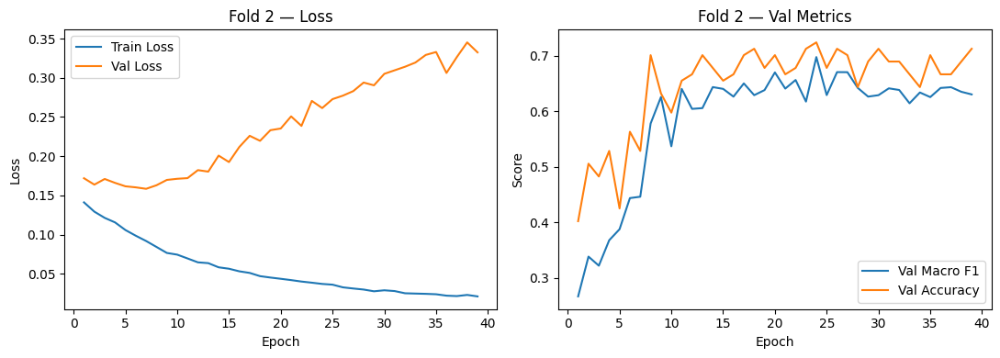

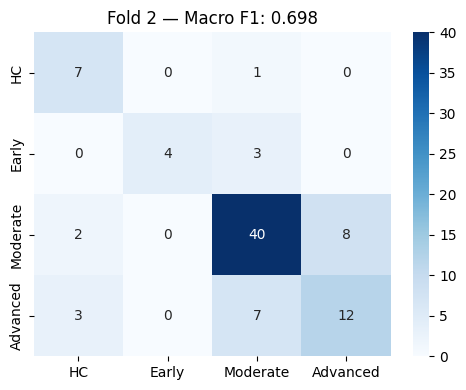

              precision    recall  f1-score   support

          HC       0.58      0.88      0.70         8
       Early       1.00      0.57      0.73         7
    Moderate       0.78      0.80      0.79        50
    Advanced       0.60      0.55      0.57        22

    accuracy                           0.72        87
   macro avg       0.74      0.70      0.70        87
weighted avg       0.74      0.72      0.72        87


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 3/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1119 | Val Loss: 0.1062 | Val F1: 0.4705 | Val Acc: 0.5692
  Epoch  10 | Train Loss: 0.0782 | Val Loss: 0.0844 | Val F1: 0.5476 | Val Acc: 0.6769
  Epoch  15 | Train Loss: 0.0628 | Val Loss: 0.0760 | Val F1: 0.5242 | Val Acc: 0.6000
  Epoch  20 | Train Loss: 0.0529 | Val Loss: 0.0806 | Val F1: 0.5076 | Val Acc: 0.6769
  Epoch  25 | Train Loss: 0.0483 | Val Loss: 0.0777 | Val F1: 0.5152 | Val Acc: 0.6308
  Early stopping on Epoch

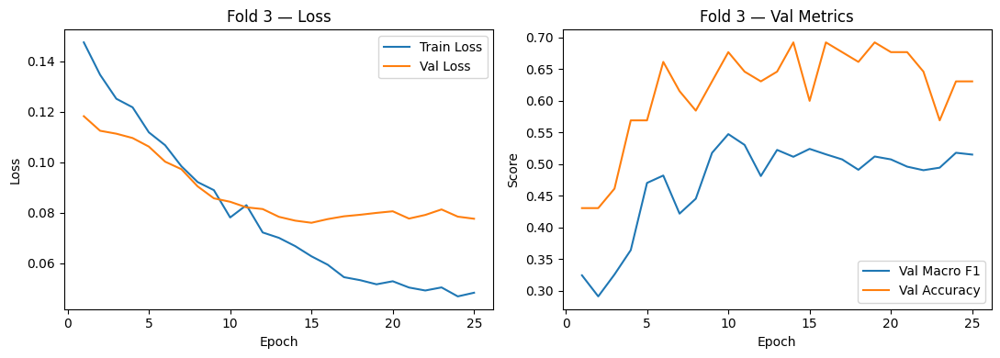

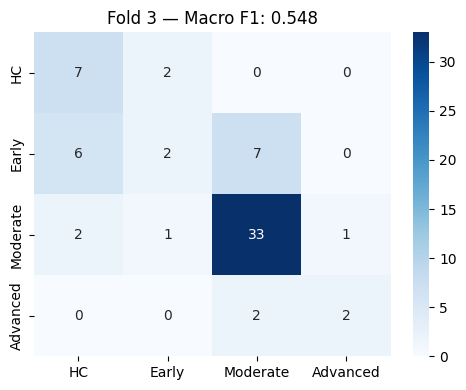

              precision    recall  f1-score   support

          HC       0.47      0.78      0.58         9
       Early       0.40      0.13      0.20        15
    Moderate       0.79      0.89      0.84        37
    Advanced       0.67      0.50      0.57         4

    accuracy                           0.68        65
   macro avg       0.58      0.58      0.55        65
weighted avg       0.65      0.68      0.64        65


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 4/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1033 | Val Loss: 0.1109 | Val F1: 0.5138 | Val Acc: 0.5873
  Epoch  10 | Train Loss: 0.0766 | Val Loss: 0.0974 | Val F1: 0.5271 | Val Acc: 0.6190
  Epoch  15 | Train Loss: 0.0607 | Val Loss: 0.1021 | Val F1: 0.5477 | Val Acc: 0.6825
  Epoch  20 | Train Loss: 0.0469 | Val Loss: 0.0983 | Val F1: 0.6092 | Val Acc: 0.7143
  Epoch  25 | Train Loss: 0.0399 | Val Loss: 0.1041 | Val F1: 0.6092 | Val Acc: 0.6984
  Epoch  30 | Train Loss:

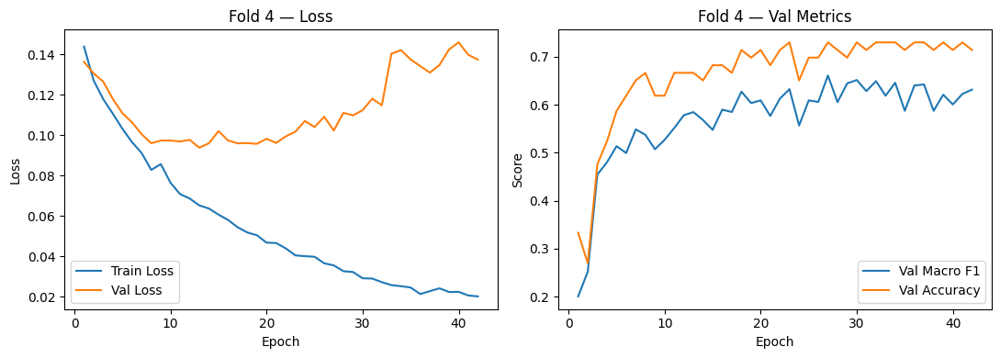

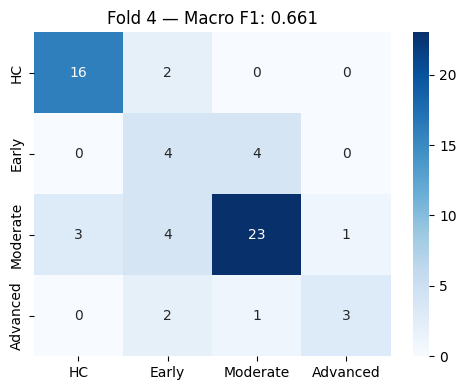

              precision    recall  f1-score   support

          HC       0.84      0.89      0.86        18
       Early       0.33      0.50      0.40         8
    Moderate       0.82      0.74      0.78        31
    Advanced       0.75      0.50      0.60         6

    accuracy                           0.73        63
   macro avg       0.69      0.66      0.66        63
weighted avg       0.76      0.73      0.74        63


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 5/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1196 | Val Loss: 0.1289 | Val F1: 0.4388 | Val Acc: 0.5278
  Epoch  10 | Train Loss: 0.0875 | Val Loss: 0.1177 | Val F1: 0.4572 | Val Acc: 0.4722
  Epoch  15 | Train Loss: 0.0620 | Val Loss: 0.1220 | Val F1: 0.5605 | Val Acc: 0.6389
  Epoch  20 | Train Loss: 0.0594 | Val Loss: 0.1291 | Val F1: 0.5566 | Val Acc: 0.5278
  Epoch  25 | Train Loss: 0.0515 | Val Loss: 0.1283 | Val F1: 0.5702 | Val Acc: 0.6250
  Epoch  30 | Train Loss:

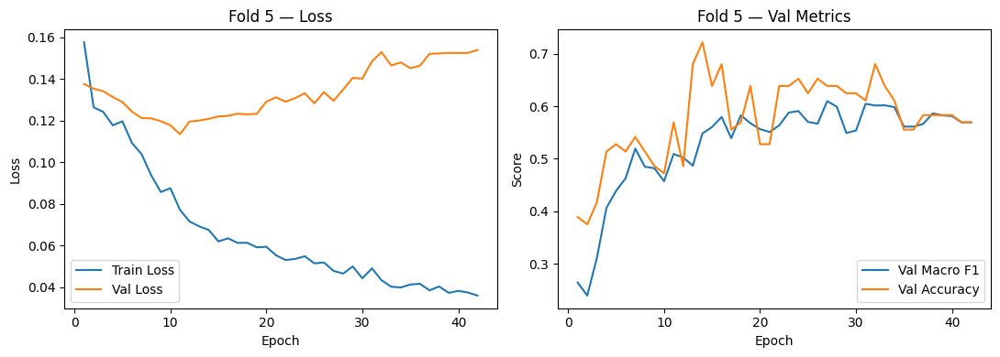

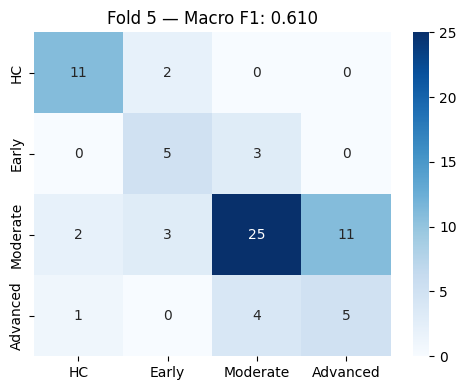

              precision    recall  f1-score   support

          HC       0.79      0.85      0.81        13
       Early       0.50      0.62      0.56         8
    Moderate       0.78      0.61      0.68        41
    Advanced       0.31      0.50      0.38        10

    accuracy                           0.64        72
   macro avg       0.59      0.65      0.61        72
weighted avg       0.69      0.64      0.65        72


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 6/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1105 | Val Loss: 0.1136 | Val F1: 0.4752 | Val Acc: 0.5690
  Epoch  10 | Train Loss: 0.0778 | Val Loss: 0.0928 | Val F1: 0.6381 | Val Acc: 0.6897
  Epoch  15 | Train Loss: 0.0582 | Val Loss: 0.0916 | Val F1: 0.6377 | Val Acc: 0.7241
  Epoch  20 | Train Loss: 0.0449 | Val Loss: 0.0986 | Val F1: 0.6587 | Val Acc: 0.7414
  Epoch  25 | Train Loss: 0.0395 | Val Loss: 0.0950 | Val F1: 0.6775 | Val Acc: 0.7586
  Early stopping on Epoch

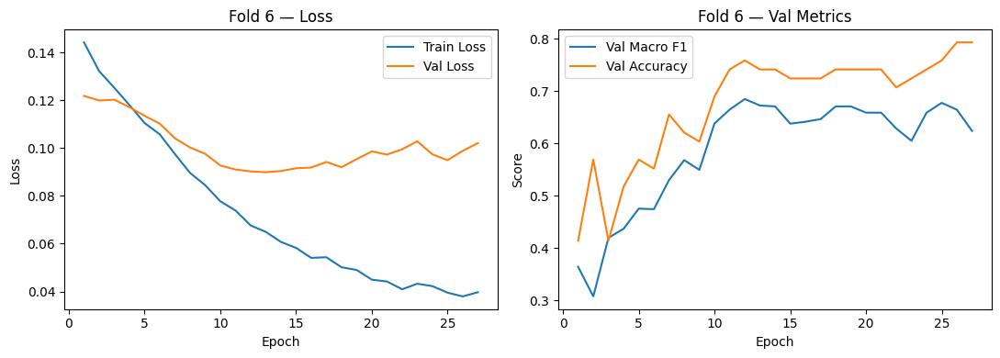

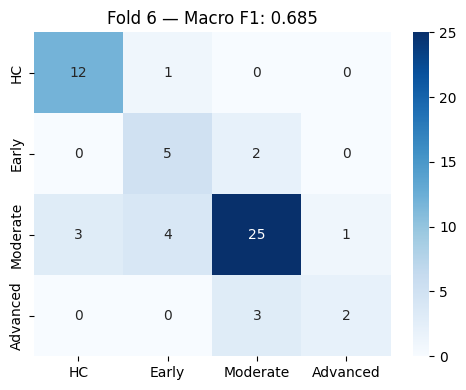

              precision    recall  f1-score   support

          HC       0.80      0.92      0.86        13
       Early       0.50      0.71      0.59         7
    Moderate       0.83      0.76      0.79        33
    Advanced       0.67      0.40      0.50         5

    accuracy                           0.76        58
   macro avg       0.70      0.70      0.68        58
weighted avg       0.77      0.76      0.76        58


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 7/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1160 | Val Loss: 0.1231 | Val F1: 0.3956 | Val Acc: 0.4627
  Epoch  10 | Train Loss: 0.0829 | Val Loss: 0.0977 | Val F1: 0.5917 | Val Acc: 0.6269
  Epoch  15 | Train Loss: 0.0633 | Val Loss: 0.0934 | Val F1: 0.5790 | Val Acc: 0.6269
  Epoch  20 | Train Loss: 0.0545 | Val Loss: 0.0894 | Val F1: 0.6135 | Val Acc: 0.6866
  Epoch  25 | Train Loss: 0.0502 | Val Loss: 0.0899 | Val F1: 0.6327 | Val Acc: 0.6418
  Epoch  30 | Train Loss:

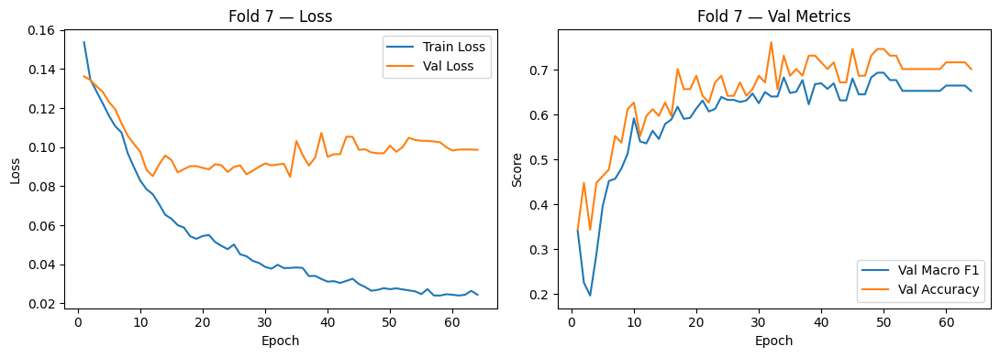

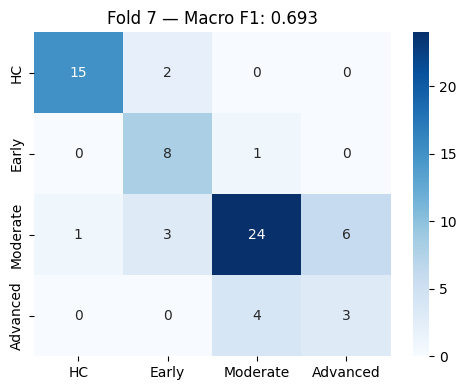

              precision    recall  f1-score   support

          HC       0.94      0.88      0.91        17
       Early       0.62      0.89      0.73         9
    Moderate       0.83      0.71      0.76        34
    Advanced       0.33      0.43      0.38         7

    accuracy                           0.75        67
   macro avg       0.68      0.73      0.69        67
weighted avg       0.78      0.75      0.75        67


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 8/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1054 | Val Loss: 0.1253 | Val F1: 0.4368 | Val Acc: 0.5918
  Epoch  10 | Train Loss: 0.0711 | Val Loss: 0.1170 | Val F1: 0.5469 | Val Acc: 0.7347
  Epoch  15 | Train Loss: 0.0546 | Val Loss: 0.1166 | Val F1: 0.6025 | Val Acc: 0.7959
  Epoch  20 | Train Loss: 0.0413 | Val Loss: 0.1393 | Val F1: 0.5819 | Val Acc: 0.7347
  Epoch  25 | Train Loss: 0.0345 | Val Loss: 0.1522 | Val F1: 0.5559 | Val Acc: 0.7551
  Early stopping on Epoch

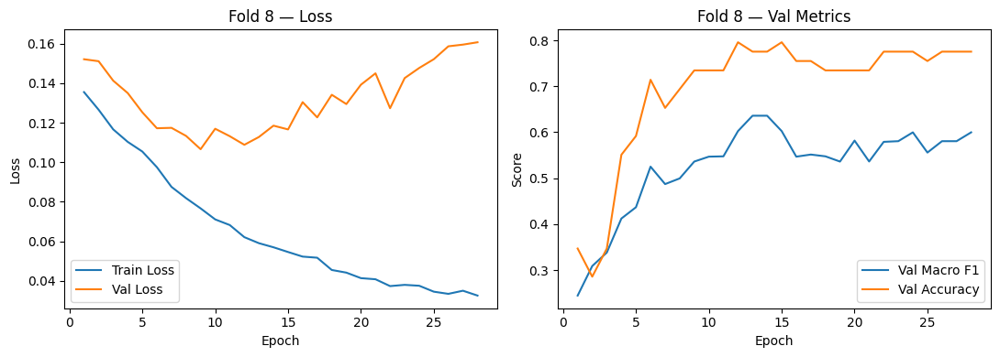

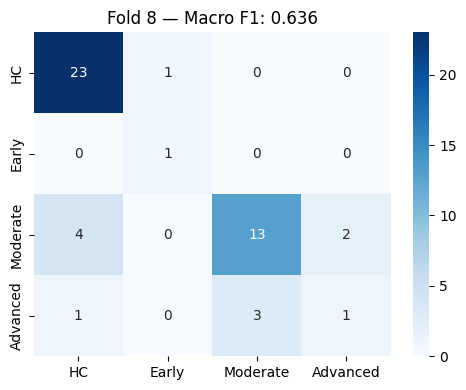

              precision    recall  f1-score   support

          HC       0.82      0.96      0.88        24
       Early       0.50      1.00      0.67         1
    Moderate       0.81      0.68      0.74        19
    Advanced       0.33      0.20      0.25         5

    accuracy                           0.78        49
   macro avg       0.62      0.71      0.64        49
weighted avg       0.76      0.78      0.76        49


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 9/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1131 | Val Loss: 0.1152 | Val F1: 0.3626 | Val Acc: 0.5000
  Epoch  10 | Train Loss: 0.0754 | Val Loss: 0.0968 | Val F1: 0.5046 | Val Acc: 0.6129
  Epoch  15 | Train Loss: 0.0626 | Val Loss: 0.1011 | Val F1: 0.4552 | Val Acc: 0.5484
  Epoch  20 | Train Loss: 0.0496 | Val Loss: 0.1079 | Val F1: 0.5211 | Val Acc: 0.6129
  Epoch  25 | Train Loss: 0.0459 | Val Loss: 0.1195 | Val F1: 0.5156 | Val Acc: 0.6129
  Epoch  30 | Train Loss:

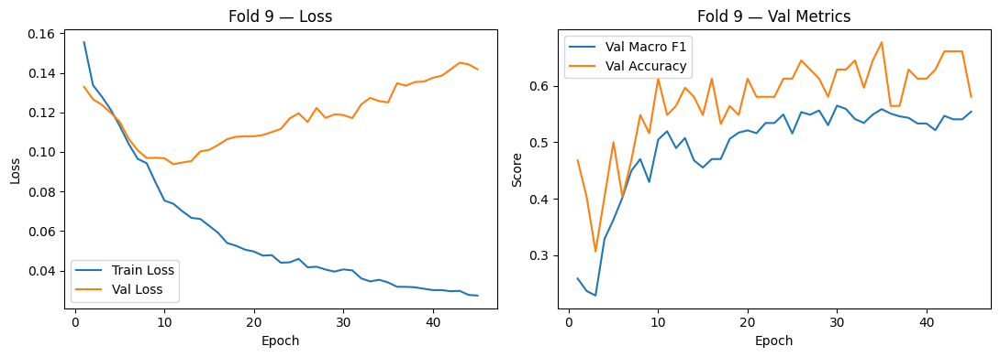

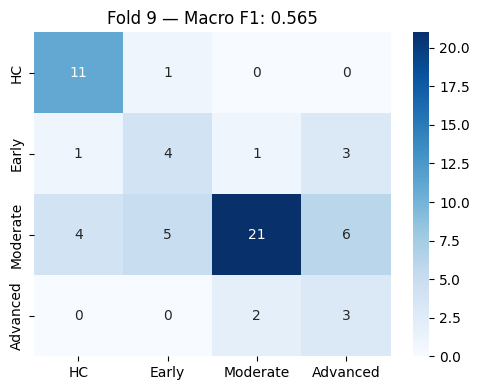

              precision    recall  f1-score   support

          HC       0.69      0.92      0.79        12
       Early       0.40      0.44      0.42         9
    Moderate       0.88      0.58      0.70        36
    Advanced       0.25      0.60      0.35         5

    accuracy                           0.63        62
   macro avg       0.55      0.64      0.56        62
weighted avg       0.72      0.63      0.65        62


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 10/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1173 | Val Loss: 0.1124 | Val F1: 0.3965 | Val Acc: 0.5522
  Epoch  10 | Train Loss: 0.0868 | Val Loss: 0.0862 | Val F1: 0.5389 | Val Acc: 0.6269
  Epoch  15 | Train Loss: 0.0630 | Val Loss: 0.0811 | Val F1: 0.5315 | Val Acc: 0.6269
  Epoch  20 | Train Loss: 0.0564 | Val Loss: 0.0784 | Val F1: 0.5615 | Val Acc: 0.6716
  Epoch  25 | Train Loss: 0.0417 | Val Loss: 0.0871 | Val F1: 0.5807 | Val Acc: 0.7015
  Epoch  30 | Train Loss

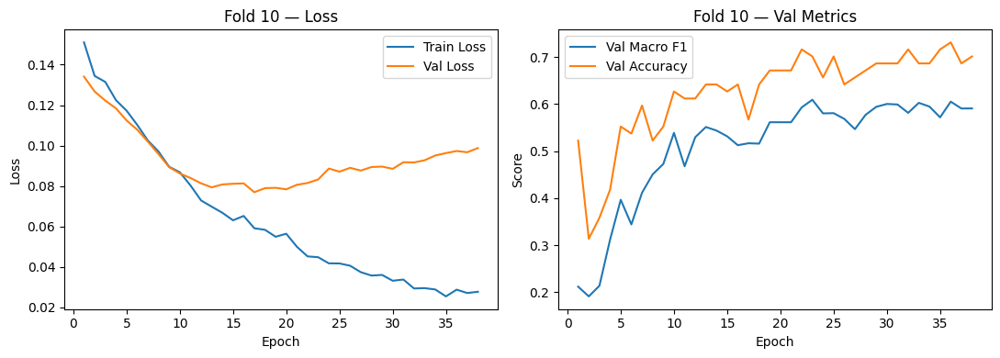

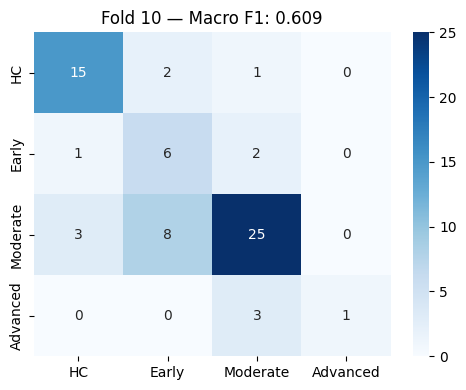

              precision    recall  f1-score   support

          HC       0.79      0.83      0.81        18
       Early       0.38      0.67      0.48         9
    Moderate       0.81      0.69      0.75        36
    Advanced       1.00      0.25      0.40         4

    accuracy                           0.70        67
   macro avg       0.74      0.61      0.61        67
weighted avg       0.76      0.70      0.71        67


OVERALL OOF MACRO F1: 0.6323


In [ ]:
from sklearn.metrics import accuracy_score
import pandas as pd

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 15
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nEXECUTING DIRECT EMBEDDING CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r     = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    y_train, y_val         = y[train_idx], y[val_idx]

    scaler_c = StandardScaler()
    c_train = scaler_c.fit_transform(c_train_r)
    c_val   = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val   = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val   = scaler_50.transform(r50_val_r)

    print(f" [Raw Features Connected] -> Clin: {c_train.shape[1]} | R10: {r10_train.shape[1]} | R50: {r50_train.shape[1]}")
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1], r50_dim=r50_train.shape[1], dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, yb in train_loader:
            xc, xr10, xr50, yb = xc.to(device), xr10.to(device), xr50.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.2, 0.8, 7):
            for t2 in np.linspace(0.2, 0.8, 7):
                for t3 in np.linspace(0.2, 0.8, 7):
                    preds = ((probs[:,0]>t1).astype(int) + (probs[:,1]>t2).astype(int) + (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1, t2, t3]

        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        scheduler.step(epoch_best_f1)
        history.append({'epoch': epoch+1, 'train_loss': train_loss, 'val_loss': val_loss,
                         'val_f1': epoch_best_f1, 'val_acc': epoch_val_acc})

        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    # ── Loss + F1/accuracy curves for this fold ──
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df['epoch'], hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df['epoch'], hist_df['val_loss'], label='Val Loss')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss'); axes[0].set_title(f'Fold {fold+1} — Loss'); axes[0].legend()

    axes[1].plot(hist_df['epoch'], hist_df['val_f1'], label='Val Macro F1')
    axes[1].plot(hist_df['epoch'], hist_df['val_acc'], label='Val Accuracy')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Score'); axes[1].set_title(f'Fold {fold+1} — Val Metrics'); axes[1].legend()
    plt.tight_layout()
    plt.show()
    plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — Macro F1: {best_f1:.3f}')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 1/10
 [Group check] Train patients: 239 | Val patients: 23 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 1/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1120 | Val Loss: 0.1123 | Val F1: 0.5399 | Val Acc: 0.6406
  Epoch  10 | Train Loss: 0.0857 | Val Loss: 0.1037 | Val F1: 0.3994 | Val Acc: 0.5781
  Epoch  15 | Train Loss: 0.0677 | Val Loss: 0.1028 | Val F1: 0.4013 | Val Acc: 0.6719
  Early stopping on Epoch 18.


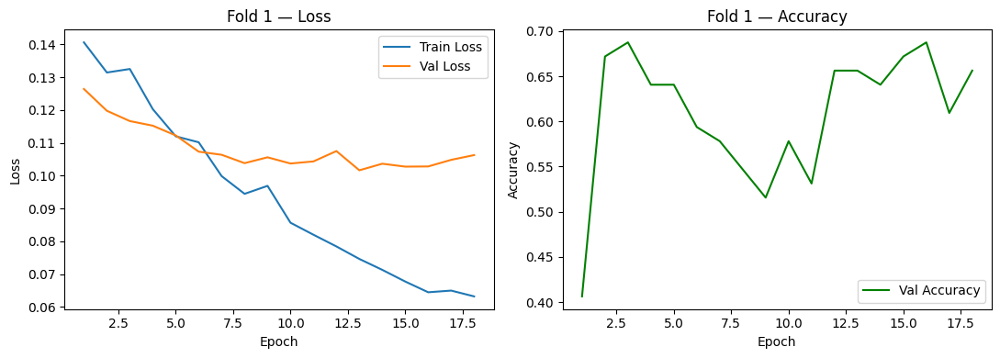

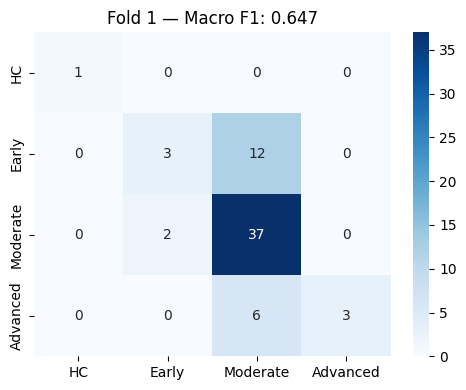

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.60      0.20      0.30        15
    Moderate       0.67      0.95      0.79        39
    Advanced       1.00      0.33      0.50         9

    accuracy                           0.69        64
   macro avg       0.82      0.62      0.65        64
weighted avg       0.71      0.69      0.64        64


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 2/10
 [Group check] Train patients: 233 | Val patients: 29 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 2/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1197 | Val Loss: 0.1514 | Val F1: 0.3720 | Val Acc: 0.5977
  Epoch  10 | Train Loss: 0.0869 | Val Loss: 0.1473 | Val F1: 0.5264 | Val Acc: 0.6552
  Epoch  15 | Train Loss: 0.0652 | Val Loss: 0.1607 | Val F1: 0.5552 | Val Acc: 0.6552
  Epoch  20 | Train Loss: 0.0543 | Val Loss: 0.1811 | Val F1: 0.5810 | Val Acc: 0.6552


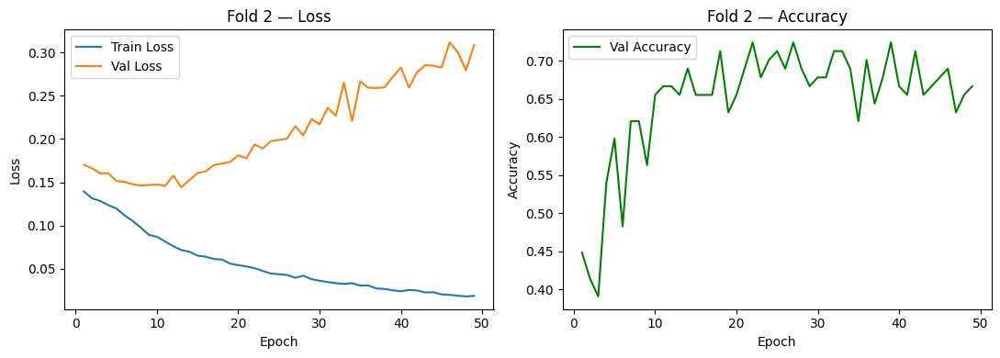

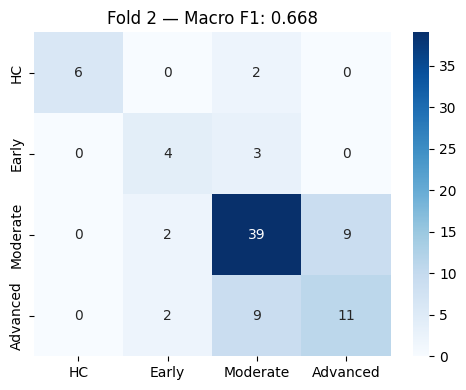

              precision    recall  f1-score   support

          HC       1.00      0.75      0.86         8
       Early       0.50      0.57      0.53         7
    Moderate       0.74      0.78      0.76        50
    Advanced       0.55      0.50      0.52        22

    accuracy                           0.69        87
   macro avg       0.70      0.65      0.67        87
weighted avg       0.69      0.69      0.69        87


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 3/10
 [Group check] Train patients: 235 | Val patients: 27 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 3/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1171 | Val Loss: 0.1028 | Val F1: 0.4072 | Val Acc: 0.5231
  Epoch  10 | Train Loss: 0.0843 | Val Loss: 0.0790 | Val F1: 0.5783 | Val Acc: 0.6769
  Epoch  15 | Train Loss: 0.0700 | Val Loss: 0.0687 | Val F1: 0.6336 | Val Acc: 0.7385
  Epoch  20 | Train Loss: 0.0608 | Val Loss: 0.0700 | Val F1: 0.5381 | Val Acc: 0.6462


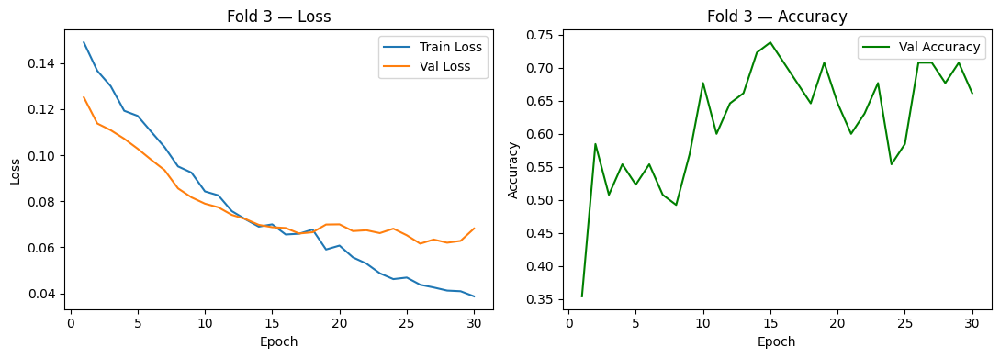

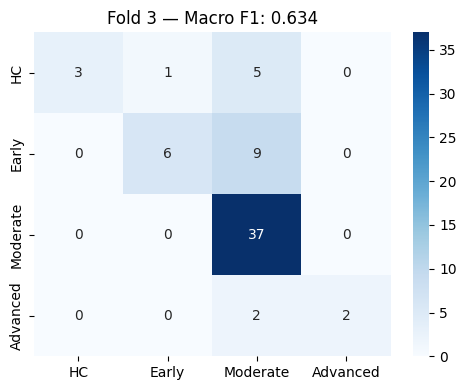

              precision    recall  f1-score   support

          HC       1.00      0.33      0.50         9
       Early       0.86      0.40      0.55        15
    Moderate       0.70      1.00      0.82        37
    Advanced       1.00      0.50      0.67         4

    accuracy                           0.74        65
   macro avg       0.89      0.56      0.63        65
weighted avg       0.80      0.74      0.70        65


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 4/10
 [Group check] Train patients: 235 | Val patients: 27 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 4/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1166 | Val Loss: 0.1175 | Val F1: 0.3988 | Val Acc: 0.4127
  Epoch  10 | Train Loss: 0.0901 | Val Loss: 0.0980 | Val F1: 0.5272 | Val Acc: 0.6667
  Epoch  15 | Train Loss: 0.0709 | Val Loss: 0.0963 | Val F1: 0.5447 | Val Acc: 0.6032
  Epoch  20 | Train Loss: 0.0529 | Val Loss: 0.1037 | Val F1: 0.5170 | Val Acc: 0.5873


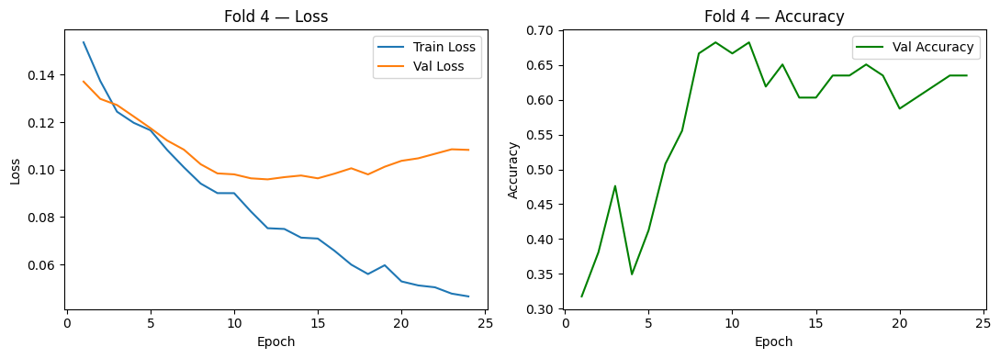

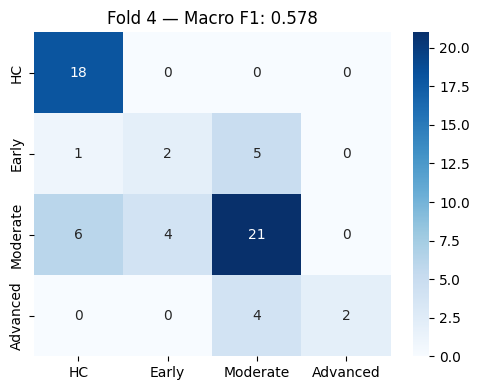

              precision    recall  f1-score   support

          HC       0.72      1.00      0.84        18
       Early       0.33      0.25      0.29         8
    Moderate       0.70      0.68      0.69        31
    Advanced       1.00      0.33      0.50         6

    accuracy                           0.68        63
   macro avg       0.69      0.57      0.58        63
weighted avg       0.69      0.68      0.66        63


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 5/10
 [Group check] Train patients: 236 | Val patients: 26 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 5/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1176 | Val Loss: 0.1280 | Val F1: 0.3881 | Val Acc: 0.4722
  Epoch  10 | Train Loss: 0.0861 | Val Loss: 0.1140 | Val F1: 0.5431 | Val Acc: 0.7361
  Epoch  15 | Train Loss: 0.0678 | Val Loss: 0.1206 | Val F1: 0.5679 | Val Acc: 0.4861
  Epoch  20 | Train Loss: 0.0608 | Val Loss: 0.1213 | Val F1: 0.6380 | Val Acc: 0.7361


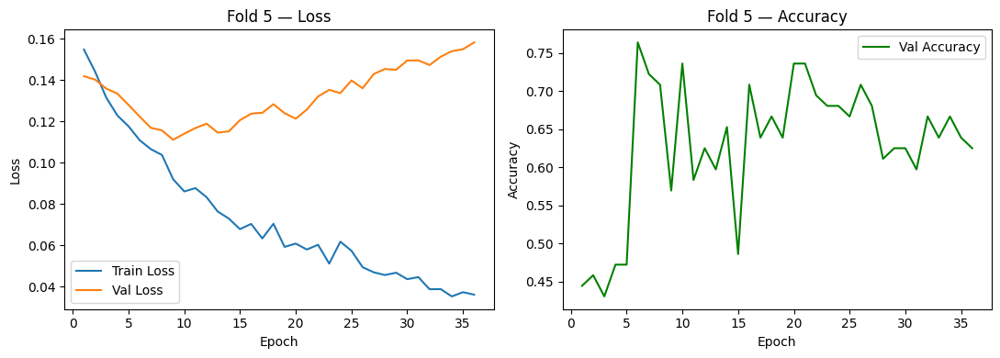

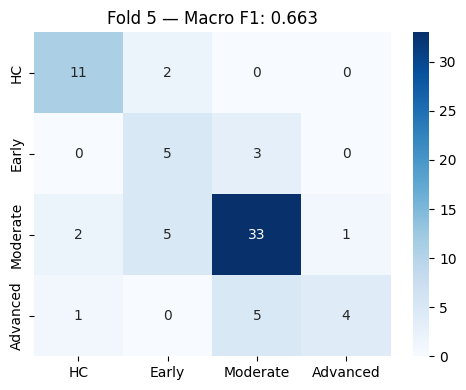

              precision    recall  f1-score   support

          HC       0.79      0.85      0.81        13
       Early       0.42      0.62      0.50         8
    Moderate       0.80      0.80      0.80        41
    Advanced       0.80      0.40      0.53        10

    accuracy                           0.74        72
   macro avg       0.70      0.67      0.66        72
weighted avg       0.76      0.74      0.74        72


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 6/10
 [Group check] Train patients: 237 | Val patients: 25 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 6/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1143 | Val Loss: 0.1228 | Val F1: 0.3543 | Val Acc: 0.4138
  Epoch  10 | Train Loss: 0.0908 | Val Loss: 0.1095 | Val F1: 0.4481 | Val Acc: 0.4828
  Epoch  15 | Train Loss: 0.0697 | Val Loss: 0.0977 | Val F1: 0.5833 | Val Acc: 0.7241
  Epoch  20 | Train Loss: 0.0566 | Val Loss: 0.0991 | Val F1: 0.5940 | Val Acc: 0.7241


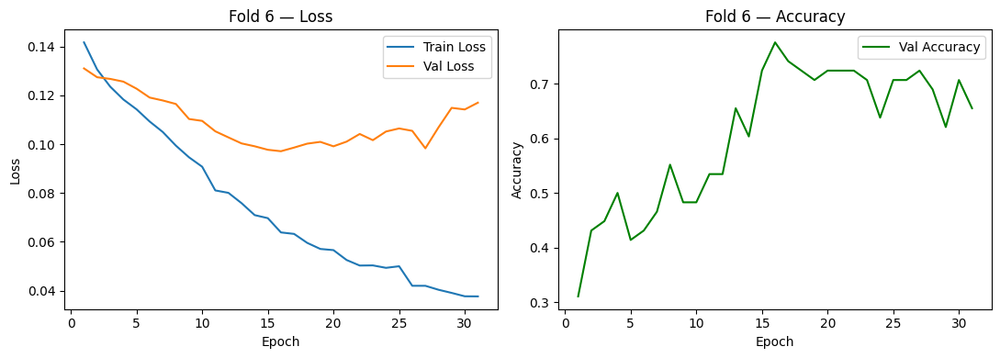

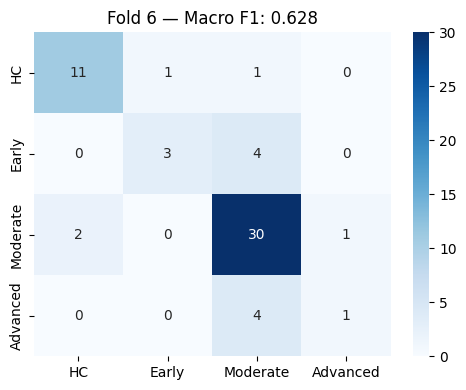

              precision    recall  f1-score   support

          HC       0.85      0.85      0.85        13
       Early       0.75      0.43      0.55         7
    Moderate       0.77      0.91      0.83        33
    Advanced       0.50      0.20      0.29         5

    accuracy                           0.78        58
   macro avg       0.72      0.60      0.63        58
weighted avg       0.76      0.78      0.75        58


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 7/10
 [Group check] Train patients: 234 | Val patients: 28 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 7/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1200 | Val Loss: 0.1317 | Val F1: 0.3238 | Val Acc: 0.3433
  Epoch  10 | Train Loss: 0.0924 | Val Loss: 0.1052 | Val F1: 0.5048 | Val Acc: 0.5970
  Epoch  15 | Train Loss: 0.0711 | Val Loss: 0.0950 | Val F1: 0.5652 | Val Acc: 0.6119
  Epoch  20 | Train Loss: 0.0589 | Val Loss: 0.0887 | Val F1: 0.6227 | Val Acc: 0.6418


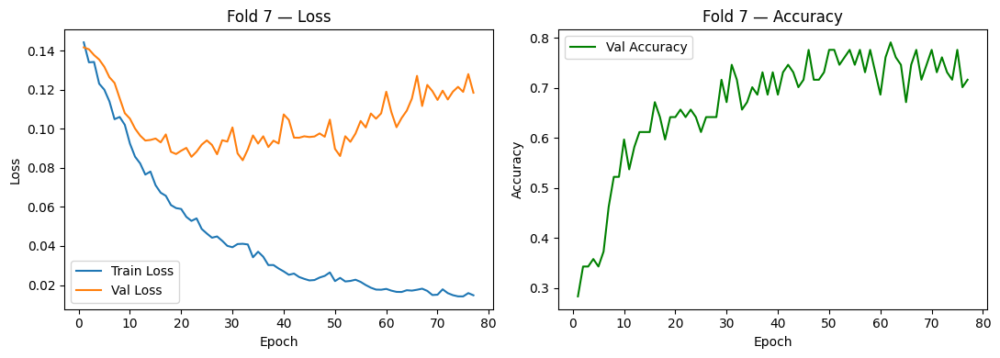

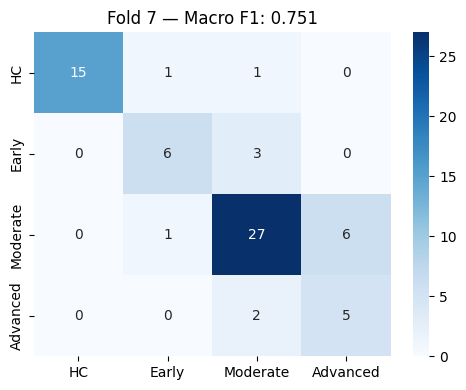

              precision    recall  f1-score   support

          HC       1.00      0.88      0.94        17
       Early       0.75      0.67      0.71         9
    Moderate       0.82      0.79      0.81        34
    Advanced       0.45      0.71      0.56         7

    accuracy                           0.79        67
   macro avg       0.76      0.76      0.75        67
weighted avg       0.82      0.79      0.80        67


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 8/10
 [Group check] Train patients: 239 | Val patients: 23 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 8/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1121 | Val Loss: 0.1331 | Val F1: 0.3826 | Val Acc: 0.4694
  Epoch  10 | Train Loss: 0.0832 | Val Loss: 0.1220 | Val F1: 0.5078 | Val Acc: 0.7755
  Epoch  15 | Train Loss: 0.0666 | Val Loss: 0.1169 | Val F1: 0.5192 | Val Acc: 0.8367
  Epoch  20 | Train Loss: 0.0546 | Val Loss: 0.1158 | Val F1: 0.5147 | Val Acc: 0.6735


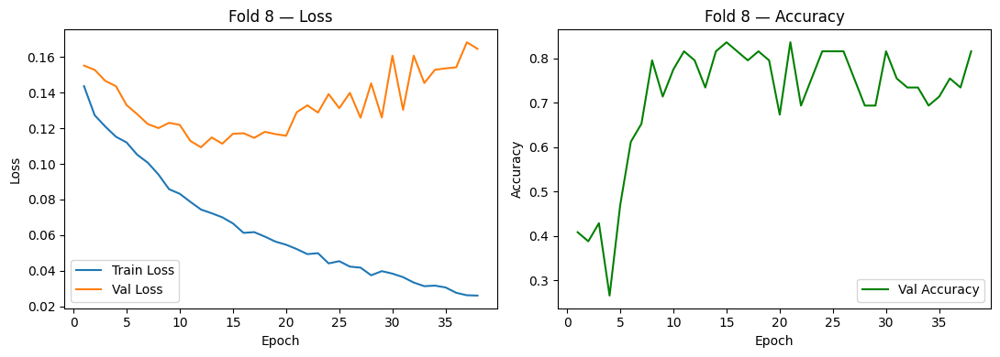

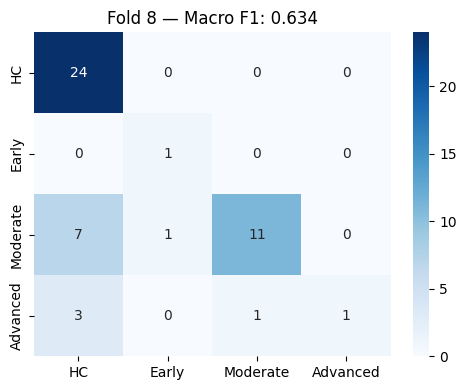

              precision    recall  f1-score   support

          HC       0.71      1.00      0.83        24
       Early       0.50      1.00      0.67         1
    Moderate       0.92      0.58      0.71        19
    Advanced       1.00      0.20      0.33         5

    accuracy                           0.76        49
   macro avg       0.78      0.69      0.63        49
weighted avg       0.81      0.76      0.73        49


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 9/10
 [Group check] Train patients: 237 | Val patients: 25 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 9/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1232 | Val Loss: 0.1170 | Val F1: 0.3796 | Val Acc: 0.5000
  Epoch  10 | Train Loss: 0.0905 | Val Loss: 0.1019 | Val F1: 0.5553 | Val Acc: 0.5968
  Epoch  15 | Train Loss: 0.0641 | Val Loss: 0.1018 | Val F1: 0.5342 | Val Acc: 0.5968
  Epoch  20 | Train Loss: 0.0550 | Val Loss: 0.1024 | Val F1: 0.5843 | Val Acc: 0.6452


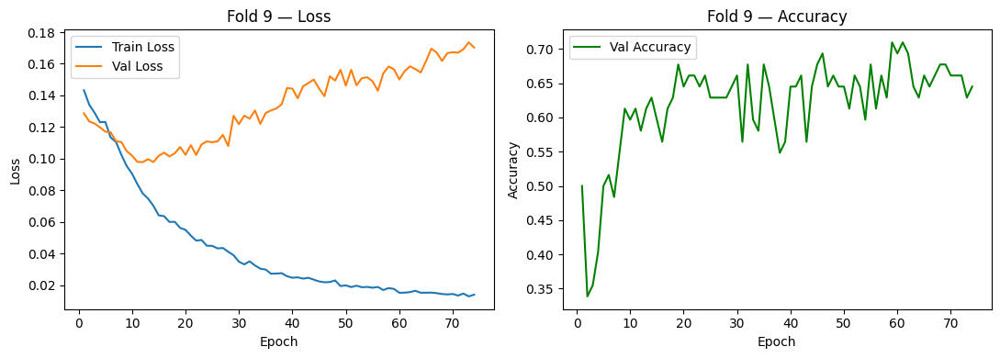

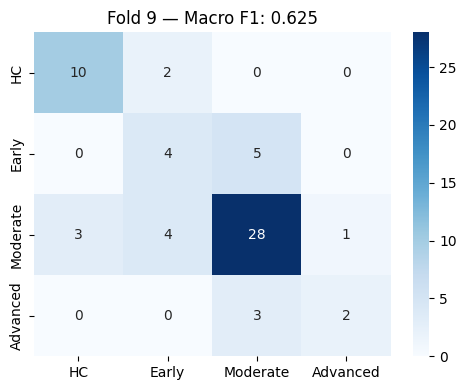

              precision    recall  f1-score   support

          HC       0.77      0.83      0.80        12
       Early       0.40      0.44      0.42         9
    Moderate       0.78      0.78      0.78        36
    Advanced       0.67      0.40      0.50         5

    accuracy                           0.71        62
   macro avg       0.65      0.61      0.62        62
weighted avg       0.71      0.71      0.71        62


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 10/10
 [Group check] Train patients: 233 | Val patients: 29 | Overlap: 0

EXECUTING DIRECT EMBEDDING CYCLE: FOLD 10/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1095 | Val Loss: 0.1092 | Val F1: 0.4329 | Val Acc: 0.5224
  Epoch  10 | Train Loss: 0.0813 | Val Loss: 0.0915 | Val F1: 0.4727 | Val Acc: 0.5075
  Epoch  15 | Train Loss: 0.0710 | Val Loss: 0.0839 | Val F1: 0.5706 | Val Acc: 0.7015
  Epoch  20 | Train Loss: 0.0569 | Val Loss: 0.0868 | Val F1: 0.5818 | Val Acc: 0.701

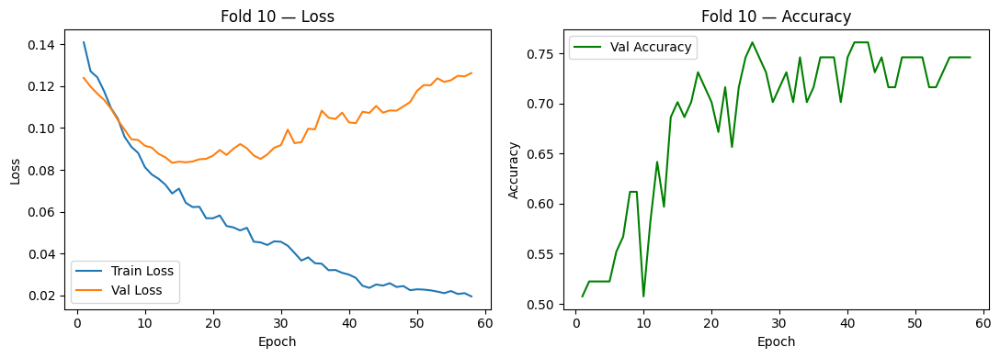

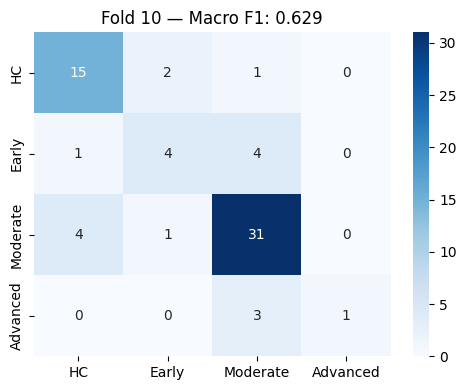

              precision    recall  f1-score   support

          HC       0.75      0.83      0.79        18
       Early       0.57      0.44      0.50         9
    Moderate       0.79      0.86      0.83        36
    Advanced       1.00      0.25      0.40         4

    accuracy                           0.76        67
   macro avg       0.78      0.60      0.63        67
weighted avg       0.77      0.76      0.75        67


OVERALL OOF MACRO F1: 0.6496


In [ ]:
from sklearn.metrics import accuracy_score
import pandas as pd

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 15
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):

    # NEW: hard verification that no PATNO leaks across train/val
    train_patnos = set(groups[train_idx])
    val_patnos   = set(groups[val_idx])
    overlap = train_patnos & val_patnos
    assert len(overlap) == 0, f"Fold {fold+1}: {len(overlap)} PATNO(s) leaked across train/val: {overlap}"

    print(f"\n{'='*70}\nEXECUTING DIRECT EMBEDDING CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")
    print(f" [Group check] Train patients: {len(train_patnos)} | Val patients: {len(val_patnos)} | Overlap: {len(overlap)}")

    # ... rest of the fold loop unchanged
    print(f"\n{'='*70}\nEXECUTING DIRECT EMBEDDING CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r     = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    y_train, y_val         = y[train_idx], y[val_idx]

    scaler_c = StandardScaler()
    c_train = scaler_c.fit_transform(c_train_r)
    c_val   = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val   = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val   = scaler_50.transform(r50_val_r)

    print(f" [Raw Features Connected] -> Clin: {c_train.shape[1]} | R10: {r10_train.shape[1]} | R50: {r50_train.shape[1]}")
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1], r50_dim=r50_train.shape[1], dropout=0.4
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=3e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=10, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, yb in train_loader:
            xc, xr10, xr50, yb = xc.to(device), xr10.to(device), xr50.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        # F1 still computed and used for threshold selection + best_state -- just not plotted
        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.2, 0.8, 7):
            for t2 in np.linspace(0.2, 0.8, 7):
                for t3 in np.linspace(0.2, 0.8, 7):
                    preds = ((probs[:,0]>t1).astype(int) + (probs[:,1]>t2).astype(int) + (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1, t2, t3]

        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        scheduler.step(epoch_best_f1)
        history.append({'epoch': epoch+1, 'train_loss': train_loss, 'val_loss': val_loss,
                         'val_f1': epoch_best_f1, 'val_acc': epoch_val_acc})

        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    # ── Loss + Accuracy curves only (F1 dropped from the plot) ──
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df['epoch'], hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df['epoch'], hist_df['val_loss'], label='Val Loss')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss'); axes[0].set_title(f'Fold {fold+1} — Loss'); axes[0].legend()

    axes[1].plot(hist_df['epoch'], hist_df['val_acc'], label='Val Accuracy', color='green')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy'); axes[1].set_title(f'Fold {fold+1} — Accuracy'); axes[1].legend()
    plt.tight_layout()
    plt.show()
    plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — Macro F1: {best_f1:.3f}')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")

same logic cell 5


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 1/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1105 | Val Loss: 0.1130 | Val Macro F1: 0.5750
  Epoch  10 | Train Loss: 0.0770 | Val Loss: 0.1023 | Val Macro F1: 0.5876
  Epoch  15 | Train Loss: 0.0579 | Val Loss: 0.1006 | Val Macro F1: 0.4409
  Epoch  20 | Train Loss: 0.0551 | Val Loss: 0.1009 | Val Macro F1: 0.4751
  Epoch  25 | Train Loss: 0.0471 | Val Loss: 0.1064 | Val Macro F1: 0.4641
  Early stopping sequence active on Epoch 29. Metric Stable.


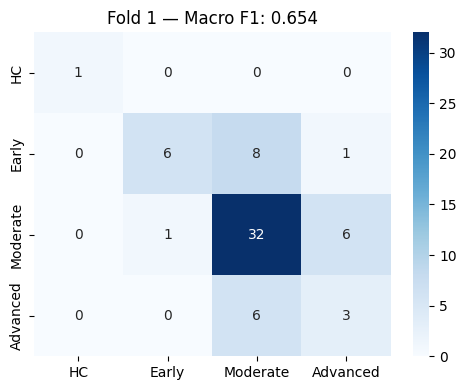

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.86      0.40      0.55        15
    Moderate       0.70      0.82      0.75        39
    Advanced       0.30      0.33      0.32         9

    accuracy                           0.66        64
   macro avg       0.71      0.64      0.65        64
weighted avg       0.68      0.66      0.65        64


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 2/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1149 | Val Loss: 0.1586 | Val Macro F1: 0.4083
  Epoch  10 | Train Loss: 0.0819 | Val Loss: 0.1563 | Val Macro F1: 0.4528
  Epoch  15 | Train Loss: 0.0626 | Val Loss: 0.1662 | Val Macro F1: 0.5365
  Epoch  20 | Train Loss: 0.0483 | Val Loss: 0.1824 | Val Macro F1: 0.5734
  Epoch  25 | Train Loss: 0.0391 | Val Loss: 0.2090 | Val Macro F1: 0.6334
  Epoch  30 | Train Loss: 0.0307 | Val Loss: 0.2380 | Val Macro F1: 0.6524
  Epoch  3

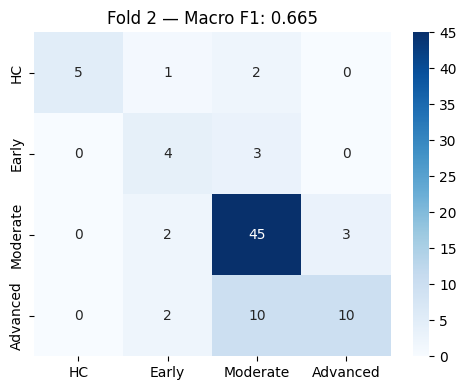

              precision    recall  f1-score   support

          HC       1.00      0.62      0.77         8
       Early       0.44      0.57      0.50         7
    Moderate       0.75      0.90      0.82        50
    Advanced       0.77      0.45      0.57        22

    accuracy                           0.74        87
   macro avg       0.74      0.64      0.66        87
weighted avg       0.75      0.74      0.73        87


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 3/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1125 | Val Loss: 0.1045 | Val Macro F1: 0.3266
  Epoch  10 | Train Loss: 0.0804 | Val Loss: 0.0806 | Val Macro F1: 0.5760
  Epoch  15 | Train Loss: 0.0623 | Val Loss: 0.0729 | Val Macro F1: 0.4955
  Epoch  20 | Train Loss: 0.0516 | Val Loss: 0.0721 | Val Macro F1: 0.5404
  Epoch  25 | Train Loss: 0.0448 | Val Loss: 0.0727 | Val Macro F1: 0.5382
  Epoch  30 | Train Loss: 0.0432 | Val Loss: 0.0685 | Val Macro F1: 0.5623
  Epoch  3

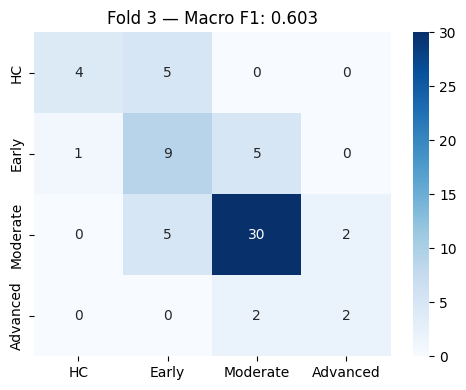

              precision    recall  f1-score   support

          HC       0.80      0.44      0.57         9
       Early       0.47      0.60      0.53        15
    Moderate       0.81      0.81      0.81        37
    Advanced       0.50      0.50      0.50         4

    accuracy                           0.69        65
   macro avg       0.65      0.59      0.60        65
weighted avg       0.71      0.69      0.69        65


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 4/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1118 | Val Loss: 0.1191 | Val Macro F1: 0.4617
  Epoch  10 | Train Loss: 0.0758 | Val Loss: 0.0940 | Val Macro F1: 0.4816
  Epoch  15 | Train Loss: 0.0598 | Val Loss: 0.0896 | Val Macro F1: 0.5790
  Epoch  20 | Train Loss: 0.0454 | Val Loss: 0.0906 | Val Macro F1: 0.5752
  Epoch  25 | Train Loss: 0.0385 | Val Loss: 0.0980 | Val Macro F1: 0.5695
  Epoch  30 | Train Loss: 0.0296 | Val Loss: 0.1028 | Val Macro F1: 0.6193
  Epoch  3

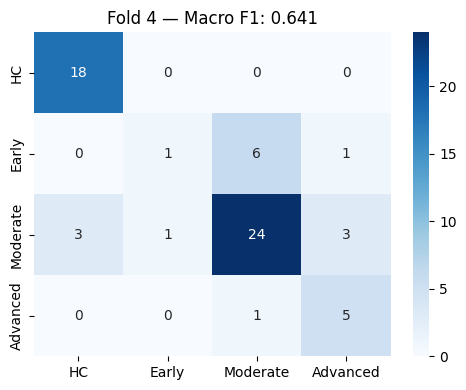

              precision    recall  f1-score   support

          HC       0.86      1.00      0.92        18
       Early       0.50      0.12      0.20         8
    Moderate       0.77      0.77      0.77        31
    Advanced       0.56      0.83      0.67         6

    accuracy                           0.76        63
   macro avg       0.67      0.68      0.64        63
weighted avg       0.74      0.76      0.73        63


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 5/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1192 | Val Loss: 0.1310 | Val Macro F1: 0.4288
  Epoch  10 | Train Loss: 0.0813 | Val Loss: 0.1242 | Val Macro F1: 0.4961
  Epoch  15 | Train Loss: 0.0642 | Val Loss: 0.1247 | Val Macro F1: 0.5431
  Epoch  20 | Train Loss: 0.0525 | Val Loss: 0.1290 | Val Macro F1: 0.5722
  Epoch  25 | Train Loss: 0.0473 | Val Loss: 0.1334 | Val Macro F1: 0.5661
  Epoch  30 | Train Loss: 0.0395 | Val Loss: 0.1355 | Val Macro F1: 0.6034
  Epoch  3

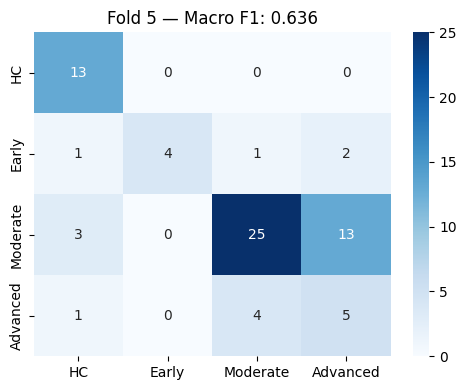

              precision    recall  f1-score   support

          HC       0.72      1.00      0.84        13
       Early       1.00      0.50      0.67         8
    Moderate       0.83      0.61      0.70        41
    Advanced       0.25      0.50      0.33        10

    accuracy                           0.65        72
   macro avg       0.70      0.65      0.64        72
weighted avg       0.75      0.65      0.67        72


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 6/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1045 | Val Loss: 0.1097 | Val Macro F1: 0.4116
  Epoch  10 | Train Loss: 0.0741 | Val Loss: 0.0945 | Val Macro F1: 0.5720
  Epoch  15 | Train Loss: 0.0531 | Val Loss: 0.0917 | Val Macro F1: 0.5655
  Epoch  20 | Train Loss: 0.0408 | Val Loss: 0.0964 | Val Macro F1: 0.5743
  Epoch  25 | Train Loss: 0.0364 | Val Loss: 0.1042 | Val Macro F1: 0.5435
  Epoch  30 | Train Loss: 0.0329 | Val Loss: 0.1066 | Val Macro F1: 0.5719
  Epoch  3

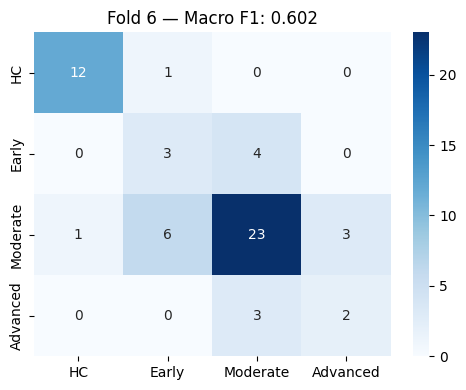

              precision    recall  f1-score   support

          HC       0.92      0.92      0.92        13
       Early       0.30      0.43      0.35         7
    Moderate       0.77      0.70      0.73        33
    Advanced       0.40      0.40      0.40         5

    accuracy                           0.69        58
   macro avg       0.60      0.61      0.60        58
weighted avg       0.71      0.69      0.70        58


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 7/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1151 | Val Loss: 0.1251 | Val Macro F1: 0.5202
  Epoch  10 | Train Loss: 0.0848 | Val Loss: 0.0985 | Val Macro F1: 0.5182
  Epoch  15 | Train Loss: 0.0645 | Val Loss: 0.0808 | Val Macro F1: 0.6200
  Epoch  20 | Train Loss: 0.0499 | Val Loss: 0.0912 | Val Macro F1: 0.5693
  Epoch  25 | Train Loss: 0.0416 | Val Loss: 0.0909 | Val Macro F1: 0.6083
  Epoch  30 | Train Loss: 0.0363 | Val Loss: 0.0929 | Val Macro F1: 0.6113
  Epoch  3

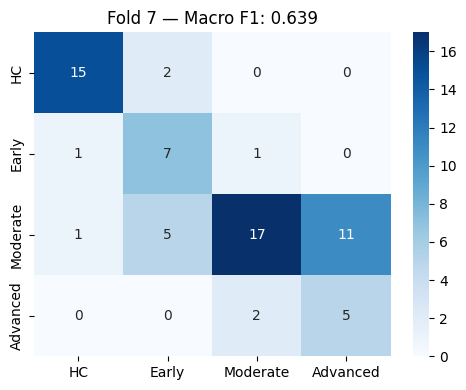

              precision    recall  f1-score   support

          HC       0.88      0.88      0.88        17
       Early       0.50      0.78      0.61         9
    Moderate       0.85      0.50      0.63        34
    Advanced       0.31      0.71      0.43         7

    accuracy                           0.66        67
   macro avg       0.64      0.72      0.64        67
weighted avg       0.76      0.66      0.67        67


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 8/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.0950 | Val Loss: 0.1089 | Val Macro F1: 0.5005
  Epoch  10 | Train Loss: 0.0695 | Val Loss: 0.0915 | Val Macro F1: 0.6205
  Epoch  15 | Train Loss: 0.0532 | Val Loss: 0.0952 | Val Macro F1: 0.6365
  Epoch  20 | Train Loss: 0.0420 | Val Loss: 0.1206 | Val Macro F1: 0.7639
  Epoch  25 | Train Loss: 0.0321 | Val Loss: 0.1446 | Val Macro F1: 0.7625
  Epoch  30 | Train Loss: 0.0247 | Val Loss: 0.1411 | Val Macro F1: 0.6739
  Epoch  3

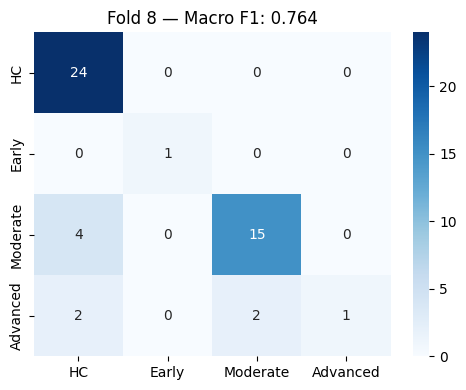

              precision    recall  f1-score   support

          HC       0.80      1.00      0.89        24
       Early       1.00      1.00      1.00         1
    Moderate       0.88      0.79      0.83        19
    Advanced       1.00      0.20      0.33         5

    accuracy                           0.84        49
   macro avg       0.92      0.75      0.76        49
weighted avg       0.86      0.84      0.81        49


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 9/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1082 | Val Loss: 0.1106 | Val Macro F1: 0.3737
  Epoch  10 | Train Loss: 0.0768 | Val Loss: 0.0975 | Val Macro F1: 0.4440
  Epoch  15 | Train Loss: 0.0583 | Val Loss: 0.0967 | Val Macro F1: 0.4884
  Epoch  20 | Train Loss: 0.0481 | Val Loss: 0.1101 | Val Macro F1: 0.5316
  Epoch  25 | Train Loss: 0.0373 | Val Loss: 0.1291 | Val Macro F1: 0.5281
  Epoch  30 | Train Loss: 0.0302 | Val Loss: 0.1537 | Val Macro F1: 0.5371
  Epoch  3

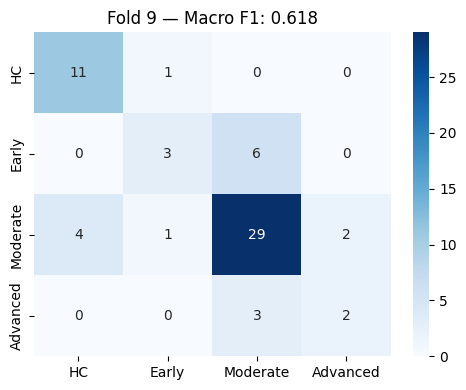

              precision    recall  f1-score   support

          HC       0.73      0.92      0.81        12
       Early       0.60      0.33      0.43         9
    Moderate       0.76      0.81      0.78        36
    Advanced       0.50      0.40      0.44         5

    accuracy                           0.73        62
   macro avg       0.65      0.61      0.62        62
weighted avg       0.71      0.73      0.71        62


EXECUTING DIRECT EMBEDDING CYCLE: FOLD 10/10
 [Raw Features Connected] -> Clin: 64 | R10: 512 | R50: 501
  Epoch   5 | Train Loss: 0.1072 | Val Loss: 0.1027 | Val Macro F1: 0.4266
  Epoch  10 | Train Loss: 0.0765 | Val Loss: 0.0852 | Val Macro F1: 0.5119
  Epoch  15 | Train Loss: 0.0695 | Val Loss: 0.0793 | Val Macro F1: 0.5253
  Epoch  20 | Train Loss: 0.0472 | Val Loss: 0.0816 | Val Macro F1: 0.5627
  Epoch  25 | Train Loss: 0.0402 | Val Loss: 0.0834 | Val Macro F1: 0.6131
  Epoch  30 | Train Loss: 0.0319 | Val Loss: 0.0933 | Val Macro F1: 0.5451
  Epoch  

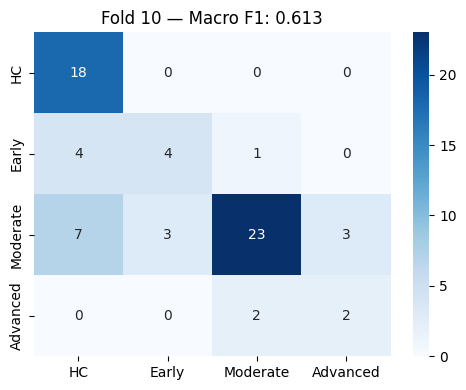

              precision    recall  f1-score   support

          HC       0.62      1.00      0.77        18
       Early       0.57      0.44      0.50         9
    Moderate       0.88      0.64      0.74        36
    Advanced       0.40      0.50      0.44         4

    accuracy                           0.70        67
   macro avg       0.62      0.65      0.61        67
weighted avg       0.74      0.70      0.70        67



In [ ]:
NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nEXECUTING DIRECT EMBEDDING CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    # Isolate Fold Invariant Index Slices
    c_train_r, c_val_r = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # ── INDEPENDENT STANDARD SCALING (NO PCA BINDING) ──
    scaler_c = StandardScaler()
    c_train = scaler_c.fit_transform(c_train_r)
    c_val = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val = scaler_50.transform(r50_val_r)

    print(f" [Raw Features Connected] -> Clin: {c_train.shape[1]} | R10: {r10_train.shape[1]} | R50: {r50_train.shape[1]}")
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, y_train), batch_size=64, shuffle=True)
    val_loader = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, y_val), batch_size=256, shuffle=False)

    # Re-instantiate model with stable 0.3 dropout
    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1],
        r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1],
        dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)

    # Balanced optimization parameters
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = []

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, yb in train_loader:
            xc, xr10, xr50, yb = xc.to(device), xr10.to(device), xr50.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]
        for t1 in np.linspace(0.2, 0.8, 7):
            for t2 in np.linspace(0.2, 0.8, 7):
                for t3 in np.linspace(0.2, 0.8, 7):
                    preds = ((probs[:,0]>t1).astype(int) + (probs[:,1]>t2).astype(int) + (probs[:,2]>t3).astype(int))
                    f1 = f1_score(y_val_arr, preds, average='macro')
                    if f1 > epoch_best_f1:
                        epoch_best_f1, epoch_best_t = f1, [t1, t2, t3]

        scheduler.step(epoch_best_f1)
        history.append({'epoch': epoch+1, 'train_loss': train_loss, 'val_loss': val_loss, 'val_f1': epoch_best_f1})

        if epoch_best_f1 > best_f1:
            best_f1 = epoch_best_f1
            best_thresholds = epoch_best_t
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            patience_cnt = 0
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val Macro F1: {epoch_best_f1:.4f}")

        if patience_cnt >= PATIENCE:
            print(f"  Early stopping sequence active on Epoch {epoch+1}. Metric Stable.")
            break

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — Macro F1: {best_f1:.3f}')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

XGBoost

In [ ]:
#step3
import xgboost as xgb
from sklearn.utils.class_weight import compute_class_weight

print("XGBoost Core Framework Loaded.")

XGBoost Core Framework Loaded.


In [ ]:
#step4
# Unpack and combine all pristine embedding arrays horizontally
X_multimodal_combined = np.hstack([X_clinical_raw, X_resnet10_raw, X_resnet50_raw])

print(f"Combined Wide Feature Matrix Profile: {X_multimodal_combined.shape}")
print(f" -> Columns breakdown: {X_clinical_raw.shape[1]} Clinical + {X_resnet10_raw.shape[1]} ResNet10 + {X_resnet50_raw.shape[1]} ResNet50")

Combined Wide Feature Matrix Profile: (654, 1077)
 -> Columns breakdown: 64 Clinical + 512 ResNet10 + 501 ResNet50



EXECUTING MULTIMODAL XGBOOST CYCLE: FOLD 1/10


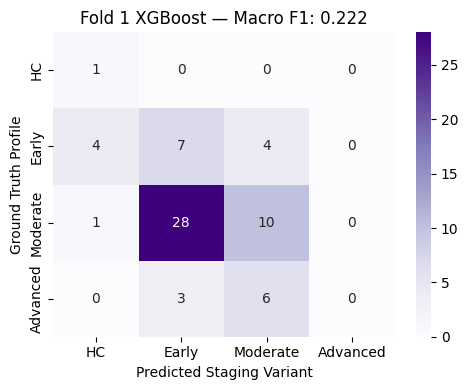

              precision    recall  f1-score   support

          HC       0.17      1.00      0.29         1
       Early       0.18      0.47      0.26        15
    Moderate       0.50      0.26      0.34        39
    Advanced       0.00      0.00      0.00         9

    accuracy                           0.28        64
   macro avg       0.21      0.43      0.22        64
weighted avg       0.35      0.28      0.27        64


EXECUTING MULTIMODAL XGBOOST CYCLE: FOLD 2/10


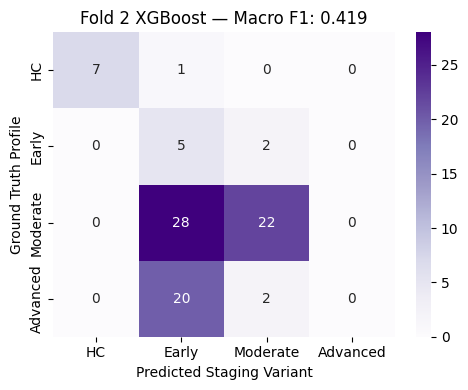

              precision    recall  f1-score   support

          HC       1.00      0.88      0.93         8
       Early       0.09      0.71      0.16         7
    Moderate       0.85      0.44      0.58        50
    Advanced       0.00      0.00      0.00        22

    accuracy                           0.39        87
   macro avg       0.48      0.51      0.42        87
weighted avg       0.59      0.39      0.43        87


EXECUTING MULTIMODAL XGBOOST CYCLE: FOLD 3/10


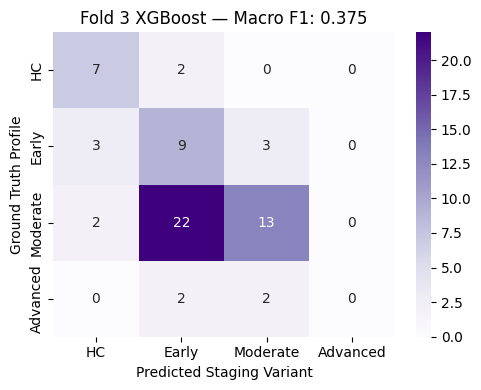

              precision    recall  f1-score   support

          HC       0.58      0.78      0.67         9
       Early       0.26      0.60      0.36        15
    Moderate       0.72      0.35      0.47        37
    Advanced       0.00      0.00      0.00         4

    accuracy                           0.45        65
   macro avg       0.39      0.43      0.37        65
weighted avg       0.55      0.45      0.44        65


EXECUTING MULTIMODAL XGBOOST CYCLE: FOLD 4/10


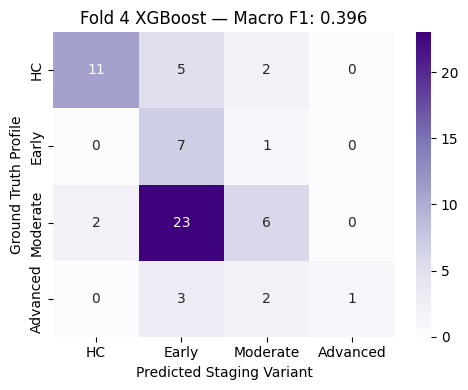

              precision    recall  f1-score   support

          HC       0.85      0.61      0.71        18
       Early       0.18      0.88      0.30         8
    Moderate       0.55      0.19      0.29        31
    Advanced       1.00      0.17      0.29         6

    accuracy                           0.40        63
   macro avg       0.64      0.46      0.40        63
weighted avg       0.63      0.40      0.41        63


EXECUTING MULTIMODAL XGBOOST CYCLE: FOLD 5/10


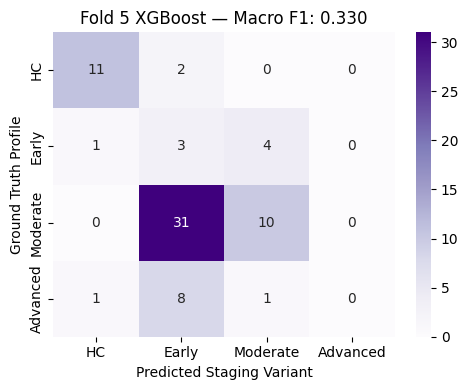

              precision    recall  f1-score   support

          HC       0.85      0.85      0.85        13
       Early       0.07      0.38      0.12         8
    Moderate       0.67      0.24      0.36        41
    Advanced       0.00      0.00      0.00        10

    accuracy                           0.33        72
   macro avg       0.40      0.37      0.33        72
weighted avg       0.54      0.33      0.37        72


EXECUTING MULTIMODAL XGBOOST CYCLE: FOLD 6/10


KeyboardInterrupt: 

In [ ]:
#step5
NUM_CLASSES = 4
N_FOLDS = 10
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_multimodal_combined, y, groups)):
    print(f"\n{'='*70}\nEXECUTING MULTIMODAL XGBOOST CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    # Isolate independent fold splits
    X_train, X_val = X_multimodal_combined[train_idx], X_multimodal_combined[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # Calculate precise class balance vectors for this fold configuration
    classes = np.unique(y_train)
    weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
    class_weights_dict = dict(zip(classes, weights))
    sample_weights = np.array([class_weights_dict[cls] for cls in y_train])

    # Instantiate specialized tree configuration engineered for wide embedding matrices
    model = xgb.XGBClassifier(
        objective='multi:softprob',
        num_class=NUM_CLASSES,
        n_estimators=400,
        learning_rate=0.02,
        max_depth=5,
        subsample=0.7,
        colsample_bytree=0.6,    # Subsample features to prevent image channels from dominating over clinical
        reg_alpha=0.5,           # L1 regularization to weed out dead or noisy embedding dimensions
        reg_lambda=2.0,          # L2 regularization to balance out highly correlated features
        random_state=42,
        n_jobs=-1,
        tree_method='hist'       # Maximizes memory throughput speed
    )

    # Execute training sequence with built-in validation tracking
    model.fit(
        X_train, y_train,
        sample_weight=sample_weights,
        eval_set=[(X_val, y_val)],
        verbose=False
    )

    # Extract soft probability distributions
    probs = model.predict_proba(X_val)

    # Apply post-hoc threshold alignment grid search for Ordinal/Macro optimization
    epoch_best_f1, epoch_best_t = 0.0, [0.5, 0.5, 0.5]

    for t1 in np.linspace(0.2, 0.8, 5):
        for t2 in np.linspace(0.2, 0.8, 5):
            for t3 in np.linspace(0.2, 0.8, 5):
                # Class assignment based on decision boundaries passing threshold cuts
                preds = (probs[:, 1] > t1).astype(int) + (probs[:, 2] > t2).astype(int) + (probs[:, 3] > t3).astype(int)
                f1 = f1_score(y_val, preds, average='macro')
                if f1 > epoch_best_f1:
                    epoch_best_f1, epoch_best_t = f1, [t1, t2, t3]

    # Re-apply best optimization thresholds to lock in predictions
    preds_final = (probs[:, 1] > epoch_best_t[0]).astype(int) + (probs[:, 2] > epoch_best_t[1]).astype(int) + (probs[:, 3] > epoch_best_t[2]).astype(int)
    oof_preds[val_idx] = preds_final

    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])

    # Render Visual Performance Diagnostics for the Fold
    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Purples',
                xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} XGBoost — Macro F1: {epoch_best_f1:.3f}')
    ax.set_xlabel('Predicted Staging Variant')
    ax.set_ylabel('Ground Truth Profile')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

# ── OVERALL VALIDATION SUMMARY COHORT REPORT ──
print(f"\n{'='*70}\nFINAL AGGREGATED CROSS-VALIDATION MULTIMODAL XGBOOST REPORT\n{'='*70}")
final_macro_f1 = f1_score(y, oof_preds, average='macro')
print(f"Overall OOF Macro F1 Score: {final_macro_f1:.4f}")
print(classification_report(y, oof_preds, target_names=list(labels_map.values()), zero_division=0))

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df=pd.read_csv('/content/mri_merged_df.csv')

In [ ]:
import pandas as pd

# 1. Find Image IDs and PATNO for Healthy Controls (HC)
hc_data = df[df['MRI_Group'] == 'Control'][['PATNO', 'Image_ID_T1']].dropna()
hc_image_ids = list(zip(hc_data['PATNO'], hc_data['Image_ID_T1']))

# 2. Find Image IDs and PATNO for Parkinson's Disease (PD)
pd_data = df[df['MRI_Group'] == 'PD'][['PATNO', 'Image_ID_T1']].dropna()
pd_image_ids = list(zip(pd_data['PATNO'], pd_data['Image_ID_T1']))

# Print out the first 5 examples of each to verify
print(f"Sample HC (PATNO, Image ID) pairs: {hc_image_ids[:5]}")
print(f"Sample PD (PATNO, Image ID) pairs: {pd_image_ids[:5]}")

Sample HC (PATNO, Image ID) pairs: [(3104, 'I330120'), (3104, 'I330133'), (3106, 'I330427'), (3106, 'I330440'), (3112, 'I330518')]
Sample PD (PATNO, Image ID) pairs: [(3102, 'I333354'), (3102, 'I406748'), (3105, 'I330401'), (3105, 'I330414'), (3105, 'I406752')]


In [ ]:
!pip install nibabel -q

KeyboardInterrupt: 

In [ ]:
import pandas as pd

In [ ]:
df=pd.read_csv('/content/20june_6_19_2026.csv')

In [ ]:
df.columns

Index(['Image Data ID', 'Subject', 'Group', 'Sex', 'Age', 'Visit', 'Modality',
       'Description', 'Type', 'Acq Date', 'Format', 'Downloaded'],
      dtype='object')

In [ ]:
df['Sex'].value_counts()

,count
Sex,
M,880
F,444


In [ ]:
df=pd.read_csv('/content/nsd_bio_merged.csv')

In [ ]:
# df.columns.tolist()

In [ ]:
df['SEX'].value_counts()

,count
SEX,
1.0,3668
0.0,2310


In [ ]:
df1=pd.read_csv('/content/mri_merged_df.csv')

In [ ]:
df1['SEX'].value_counts()

,count
SEX,
1,436
0,219


In [ ]:
# df1['MRI_Age'].value_counts()

In [ ]:
df1['stage_merged'].value_counts()

,count
stage_merged,
2,356
0,134
1,88
3,77


Fusion Part

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split

In [ ]:
clinical=pd.read_csv('/content/clinical_embeddings_v2_oof (1).csv')

In [ ]:
clinical.head(3)

,PATNO,EVENT_ID,emb_0,Image_ID_T1,Image_ID_T2,stage_merged,emb_1,emb_2,emb_3,emb_4,...,emb_54,emb_55,emb_56,emb_57,emb_58,emb_59,emb_60,emb_61,emb_62,emb_63
0,3102,BL,0.0,I333354,I333353,2,0.557038,1.679197,0.201530,0.0,...,1.280908,1.160866,0.0,0.0,0.522860,0.538362,0.176820,1.299313,0.795324,0.000000
1,3102,V06,0.0,I406748,I406759,3,1.108874,1.870898,0.000000,0.0,...,1.635283,0.405102,0.0,0.0,0.000000,0.280255,0.829002,2.023286,0.897576,0.000000
2,3104,BL,0.0,I330120,I330119,0,1.076286,0.000000,1.289558,0.0,...,0.000000,0.000000,0.0,0.0,0.608614,0.005026,0.404234,2.158654,0.000000,1.046038


In [ ]:
brain_iac=pd.read_csv('/content/brainiac_oof_embeddings.csv')

In [ ]:
brain_iac.head(3)

,PATNO,EVENT_ID,emb_dim_0,emb_dim_1,emb_dim_2,emb_dim_3,emb_dim_4,emb_dim_5,emb_dim_6,emb_dim_7,...,emb_dim_758,emb_dim_759,emb_dim_760,emb_dim_761,emb_dim_762,emb_dim_763,emb_dim_764,emb_dim_765,emb_dim_766,emb_dim_767
0,3102,BL,0.0,0.000000,0.471483,1.093861,0.000000,0.0,0.164349,0.871382,...,0.325590,1.047754,0.227107,0.000000,1.301360,0.0,0.135645,0.779869,0.293751,0.927141
1,3102,V06,0.0,0.000000,0.530314,0.996423,0.000000,0.0,0.120390,0.887675,...,0.179024,1.082628,0.152747,0.000000,1.332524,0.0,0.064570,0.717628,0.347070,0.834216
2,3104,BL,0.0,0.681912,0.793614,0.873275,0.149434,0.0,1.059869,0.000000,...,0.089706,0.000000,0.099639,0.042161,0.000000,0.0,1.205353,0.000000,0.000000,1.196885


In [ ]:
dense=pd.read_csv('/content/mri_densenet_oof_clean.csv')

In [ ]:
dense.head(3)

,Image_ID_T1,PATNO,stage_merged,mri_emb_0,mri_emb_1,mri_emb_2,mri_emb_3,mri_emb_4,mri_emb_5,mri_emb_6,...,mri_emb_490,mri_emb_491,mri_emb_492,mri_emb_493,mri_emb_494,mri_emb_495,mri_emb_496,mri_emb_497,mri_emb_498,mri_emb_499
0,I333354,3102,2,0.000000,1.192910,0.502282,0.0,0.620590,0.083382,0.000000,...,0.000000,0.601683,0.000000,0.627319,0.478673,0.000000,0.000000,0.00000,0.946004,0.000000
1,I406748,3102,3,0.000000,1.192910,0.502282,0.0,0.620590,0.083382,0.000000,...,0.000000,0.601683,0.000000,0.627319,0.478673,0.000000,0.000000,0.00000,0.946004,0.000000
2,I330120,3104,0,0.269244,0.108234,0.099983,0.0,0.258722,0.486596,0.573723,...,0.561515,0.667609,0.315767,2.141810,1.326757,0.765253,0.844171,0.80943,0.570236,0.710978


In [ ]:
brats=pd.read_csv('/content/mri_swin_t1t2_brats.csv')

In [ ]:
brats.head(3)

,image_id_t1,PATNO,stage_merged,EVENT_ID,mri_feat_0,mri_feat_1,mri_feat_2,mri_feat_3,mri_feat_4,mri_feat_5,...,mri_feat_758,mri_feat_759,mri_feat_760,mri_feat_761,mri_feat_762,mri_feat_763,mri_feat_764,mri_feat_765,mri_feat_766,mri_feat_767
0,I333354,3102,2,BL,1.276694,-0.694648,1.083539,-1.147986,-0.376314,-0.972013,...,1.292947,-1.316428,0.798401,-0.548166,0.516254,-0.810389,0.323340,-0.335663,-0.583949,0.779749
1,I406748,3102,3,V06,1.301785,-0.664456,1.065952,-1.084969,-0.293940,-0.920256,...,1.245526,-1.318212,0.762778,-0.576836,0.473463,-0.814468,0.392805,-0.342374,-0.540396,0.700808
2,I330120,3104,0,BL,1.336544,-0.715930,1.093828,-1.113465,-0.328124,-1.034791,...,1.255022,-1.256825,0.782365,-0.548541,0.512776,-0.777300,0.313697,-0.318858,-0.551148,0.749773


In [ ]:
brainseg=pd.read_csv('/content/mri_swin_t1t2.csv')

In [ ]:
brainseg.head(3)

,image_id_t1,PATNO,EVENT_ID,stage_merged,mri_feat_0,mri_feat_1,mri_feat_2,mri_feat_3,mri_feat_4,mri_feat_5,...,mri_feat_758,mri_feat_759,mri_feat_760,mri_feat_761,mri_feat_762,mri_feat_763,mri_feat_764,mri_feat_765,mri_feat_766,mri_feat_767
0,I333354,3102,BL,2,-0.226830,0.293047,0.224915,0.233150,-0.254695,0.349454,...,2.218780,-0.189824,0.983627,1.025455,0.835326,-0.437597,-0.409739,-0.701130,-0.777922,-0.179501
1,I406748,3102,V06,3,-0.242033,0.252042,0.201566,0.199343,-0.288247,0.319197,...,2.224348,-0.105899,0.996906,0.938302,0.959205,-0.428020,-0.369239,-0.725351,-0.849900,-0.154025
2,I330120,3104,BL,0,-0.205323,0.235538,0.234129,0.180527,-0.267735,0.389364,...,2.211340,-0.139906,1.050440,1.024463,0.851306,-0.430930,-0.384772,-0.651535,-0.800820,-0.197835


In [ ]:
dense=pd.read_csv('/content/mri_densenet_oof_clean.csv')

In [ ]:
dense.head(3)

,Image_ID_T1,PATNO,stage_merged,mri_emb_0,mri_emb_1,mri_emb_2,mri_emb_3,mri_emb_4,mri_emb_5,mri_emb_6,...,mri_emb_490,mri_emb_491,mri_emb_492,mri_emb_493,mri_emb_494,mri_emb_495,mri_emb_496,mri_emb_497,mri_emb_498,mri_emb_499
0,I333354,3102,2,0.000000,1.192910,0.502282,0.0,0.620590,0.083382,0.000000,...,0.000000,0.601683,0.000000,0.627319,0.478673,0.000000,0.000000,0.00000,0.946004,0.000000
1,I406748,3102,3,0.000000,1.192910,0.502282,0.0,0.620590,0.083382,0.000000,...,0.000000,0.601683,0.000000,0.627319,0.478673,0.000000,0.000000,0.00000,0.946004,0.000000
2,I330120,3104,0,0.269244,0.108234,0.099983,0.0,0.258722,0.486596,0.573723,...,0.561515,0.667609,0.315767,2.141810,1.326757,0.765253,0.844171,0.80943,0.570236,0.710978


FUSION check 10,50 densenet

In [ ]:
import pandas as pd
import numpy as np

clin_features       = [col for col in df_clin.columns if col.startswith('emb_')]
r10_features_raw    = [col for col in resent10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw    = [col for col in resnet50.columns if col.startswith('mri_emb_')]
dense_features_raw  = [col for col in dense.columns if col.startswith('mri_emb_')]

df_clin_clean  = df_clin[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean   = resent10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean   = resnet50[['Image_ID_T1'] + r50_features_raw].copy()
df_dense_clean = dense[['Image_ID_T1'] + dense_features_raw].copy()

df_r50_clean   = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_dense_clean = df_dense_clean.rename(columns={col: f"dense_{col}" for col in dense_features_raw})

r10_features   = r10_features_raw
r50_features   = [f"r50_{col}" for col in r50_features_raw]
dense_features = [f"dense_{col}" for col in dense_features_raw]

# FIX: track row count at each join so a silent subset mismatch (e.g. one
# backbone failing preprocessing on a subject the others succeeded on) shows up immediately
print(f"Clinical rows:  {len(df_clin_clean)}")
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
print(f"After + R10:    {len(merged_df)}  (dropped {len(df_clin_clean) - len(merged_df)})")
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
print(f"After + R50:    {len(merged_df)}")
merged_df = pd.merge(merged_df, df_dense_clean, on='Image_ID_T1', how='inner')
print(f"After + Dense:  {len(merged_df)}")

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_resnet10_raw = merged_df[r10_features].values.astype(np.float32)
X_resnet50_raw = merged_df[r50_features].values.astype(np.float32)
X_dense_raw    = merged_df[dense_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"\nFinal shape: {merged_df.shape}")
print("Class distribution after merge:")
print(pd.Series(y).value_counts().sort_index())

Clinical rows:  655
After + R10:    654  (dropped 1)
After + R50:    654
After + Dense:  654

Final shape: (654, 1581)
Class distribution after merge:
0    133
1     88
2    356
3     77
Name: count, dtype: int64


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, densenet, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.dense    = torch.tensor(densenet, dtype=torch.float32) # Fixed variable instantiation mismatch
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        # Fixed index references to match key internal properties perfectly
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.dense[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()

        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            w = neg / (pos + 1e-6)
            alphas.append(min(np.sqrt(w), 3.0))

        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

In [ ]:
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, dense_dim, embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(),
            nn.Dropout(dropout)  # FIX: previously had none, asymmetric vs MRI branches
        )

        # FIX: r10/r50/dense_proj now use `dropout` instead of a hardcoded 0.3,
        # so it actually moves if you sweep the dropout hyperparameter
        self.r10_proj = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.r50_proj = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.dense_proj = nn.Sequential(
            nn.Linear(dense_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        self.gate_router = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 3),
            nn.Softmax(dim=-1)
        )

        combined_img_dim = hidden_dim * 3
        fused_dim = hidden_dim + combined_img_dim

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim),
            nn.LayerNorm(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50, x_dense):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        p10 = self.r10_proj(x_r10)
        p50 = self.r50_proj(x_r50)
        pdense = self.dense_proj(x_dense)

        raw_stack = torch.cat([p10, p50, pdense], dim=1)
        gate_coefficients = self.gate_router(raw_stack)  # [Batch, 3]

        g10    = gate_coefficients[:, 0].unsqueeze(1)
        g50    = gate_coefficients[:, 1].unsqueeze(1)
        gdense = gate_coefficients[:, 2].unsqueeze(1)

        gated_img = torch.cat([p10 * g10, p50 * g50, pdense * gdense], dim=1)
        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))

        # FIX: also returns gate_coefficients so training loop can log branch
        # reliance without a second forward pass
        return self.classifier(latent), latent, gate_coefficients

In [ ]:
NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    """
    Replaces the triple-nested loop + 343x sklearn.f1_score calls per epoch
    with a fully vectorized numpy search over the same grid. Same result,
    far fewer Python-level calls — matters across 10 folds x up to 100 epochs.
    """
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T  # [n_combos, n_thresh]
    n_combos = mesh.shape[0]

    preds_all = np.zeros((probs.shape[0], n_combos), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)

    y_col = y_true[:, None]
    f1_per_combo = np.zeros(n_combos)
    for c in range(num_classes):
        pred_c = (preds_all == c)
        true_c = (y_col == c)
        tp = (pred_c & true_c).sum(axis=0)
        fp = (pred_c & ~true_c).sum(axis=0)
        fn = (~pred_c & true_c).sum(axis=0)
        precision = tp / np.clip(tp + fp, 1, None)
        recall    = tp / np.clip(tp + fn, 1, None)
        denom = precision + recall
        f1_c = np.where(denom > 0, 2 * precision * recall / np.clip(denom, 1e-12, None), 0.0)
        f1_per_combo += f1_c

    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()


sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_gate_means = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nEXECUTING DYNAMIC GATED CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r         = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r     = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r     = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    dense_train_r, dense_val_r = X_dense_raw[train_idx], X_dense_raw[val_idx]
    y_train, y_val             = y[train_idx], y[val_idx]

    scaler_c = StandardScaler()
    c_train  = scaler_c.fit_transform(c_train_r)
    c_val    = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val   = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val   = scaler_50.transform(r50_val_r)

    scaler_dense = StandardScaler()
    dense_train  = scaler_dense.fit_transform(dense_train_r)
    dense_val    = scaler_dense.transform(dense_val_r)

    print(f" [Features] -> Clin: {c_train.shape[1]} | R10: {r10_train.shape[1]} | R50: {r50_train.shape[1]} | Dense: {dense_train.shape[1]}")
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, dense_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, dense_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1],
        r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1],
        dense_dim=dense_train.shape[1],
        dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    best_gate_mean = None
    patience_cnt = 0
    history = {'train_loss': [], 'val_f1': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, xdense, yb in train_loader:
            xc, xr10, xr50, xdense, yb = xc.to(device), xr10.to(device), xr50.to(device), xdense.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xc, xr10, xr50, xdense)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1

        model.eval()
        logits_list, y_list, gate_list = [], [], []
        with torch.no_grad():
            for xc, xr10, xr50, xdense, yb in val_loader:
                logits, _, gate_coeffs = model(xc.to(device), xr10.to(device), xr50.to(device), xdense.to(device))
                logits_list.append(logits.cpu())
                gate_list.append(gate_coeffs.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        gate_all = torch.cat(gate_list).numpy()
        y_val_arr = np.array(y_list)
        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)

        history['train_loss'].append(train_loss_sum / n_batches)
        history['val_f1'].append(epoch_best_f1)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            best_gate_mean = gate_all.mean(axis=0)  # [g10, g50, gdense] at best epoch
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0: print(f"  Epoch {epoch+1:3d} | Val Macro F1: {epoch_best_f1:.4f}")
        if patience_cnt >= PATIENCE: break

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, xdense, _ in val_loader:
            logits, _, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xdense.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    oof_preds[val_idx] = np.array(preds_final)
    fold_gate_means.append(best_gate_mean)
    print(f" Gate weights @ best epoch -> R10: {best_gate_mean[0]:.3f} | R50: {best_gate_mean[1]:.3f} | Dense: {best_gate_mean[2]:.3f}")
    print(classification_report(y_val, oof_preds[val_idx], target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")
print("Mean gate weights across folds (R10 / R50 / Dense):", np.array(fold_gate_means).mean(axis=0))


EXECUTING DYNAMIC GATED CYCLE: FOLD 1/10
 [Features] -> Clin: 64 | R10: 512 | R50: 501 | Dense: 500
  Epoch   5 | Val Macro F1: 0.4046
  Epoch  10 | Val Macro F1: 0.5064
  Epoch  15 | Val Macro F1: 0.5360
  Epoch  20 | Val Macro F1: 0.5222
  Epoch  25 | Val Macro F1: 0.4912
  Epoch  30 | Val Macro F1: 0.4787
 Gate weights @ best epoch -> R10: 0.477 | R50: 0.279 | Dense: 0.244
              precision    recall  f1-score   support

          HC       0.50      1.00      0.67         1
       Early       0.60      0.40      0.48        15
    Moderate       0.77      0.77      0.77        39
    Advanced       0.46      0.67      0.55         9

    accuracy                           0.67        64
   macro avg       0.58      0.71      0.62        64
weighted avg       0.68      0.67      0.67        64


EXECUTING DYNAMIC GATED CYCLE: FOLD 2/10
 [Features] -> Clin: 64 | R10: 512 | R50: 501 | Dense: 500
  Epoch   5 | Val Macro F1: 0.4036
  Epoch  10 | Val Macro F1: 0.4933
  Epoch  15 | 

resnet10,50,brainsegfounder

In [ ]:
brainsegfounder=pd.read_csv('/content/mri_swin_t1t2.csv')

In [ ]:
brainsegfounder = brainsegfounder.rename(columns={'image_id_t1': 'Image_ID_T1'})

In [ ]:
brainsegfounder.head(3)

,image_id_t1,PATNO,EVENT_ID,stage_merged,mri_feat_0,mri_feat_1,mri_feat_2,mri_feat_3,mri_feat_4,mri_feat_5,...,mri_feat_758,mri_feat_759,mri_feat_760,mri_feat_761,mri_feat_762,mri_feat_763,mri_feat_764,mri_feat_765,mri_feat_766,mri_feat_767
0,I333354,3102,BL,2,-0.226830,0.293047,0.224915,0.233150,-0.254695,0.349454,...,2.218780,-0.189824,0.983627,1.025455,0.835326,-0.437597,-0.409739,-0.701130,-0.777922,-0.179501
1,I406748,3102,V06,3,-0.242033,0.252042,0.201566,0.199343,-0.288247,0.319197,...,2.224348,-0.105899,0.996906,0.938302,0.959205,-0.428020,-0.369239,-0.725351,-0.849900,-0.154025
2,I330120,3104,BL,0,-0.205323,0.235538,0.234129,0.180527,-0.267735,0.389364,...,2.211340,-0.139906,1.050440,1.024463,0.851306,-0.430930,-0.384772,-0.651535,-0.800820,-0.197835


In [ ]:
import pandas as pd
import numpy as np

clin_features     = [col for col in df_clin.columns if col.startswith('emb_')]
r10_features_raw  = [col for col in resent10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw  = [col for col in resnet50.columns if col.startswith('mri_emb_')]
bsf_features_raw  = [col for col in brainsegfounder.columns if col.startswith('mri_feat_')]

df_clin_clean = df_clin[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = resent10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = resnet50[['Image_ID_T1'] + r50_features_raw].copy()

# FIX: normalize ID column casing before merge (your sample shows `image_id_t1` lowercase)
bsf_id_col = 'image_id_t1' if 'image_id_t1' in brainsegfounder.columns else 'Image_ID_T1'
df_bsf_clean = brainsegfounder[[bsf_id_col] + bsf_features_raw].copy()
df_bsf_clean = df_bsf_clean.rename(columns={bsf_id_col: 'Image_ID_T1'})

# Prevent column collisions across sources
df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_bsf_clean = df_bsf_clean.rename(columns={col: f"bsf_{col}" for col in bsf_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]
bsf_features = [f"bsf_{col}" for col in bsf_features_raw]

# Sequential merge with shrinkage tracking at every join
n_before = len(df_clin_clean)
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
print(f"Clinical: {n_before} -> +R10: {len(merged_df)} (dropped {n_before - len(merged_df)})")

n_before = len(merged_df)
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
print(f"+R50: {len(merged_df)} (dropped {n_before - len(merged_df)})")

n_before = len(merged_df)
merged_df = pd.merge(merged_df, df_bsf_clean, on='Image_ID_T1', how='inner')
print(f"+BrainSegFounder: {len(merged_df)} (dropped {n_before - len(merged_df)})")

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_resnet10_raw = merged_df[r10_features].values.astype(np.float32)
X_resnet50_raw = merged_df[r50_features].values.astype(np.float32)
X_bsf_raw      = merged_df[bsf_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"\nFinal shape: {merged_df.shape}  |  BSF embedding dim: {X_bsf_raw.shape[1]}")
print("Class distribution after merge:")
print(pd.Series(y).value_counts().sort_index())

Clinical: 655 -> +R10: 654 (dropped 1)
+R50: 654 (dropped 0)
+BrainSegFounder: 654 (dropped 0)

Final shape: (654, 1849)  |  BSF embedding dim: 768
Class distribution after merge:
0    133
1     88
2    356
3     77
Name: count, dtype: int64


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, bsf, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.bsf      = torch.tensor(bsf, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.bsf[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()

        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            w = neg / (pos + 1e-6)
            alphas.append(min(np.sqrt(w), 3.0))

        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

In [ ]:
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, bsf_dim, embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.r10_proj = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.r50_proj = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.bsf_proj = nn.Sequential(
            nn.Linear(bsf_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        self.gate_router = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim),
            nn.ReLU(),
            nn.Linear(hidden_dim, 3),
            nn.Softmax(dim=-1)
        )

        combined_img_dim = hidden_dim * 3
        fused_dim = hidden_dim + combined_img_dim

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim),
            nn.LayerNorm(embedding_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )

        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32),
            nn.ReLU(),
            nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50, x_bsf):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        p10 = self.r10_proj(x_r10)
        p50 = self.r50_proj(x_r50)
        pbsf = self.bsf_proj(x_bsf)

        raw_stack = torch.cat([p10, p50, pbsf], dim=1)
        gate_coefficients = self.gate_router(raw_stack)  # [Batch, 3]

        g10  = gate_coefficients[:, 0].unsqueeze(1)
        g50  = gate_coefficients[:, 1].unsqueeze(1)
        gbsf = gate_coefficients[:, 2].unsqueeze(1)

        gated_img = torch.cat([p10 * g10, p50 * g50, pbsf * gbsf], dim=1)
        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))

        return self.classifier(latent), latent, gate_coefficients

In [ ]:
NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    n_combos = mesh.shape[0]

    preds_all = np.zeros((probs.shape[0], n_combos), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)

    y_col = y_true[:, None]
    f1_per_combo = np.zeros(n_combos)
    for c in range(num_classes):
        pred_c = (preds_all == c)
        true_c = (y_col == c)
        tp = (pred_c & true_c).sum(axis=0)
        fp = (pred_c & ~true_c).sum(axis=0)
        fn = (~pred_c & true_c).sum(axis=0)
        precision = tp / np.clip(tp + fp, 1, None)
        recall    = tp / np.clip(tp + fn, 1, None)
        denom = precision + recall
        f1_c = np.where(denom > 0, 2 * precision * recall / np.clip(denom, 1e-12, None), 0.0)
        f1_per_combo += f1_c

    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()


sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_gate_means = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nEXECUTING DYNAMIC GATED CYCLE: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r     = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_resnet10_raw[train_idx], X_resnet10_raw[val_idx]
    r50_train_r, r50_val_r = X_resnet50_raw[train_idx], X_resnet50_raw[val_idx]
    bsf_train_r, bsf_val_r = X_bsf_raw[train_idx], X_bsf_raw[val_idx]
    y_train, y_val         = y[train_idx], y[val_idx]

    scaler_c = StandardScaler()
    c_train  = scaler_c.fit_transform(c_train_r)
    c_val    = scaler_c.transform(c_val_r)

    scaler_10 = StandardScaler()
    r10_train = scaler_10.fit_transform(r10_train_r)
    r10_val   = scaler_10.transform(r10_val_r)

    scaler_50 = StandardScaler()
    r50_train = scaler_50.fit_transform(r50_train_r)
    r50_val   = scaler_50.transform(r50_val_r)

    scaler_bsf = StandardScaler()
    bsf_train  = scaler_bsf.fit_transform(bsf_train_r)
    bsf_val    = scaler_bsf.transform(bsf_val_r)

    print(f" [Features] -> Clin: {c_train.shape[1]} | R10: {r10_train.shape[1]} | R50: {r50_train.shape[1]} | BSF: {bsf_train.shape[1]}")
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, bsf_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, bsf_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1],
        r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1],
        bsf_dim=bsf_train.shape[1],
        dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    best_gate_mean = None
    patience_cnt = 0
    history = {'train_loss': [], 'val_f1': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, xbsf, yb in train_loader:
            xc, xr10, xr50, xbsf, yb = xc.to(device), xr10.to(device), xr50.to(device), xbsf.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xc, xr10, xr50, xbsf)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1

        model.eval()
        logits_list, y_list, gate_list = [], [], []
        with torch.no_grad():
            for xc, xr10, xr50, xbsf, yb in val_loader:
                logits, _, gate_coeffs = model(xc.to(device), xr10.to(device), xr50.to(device), xbsf.to(device))
                logits_list.append(logits.cpu())
                gate_list.append(gate_coeffs.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        gate_all = torch.cat(gate_list).numpy()
        y_val_arr = np.array(y_list)
        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)

        history['train_loss'].append(train_loss_sum / n_batches)
        history['val_f1'].append(epoch_best_f1)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            best_gate_mean = gate_all.mean(axis=0)  # [g10, g50, gbsf]
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0: print(f"  Epoch {epoch+1:3d} | Val Macro F1: {epoch_best_f1:.4f}")
        if patience_cnt >= PATIENCE: break

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, xbsf, _ in val_loader:
            logits, _, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbsf.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    oof_preds[val_idx] = np.array(preds_final)
    fold_gate_means.append(best_gate_mean)
    print(f" Gate weights @ best epoch -> R10: {best_gate_mean[0]:.3f} | R50: {best_gate_mean[1]:.3f} | BSF: {best_gate_mean[2]:.3f}")
    print(classification_report(y_val, oof_preds[val_idx], target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")
print("Mean gate weights across folds (R10 / R50 / BSF):", np.array(fold_gate_means).mean(axis=0))


EXECUTING DYNAMIC GATED CYCLE: FOLD 1/10
 [Features] -> Clin: 64 | R10: 512 | R50: 501 | BSF: 768
  Epoch   5 | Val Macro F1: 0.3669
  Epoch  10 | Val Macro F1: 0.3965
  Epoch  15 | Val Macro F1: 0.3919
  Epoch  20 | Val Macro F1: 0.3919
  Epoch  25 | Val Macro F1: 0.3984
 Gate weights @ best epoch -> R10: 0.168 | R50: 0.101 | BSF: 0.730
              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.42      0.33      0.37        15
    Moderate       0.62      0.72      0.67        39
    Advanced       0.33      0.22      0.27         9

    accuracy                           0.56        64
   macro avg       0.59      0.57      0.58        64
weighted avg       0.54      0.56      0.55        64


EXECUTING DYNAMIC GATED CYCLE: FOLD 2/10
 [Features] -> Clin: 64 | R10: 512 | R50: 501 | BSF: 768
  Epoch   5 | Val Macro F1: 0.4300
  Epoch  10 | Val Macro F1: 0.4777
  Epoch  15 | Val Macro F1: 0.4474
  Epoch  20 | Val Ma

clinical with smoteenc

In [ ]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report
from torch.utils.data import DataLoader, TensorDataset
from imblearn.over_sampling import SMOTENC  # pip install imbalanced-learn if not present
import numpy as np
import torch

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

X = df[all_features].copy().astype(float)
y = df[target_col].values
groups = df[group_col].values

NUM_CLASSES = 4
N_FOLDS = 10
SMOTE_TARGET_RATIO = 0.76  # minority classes raised to 60% of majority count; set 1.0 for full balance

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_results = []
INPUT_DIM = len(all_features)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X, y, groups)):
    print(f"\nFOLD {fold+1}/{N_FOLDS}")

    X_train = X.iloc[train_idx].values.copy()
    X_val   = X.iloc[val_idx].values.copy()
    y_train = y[train_idx]
    y_val   = y[val_idx]

    # scale BEFORE SMOTE -- SMOTENC's continuous-distance metric needs comparable scales
    scaler = StandardScaler()
    X_train = scaler.fit_transform(X_train)
    X_val   = scaler.transform(X_val)

    pre_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f"  Before SMOTE: {pre_counts}")

    majority_count = pre_counts.max()
    sampling_strategy = {
        c: max(pre_counts[c], int(majority_count * SMOTE_TARGET_RATIO))
        for c in range(NUM_CLASSES)
    }
    sampling_strategy = {c: n for c, n in sampling_strategy.items() if n > pre_counts[c]}

    if sampling_strategy:
        smallest_involved = min(pre_counts[c] for c in sampling_strategy)
        k_neighbors = max(1, min(5, smallest_involved - 1))  # guard tiny per-fold classes

        smote = SMOTENC(
            categorical_features=binary_idx,   # from Step 1: mode-based synthesis for binary cols
            sampling_strategy=sampling_strategy,
            k_neighbors=k_neighbors,
            random_state=42
        )
        X_train, y_train = smote.fit_resample(X_train, y_train)

    post_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f"  After SMOTE:  {post_counts}")

    # recompute alpha weights from the resampled counts (avoid double-correcting with SMOTE + focal alpha)
    class_counts = post_counts

    train_loader = DataLoader(
        TensorDataset(torch.tensor(X_train, dtype=torch.float32),
                      torch.tensor(y_train, dtype=torch.long)),
        batch_size=128, shuffle=True
    )
    val_loader = DataLoader(
        TensorDataset(torch.tensor(X_val, dtype=torch.float32),
                      torch.tensor(y_val, dtype=torch.long)),
        batch_size=256
    )

    model = ClinicalExcitationOrdinal(INPUT_DIM).to(device)
    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=5e-4, weight_decay=1e-2)

    best_f1, best_state, best_thresholds = 0, None, [0.5, 0.5, 0.5]

    for epoch in range(50):
        model.train()
        for xb, yb in train_loader:
            xb, yb = xb.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xb, yb in val_loader:
                logits, _, _ = model(xb.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        logits = torch.cat(logits_list)
        y_list = np.array(y_list)
        probs = torch.sigmoid(logits).numpy()

        best_local_f1 = 0
        for t1 in np.linspace(0.3, 0.7, 5):
            for t2 in np.linspace(0.3, 0.7, 5):
                for t3 in np.linspace(0.3, 0.7, 5):
                    preds = ((probs[:, 0] > t1).astype(int) +
                             (probs[:, 1] > t2).astype(int) +
                             (probs[:, 2] > t3).astype(int))
                    f1 = f1_score(y_list, preds, average='macro')
                    if f1 > best_local_f1:
                        best_local_f1 = f1
                        best_thresholds = [t1, t2, t3]

        if best_local_f1 > best_f1:
            best_f1 = best_local_f1
            best_state = {k: v.clone() for k, v in model.state_dict().items()}

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xb, _ in val_loader:
            logits, _, _ = model(xb.to(device))
            probs = torch.sigmoid(logits)
            preds = ((probs[:, 0] > best_thresholds[0]).int() +
                     (probs[:, 1] > best_thresholds[1]).int() +
                     (probs[:, 2] > best_thresholds[2]).int())
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    f1 = f1_score(y_val, preds_final, average='macro')
    fold_results.append(f1)

    print("Best thresholds:", best_thresholds)
    print("F1:", f1)
    print(classification_report(y_val, preds_final, zero_division=0))

print(f"\n{'='*60}")
print(f"OVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}")
print(classification_report(y, oof_preds, zero_division=0))


FOLD 1/10
  Before SMOTE: [122  77 328  66]
  After SMOTE:  [249 249 328 249]
Best thresholds: [np.float64(0.5), np.float64(0.5), np.float64(0.5)]
F1: 0.7041694896115628
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        12
           1       0.50      0.73      0.59        11
           2       0.85      0.39      0.54        28
           3       0.52      1.00      0.69        11

    accuracy                           0.68        62
   macro avg       0.72      0.78      0.70        62
weighted avg       0.76      0.68      0.66        62


FOLD 2/10
  Before SMOTE: [123  79 316  71]
  After SMOTE:  [240 240 316 240]
Best thresholds: [np.float64(0.3), np.float64(0.39999999999999997), np.float64(0.6)]
F1: 0.2532299741602067
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        11
           1       0.17      0.33      0.22         9
           2       0.74      0.85      0.79 

Late fusion resnet 10, 50, brainseg

In [ ]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report

In [ ]:
clinical=pd.read_csv('/content/clinical_embeddings_v2_oof (1).csv')
resent10=pd.read_csv('/content/mri_r10_oof_embeddings.csv')
resnet50=pd.read_csv('/content/mri_resnet50_oof_clean.csv')
densenet=pd.read_csv('/content/mri_densenet_oof_clean.csv')
swin=pd.read_csv('/content/mri_swin_t1t2_brats.csv')
brainseg=pd.read_csv('/content/mri_swin_t1t2.csv')
brainiac=pd.read_csv('/content/brainiac_oof_embeddings.csv')


In [ ]:
sources = {
    'clinical': clinical, 'r10': resent10, 'r50': resnet50,
    'densenet': densenet, 'swin': swin, 'brainseg': brainseg, 'brainiac': brainiac
}
for name, dframe in sources.items():
    id_candidates = [c for c in dframe.columns if 'image' in c.lower() or 'patno' in c.lower()]
    print(f"\n{name}: shape={dframe.shape}")
    print(f"  likely ID col(s): {id_candidates}")
    print(f"  first 6 cols: {dframe.columns.tolist()[:6]}")
    print(f"  last 3 cols:  {dframe.columns.tolist()[-3:]}")


clinical: shape=(655, 69)
  likely ID col(s): ['PATNO', 'Image_ID_T1', 'Image_ID_T2']
  first 6 cols: ['PATNO', 'EVENT_ID', 'emb_0', 'Image_ID_T1', 'Image_ID_T2', 'stage_merged']
  last 3 cols:  ['emb_61', 'emb_62', 'emb_63']

r10: shape=(654, 515)
  likely ID col(s): ['Image_ID_T1', 'PATNO']
  first 6 cols: ['Image_ID_T1', 'PATNO', 'stage_merged', 'mri_r10_emb_0', 'mri_r10_emb_1', 'mri_r10_emb_2']
  last 3 cols:  ['mri_r10_emb_509', 'mri_r10_emb_510', 'mri_r10_emb_511']

r50: shape=(654, 505)
  likely ID col(s): ['Image_ID_T1', 'PATNO']
  first 6 cols: ['Image_ID_T1', 'EVENT_ID', 'stage_merged', 'PATNO', 'mri_emb_0', 'mri_emb_1']
  last 3 cols:  ['mri_emb_498', 'mri_emb_499', 'mri_emb_500']

densenet: shape=(654, 503)
  likely ID col(s): ['Image_ID_T1', 'PATNO']
  first 6 cols: ['Image_ID_T1', 'PATNO', 'stage_merged', 'mri_emb_0', 'mri_emb_1', 'mri_emb_2']
  last 3 cols:  ['mri_emb_497', 'mri_emb_498', 'mri_emb_499']

swin: shape=(654, 772)
  likely ID col(s): ['image_id_t1', 'PATNO'

In [ ]:
import pandas as pd
import numpy as np

MODALITY_CONFIG = {
    'clinical': {'df': clinical,  'id_col': 'Image_ID_T1', 'feature_prefix': 'emb_'},
    'r10':      {'df': resent10,  'id_col': 'Image_ID_T1', 'feature_prefix': 'mri_r10_emb_'},
    'r50':      {'df': resnet50,  'id_col': 'Image_ID_T1', 'feature_prefix': 'mri_emb_'},
    'densenet': {'df': densenet,  'id_col': 'Image_ID_T1', 'feature_prefix': 'mri_emb_'},   # same prefix as r50 -- fine, renamed before merge
    'swin':     {'df': swin,      'id_col': 'image_id_t1', 'feature_prefix': 'mri_feat_'},
    'brainseg': {'df': brainseg,  'id_col': 'image_id_t1', 'feature_prefix': 'mri_feat_'},   # same prefix as swin -- fine, renamed before merge
    'brainiac': {'df': brainiac,  'id_col': 'image_id_t1', 'feature_prefix': 'emb_dim_'},
}

# clinical base
c_feats = [c for c in clinical.columns if c.startswith('emb_')]
merged_df = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + c_feats].copy()
feature_lists = {'clinical': c_feats}
print(f"clinical base: {len(merged_df)} rows, {len(c_feats)} feature cols")

for name in ['r10', 'r50', 'densenet', 'swin', 'brainseg', 'brainiac']:
    cfg = MODALITY_CONFIG[name]
    dframe, id_col, prefix = cfg['df'], cfg['id_col'], cfg['feature_prefix']
    feats = [c for c in dframe.columns if c.startswith(prefix)]
    assert len(feats) > 0, f"No columns matched prefix '{prefix}' for '{name}'"

    sub = dframe[[id_col, 'stage_merged'] + feats].copy()
    sub = sub.rename(columns={id_col: 'Image_ID_T1', 'stage_merged': f'{name}_stage_check'})
    sub = sub.rename(columns={c: f'{name}_{c}' for c in feats})
    feature_lists[name] = [f'{name}_{c}' for c in feats]

    n_before = len(merged_df)
    merged_df = pd.merge(merged_df, sub, on='Image_ID_T1', how='inner')
    mismatches = (merged_df['stage_merged'] != merged_df[f'{name}_stage_check']).sum()
    assert mismatches == 0, f"{name}: {mismatches} stage_merged mismatches vs clinical -- label drift across sources!"
    merged_df = merged_df.drop(columns=[f'{name}_stage_check'])
    print(f"+ {name}: {len(merged_df)} rows (dropped {n_before - len(merged_df)}), labels verified consistent")

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values
branch_arrays = {name: merged_df[feats].values.astype(np.float32) for name, feats in feature_lists.items()}

print(f"\nFinal shape: {merged_df.shape}  |  Class dist: {np.bincount(y)}")
for name, arr in branch_arrays.items():
    print(f"  {name}: dim={arr.shape[1]}")

clinical base: 655 rows, 64 feature cols
+ r10: 654 rows (dropped 1), labels verified consistent
+ r50: 654 rows (dropped 0), labels verified consistent
+ densenet: 654 rows (dropped 0), labels verified consistent
+ swin: 654 rows (dropped 0), labels verified consistent
+ brainseg: 654 rows (dropped 0), labels verified consistent
+ brainiac: 654 rows (dropped 0), labels verified consistent

Final shape: (654, 3882)  |  Class dist: [133  88 356  77]
  clinical: dim=64
  r10: dim=512
  r50: dim=501
  densenet: dim=500
  swin: dim=768
  brainseg: dim=768
  brainiac: dim=765


In [ ]:
import torch, torch.nn as nn, torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

class MultimodalDataset(Dataset):
    def __init__(self, branch_dict, targets):
        self.branches = {k: torch.tensor(v, dtype=torch.float32) for k, v in branch_dict.items()}
        self.targets = torch.tensor(targets, dtype=torch.long)
    def __len__(self): return len(self.targets)
    def __getitem__(self, idx): return {k: v[idx] for k, v in self.branches.items()}, self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    t = torch.zeros(y_batch.size(0), num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes): t[:, i-1] = (y_batch >= i).float()
    return t

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes, self.gamma = num_classes, gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()

In [ ]:
class GatedFusionOrdinal(nn.Module):
    def __init__(self, branch_dims: dict, embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()
        self.has_clinical = 'clinical' in branch_dims
        self.mri_names = [n for n in branch_dims if n != 'clinical']

        if self.has_clinical:
            c_dim = branch_dims['clinical']
            self.clinical_excitation = nn.Sequential(
                nn.Linear(c_dim, c_dim // 2), nn.ReLU(), nn.Linear(c_dim // 2, c_dim), nn.Sigmoid())
            self.clinical_proj = nn.Sequential(
                nn.Linear(c_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(), nn.Dropout(dropout))

        self.mri_proj = nn.ModuleDict({
            name: nn.Sequential(
                nn.Linear(branch_dims[name], 256), nn.ReLU(), nn.Dropout(dropout),
                nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU())
            for name in self.mri_names
        })

        n_mri = len(self.mri_names)
        combined_img_dim = hidden_dim * n_mri
        if n_mri > 0:
            gate_hidden = max(combined_img_dim // 4, 8)
            self.img_excitation = nn.Sequential(
                nn.Linear(combined_img_dim, gate_hidden), nn.ReLU(),
                nn.Linear(gate_hidden, combined_img_dim), nn.Sigmoid())

        fused_dim = (hidden_dim if self.has_clinical else 0) + combined_img_dim
        assert fused_dim > 0, "Need at least one branch."

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim), nn.LayerNorm(embedding_dim), nn.ReLU(), nn.Dropout(dropout))
        self.classifier = nn.Sequential(nn.Linear(embedding_dim, 32), nn.ReLU(), nn.Linear(32, num_classes - 1))

    def forward(self, branch_batch: dict):
        parts = []
        if self.has_clinical:
            xc = branch_batch['clinical']
            parts.append(self.clinical_proj(xc * self.clinical_excitation(xc)))
        if self.mri_names:
            proj_img = torch.cat([self.mri_proj[n](branch_batch[n]) for n in self.mri_names], dim=1)
            parts.append(proj_img * self.img_excitation(proj_img))
        latent = self.fusion(torch.cat(parts, dim=1))
        return self.classifier(latent), latent

In [ ]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score

NUM_CLASSES = 4
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

def run_cv_experiment(branch_names, branch_arrays, y, groups, n_folds=5, patience=15, max_epochs=100, verbose=False):
    sgkf = StratifiedGroupKFold(n_splits=n_folds, shuffle=True, random_state=42)
    oof_preds = np.zeros(len(y), dtype=int)
    fold_f1s = []

    for fold, (train_idx, val_idx) in enumerate(sgkf.split(branch_arrays[branch_names[0]], y, groups)):
        assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
        y_train, y_val = y[train_idx], y[val_idx]

        train_dict, val_dict, dims = {}, {}, {}
        for name in branch_names:
            arr = branch_arrays[name]
            scaler = StandardScaler()
            train_dict[name] = scaler.fit_transform(arr[train_idx])
            val_dict[name] = scaler.transform(arr[val_idx])
            dims[name] = train_dict[name].shape[1]

        class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
        train_loader = DataLoader(MultimodalDataset(train_dict, y_train), batch_size=64, shuffle=True)
        val_loader = DataLoader(MultimodalDataset(val_dict, y_val), batch_size=256, shuffle=False)

        model = GatedFusionOrdinal(dims, dropout=0.3).to(device)
        criterion = OrdinalFocalLoss(class_counts, device=device)
        optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

        best_f1, best_state, best_t, patience_cnt = 0.0, None, [0.5,0.5,0.5], 0
        for epoch in range(max_epochs):
            model.train()
            for xb, yb in train_loader:
                xb = {k: v.to(device) for k, v in xb.items()}; yb = yb.to(device)
                optimizer.zero_grad()
                logits, _ = model(xb)
                criterion(logits, yb).backward()
                optimizer.step()

            model.eval()
            logits_list, y_list = [], []
            with torch.no_grad():
                for xb, yb in val_loader:
                    xb = {k: v.to(device) for k, v in xb.items()}
                    logits, _ = model(xb)
                    logits_list.append(logits.cpu()); y_list.extend(yb.numpy())

            probs = torch.sigmoid(torch.cat(logits_list))
            for i in range(1, probs.shape[1]):
                probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            probs = probs.numpy()
            y_val_arr = np.array(y_list)

            epoch_f1, epoch_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
            scheduler.step(epoch_f1)
            if epoch_f1 > best_f1:
                best_f1, best_t, patience_cnt = epoch_f1, epoch_t, 0
                best_state = {k: v.clone() for k, v in model.state_dict().items()}
            else:
                patience_cnt += 1
            if patience_cnt >= patience:
                break

        model.load_state_dict(best_state); model.eval()
        preds_final = []
        with torch.no_grad():
            for xb, _ in val_loader:
                xb = {k: v.to(device) for k, v in xb.items()}
                logits, _ = model(xb)
                probs = torch.sigmoid(logits)
                for i in range(1, probs.shape[1]):
                    probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
                t = torch.tensor(best_t, device=probs.device)
                preds_final.extend((probs > t).sum(dim=1).cpu().numpy())

        oof_preds[val_idx] = np.array(preds_final)
        fold_f1s.append(best_f1)
        if verbose: print(f"  Fold {fold+1}: F1={best_f1:.4f}")

    return {'oof_preds': oof_preds, 'macro_f1': f1_score(y, oof_preds, average='macro'),
             'per_class_f1': f1_score(y, oof_preds, average=None), 'fold_f1s': fold_f1s}

In [ ]:
mri_names = ['r10', 'r50', 'densenet', 'swin', 'brainseg', 'brainiac']
results = []

# Stage A: each source completely alone -- raw signal strength, no fusion involved
print("="*70, "\nSTAGE A: SINGLE-MODALITY ALONE\n", "="*70)
for name in ['clinical'] + mri_names:
    print(f"\n--- {name} alone ---")
    res = run_cv_experiment([name], branch_arrays, y, groups, n_folds=5, patience=10, verbose=True)
    print(f"  Macro F1: {res['macro_f1']:.4f}")
    results.append({'combo': f'{name} alone', 'stage': 'A-single', 'macro_f1': res['macro_f1']})

# Stage B: clinical + each single MRI branch -- does this branch add value on top of clinical?
print("\n" + "="*70, "\nSTAGE B: CLINICAL + SINGLE MRI BRANCH\n", "="*70)
for name in mri_names:
    print(f"\n--- clinical + {name} ---")
    res = run_cv_experiment(['clinical', name], branch_arrays, y, groups, n_folds=5, patience=10, verbose=True)
    print(f"  Macro F1: {res['macro_f1']:.4f}")
    results.append({'combo': f'clinical + {name}', 'stage': 'B-pair', 'macro_f1': res['macro_f1']})

results_df = pd.DataFrame(results).sort_values('macro_f1', ascending=False).reset_index(drop=True)
print("\n=== RANKED ===\n", results_df[['combo', 'stage', 'macro_f1']])



STAGE A: SINGLE-MODALITY ALONE

--- clinical alone ---


TypeError: MultimodalDataset.__init__() missing 3 required positional arguments: 'brainseg', 'brainiac', and 'targets'

all transformer

In [ ]:
import pandas as pd
import numpy as np

clin_features      = [col for col in clinical.columns if col.startswith('emb_')]
swin_features_raw     = [col for col in swin.columns if col.startswith('mri_feat_')]
brainseg_features_raw = [col for col in brainseg.columns if col.startswith('mri_feat_')]
brainiac_features_raw = [col for col in brainiac.columns if col.startswith('emb_dim_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()

# FIX: swin/brainseg/brainiac all use lowercase 'image_id_t1' -- normalize before merge
df_swin_clean     = swin[['image_id_t1'] + swin_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})
df_brainseg_clean = brainseg[['image_id_t1'] + brainseg_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})
df_brainiac_clean = brainiac[['image_id_t1'] + brainiac_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})

# FIX: swin and brainseg share the identical 'mri_feat_' prefix -- rename before merge or pandas
# will silently auto-suffix them (_x/_y) and your feature-slicing lists will grab the wrong columns
df_swin_clean     = df_swin_clean.rename(columns={col: f"swin_{col}" for col in swin_features_raw})
df_brainseg_clean = df_brainseg_clean.rename(columns={col: f"brainseg_{col}" for col in brainseg_features_raw})
df_brainiac_clean = df_brainiac_clean.rename(columns={col: f"brainiac_{col}" for col in brainiac_features_raw})

swin_features     = [f"swin_{c}" for c in swin_features_raw]
brainseg_features = [f"brainseg_{c}" for c in brainseg_features_raw]
brainiac_features = [f"brainiac_{c}" for c in brainiac_features_raw]

print(f"Clinical rows: {len(df_clin_clean)}")
merged_df = pd.merge(df_clin_clean, df_swin_clean, on='Image_ID_T1', how='inner')
print(f"After + swin:     {len(merged_df)}")
merged_df = pd.merge(merged_df, df_brainseg_clean, on='Image_ID_T1', how='inner')
print(f"After + brainseg: {len(merged_df)}")
merged_df = pd.merge(merged_df, df_brainiac_clean, on='Image_ID_T1', how='inner')
print(f"After + brainiac: {len(merged_df)}")

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_swin_raw     = merged_df[swin_features].values.astype(np.float32)
X_brainseg_raw = merged_df[brainseg_features].values.astype(np.float32)
X_brainiac_raw = merged_df[brainiac_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"\nFinal shape: {merged_df.shape}")
print("Class distribution:")
print(pd.Series(y).value_counts().sort_index())

Clinical rows: 655
After + swin:     654
After + brainseg: 654
After + brainiac: 654

Final shape: (654, 2369)
Class distribution:
0    133
1     88
2    356
3     77
Name: count, dtype: int64


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

class MultimodalDataset(Dataset):
    def __init__(self, clinical, swin, brainseg, brainiac, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.swin     = torch.tensor(swin, dtype=torch.float32)
        self.brainseg = torch.tensor(brainseg, dtype=torch.float32)
        self.brainiac = torch.tensor(brainiac, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.swin[idx], self.brainseg[idx], self.brainiac[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

In [ ]:
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, swin_dim, brainseg_dim, brainiac_dim,
                 embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(), nn.Dropout(dropout)
        )

        self.swin_proj = nn.Sequential(
            nn.Linear(swin_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.brainseg_proj = nn.Sequential(
            nn.Linear(brainseg_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.brainiac_proj = nn.Sequential(
            nn.Linear(brainiac_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        self.gate_router = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim), nn.ReLU(),
            nn.Linear(hidden_dim, 3), nn.Softmax(dim=-1)
        )

        combined_img_dim = hidden_dim * 3
        fused_dim = hidden_dim + combined_img_dim

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim), nn.LayerNorm(embedding_dim), nn.ReLU(), nn.Dropout(dropout)
        )
        self.classifier = nn.Sequential(nn.Linear(embedding_dim, 32), nn.ReLU(), nn.Linear(32, num_classes - 1))

    def forward(self, x_clin, x_swin, x_brainseg, x_brainiac):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        p_swin     = self.swin_proj(x_swin)
        p_brainseg = self.brainseg_proj(x_brainseg)
        p_brainiac = self.brainiac_proj(x_brainiac)

        raw_stack = torch.cat([p_swin, p_brainseg, p_brainiac], dim=1)
        gate_coefficients = self.gate_router(raw_stack)  # [Batch, 3]

        g_swin     = gate_coefficients[:, 0].unsqueeze(1)
        g_brainseg = gate_coefficients[:, 1].unsqueeze(1)
        g_brainiac = gate_coefficients[:, 2].unsqueeze(1)

        gated_img = torch.cat([p_swin * g_swin, p_brainseg * g_brainseg, p_brainiac * g_brainiac], dim=1)
        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))

        return self.classifier(latent), latent, gate_coefficients


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 1/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [132  73 317  68]
 [SMOTE] After:  [221 221 317 221]
  Epoch   5 | Train Loss: 0.0607 | Val Loss: 0.1283 | Val F1: 0.3708 | Val Acc: 0.5312
  Epoch  10 | Train Loss: 0.0121 | Val Loss: 0.1657 | Val F1: 0.3937 | Val Acc: 0.4844
  Epoch  15 | Train Loss: 0.0034 | Val Loss: 0.2400 | Val F1: 0.3660 | Val Acc: 0.4844
  Epoch  20 | Train Loss: 0.0018 | Val Loss: 0.2922 | Val F1: 0.3107 | Val Acc: 0.4688
  Epoch  25 | Train Loss: 0.0013 | Val Loss: 0.3059 | Val F1: 0.3112 | Val Acc: 0.5938
  Epoch  30 | Train Loss: 0.0013 | Val Loss: 0.3056 | Val F1: 0.3236 | Val Acc: 0.5625
  Early stopping on Epoch 31.


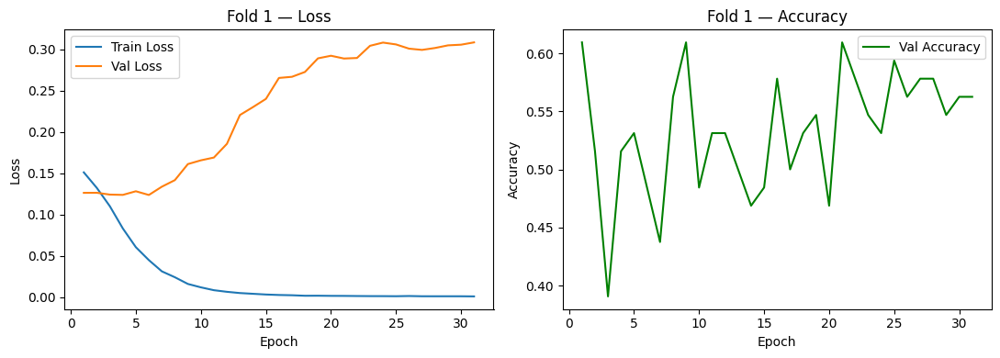

 Gate weights @ best epoch -> Swin: 0.454 | BrainSeg: 0.517 | BrainIAC: 0.030


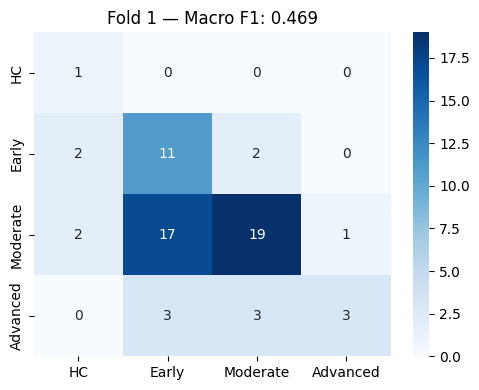

              precision    recall  f1-score   support

          HC       0.20      1.00      0.33         1
       Early       0.35      0.73      0.48        15
    Moderate       0.79      0.49      0.60        39
    Advanced       0.75      0.33      0.46         9

    accuracy                           0.53        64
   macro avg       0.52      0.64      0.47        64
weighted avg       0.67      0.53      0.55        64


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 2/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [125  81 306  55]
 [SMOTE] After:  [214 214 306 214]
  Epoch   5 | Train Loss: 0.0710 | Val Loss: 0.1476 | Val F1: 0.5009 | Val Acc: 0.5287
  Epoch  10 | Train Loss: 0.0164 | Val Loss: 0.1957 | Val F1: 0.5275 | Val Acc: 0.6207
  Epoch  15 | Train Loss: 0.0047 | Val Loss: 0.2962 | Val F1: 0.4392 | Val Acc: 0.5977
  Epoch  20 | Train Loss: 0.0029 | Val Loss: 0.3123 | Val F1: 0.4987 | Val Acc: 0.6092
  Epoch  25 

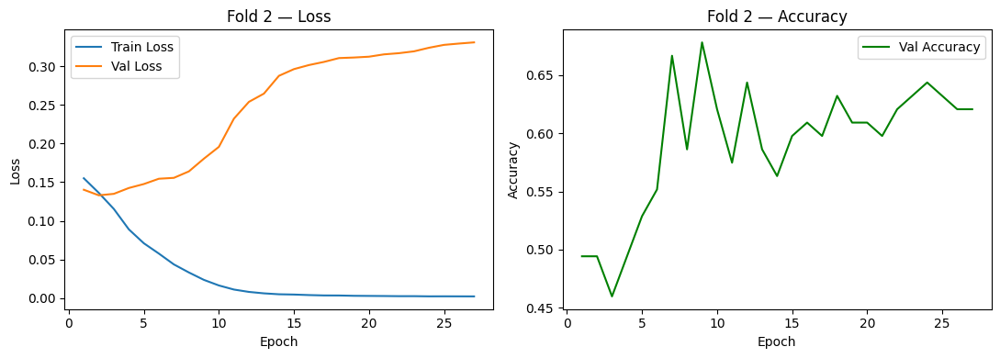

 Gate weights @ best epoch -> Swin: 0.600 | BrainSeg: 0.360 | BrainIAC: 0.040


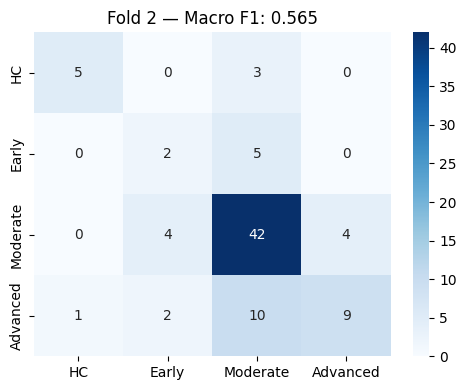

              precision    recall  f1-score   support

          HC       0.83      0.62      0.71         8
       Early       0.25      0.29      0.27         7
    Moderate       0.70      0.84      0.76        50
    Advanced       0.69      0.41      0.51        22

    accuracy                           0.67        87
   macro avg       0.62      0.54      0.56        87
weighted avg       0.67      0.67      0.66        87


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 3/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [124  73 319  73]
 [SMOTE] After:  [223 223 319 223]
  Epoch   5 | Train Loss: 0.0617 | Val Loss: 0.1061 | Val F1: 0.3924 | Val Acc: 0.5846
  Epoch  10 | Train Loss: 0.0132 | Val Loss: 0.1703 | Val F1: 0.4236 | Val Acc: 0.5692
  Epoch  15 | Train Loss: 0.0032 | Val Loss: 0.2353 | Val F1: 0.4267 | Val Acc: 0.5538
  Epoch  20 | Train Loss: 0.0020 | Val Loss: 0.2660 | Val F1: 0.3842 | Val Acc: 0.5538
  Epoch  25 

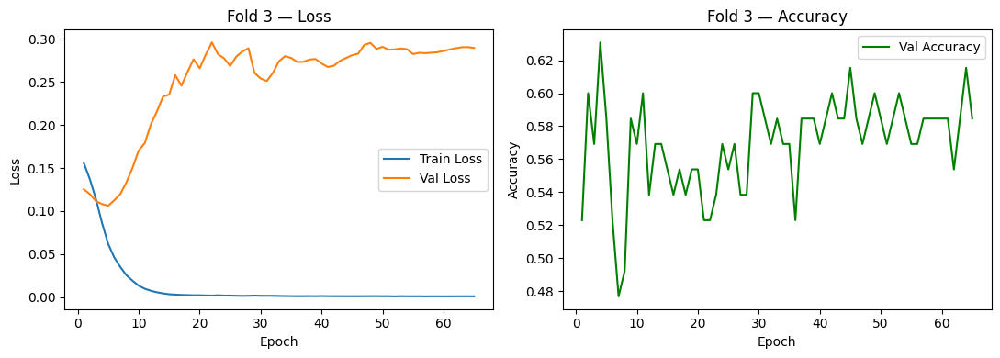

 Gate weights @ best epoch -> Swin: 0.722 | BrainSeg: 0.212 | BrainIAC: 0.067


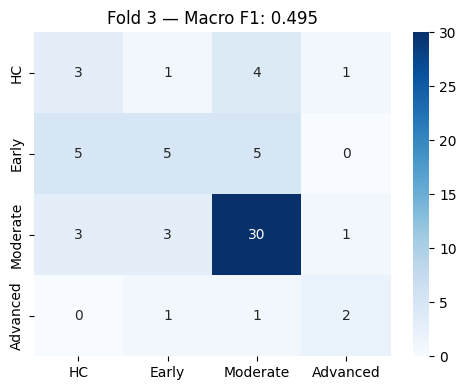

              precision    recall  f1-score   support

          HC       0.27      0.33      0.30         9
       Early       0.50      0.33      0.40        15
    Moderate       0.75      0.81      0.78        37
    Advanced       0.50      0.50      0.50         4

    accuracy                           0.62        65
   macro avg       0.51      0.49      0.49        65
weighted avg       0.61      0.62      0.61        65


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 4/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [115  80 325  71]
 [SMOTE] After:  [227 227 325 227]
  Epoch   5 | Train Loss: 0.0563 | Val Loss: 0.1240 | Val F1: 0.4604 | Val Acc: 0.4762
  Epoch  10 | Train Loss: 0.0110 | Val Loss: 0.2062 | Val F1: 0.4424 | Val Acc: 0.4921
  Epoch  15 | Train Loss: 0.0043 | Val Loss: 0.2841 | Val F1: 0.3797 | Val Acc: 0.3968
  Epoch  20 | Train Loss: 0.0026 | Val Loss: 0.2931 | Val F1: 0.3925 | Val Acc: 0.4603
  Epoch  25 

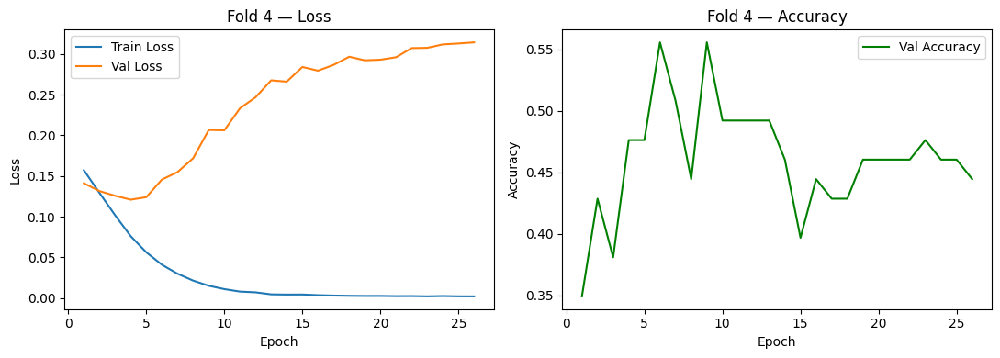

 Gate weights @ best epoch -> Swin: 0.629 | BrainSeg: 0.321 | BrainIAC: 0.049


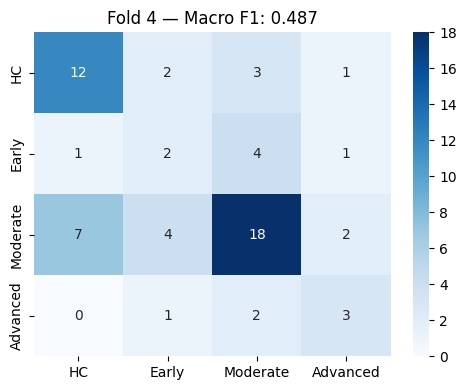

              precision    recall  f1-score   support

          HC       0.60      0.67      0.63        18
       Early       0.22      0.25      0.24         8
    Moderate       0.67      0.58      0.62        31
    Advanced       0.43      0.50      0.46         6

    accuracy                           0.56        63
   macro avg       0.48      0.50      0.49        63
weighted avg       0.57      0.56      0.56        63


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 5/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [120  80 315  67]
 [SMOTE] After:  [220 220 315 220]
  Epoch   5 | Train Loss: 0.0584 | Val Loss: 0.1580 | Val F1: 0.4196 | Val Acc: 0.4444
  Epoch  10 | Train Loss: 0.0137 | Val Loss: 0.2312 | Val F1: 0.4002 | Val Acc: 0.5556
  Epoch  15 | Train Loss: 0.0034 | Val Loss: 0.3229 | Val F1: 0.3963 | Val Acc: 0.5278
  Epoch  20 | Train Loss: 0.0016 | Val Loss: 0.3712 | Val F1: 0.3271 | Val Acc: 0.4583
  Epoch  25 

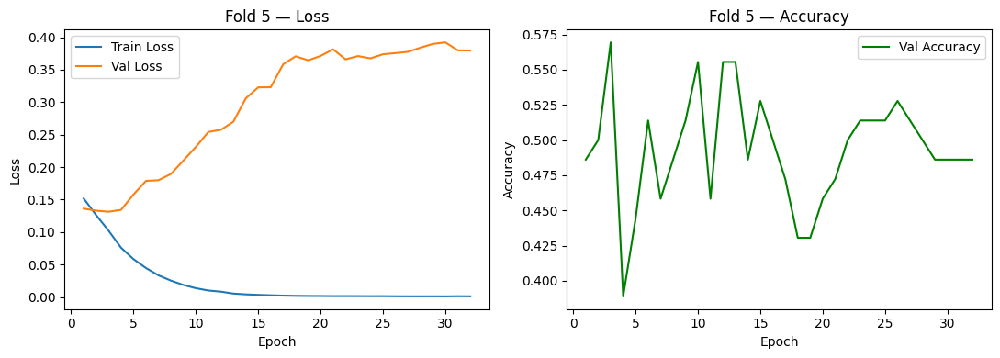

 Gate weights @ best epoch -> Swin: 0.555 | BrainSeg: 0.393 | BrainIAC: 0.052


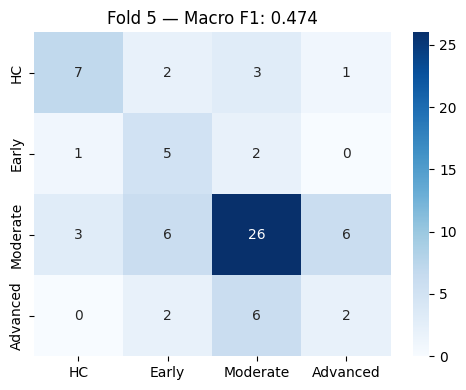

              precision    recall  f1-score   support

          HC       0.64      0.54      0.58        13
       Early       0.33      0.62      0.43         8
    Moderate       0.70      0.63      0.67        41
    Advanced       0.22      0.20      0.21        10

    accuracy                           0.56        72
   macro avg       0.47      0.50      0.47        72
weighted avg       0.58      0.56      0.56        72


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 6/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [120  81 323  72]
 [SMOTE] After:  [226 226 323 226]
  Epoch   5 | Train Loss: 0.0564 | Val Loss: 0.1161 | Val F1: 0.4039 | Val Acc: 0.5172
  Epoch  10 | Train Loss: 0.0104 | Val Loss: 0.2123 | Val F1: 0.4149 | Val Acc: 0.5172
  Epoch  15 | Train Loss: 0.0037 | Val Loss: 0.2846 | Val F1: 0.3997 | Val Acc: 0.6034
  Epoch  20 | Train Loss: 0.0026 | Val Loss: 0.3223 | Val F1: 0.3726 | Val Acc: 0.5690
  Epoch  25 

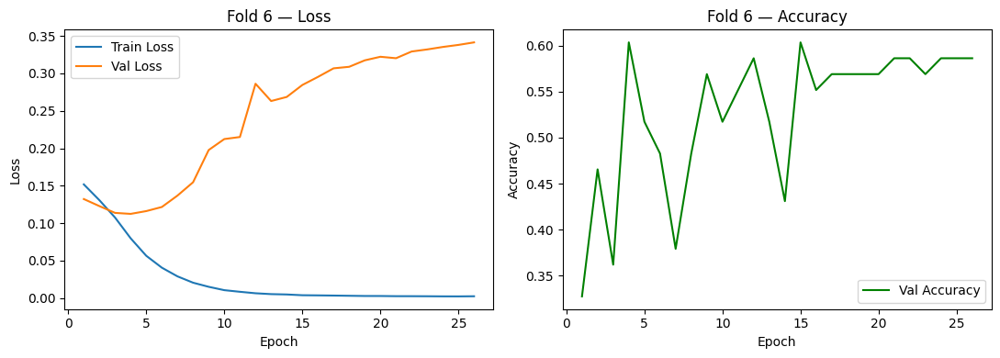

 Gate weights @ best epoch -> Swin: 0.559 | BrainSeg: 0.406 | BrainIAC: 0.034


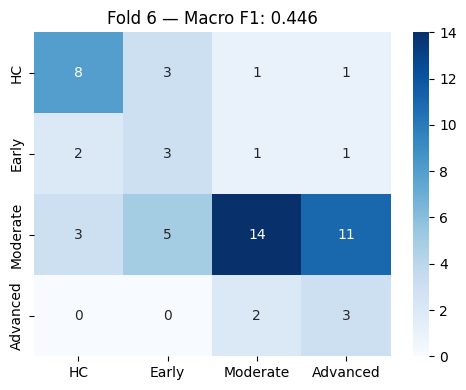

              precision    recall  f1-score   support

          HC       0.62      0.62      0.62        13
       Early       0.27      0.43      0.33         7
    Moderate       0.78      0.42      0.55        33
    Advanced       0.19      0.60      0.29         5

    accuracy                           0.48        58
   macro avg       0.46      0.52      0.45        58
weighted avg       0.63      0.48      0.52        58


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 7/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [116  79 322  70]
 [SMOTE] After:  [225 225 322 225]
  Epoch   5 | Train Loss: 0.0566 | Val Loss: 0.1198 | Val F1: 0.4063 | Val Acc: 0.4478
  Epoch  10 | Train Loss: 0.0107 | Val Loss: 0.1908 | Val F1: 0.4155 | Val Acc: 0.4627
  Epoch  15 | Train Loss: 0.0033 | Val Loss: 0.2707 | Val F1: 0.3647 | Val Acc: 0.4776
  Epoch  20 | Train Loss: 0.0021 | Val Loss: 0.3012 | Val F1: 0.3677 | Val Acc: 0.5075
  Epoch  25 

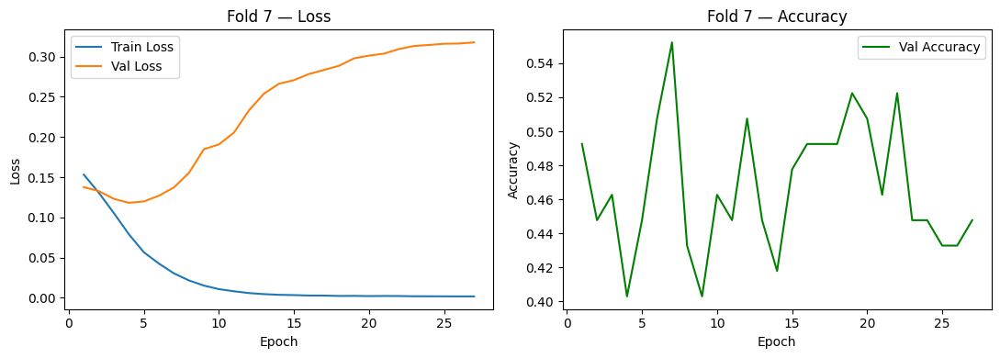

 Gate weights @ best epoch -> Swin: 0.534 | BrainSeg: 0.427 | BrainIAC: 0.039


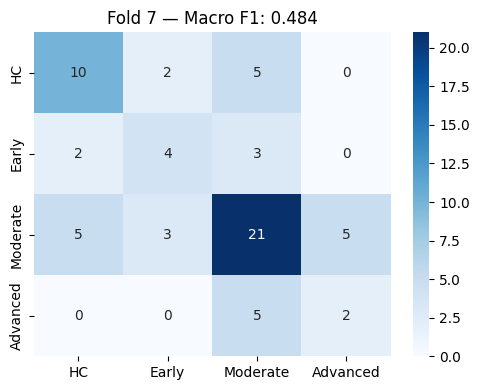

              precision    recall  f1-score   support

          HC       0.59      0.59      0.59        17
       Early       0.44      0.44      0.44         9
    Moderate       0.62      0.62      0.62        34
    Advanced       0.29      0.29      0.29         7

    accuracy                           0.55        67
   macro avg       0.48      0.48      0.48        67
weighted avg       0.55      0.55      0.55        67


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 8/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [109  87 337  72]
 [SMOTE] After:  [235 235 337 235]
  Epoch   5 | Train Loss: 0.0594 | Val Loss: 0.1024 | Val F1: 0.5215 | Val Acc: 0.5918
  Epoch  10 | Train Loss: 0.0098 | Val Loss: 0.2018 | Val F1: 0.6353 | Val Acc: 0.6939
  Epoch  15 | Train Loss: 0.0032 | Val Loss: 0.2349 | Val F1: 0.5493 | Val Acc: 0.6735
  Epoch  20 | Train Loss: 0.0020 | Val Loss: 0.3181 | Val F1: 0.4847 | Val Acc: 0.6122
  Epoch  25 

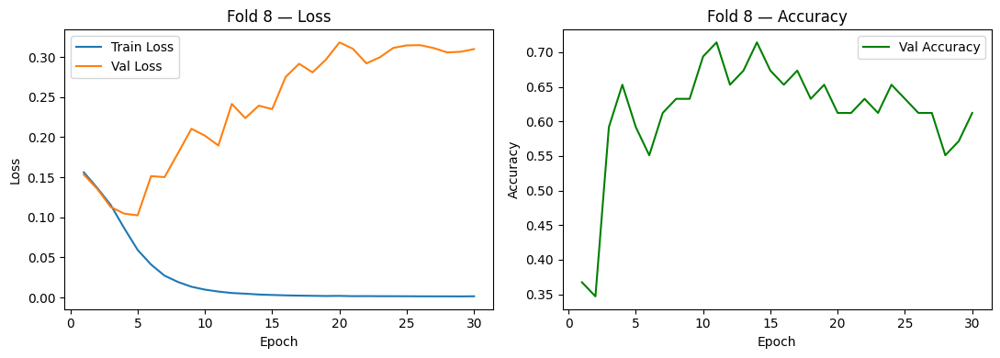

 Gate weights @ best epoch -> Swin: 0.584 | BrainSeg: 0.384 | BrainIAC: 0.032


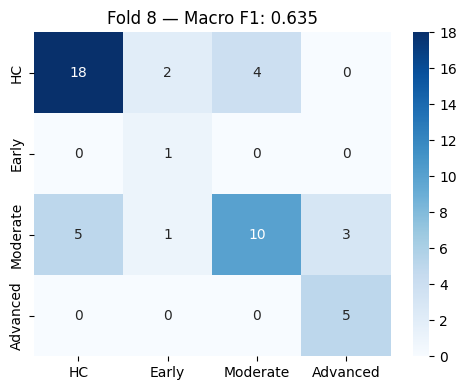

              precision    recall  f1-score   support

          HC       0.78      0.75      0.77        24
       Early       0.25      1.00      0.40         1
    Moderate       0.71      0.53      0.61        19
    Advanced       0.62      1.00      0.77         5

    accuracy                           0.69        49
   macro avg       0.59      0.82      0.64        49
weighted avg       0.73      0.69      0.70        49


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 9/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [121  79 320  72]
 [SMOTE] After:  [224 224 320 224]
  Epoch   5 | Train Loss: 0.0587 | Val Loss: 0.1198 | Val F1: 0.4409 | Val Acc: 0.5000
  Epoch  10 | Train Loss: 0.0113 | Val Loss: 0.1595 | Val F1: 0.4483 | Val Acc: 0.5645
  Epoch  15 | Train Loss: 0.0035 | Val Loss: 0.2126 | Val F1: 0.4625 | Val Acc: 0.5645
  Epoch  20 | Train Loss: 0.0023 | Val Loss: 0.2446 | Val F1: 0.4120 | Val Acc: 0.4677
  Epoch  25 

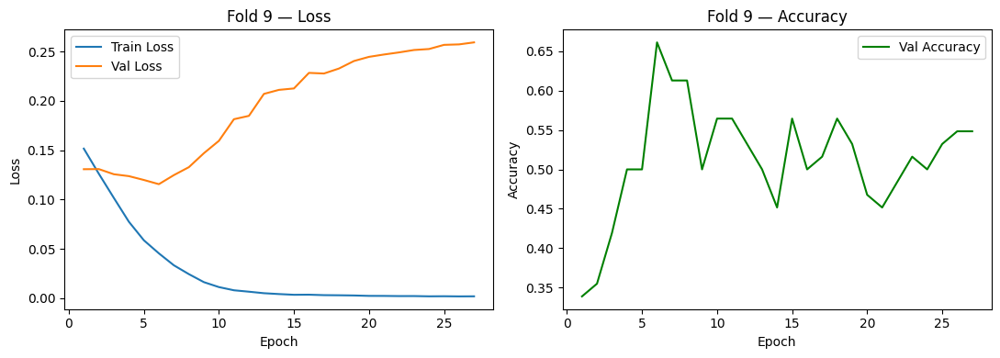

 Gate weights @ best epoch -> Swin: 0.547 | BrainSeg: 0.383 | BrainIAC: 0.071


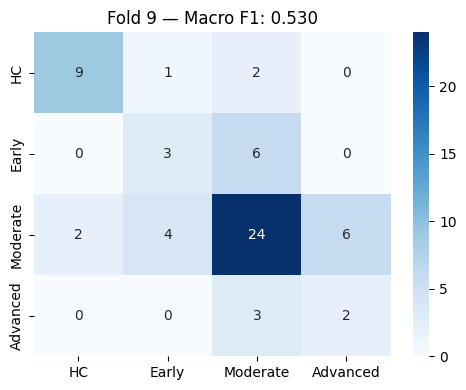

              precision    recall  f1-score   support

          HC       0.82      0.75      0.78        12
       Early       0.38      0.33      0.35         9
    Moderate       0.69      0.67      0.68        36
    Advanced       0.25      0.40      0.31         5

    accuracy                           0.61        62
   macro avg       0.53      0.54      0.53        62
weighted avg       0.63      0.61      0.62        62


EXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD 10/10
 [Features] -> Clin: 64 | Swin: 768 | BrainSeg: 768 | BrainIAC: 765
 [SMOTE] Before: [115  79 320  73]
 [SMOTE] After:  [224 224 320 224]
  Epoch   5 | Train Loss: 0.0634 | Val Loss: 0.1042 | Val F1: 0.4765 | Val Acc: 0.5075
  Epoch  10 | Train Loss: 0.0140 | Val Loss: 0.1830 | Val F1: 0.4254 | Val Acc: 0.4478
  Epoch  15 | Train Loss: 0.0056 | Val Loss: 0.2410 | Val F1: 0.4246 | Val Acc: 0.5075
  Epoch  20 | Train Loss: 0.0037 | Val Loss: 0.2606 | Val F1: 0.3564 | Val Acc: 0.5075
  Early sto

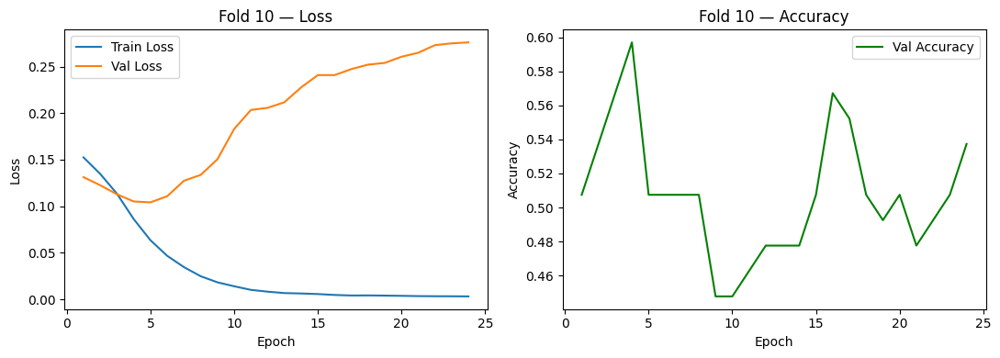

 Gate weights @ best epoch -> Swin: 0.505 | BrainSeg: 0.406 | BrainIAC: 0.088


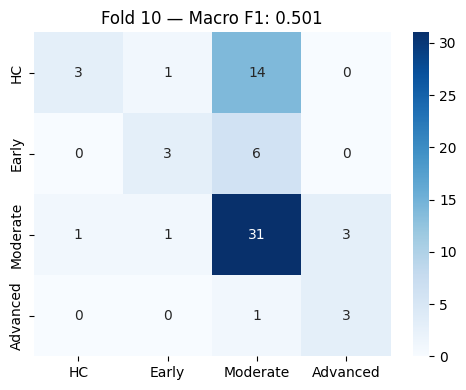

              precision    recall  f1-score   support

          HC       0.75      0.17      0.27        18
       Early       0.60      0.33      0.43         9
    Moderate       0.60      0.86      0.70        36
    Advanced       0.50      0.75      0.60         4

    accuracy                           0.60        67
   macro avg       0.61      0.53      0.50        67
weighted avg       0.63      0.60      0.55        67


OVERALL OOF MACRO F1: 0.5236
Mean gate weights across folds (Swin / BrainSeg / BrainIAC): [0.5688791  0.38101092 0.05010993]


In [ ]:
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
SMOTE_TARGET_RATIO = 0.7  # minority classes raised to 60% of majority count per fold; 1.0 = full balance
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()


sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_gate_means = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
    print(f"\n{'='*70}\nEXECUTING DYNAMIC GATED CYCLE (SWIN+BRAINSEG+BRAINIAC): FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r     = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    sw_train_r, sw_val_r   = X_swin_raw[train_idx], X_swin_raw[val_idx]
    bs_train_r, bs_val_r   = X_brainseg_raw[train_idx], X_brainseg_raw[val_idx]
    bi_train_r, bi_val_r   = X_brainiac_raw[train_idx], X_brainiac_raw[val_idx]
    y_train, y_val         = y[train_idx], y[val_idx]

    scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
    scaler_sw = StandardScaler(); sw_train = scaler_sw.fit_transform(sw_train_r); sw_val = scaler_sw.transform(sw_val_r)
    scaler_bs = StandardScaler(); bs_train = scaler_bs.fit_transform(bs_train_r); bs_val = scaler_bs.transform(bs_val_r)
    scaler_bi = StandardScaler(); bi_train = scaler_bi.fit_transform(bi_train_r); bi_val = scaler_bi.transform(bi_val_r)

    print(f" [Features] -> Clin: {c_train.shape[1]} | Swin: {sw_train.shape[1]} | BrainSeg: {bs_train.shape[1]} | BrainIAC: {bi_train.shape[1]}")

    # ── SMOTE: fit on concatenated train blocks so one interpolation ratio applies
    # consistently across all four branches per synthetic sample (train fold only) ──
    c_dim, sw_dim, bs_dim = c_train.shape[1], sw_train.shape[1], bs_train.shape[1]
    X_train_concat = np.concatenate([c_train, sw_train, bs_train, bi_train], axis=1)

    pre_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [SMOTE] Before: {pre_counts}")
    majority_count = pre_counts.max()
    sampling_strategy = {c: max(pre_counts[c], int(majority_count * SMOTE_TARGET_RATIO)) for c in range(NUM_CLASSES)}
    sampling_strategy = {c: n for c, n in sampling_strategy.items() if n > pre_counts[c]}

    if sampling_strategy:
        smallest_involved = min(pre_counts[c] for c in sampling_strategy)
        k_neighbors = max(1, min(5, smallest_involved - 1))
        smote = SMOTE(sampling_strategy=sampling_strategy, k_neighbors=k_neighbors, random_state=42)
        X_train_concat, y_train = smote.fit_resample(X_train_concat, y_train)

    c_train  = X_train_concat[:, :c_dim]
    sw_train = X_train_concat[:, c_dim:c_dim+sw_dim]
    bs_train = X_train_concat[:, c_dim+sw_dim:c_dim+sw_dim+bs_dim]
    bi_train = X_train_concat[:, c_dim+sw_dim+bs_dim:]

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [SMOTE] After:  {class_counts}")

    train_loader = DataLoader(MultimodalDataset(c_train, sw_train, bs_train, bi_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, sw_val, bs_val, bi_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], swin_dim=sw_train.shape[1],
        brainseg_dim=bs_train.shape[1], brainiac_dim=bi_train.shape[1], dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    best_gate_mean = None
    patience_cnt = 0
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xsw, xbs, xbi, yb in train_loader:
            xc, xsw, xbs, xbi, yb = xc.to(device), xsw.to(device), xbs.to(device), xbi.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xc, xsw, xbs, xbi)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list, gate_list = [], [], []
        with torch.no_grad():
            for xc, xsw, xbs, xbi, yb in val_loader:
                logits, _, gate_coeffs = model(xc.to(device), xsw.to(device), xbs.to(device), xbi.to(device))
                logits_list.append(logits.cpu())
                gate_list.append(gate_coeffs.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        gate_all = torch.cat(gate_list).numpy()
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            best_gate_mean = gate_all.mean(axis=0)  # [g_swin, g_brainseg, g_brainiac] at best epoch
        else:
            patience_cnt += 1

        if (epoch+1) % 5 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    # ── Loss + Accuracy curves for this fold ──
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df.index+1, hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df.index+1, hist_df['val_loss'], label='Val Loss')
    axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss'); axes[0].set_title(f'Fold {fold+1} — Loss'); axes[0].legend()

    axes[1].plot(hist_df.index+1, hist_df['val_acc'], label='Val Accuracy', color='green')
    axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Accuracy'); axes[1].set_title(f'Fold {fold+1} — Accuracy'); axes[1].legend()
    plt.tight_layout()
    plt.show()
    plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xsw, xbs, xbi, _ in val_loader:
            logits, _, _ = model(xc.to(device), xsw.to(device), xbs.to(device), xbi.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    fold_gate_means.append(best_gate_mean)
    print(f" Gate weights @ best epoch -> Swin: {best_gate_mean[0]:.3f} | BrainSeg: {best_gate_mean[1]:.3f} | BrainIAC: {best_gate_mean[2]:.3f}")

    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])
    fig, ax = plt.subplots(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    ax.set_title(f'Fold {fold+1} — Macro F1: {best_f1:.3f}')
    plt.tight_layout()
    plt.show()
    plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")
print("Mean gate weights across folds (Swin / BrainSeg / BrainIAC):", np.array(fold_gate_means).mean(axis=0))

resnet10+50+ brainiac late fusion

Dataset Parsed successfully. Final Combined Shape: (654, 1846)
0    133
1     88
2    356
3     77
Name: count, dtype: int64

LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 1/10
  Epoch  10 | Train Loss: 0.1017 | Val Loss: 0.1236 | Val F1: 0.4466 | Val Acc: 0.6094
  Epoch  20 | Train Loss: 0.0738 | Val Loss: 0.1186 | Val F1: 0.4690 | Val Acc: 0.5938
  Early stopping on Epoch 26.


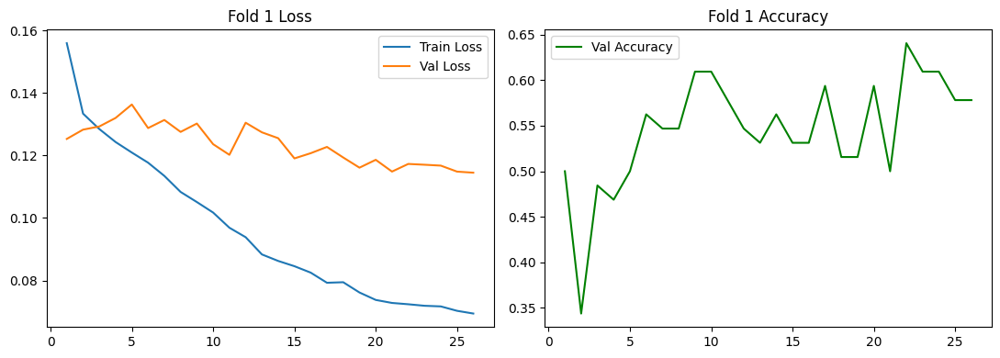

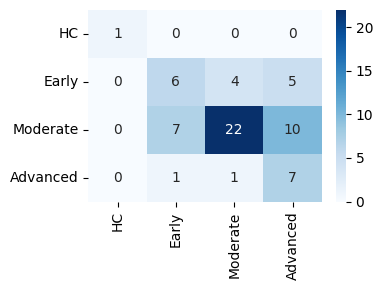

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.43      0.40      0.41        15
    Moderate       0.81      0.56      0.67        39
    Advanced       0.32      0.78      0.45         9

    accuracy                           0.56        64
   macro avg       0.64      0.69      0.63        64
weighted avg       0.66      0.56      0.58        64


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 2/10
  Epoch  10 | Train Loss: 0.0928 | Val Loss: 0.1374 | Val F1: 0.4619 | Val Acc: 0.5057
  Epoch  20 | Train Loss: 0.0684 | Val Loss: 0.1562 | Val F1: 0.5157 | Val Acc: 0.5862
  Epoch  30 | Train Loss: 0.0540 | Val Loss: 0.1672 | Val F1: 0.5796 | Val Acc: 0.6552
  Epoch  40 | Train Loss: 0.0461 | Val Loss: 0.1732 | Val F1: 0.5651 | Val Acc: 0.6782
  Early stopping on Epoch 46.


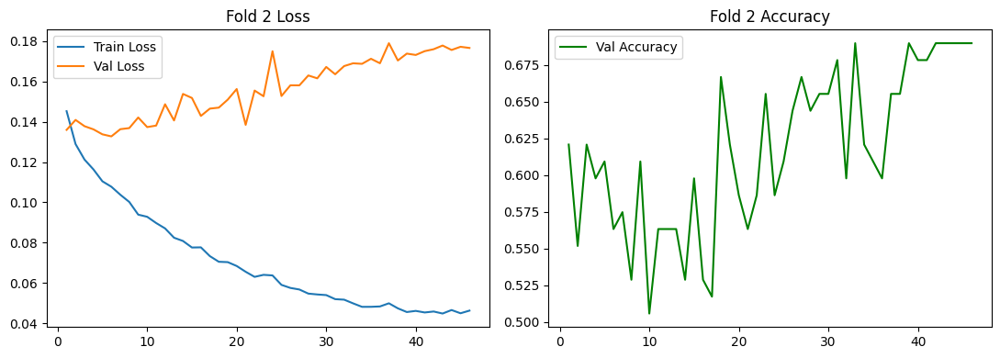

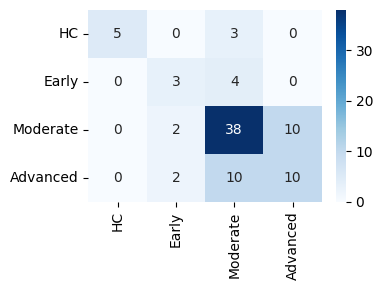

              precision    recall  f1-score   support

          HC       1.00      0.62      0.77         8
       Early       0.43      0.43      0.43         7
    Moderate       0.69      0.76      0.72        50
    Advanced       0.50      0.45      0.48        22

    accuracy                           0.64        87
   macro avg       0.65      0.57      0.60        87
weighted avg       0.65      0.64      0.64        87


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 3/10
  Epoch  10 | Train Loss: 0.0835 | Val Loss: 0.0991 | Val F1: 0.4631 | Val Acc: 0.5538
  Epoch  20 | Train Loss: 0.0617 | Val Loss: 0.0834 | Val F1: 0.6428 | Val Acc: 0.7077
  Epoch  30 | Train Loss: 0.0483 | Val Loss: 0.0754 | Val F1: 0.5996 | Val Acc: 0.6615
  Epoch  40 | Train Loss: 0.0433 | Val Loss: 0.0778 | Val F1: 0.5842 | Val Acc: 0.6308
  Early stopping on Epoch 42.


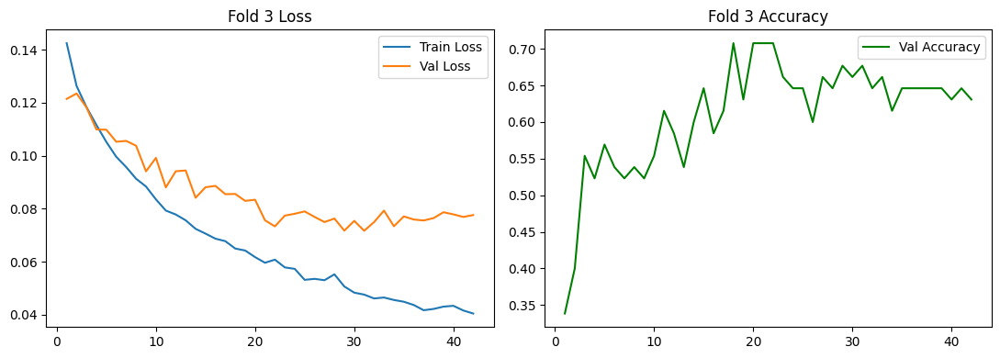

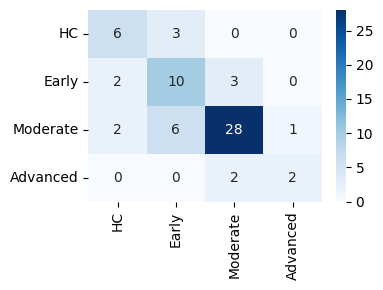

              precision    recall  f1-score   support

          HC       0.60      0.67      0.63         9
       Early       0.53      0.67      0.59        15
    Moderate       0.85      0.76      0.80        37
    Advanced       0.67      0.50      0.57         4

    accuracy                           0.71        65
   macro avg       0.66      0.65      0.65        65
weighted avg       0.73      0.71      0.71        65


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 4/10
  Epoch  10 | Train Loss: 0.1075 | Val Loss: 0.1255 | Val F1: 0.4623 | Val Acc: 0.4762
  Epoch  20 | Train Loss: 0.0804 | Val Loss: 0.1272 | Val F1: 0.4783 | Val Acc: 0.5238
  Epoch  30 | Train Loss: 0.0654 | Val Loss: 0.1275 | Val F1: 0.4729 | Val Acc: 0.5238
  Epoch  40 | Train Loss: 0.0547 | Val Loss: 0.1304 | Val F1: 0.4957 | Val Acc: 0.5556
  Epoch  50 | Train Loss: 0.0501 | Val Loss: 0.1345 | Val F1: 0.4859 | Val Acc: 0.5397
  Epoch  60 | Train Loss: 0.0475 | Val Loss: 0.1357 | Val F1: 0.5091 | Val Acc: 0.

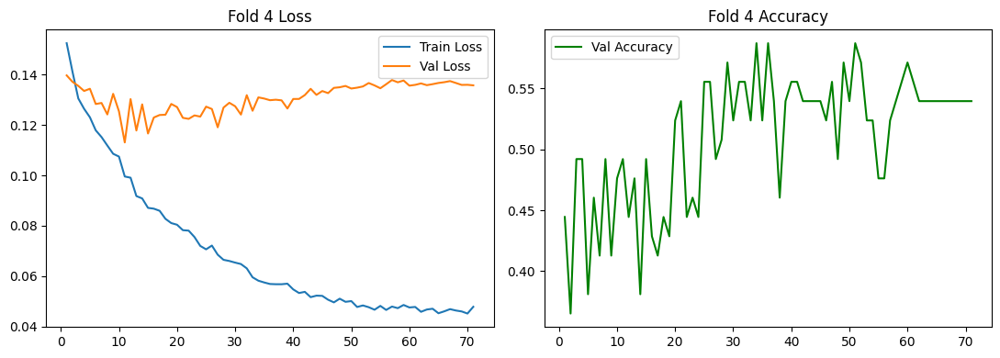

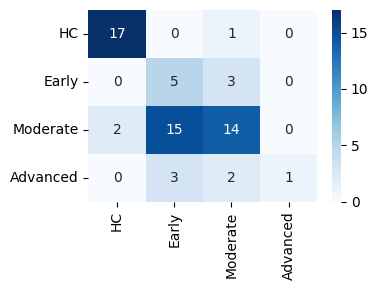

              precision    recall  f1-score   support

          HC       0.89      0.94      0.92        18
       Early       0.22      0.62      0.32         8
    Moderate       0.70      0.45      0.55        31
    Advanced       1.00      0.17      0.29         6

    accuracy                           0.59        63
   macro avg       0.70      0.55      0.52        63
weighted avg       0.72      0.59      0.60        63


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 5/10
  Epoch  10 | Train Loss: 0.1004 | Val Loss: 0.1413 | Val F1: 0.3631 | Val Acc: 0.5417
  Epoch  20 | Train Loss: 0.0691 | Val Loss: 0.1415 | Val F1: 0.4243 | Val Acc: 0.4722
  Epoch  30 | Train Loss: 0.0586 | Val Loss: 0.1324 | Val F1: 0.4752 | Val Acc: 0.5000
  Epoch  40 | Train Loss: 0.0530 | Val Loss: 0.1321 | Val F1: 0.5035 | Val Acc: 0.5833
  Epoch  50 | Train Loss: 0.0465 | Val Loss: 0.1370 | Val F1: 0.5100 | Val Acc: 0.5694
  Epoch  60 | Train Loss: 0.0453 | Val Loss: 0.1396 | Val F1: 0.4869 | Val Acc: 0.

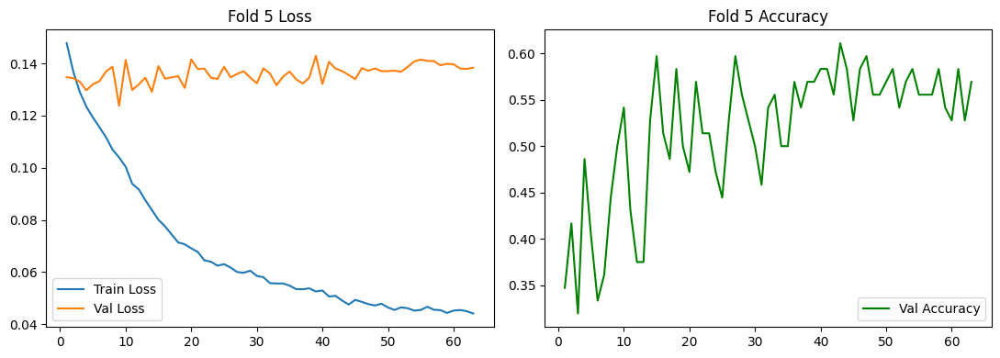

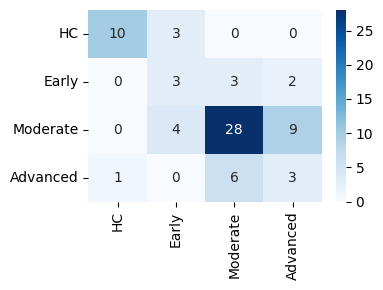

              precision    recall  f1-score   support

          HC       0.91      0.77      0.83        13
       Early       0.30      0.38      0.33         8
    Moderate       0.76      0.68      0.72        41
    Advanced       0.21      0.30      0.25        10

    accuracy                           0.61        72
   macro avg       0.55      0.53      0.53        72
weighted avg       0.66      0.61      0.63        72


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 6/10
  Epoch  10 | Train Loss: 0.0951 | Val Loss: 0.1237 | Val F1: 0.5058 | Val Acc: 0.5517
  Epoch  20 | Train Loss: 0.0702 | Val Loss: 0.1182 | Val F1: 0.4549 | Val Acc: 0.4483
  Early stopping on Epoch 27.


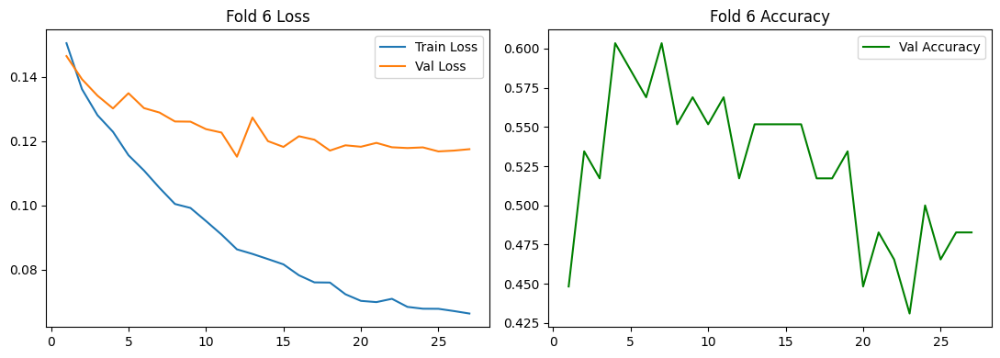

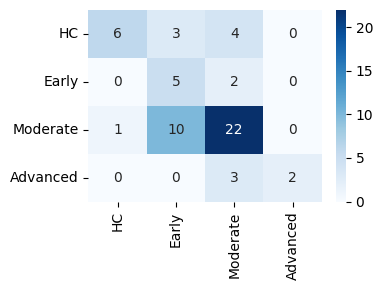

              precision    recall  f1-score   support

          HC       0.86      0.46      0.60        13
       Early       0.28      0.71      0.40         7
    Moderate       0.71      0.67      0.69        33
    Advanced       1.00      0.40      0.57         5

    accuracy                           0.60        58
   macro avg       0.71      0.56      0.56        58
weighted avg       0.72      0.60      0.62        58


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 7/10
  Epoch  10 | Train Loss: 0.1066 | Val Loss: 0.1315 | Val F1: 0.3869 | Val Acc: 0.4030
  Epoch  20 | Train Loss: 0.0844 | Val Loss: 0.1167 | Val F1: 0.4503 | Val Acc: 0.5821
  Epoch  30 | Train Loss: 0.0658 | Val Loss: 0.0941 | Val F1: 0.5759 | Val Acc: 0.6716
  Epoch  40 | Train Loss: 0.0529 | Val Loss: 0.0901 | Val F1: 0.5969 | Val Acc: 0.6418
  Epoch  50 | Train Loss: 0.0497 | Val Loss: 0.0919 | Val F1: 0.5859 | Val Acc: 0.6269
  Early stopping on Epoch 53.


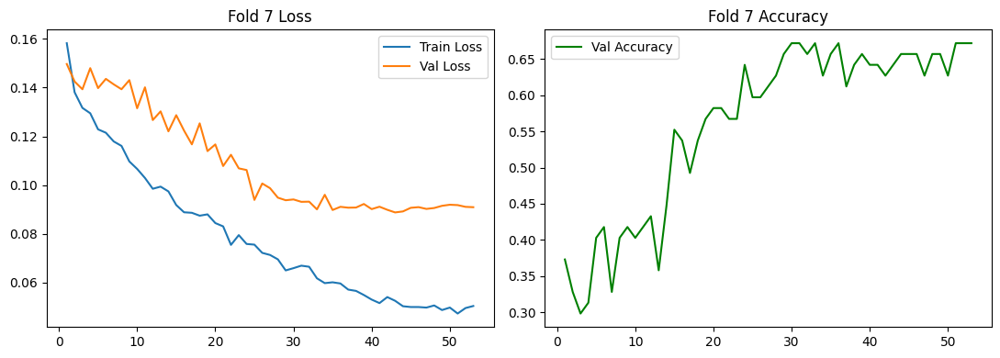

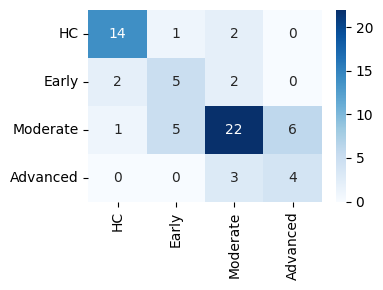

              precision    recall  f1-score   support

          HC       0.82      0.82      0.82        17
       Early       0.45      0.56      0.50         9
    Moderate       0.76      0.65      0.70        34
    Advanced       0.40      0.57      0.47         7

    accuracy                           0.67        67
   macro avg       0.61      0.65      0.62        67
weighted avg       0.70      0.67      0.68        67


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 8/10
  Epoch  10 | Train Loss: 0.0854 | Val Loss: 0.1166 | Val F1: 0.5287 | Val Acc: 0.6735
  Epoch  20 | Train Loss: 0.0609 | Val Loss: 0.1185 | Val F1: 0.6364 | Val Acc: 0.8163
  Epoch  30 | Train Loss: 0.0490 | Val Loss: 0.1235 | Val F1: 0.5825 | Val Acc: 0.7959
  Epoch  40 | Train Loss: 0.0427 | Val Loss: 0.1291 | Val F1: 0.5687 | Val Acc: 0.7755
  Early stopping on Epoch 40.


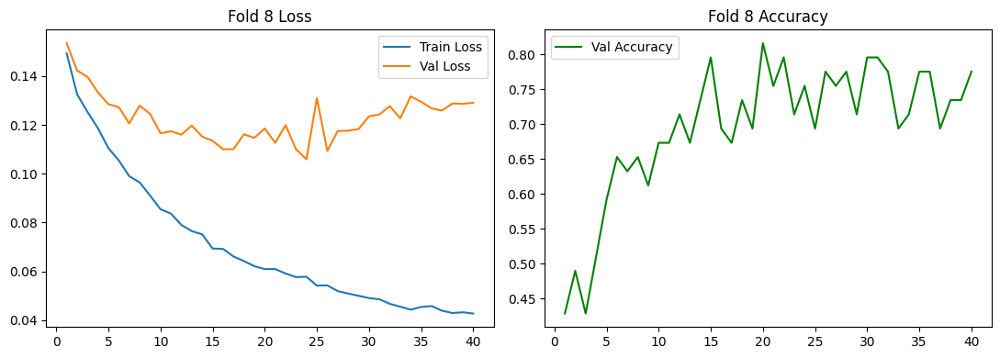

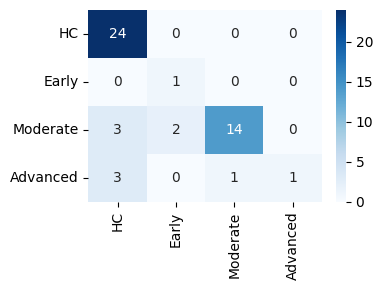

              precision    recall  f1-score   support

          HC       0.80      1.00      0.89        24
       Early       0.33      1.00      0.50         1
    Moderate       0.93      0.74      0.82        19
    Advanced       1.00      0.20      0.33         5

    accuracy                           0.82        49
   macro avg       0.77      0.73      0.64        49
weighted avg       0.86      0.82      0.80        49


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 9/10
  Epoch  10 | Train Loss: 0.0894 | Val Loss: 0.1197 | Val F1: 0.3905 | Val Acc: 0.4839
  Epoch  20 | Train Loss: 0.0651 | Val Loss: 0.1024 | Val F1: 0.4528 | Val Acc: 0.5323
  Early stopping on Epoch 29.


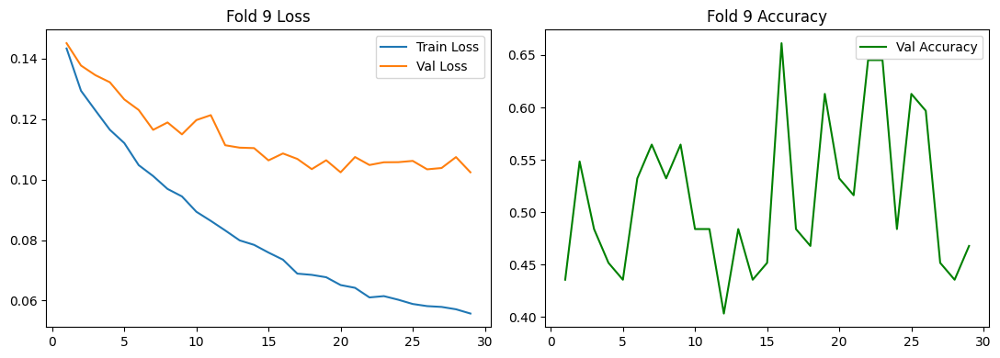

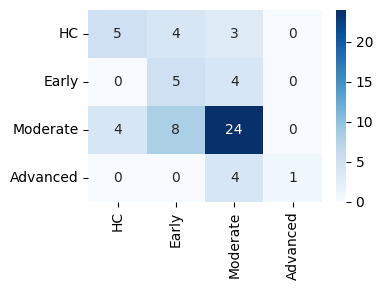

              precision    recall  f1-score   support

          HC       0.56      0.42      0.48        12
       Early       0.29      0.56      0.38         9
    Moderate       0.69      0.67      0.68        36
    Advanced       1.00      0.20      0.33         5

    accuracy                           0.56        62
   macro avg       0.63      0.46      0.47        62
weighted avg       0.63      0.56      0.57        62


LATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD 10/10
  Epoch  10 | Train Loss: 0.0875 | Val Loss: 0.0994 | Val F1: 0.5122 | Val Acc: 0.5075
  Epoch  20 | Train Loss: 0.0653 | Val Loss: 0.0853 | Val F1: 0.5699 | Val Acc: 0.6418
  Epoch  30 | Train Loss: 0.0530 | Val Loss: 0.0912 | Val F1: 0.5059 | Val Acc: 0.5522
  Early stopping on Epoch 37.


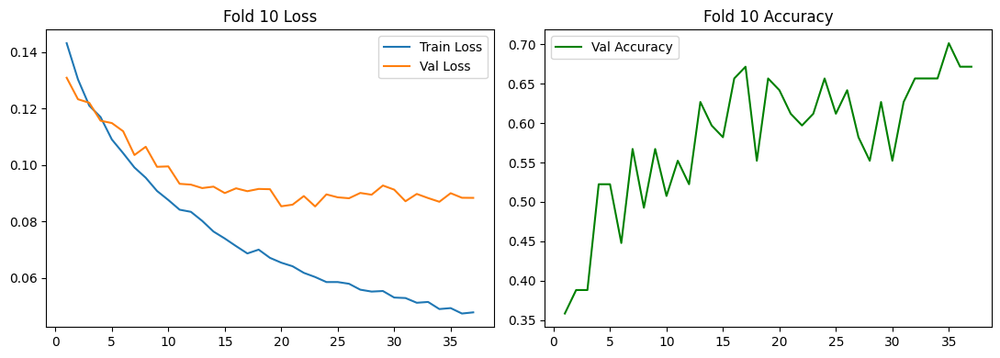

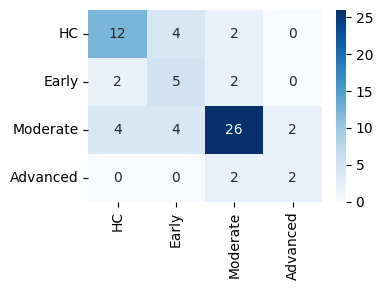

              precision    recall  f1-score   support

          HC       0.67      0.67      0.67        18
       Early       0.38      0.56      0.45         9
    Moderate       0.81      0.72      0.76        36
    Advanced       0.50      0.50      0.50         4

    accuracy                           0.67        67
   macro avg       0.59      0.61      0.60        67
weighted avg       0.70      0.67      0.68        67


OVERALL OOF MACRO F1 [SMOTE ACTIVE]: 0.5840


In [ ]:
import os
import gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE

# Load the necessary dataframes
clinical = pd.read_csv('/content/clinical_embeddings_v2_oof (1).csv')
resnet10 = pd.read_csv('/content/mri_r10_oof_embeddings.csv')
resnet50 = pd.read_csv('/content/mri_resnet50_oof_clean.csv')
brainiac = pd.read_csv('/content/brainiac_oof_embeddings.csv')

# ======================================================================
# ɵ STEP 1: COMPONENT CORRECTION & ROBUST MERGING
# ======================================================================

clin_features     = [col for col in clinical.columns if col.startswith('emb_')]
r10_features_raw  = [col for col in resnet10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw  = [col for col in resnet50.columns if col.startswith('mri_emb_')]
brainiac_features_raw = [col for col in brainiac.columns if col.startswith('emb_dim_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = resnet10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = resnet50[['Image_ID_T1'] + r50_features_raw].copy()
df_brainiac_clean = brainiac[['image_id_t1'] + brainiac_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})

# Inject unique scoping prefixes to safeguard feature tracking boundaries
df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_brainiac_clean = df_brainiac_clean.rename(columns={col: f"brainiac_{col}" for col in brainiac_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]
brainiac_features = [f"brainiac_{col}" for col in brainiac_features_raw]

# Sequential inner joins
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_brainiac_clean, on='Image_ID_T1', how='inner')

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_r10_raw      = merged_df[r10_features].values.astype(np.float32)
X_r50_raw      = merged_df[r50_features].values.astype(np.float32)
X_brainiac_raw = merged_df[brainiac_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"Dataset Parsed successfully. Final Combined Shape: {merged_df.shape}")
print(pd.Series(y).value_counts().sort_index())

# ======================================================================
# ɵ STEP 2: MULTIMODAL DATASET & CONCATENATED LATE FUSION NETWORK
# ======================================================================

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, brainiac, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.brainiac = torch.tensor(brainiac, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.brainiac[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

class MultimodalConcatenatedLateFusionOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, brainiac_dim, embedding_dim=128, num_classes=4, dropout=0.3):
        super().__init__()

        # Branch 1: Independent Clinical Net & Decision Head
        self.clinical_net = nn.Sequential(
            nn.Linear(clinical_dim, 64), nn.LayerNorm(64), nn.ReLU(), nn.Dropout(dropout)
        )
        self.clinical_head = nn.Linear(64, num_classes - 1)

        # Branch 2: Independent ResNet10 Net & Decision Head
        self.r10_net = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, 64), nn.LayerNorm(64), nn.ReLU()
        )
        self.r10_head = nn.Linear(64, num_classes - 1)

        # Branch 3: Independent ResNet50 Net & Decision Head
        self.r50_net = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, 64), nn.LayerNorm(64), nn.ReLU()
        )
        self.r50_head = nn.Linear(64, num_classes - 1)

        # Branch 4: Independent BrainIAC Net & Decision Head
        self.brainiac_net = nn.Sequential(
            nn.Linear(brainiac_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, 64), nn.LayerNorm(64), nn.ReLU()
        )
        self.brainiac_head = nn.Linear(64, num_classes - 1)

        # Meta-Decision Output (Takes concatenated results/logits from the 4 models)
        concat_results_dim = (num_classes - 1) * 4
        self.late_fusion_meta_head = nn.Linear(concat_results_dim, num_classes - 1)

        # Penultimate unified diagnostic embedding mapper
        self.diagnostic_projection = nn.Sequential(
            nn.Linear(64 * 4, embedding_dim), nn.LayerNorm(embedding_dim)
        )

    def forward(self, x_clin, x_r10, x_r50, x_brainiac):
        h_clin = self.clinical_net(x_clin)
        h_r10  = self.r10_net(x_r10)
        h_r50  = self.r50_net(x_r50)
        h_brainiac = self.brainiac_net(x_brainiac)

        # Generate individual model results
        res_clin = self.clinical_head(h_clin)
        res_r10  = self.r10_head(h_r10)
        res_r50  = self.r50_head(h_r50)
        res_brainiac = self.brainiac_head(h_brainiac)

        # Concatenate decisions along feature space
        concatenated_results = torch.cat([res_clin, res_r10, res_r50, res_brainiac], dim=1)
        final_logits = self.late_fusion_meta_head(concatenated_results)

        concat_latent = torch.cat([h_clin, h_r10, h_r50, h_brainiac], dim=1)
        latent_features = self.diagnostic_projection(concat_latent)

        return final_logits, latent_features

# ======================================================================
# ɹ STEP 3: CROSS-VALIDATION LOOP WITH METRIC TRACKING
# ======================================================================

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
SMOTE_TARGET_RATIO = 0.6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()

# sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
# oof_preds = np.zeros(len(y), dtype=int)

# for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
#     assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
#     print(f"\n{'='*70}\nLATE FUSION PIPELINE [SMOTE ACTIVE]: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

#     c_train_r, c_val_r   = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
#     r10_train_r, r10_val_r = X_r10_raw[train_idx], X_r10_raw[val_idx]
#     r50_train_r, r50_val_r = X_r50_raw[train_idx], X_r50_raw[val_idx]
#     bi_train_r, bi_val_r = X_brainiac_raw[train_idx], X_brainiac_raw[val_idx]
#     y_train, y_val       = y[train_idx], y[val_idx]

#     scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
#     scaler_r10 = StandardScaler(); r10_train = scaler_r10.fit_transform(r10_train_r); r10_val = scaler_r10.transform(r10_val_r)
#     scaler_r50 = StandardScaler(); r50_train = scaler_r50.fit_transform(r50_train_r); r50_val = scaler_r50.transform(r50_val_r)
#     scaler_bi = StandardScaler(); bi_train = scaler_bi.fit_transform(bi_train_r); bi_val = scaler_bi.transform(bi_val_r)

#     c_dim, r10_dim, r50_dim = c_train.shape[1], r10_train.shape[1], r50_train.shape[1]
#     X_train_concat = np.concatenate([c_train, r10_train, r50_train, bi_train], axis=1)

#     pre_counts = np.bincount(y_train, minlength=NUM_CLASSES)
#     majority_count = pre_counts.max()
#     sampling_strategy = {c: max(pre_counts[c], int(majority_count * SMOTE_TARGET_RATIO)) for c in range(NUM_CLASSES)}
#     sampling_strategy = {c: n for c, n in sampling_strategy.items() if n > pre_counts[c]}

#     if sampling_strategy:
#         smallest_involved = min(pre_counts[c] for c in sampling_strategy)
#         k_neighbors = max(1, min(5, smallest_involved - 1))
#         smote = SMOTE(sampling_strategy=sampling_strategy, k_neighbors=k_neighbors, random_state=42)
#         X_train_concat, y_train = smote.fit_resample(X_train_concat, y_train)

#     c_train   = X_train_concat[:, :c_dim]
#     r10_train = X_train_concat[:, c_dim:c_dim+r10_dim]
#     r50_train = X_train_concat[:, c_dim+r10_dim:c_dim+r10_dim+r50_dim]
#     bi_train  = X_train_concat[:, c_dim+r10_dim+r50_dim:]

#     class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
#     train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, bi_train, y_train), batch_size=64, shuffle=True)
#     val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, bi_val, y_val), batch_size=256, shuffle=False)

#     model = MultimodalConcatenatedLateFusionOrdinal(
#         clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1],
#         r50_dim=r50_train.shape[1], brainiac_dim=bi_train.shape[1], dropout=0.3
#     ).to(device)

#     criterion = OrdinalFocalLoss(class_counts, device=device)
#     optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
#     scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

#     best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
#     patience_cnt = 0
#     history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

#     for epoch in range(100):
#         model.train()
#         train_loss_sum, n_batches = 0.0, 0
#         for xc, xr10, xr50, xbi, yb in train_loader:
#             xc, xr10, xr50, xbi, yb = xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device), yb.to(device)
#             optimizer.zero_grad()
#             logits, _ = model(xc, xr10, xr50, xbi)
#             loss = criterion(logits, yb)
#             loss.backward()
#             optimizer.step()
#             train_loss_sum += loss.item()
#             n_batches += 1
#         train_loss = train_loss_sum / n_batches

#         model.eval()
#         logits_list, y_list = [], []
#         with torch.no_grad():
#             for xc, xr10, xr50, xbi, yb in val_loader:
#                 logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
#                 logits_list.append(logits.cpu())
#                 y_list.extend(yb.numpy())

#         val_logits = torch.cat(logits_list)
#         y_val_arr = np.array(y_list)
#         val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

#         probs = torch.sigmoid(val_logits)
#         for i in range(1, probs.shape[1]):
#             probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
#         probs = probs.numpy()

#         epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
#         preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
#         epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

#         history['train_loss'].append(train_loss)
#         history['val_loss'].append(val_loss)
#         history['val_acc'].append(epoch_val_acc)

#         scheduler.step(epoch_best_f1)
#         if epoch_best_f1 > best_f1:
#             best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
#             best_state = {k: v.clone() for k, v in model.state_dict().items()}
#         else:
#             patience_cnt += 1

#         if (epoch+1) % 10 == 0:
#             print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
#         if patience_cnt >= PATIENCE:
#             print(f"  Early stopping on Epoch {epoch+1}.")
#             break

#     # Display plots
#     hist_df = pd.DataFrame(history)
#     fig, axes = plt.subplots(1, 2, figsize=(11, 4))
#     axes[0].plot(hist_df.index+1, hist_df['train_loss'], label='Train Loss')
#     axes[0].plot(hist_df.index+1, hist_df['val_loss'], label='Val Loss')
#     axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
#     axes[1].plot(hist_df.index+1, hist_df['val_acc'], label='Val Accuracy', color='green')
#     axes[1].set_title(f'Fold {fold+1} Accuracy'); axes[1].legend()
#     plt.tight_layout(); plt.show(); plt.close()

#     model.load_state_dict(best_state)
#     model.eval()
#     preds_final = []
#     with torch.no_grad():
#         for xc, xr10, xr50, xbi, _ in val_loader:
#             logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
#             probs = torch.sigmoid(logits)
#             for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
#             t = torch.tensor(best_thresholds, device=probs.device)
#             preds = (probs > t).sum(dim=1)
#             preds_final.extend(preds.cpu().numpy())

#     preds_final = np.array(preds_final)
#     oof_preds[val_idx] = preds_final

#     cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])
#     fig, ax = plt.subplots(figsize=(4, 3))
#     sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
#     plt.tight_layout(); plt.show(); plt.close()

#     print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

# print(f"\n{'='*70}\nOVERALL OOF MACRO F1 [SMOTE ACTIVE]: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")

without smote

In [ ]:
import os
import gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE

# Load the necessary dataframes
clinical = pd.read_csv('/content/clinical_embeddings_v2_oof (1).csv')
resnet10 = pd.read_csv('/content/mri_r10_oof_embeddings.csv')
resnet50 = pd.read_csv('/content/mri_resnet50_oof_clean.csv')
brainiac = pd.read_csv('/content/brainiac_oof_embeddings.csv')

# ======================================================================
# ɵ STEP 1: COMPONENT CORRECTION & ROBUST MERGING
# ======================================================================

clin_features     = [col for col in clinical.columns if col.startswith('emb_')]
r10_features_raw  = [col for col in resnet10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw  = [col for col in resnet50.columns if col.startswith('mri_emb_')]
brainiac_features_raw = [col for col in brainiac.columns if col.startswith('emb_dim_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = resnet10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = resnet50[['Image_ID_T1'] + r50_features_raw].copy()
df_brainiac_clean = brainiac[['image_id_t1'] + brainiac_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})

# Inject unique scoping prefixes to safeguard feature tracking boundaries
df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_brainiac_clean = df_brainiac_clean.rename(columns={col: f"brainiac_{col}" for col in brainiac_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]
brainiac_features = [f"brainiac_{col}" for col in brainiac_features_raw]

# Sequential inner joins
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_brainiac_clean, on='Image_ID_T1', how='inner')

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_r10_raw      = merged_df[r10_features].values.astype(np.float32)
X_r50_raw      = merged_df[r50_features].values.astype(np.float32)
X_brainiac_raw = merged_df[brainiac_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"Dataset Parsed successfully. Final Combined Shape: {merged_df.shape}")
print(pd.Series(y).value_counts().sort_index())

# ======================================================================
# ɵ STEP 2: MULTIMODAL DATASET & CONCATENATED LATE FUSION NETWORK
# ======================================================================

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, brainiac, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.brainiac = torch.tensor(brainiac, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.brainiac[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

class MultimodalConcatenatedLateFusionOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, brainiac_dim, embedding_dim=128, num_classes=4, dropout=0.3):
        super().__init__()

        # Branch 1: Independent Clinical Net & Decision Head
        self.clinical_net = nn.Sequential(
            nn.Linear(clinical_dim, 64), nn.LayerNorm(64), nn.ReLU(), nn.Dropout(dropout)
        )
        self.clinical_head = nn.Linear(64, num_classes - 1)

        # Branch 2: Independent ResNet10 Net & Decision Head
        self.r10_net = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, 64), nn.LayerNorm(64), nn.ReLU()
        )
        self.r10_head = nn.Linear(64, num_classes - 1)

        # Branch 3: Independent ResNet50 Net & Decision Head
        self.r50_net = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, 64), nn.LayerNorm(64), nn.ReLU()
        )
        self.r50_head = nn.Linear(64, num_classes - 1)

        # Branch 4: Independent BrainIAC Net & Decision Head
        self.brainiac_net = nn.Sequential(
            nn.Linear(brainiac_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, 64), nn.LayerNorm(64), nn.ReLU()
        )
        self.brainiac_head = nn.Linear(64, num_classes - 1)

        # Meta-Decision Output (Takes concatenated results/logits from the 4 models)
        concat_results_dim = (num_classes - 1) * 4
        self.late_fusion_meta_head = nn.Linear(concat_results_dim, num_classes - 1)

        # Penultimate unified diagnostic embedding mapper
        self.diagnostic_projection = nn.Sequential(
            nn.Linear(64 * 4, embedding_dim), nn.LayerNorm(embedding_dim)
        )

    def forward(self, x_clin, x_r10, x_r50, x_brainiac):
        h_clin = self.clinical_net(x_clin)
        h_r10  = self.r10_net(x_r10)
        h_r50  = self.r50_net(x_r50)
        h_brainiac = self.brainiac_net(x_brainiac)

        # Generate individual model results
        res_clin = self.clinical_head(h_clin)
        res_r10  = self.r10_head(h_r10)
        res_r50  = self.r50_head(h_r50)
        res_brainiac = self.brainiac_head(h_brainiac)

        # Concatenate decisions along feature space
        concatenated_results = torch.cat([res_clin, res_r10, res_r50, res_brainiac], dim=1)
        final_logits = self.late_fusion_meta_head(concatenated_results)

        concat_latent = torch.cat([h_clin, h_r10, h_r50, h_brainiac], dim=1)
        latent_features = self.diagnostic_projection(concat_latent)

        return final_logits, latent_features

# ======================================================================
# ɹ STEP 3: CROSS-VALIDATION LOOP WITH METRIC TRACKING
# ======================================================================

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
SMOTE_TARGET_RATIO = 0.6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()


Dataset Parsed successfully. Final Combined Shape: (654, 1846)
0    133
1     88
2    356
3     77
Name: count, dtype: int64



LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 1/10
 [Distribution] Training Sample Sizes: [132  73 317  68]
  Epoch  10 | Train Loss: 0.1092 | Val Loss: 0.1336 | Val F1: 0.5137 | Val Acc: 0.5156
  Epoch  20 | Train Loss: 0.1009 | Val Loss: 0.1247 | Val F1: 0.3567 | Val Acc: 0.6406
  Early stopping on Epoch 21.


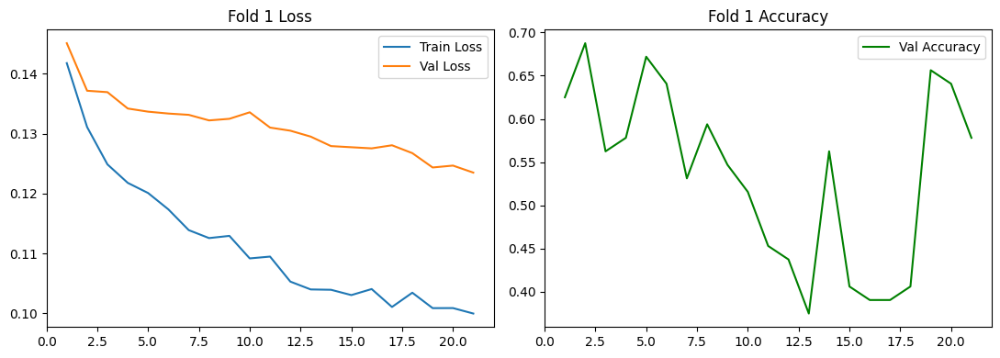

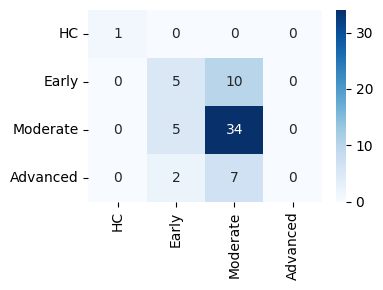

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.42      0.33      0.37        15
    Moderate       0.67      0.87      0.76        39
    Advanced       0.00      0.00      0.00         9

    accuracy                           0.62        64
   macro avg       0.52      0.55      0.53        64
weighted avg       0.52      0.62      0.56        64


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 2/10
 [Distribution] Training Sample Sizes: [125  81 306  55]
  Epoch  10 | Train Loss: 0.1057 | Val Loss: 0.1556 | Val F1: 0.4711 | Val Acc: 0.6092
  Epoch  20 | Train Loss: 0.0815 | Val Loss: 0.1511 | Val F1: 0.5955 | Val Acc: 0.7241
  Epoch  30 | Train Loss: 0.0695 | Val Loss: 0.1529 | Val F1: 0.5944 | Val Acc: 0.6897
  Early stopping on Epoch 34.


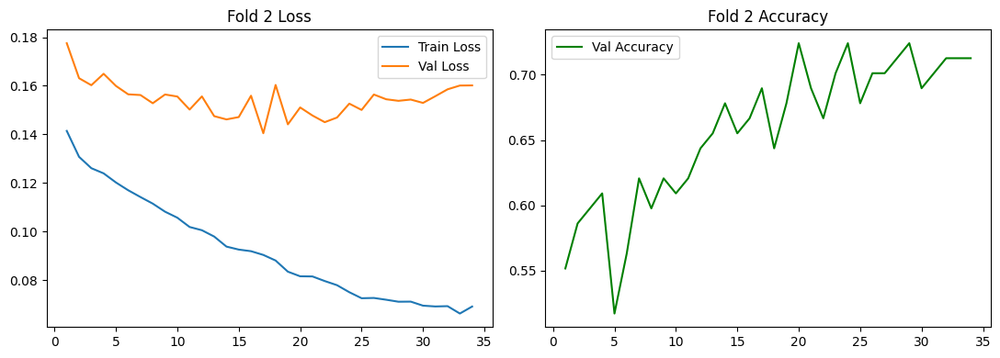

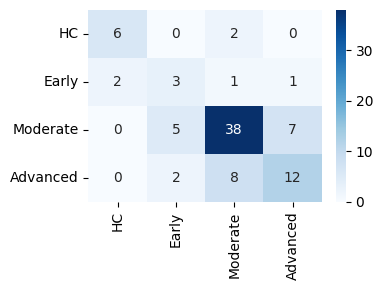

              precision    recall  f1-score   support

          HC       0.75      0.75      0.75         8
       Early       0.30      0.43      0.35         7
    Moderate       0.78      0.76      0.77        50
    Advanced       0.60      0.55      0.57        22

    accuracy                           0.68        87
   macro avg       0.61      0.62      0.61        87
weighted avg       0.69      0.68      0.68        87


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 3/10
 [Distribution] Training Sample Sizes: [124  73 319  73]
  Epoch  10 | Train Loss: 0.1084 | Val Loss: 0.1041 | Val F1: 0.4779 | Val Acc: 0.6000
  Epoch  20 | Train Loss: 0.0834 | Val Loss: 0.0862 | Val F1: 0.5464 | Val Acc: 0.6923
  Epoch  30 | Train Loss: 0.0711 | Val Loss: 0.0804 | Val F1: 0.5899 | Val Acc: 0.6308
  Epoch  40 | Train Loss: 0.0646 | Val Loss: 0.0840 | Val F1: 0.5797 | Val Acc: 0.6462
  Epoch  50 | Train Loss: 0.0572 | Val Loss: 0.0800 | Val F1: 0.5770 | Val Acc: 0.6308
  Epoch  60 | Train 

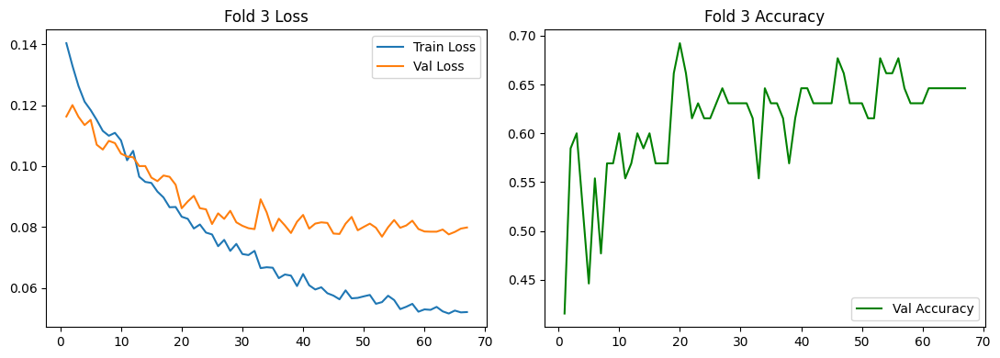

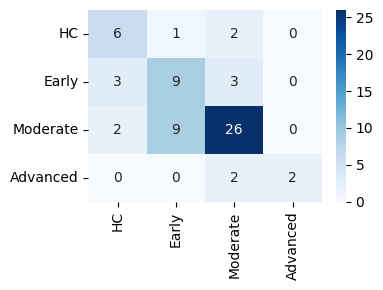

              precision    recall  f1-score   support

          HC       0.55      0.67      0.60         9
       Early       0.47      0.60      0.53        15
    Moderate       0.79      0.70      0.74        37
    Advanced       1.00      0.50      0.67         4

    accuracy                           0.66        65
   macro avg       0.70      0.62      0.63        65
weighted avg       0.69      0.66      0.67        65


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 4/10
 [Distribution] Training Sample Sizes: [115  80 325  71]
  Epoch  10 | Train Loss: 0.1086 | Val Loss: 0.1295 | Val F1: 0.3781 | Val Acc: 0.4286
  Epoch  20 | Train Loss: 0.0958 | Val Loss: 0.1186 | Val F1: 0.4093 | Val Acc: 0.4286
  Epoch  30 | Train Loss: 0.0856 | Val Loss: 0.1137 | Val F1: 0.4967 | Val Acc: 0.5556
  Epoch  40 | Train Loss: 0.0765 | Val Loss: 0.1183 | Val F1: 0.5138 | Val Acc: 0.5714
  Epoch  50 | Train Loss: 0.0668 | Val Loss: 0.1197 | Val F1: 0.5092 | Val Acc: 0.5873
  Epoch  60 | Train 

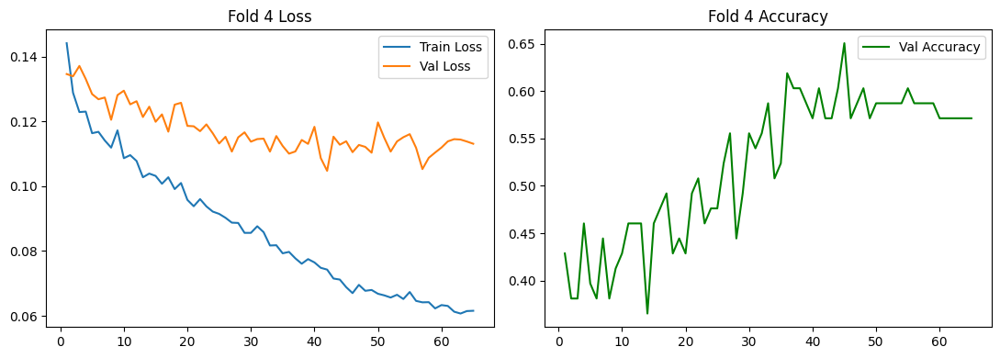

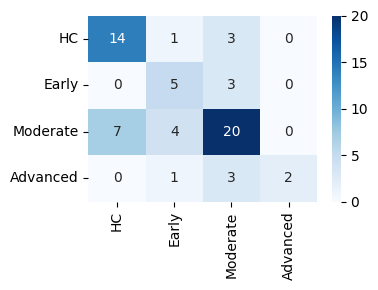

              precision    recall  f1-score   support

          HC       0.67      0.78      0.72        18
       Early       0.45      0.62      0.53         8
    Moderate       0.69      0.65      0.67        31
    Advanced       1.00      0.33      0.50         6

    accuracy                           0.65        63
   macro avg       0.70      0.60      0.60        63
weighted avg       0.68      0.65      0.65        63


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 5/10
 [Distribution] Training Sample Sizes: [120  80 315  67]
  Epoch  10 | Train Loss: 0.1121 | Val Loss: 0.1311 | Val F1: 0.3979 | Val Acc: 0.4444
  Epoch  20 | Train Loss: 0.0997 | Val Loss: 0.1317 | Val F1: 0.4636 | Val Acc: 0.5556
  Epoch  30 | Train Loss: 0.0903 | Val Loss: 0.1286 | Val F1: 0.4903 | Val Acc: 0.5417
  Epoch  40 | Train Loss: 0.0812 | Val Loss: 0.1270 | Val F1: 0.5000 | Val Acc: 0.5000
  Epoch  50 | Train Loss: 0.0755 | Val Loss: 0.1267 | Val F1: 0.5207 | Val Acc: 0.5417
  Early stopping on 

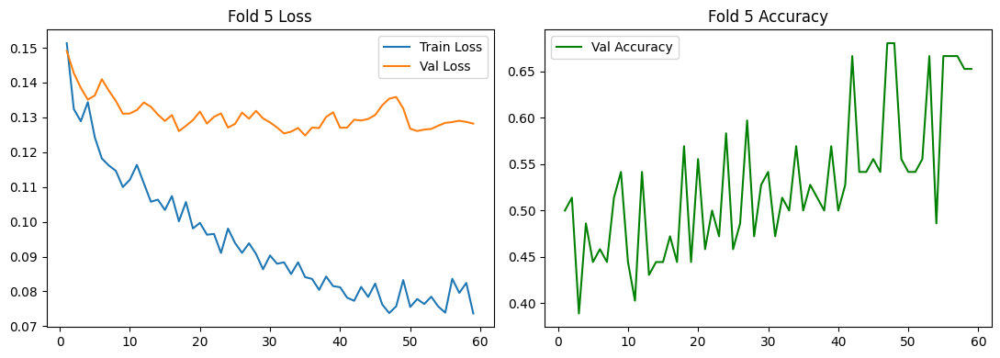

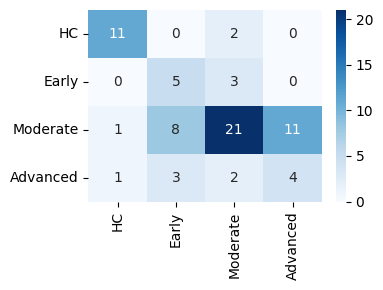

              precision    recall  f1-score   support

          HC       0.85      0.85      0.85        13
       Early       0.31      0.62      0.42         8
    Moderate       0.75      0.51      0.61        41
    Advanced       0.27      0.40      0.32        10

    accuracy                           0.57        72
   macro avg       0.54      0.60      0.55        72
weighted avg       0.65      0.57      0.59        72


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 6/10
 [Distribution] Training Sample Sizes: [120  81 323  72]
  Epoch  10 | Train Loss: 0.1187 | Val Loss: 0.1183 | Val F1: 0.4336 | Val Acc: 0.6034
  Epoch  20 | Train Loss: 0.1011 | Val Loss: 0.1224 | Val F1: 0.4889 | Val Acc: 0.5172
  Epoch  30 | Train Loss: 0.0908 | Val Loss: 0.1229 | Val F1: 0.4945 | Val Acc: 0.5690
  Epoch  40 | Train Loss: 0.0858 | Val Loss: 0.1244 | Val F1: 0.4808 | Val Acc: 0.5517
  Epoch  50 | Train Loss: 0.0820 | Val Loss: 0.1270 | Val F1: 0.4716 | Val Acc: 0.5517
  Early stopping on 

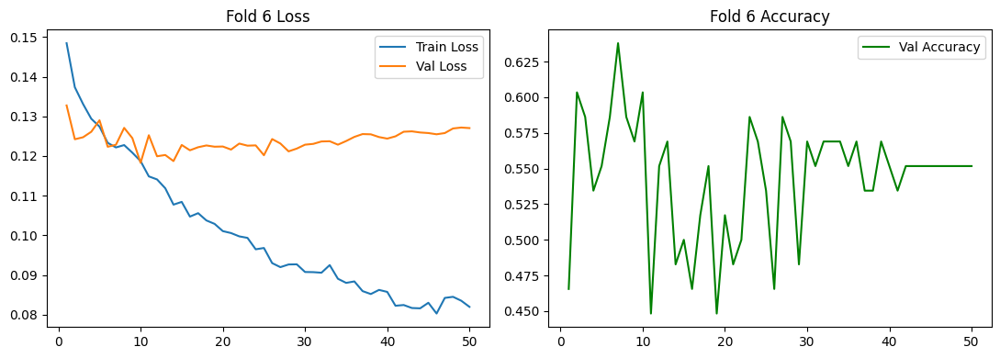

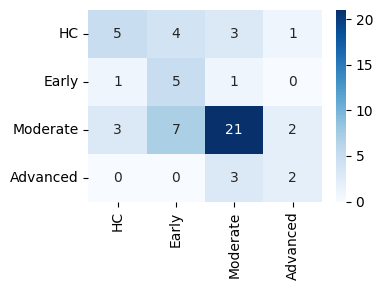

              precision    recall  f1-score   support

          HC       0.56      0.38      0.45        13
       Early       0.31      0.71      0.43         7
    Moderate       0.75      0.64      0.69        33
    Advanced       0.40      0.40      0.40         5

    accuracy                           0.57        58
   macro avg       0.50      0.53      0.49        58
weighted avg       0.62      0.57      0.58        58


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 7/10
 [Distribution] Training Sample Sizes: [116  79 322  70]
  Epoch  10 | Train Loss: 0.1144 | Val Loss: 0.1396 | Val F1: 0.2644 | Val Acc: 0.2836
  Epoch  20 | Train Loss: 0.0954 | Val Loss: 0.1263 | Val F1: 0.3696 | Val Acc: 0.4478
  Epoch  30 | Train Loss: 0.0812 | Val Loss: 0.1220 | Val F1: 0.4974 | Val Acc: 0.5970
  Epoch  40 | Train Loss: 0.0666 | Val Loss: 0.1097 | Val F1: 0.5277 | Val Acc: 0.5373
  Epoch  50 | Train Loss: 0.0573 | Val Loss: 0.1030 | Val F1: 0.5612 | Val Acc: 0.5672
  Epoch  60 | Train 

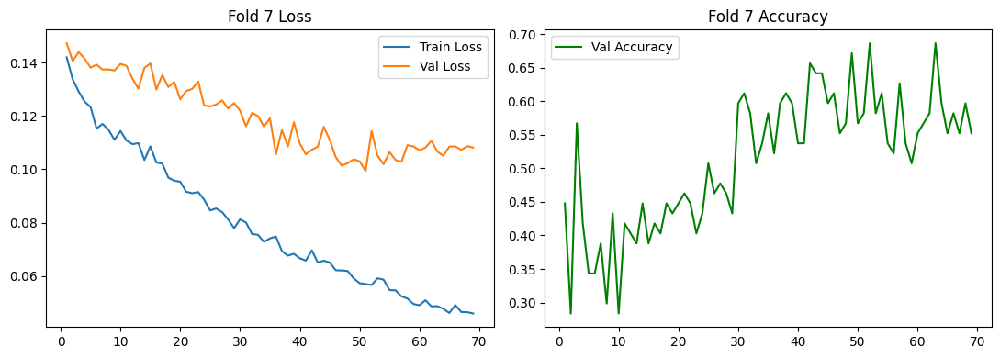

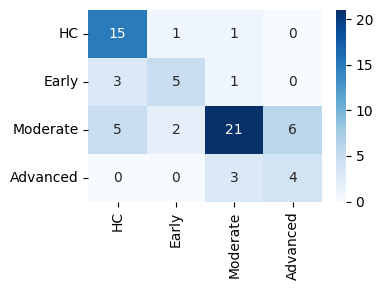

              precision    recall  f1-score   support

          HC       0.65      0.88      0.75        17
       Early       0.62      0.56      0.59         9
    Moderate       0.81      0.62      0.70        34
    Advanced       0.40      0.57      0.47         7

    accuracy                           0.67        67
   macro avg       0.62      0.66      0.63        67
weighted avg       0.70      0.67      0.67        67


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 8/10
 [Distribution] Training Sample Sizes: [109  87 337  72]
  Epoch  10 | Train Loss: 0.1047 | Val Loss: 0.1388 | Val F1: 0.4146 | Val Acc: 0.4694
  Epoch  20 | Train Loss: 0.0933 | Val Loss: 0.1332 | Val F1: 0.5116 | Val Acc: 0.6735
  Epoch  30 | Train Loss: 0.0787 | Val Loss: 0.1241 | Val F1: 0.7321 | Val Acc: 0.7551
  Epoch  40 | Train Loss: 0.0700 | Val Loss: 0.1232 | Val F1: 0.4987 | Val Acc: 0.6735
  Epoch  50 | Train Loss: 0.0670 | Val Loss: 0.1254 | Val F1: 0.5269 | Val Acc: 0.7143
  Early stopping on 

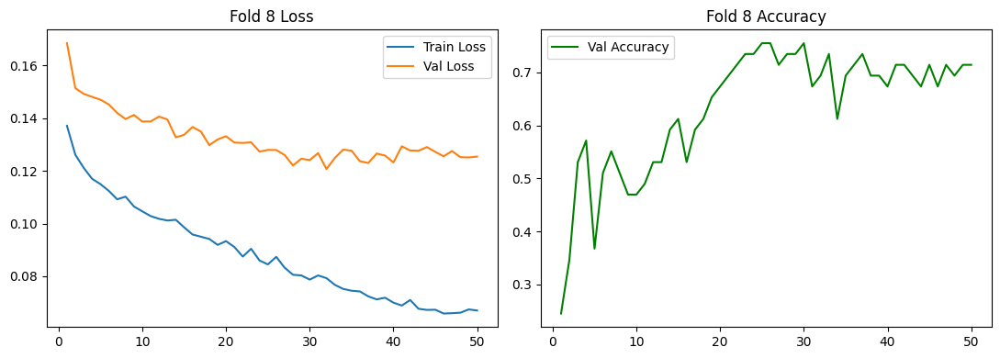

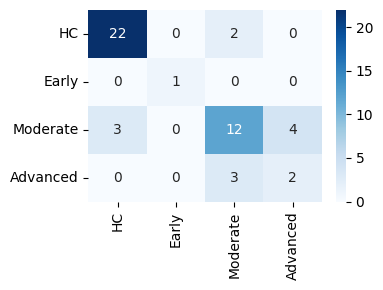

              precision    recall  f1-score   support

          HC       0.88      0.92      0.90        24
       Early       1.00      1.00      1.00         1
    Moderate       0.71      0.63      0.67        19
    Advanced       0.33      0.40      0.36         5

    accuracy                           0.76        49
   macro avg       0.73      0.74      0.73        49
weighted avg       0.76      0.76      0.76        49


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 9/10
 [Distribution] Training Sample Sizes: [121  79 320  72]
  Epoch  10 | Train Loss: 0.1114 | Val Loss: 0.1222 | Val F1: 0.3314 | Val Acc: 0.5323
  Epoch  20 | Train Loss: 0.0968 | Val Loss: 0.1122 | Val F1: 0.4011 | Val Acc: 0.5000
  Epoch  30 | Train Loss: 0.0781 | Val Loss: 0.1031 | Val F1: 0.4654 | Val Acc: 0.5323
  Epoch  40 | Train Loss: 0.0657 | Val Loss: 0.1016 | Val F1: 0.4729 | Val Acc: 0.5968
  Early stopping on Epoch 46.


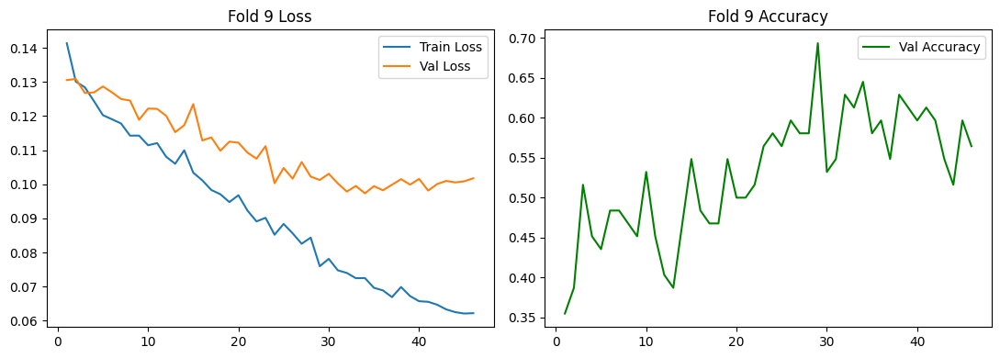

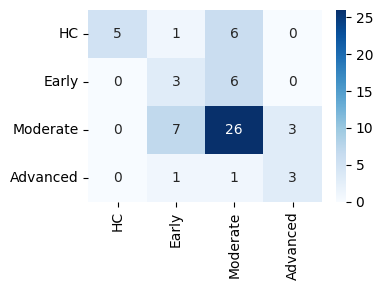

              precision    recall  f1-score   support

          HC       1.00      0.42      0.59        12
       Early       0.25      0.33      0.29         9
    Moderate       0.67      0.72      0.69        36
    Advanced       0.50      0.60      0.55         5

    accuracy                           0.60        62
   macro avg       0.60      0.52      0.53        62
weighted avg       0.66      0.60      0.60        62


LATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD 10/10
 [Distribution] Training Sample Sizes: [115  79 320  73]
  Epoch  10 | Train Loss: 0.1125 | Val Loss: 0.1316 | Val F1: 0.3107 | Val Acc: 0.4776
  Epoch  20 | Train Loss: 0.1029 | Val Loss: 0.1250 | Val F1: 0.3543 | Val Acc: 0.4328
  Epoch  30 | Train Loss: 0.0917 | Val Loss: 0.1235 | Val F1: 0.4523 | Val Acc: 0.5224
  Epoch  40 | Train Loss: 0.0802 | Val Loss: 0.1229 | Val F1: 0.4773 | Val Acc: 0.5522
  Epoch  50 | Train Loss: 0.0810 | Val Loss: 0.1233 | Val F1: 0.4689 | Val Acc: 0.5522
  Early stopping on

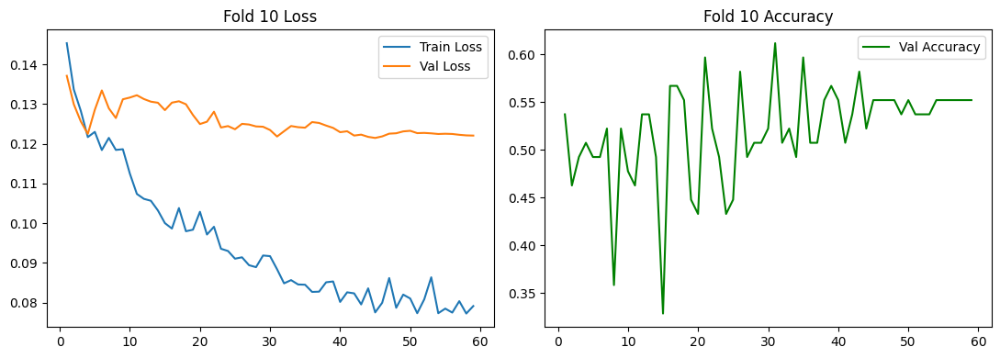

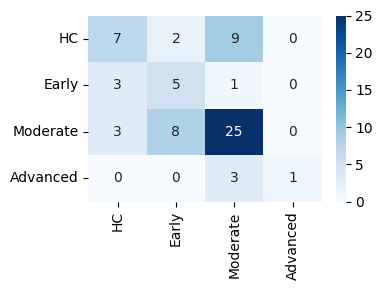

              precision    recall  f1-score   support

          HC       0.54      0.39      0.45        18
       Early       0.33      0.56      0.42         9
    Moderate       0.66      0.69      0.68        36
    Advanced       1.00      0.25      0.40         4

    accuracy                           0.57        67
   macro avg       0.63      0.47      0.49        67
weighted avg       0.60      0.57      0.56        67


OVERALL OOF MACRO F1 [NO SMOTE BASELINE]: 0.5731


In [ ]:
# To switch off SMOTE data generation, replace the matching execution segment in STEP 3 with this block:

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
    print(f"\n{'='*70}\nLATE FUSION PIPELINE [NO SMOTE BASELINE]: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r   = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_r10_raw[train_idx], X_r10_raw[val_idx]
    r50_train_r, r50_val_r = X_r50_raw[train_idx], X_r50_raw[val_idx]
    bi_train_r, bi_val_r = X_brainiac_raw[train_idx], X_brainiac_raw[val_idx]
    y_train, y_val       = y[train_idx], y[val_idx]

    # Calculate class counts based on original data distributions for Ordinal Focal Loss
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [Distribution] Training Sample Sizes: {class_counts}")

    scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
    scaler_r10 = StandardScaler(); r10_train = scaler_r10.fit_transform(r10_train_r); r10_val = scaler_r10.transform(r10_val_r)
    scaler_r50 = StandardScaler(); r50_train = scaler_r50.fit_transform(r50_train_r); r50_val = scaler_r50.transform(r50_val_r)
    scaler_bi = StandardScaler(); bi_train = scaler_bi.fit_transform(bi_train_r); bi_val = scaler_bi.transform(bi_val_r)

    # Directly pass real un-interpolated splits to your data streams
    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, bi_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, bi_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalConcatenatedLateFusionOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1], brainiac_dim=bi_train.shape[1], dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, xbi, yb in train_loader:
            xc, xr10, xr50, xbi, yb = xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50, xbi)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, xbi, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    # Display plots
    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df.index+1, hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df.index+1, hist_df['val_loss'], label='Val Loss')
    axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
    axes[1].plot(hist_df.index+1, hist_df['val_acc'], label='Val Accuracy', color='green')
    axes[1].set_title(f'Fold {fold+1} Accuracy'); axes[1].legend()
    plt.tight_layout(); plt.show(); plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, xbi, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final

    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])
    fig, ax = plt.subplots(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    plt.tight_layout(); plt.show(); plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1 [NO SMOTE BASELINE]: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")

dynamic gated fusion

In [ ]:
resnet50

Alignment Complete. Merged Shape: (654, 1846)
0    133
1     88
2    356
3     77
Name: count, dtype: int64

DYNAMIC GATED FUSION [SMOTE ON]: FOLD 1/10
  Epoch  10 | Train Loss: 0.0800 | Val Loss: 0.1138 | Val F1: 0.3413 | Val Acc: 0.4688
  Epoch  20 | Train Loss: 0.0503 | Val Loss: 0.1242 | Val F1: 0.3633 | Val Acc: 0.4219
  Epoch  30 | Train Loss: 0.0402 | Val Loss: 0.1313 | Val F1: 0.3881 | Val Acc: 0.5781
  Early stopping on Epoch 33.


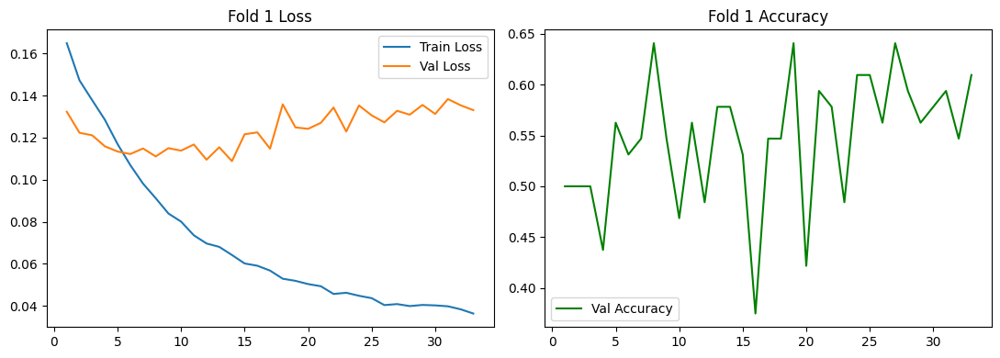

 🎯 Gate Attentions -> ResNet10: 0.545 | ResNet50: 0.256 | BrainIAC: 0.199


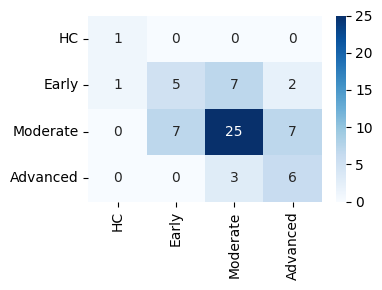

              precision    recall  f1-score   support

          HC       0.50      1.00      0.67         1
       Early       0.42      0.33      0.37        15
    Moderate       0.71      0.64      0.68        39
    Advanced       0.40      0.67      0.50         9

    accuracy                           0.58        64
   macro avg       0.51      0.66      0.55        64
weighted avg       0.60      0.58      0.58        64


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 2/10
  Epoch  10 | Train Loss: 0.0696 | Val Loss: 0.1263 | Val F1: 0.6174 | Val Acc: 0.7241
  Epoch  20 | Train Loss: 0.0451 | Val Loss: 0.1480 | Val F1: 0.7165 | Val Acc: 0.7586
  Epoch  30 | Train Loss: 0.0332 | Val Loss: 0.1827 | Val F1: 0.6562 | Val Acc: 0.7471
  Early stopping on Epoch 38.


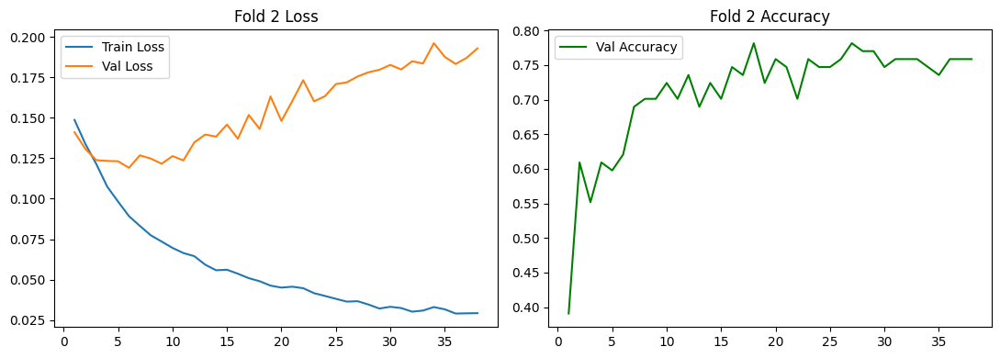

 🎯 Gate Attentions -> ResNet10: 0.471 | ResNet50: 0.319 | BrainIAC: 0.210


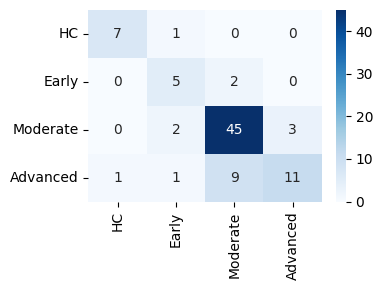

              precision    recall  f1-score   support

          HC       0.88      0.88      0.88         8
       Early       0.56      0.71      0.62         7
    Moderate       0.80      0.90      0.85        50
    Advanced       0.79      0.50      0.61        22

    accuracy                           0.78        87
   macro avg       0.75      0.75      0.74        87
weighted avg       0.79      0.78      0.77        87


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 3/10
  Epoch  10 | Train Loss: 0.0716 | Val Loss: 0.0757 | Val F1: 0.5159 | Val Acc: 0.6000
  Epoch  20 | Train Loss: 0.0488 | Val Loss: 0.0755 | Val F1: 0.5612 | Val Acc: 0.6308
  Epoch  30 | Train Loss: 0.0422 | Val Loss: 0.0743 | Val F1: 0.5583 | Val Acc: 0.6154
  Epoch  40 | Train Loss: 0.0380 | Val Loss: 0.0788 | Val F1: 0.5543 | Val Acc: 0.6308
  Epoch  50 | Train Loss: 0.0374 | Val Loss: 0.0773 | Val F1: 0.5773 | Val Acc: 0.6462
  Early stopping on Epoch 53.


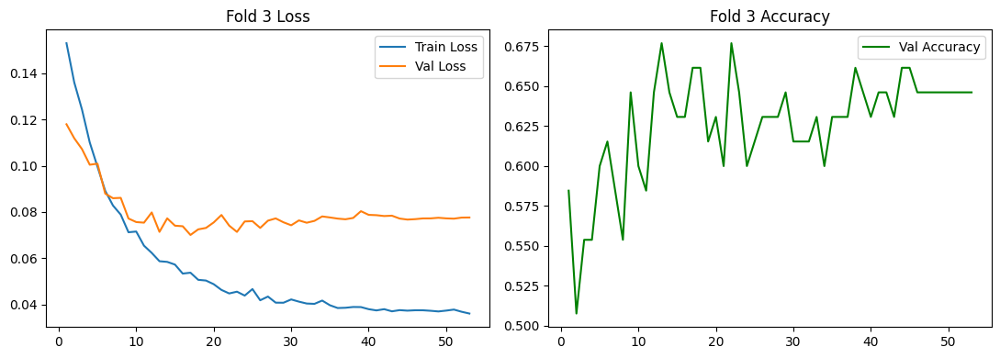

 🎯 Gate Attentions -> ResNet10: 0.463 | ResNet50: 0.319 | BrainIAC: 0.218


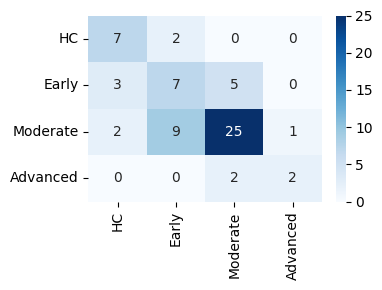

              precision    recall  f1-score   support

          HC       0.58      0.78      0.67         9
       Early       0.39      0.47      0.42        15
    Moderate       0.78      0.68      0.72        37
    Advanced       0.67      0.50      0.57         4

    accuracy                           0.63        65
   macro avg       0.61      0.61      0.60        65
weighted avg       0.66      0.63      0.64        65


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 4/10
  Epoch  10 | Train Loss: 0.0697 | Val Loss: 0.0925 | Val F1: 0.5935 | Val Acc: 0.6667
  Epoch  20 | Train Loss: 0.0495 | Val Loss: 0.1097 | Val F1: 0.5831 | Val Acc: 0.6349
  Epoch  30 | Train Loss: 0.0365 | Val Loss: 0.1268 | Val F1: 0.5536 | Val Acc: 0.6032
  Early stopping on Epoch 37.


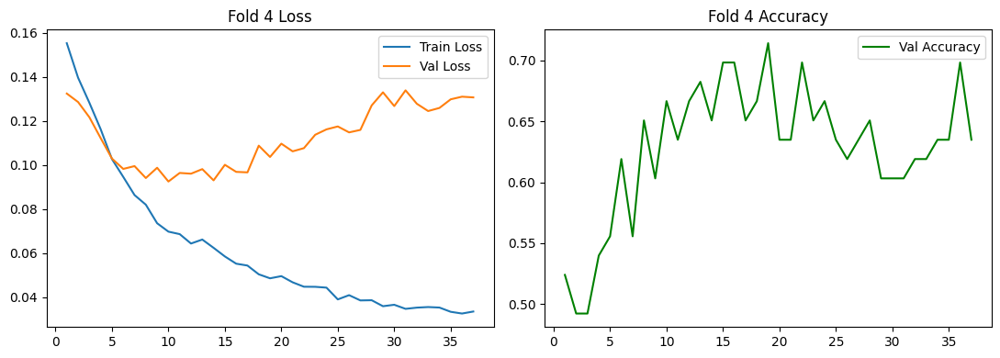

 🎯 Gate Attentions -> ResNet10: 0.484 | ResNet50: 0.327 | BrainIAC: 0.189


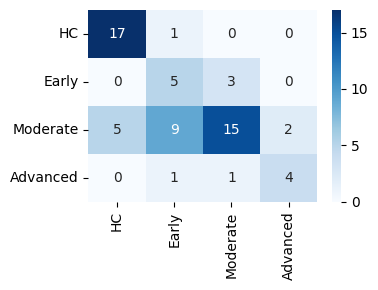

              precision    recall  f1-score   support

          HC       0.77      0.94      0.85        18
       Early       0.31      0.62      0.42         8
    Moderate       0.79      0.48      0.60        31
    Advanced       0.67      0.67      0.67         6

    accuracy                           0.65        63
   macro avg       0.64      0.68      0.63        63
weighted avg       0.71      0.65      0.65        63


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 5/10
  Epoch  10 | Train Loss: 0.0679 | Val Loss: 0.1300 | Val F1: 0.5084 | Val Acc: 0.6806
  Epoch  20 | Train Loss: 0.0461 | Val Loss: 0.1472 | Val F1: 0.6098 | Val Acc: 0.6806
  Epoch  30 | Train Loss: 0.0315 | Val Loss: 0.1686 | Val F1: 0.5691 | Val Acc: 0.6389
  Epoch  40 | Train Loss: 0.0277 | Val Loss: 0.1738 | Val F1: 0.6246 | Val Acc: 0.6389
  Early stopping on Epoch 41.


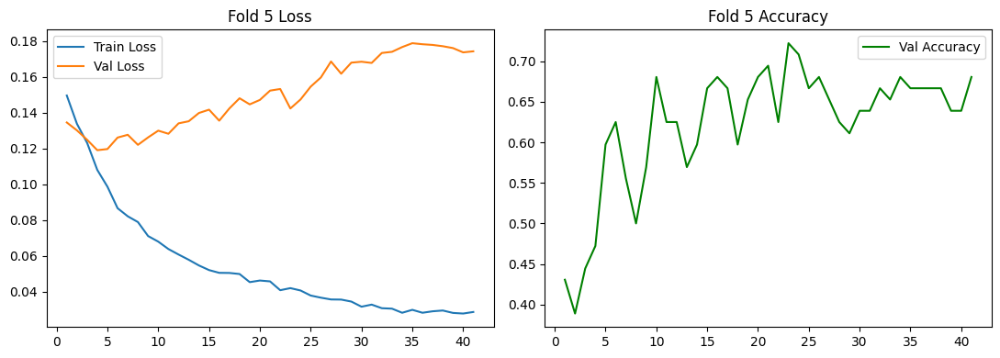

 🎯 Gate Attentions -> ResNet10: 0.467 | ResNet50: 0.281 | BrainIAC: 0.252


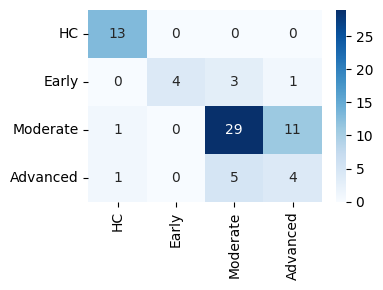

              precision    recall  f1-score   support

          HC       0.87      1.00      0.93        13
       Early       1.00      0.50      0.67         8
    Moderate       0.78      0.71      0.74        41
    Advanced       0.25      0.40      0.31        10

    accuracy                           0.69        72
   macro avg       0.73      0.65      0.66        72
weighted avg       0.75      0.69      0.71        72


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 6/10
  Epoch  10 | Train Loss: 0.0707 | Val Loss: 0.1121 | Val F1: 0.5047 | Val Acc: 0.6034
  Epoch  20 | Train Loss: 0.0499 | Val Loss: 0.1219 | Val F1: 0.5548 | Val Acc: 0.6034
  Epoch  30 | Train Loss: 0.0380 | Val Loss: 0.1281 | Val F1: 0.5746 | Val Acc: 0.6379
  Epoch  40 | Train Loss: 0.0308 | Val Loss: 0.1319 | Val F1: 0.5561 | Val Acc: 0.6379
  Epoch  50 | Train Loss: 0.0257 | Val Loss: 0.1493 | Val F1: 0.5712 | Val Acc: 0.6897
  Early stopping on Epoch 55.


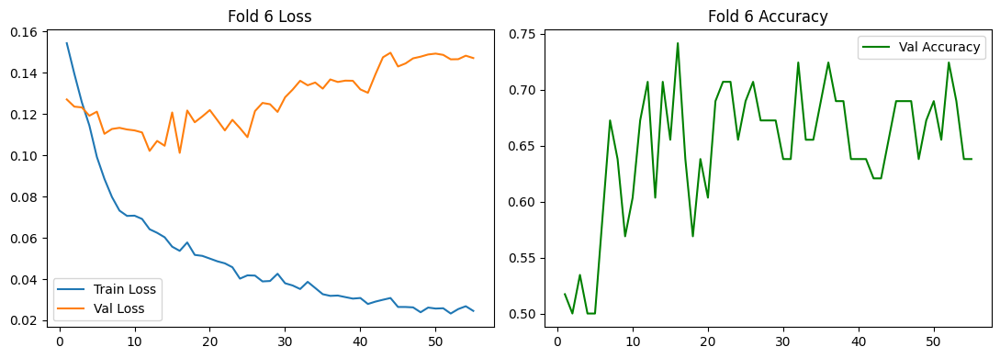

 🎯 Gate Attentions -> ResNet10: 0.518 | ResNet50: 0.291 | BrainIAC: 0.191


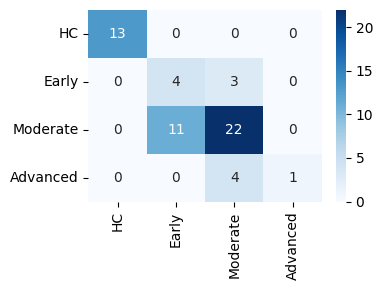

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00        13
       Early       0.27      0.57      0.36         7
    Moderate       0.76      0.67      0.71        33
    Advanced       1.00      0.20      0.33         5

    accuracy                           0.69        58
   macro avg       0.76      0.61      0.60        58
weighted avg       0.77      0.69      0.70        58


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 7/10
  Epoch  10 | Train Loss: 0.0722 | Val Loss: 0.0942 | Val F1: 0.5374 | Val Acc: 0.5522
  Epoch  20 | Train Loss: 0.0513 | Val Loss: 0.0953 | Val F1: 0.5879 | Val Acc: 0.6119
  Epoch  30 | Train Loss: 0.0401 | Val Loss: 0.1038 | Val F1: 0.6295 | Val Acc: 0.6567
  Epoch  40 | Train Loss: 0.0339 | Val Loss: 0.1100 | Val F1: 0.6627 | Val Acc: 0.6716
  Epoch  50 | Train Loss: 0.0311 | Val Loss: 0.1105 | Val F1: 0.6443 | Val Acc: 0.6866
  Early stopping on Epoch 52.


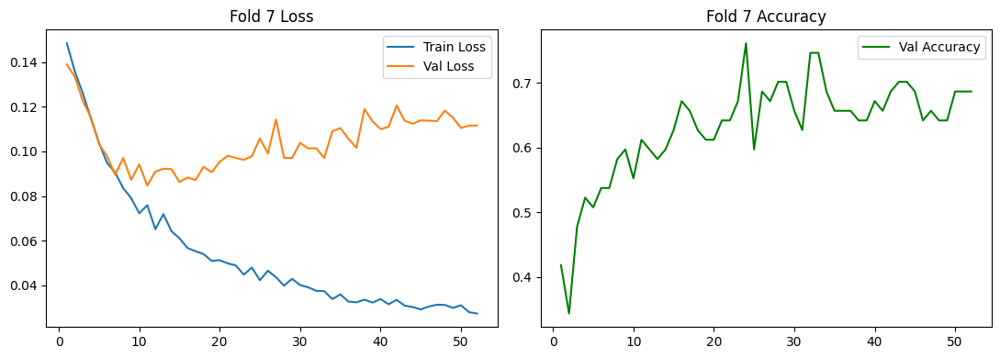

 🎯 Gate Attentions -> ResNet10: 0.464 | ResNet50: 0.341 | BrainIAC: 0.194


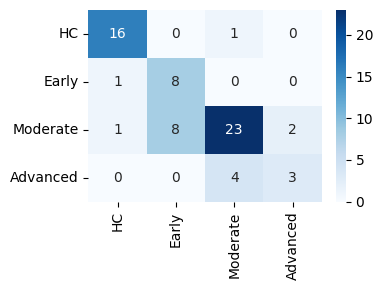

              precision    recall  f1-score   support

          HC       0.89      0.94      0.91        17
       Early       0.50      0.89      0.64         9
    Moderate       0.82      0.68      0.74        34
    Advanced       0.60      0.43      0.50         7

    accuracy                           0.75        67
   macro avg       0.70      0.73      0.70        67
weighted avg       0.77      0.75      0.75        67


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 8/10
  Epoch  10 | Train Loss: 0.0699 | Val Loss: 0.0938 | Val F1: 0.5160 | Val Acc: 0.8163
  Epoch  20 | Train Loss: 0.0516 | Val Loss: 0.0966 | Val F1: 0.5429 | Val Acc: 0.7143
  Early stopping on Epoch 26.


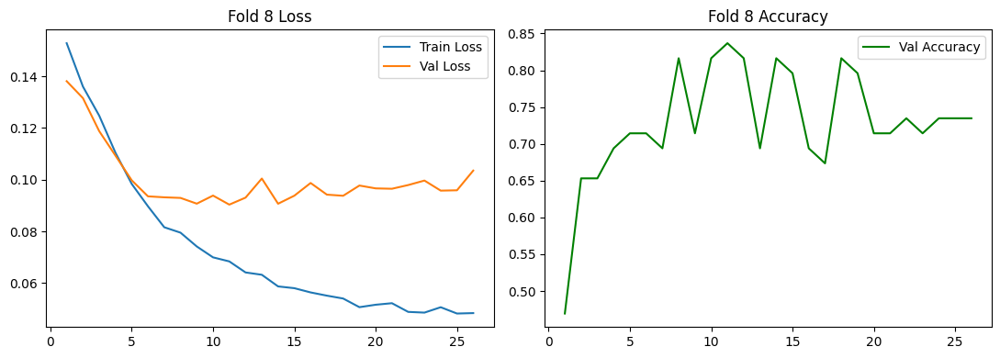

 🎯 Gate Attentions -> ResNet10: 0.548 | ResNet50: 0.260 | BrainIAC: 0.192


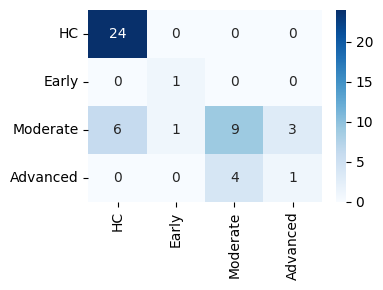

              precision    recall  f1-score   support

          HC       0.80      1.00      0.89        24
       Early       0.50      1.00      0.67         1
    Moderate       0.69      0.47      0.56        19
    Advanced       0.25      0.20      0.22         5

    accuracy                           0.71        49
   macro avg       0.56      0.67      0.59        49
weighted avg       0.70      0.71      0.69        49


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 9/10
  Epoch  10 | Train Loss: 0.0697 | Val Loss: 0.0953 | Val F1: 0.4734 | Val Acc: 0.5645
  Epoch  20 | Train Loss: 0.0468 | Val Loss: 0.0993 | Val F1: 0.5429 | Val Acc: 0.5806
  Epoch  30 | Train Loss: 0.0358 | Val Loss: 0.1164 | Val F1: 0.5422 | Val Acc: 0.6129
  Epoch  40 | Train Loss: 0.0310 | Val Loss: 0.1171 | Val F1: 0.5658 | Val Acc: 0.6613
  Epoch  50 | Train Loss: 0.0264 | Val Loss: 0.1329 | Val F1: 0.5931 | Val Acc: 0.6774
  Early stopping on Epoch 58.


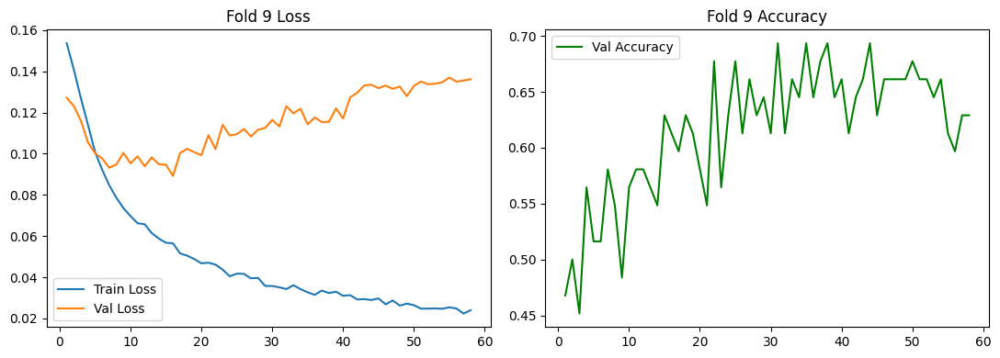

 🎯 Gate Attentions -> ResNet10: 0.599 | ResNet50: 0.212 | BrainIAC: 0.189


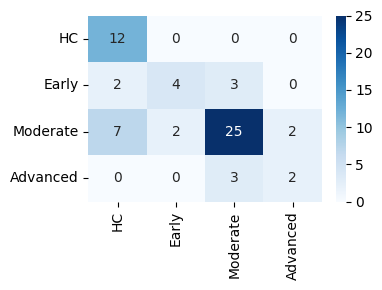

              precision    recall  f1-score   support

          HC       0.57      1.00      0.73        12
       Early       0.67      0.44      0.53         9
    Moderate       0.81      0.69      0.75        36
    Advanced       0.50      0.40      0.44         5

    accuracy                           0.69        62
   macro avg       0.64      0.63      0.61        62
weighted avg       0.72      0.69      0.69        62


DYNAMIC GATED FUSION [SMOTE ON]: FOLD 10/10
  Epoch  10 | Train Loss: 0.0693 | Val Loss: 0.0808 | Val F1: 0.5029 | Val Acc: 0.5672
  Epoch  20 | Train Loss: 0.0447 | Val Loss: 0.0831 | Val F1: 0.5471 | Val Acc: 0.6418
  Epoch  30 | Train Loss: 0.0366 | Val Loss: 0.0917 | Val F1: 0.5163 | Val Acc: 0.5970
  Epoch  40 | Train Loss: 0.0305 | Val Loss: 0.0870 | Val F1: 0.6127 | Val Acc: 0.7164
  Epoch  50 | Train Loss: 0.0279 | Val Loss: 0.0959 | Val F1: 0.5870 | Val Acc: 0.6866
  Epoch  60 | Train Loss: 0.0239 | Val Loss: 0.1101 | Val F1: 0.5870 | Val Acc: 0.686

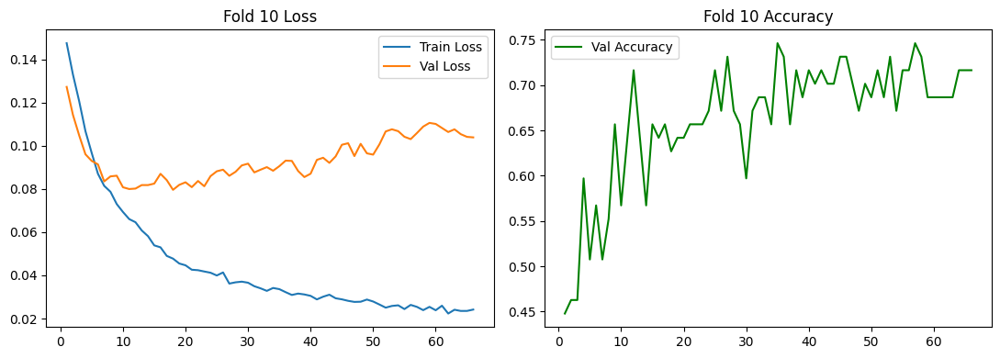

 🎯 Gate Attentions -> ResNet10: 0.633 | ResNet50: 0.249 | BrainIAC: 0.118


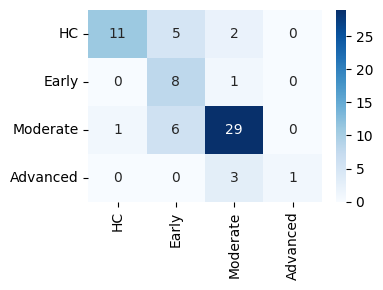

              precision    recall  f1-score   support

          HC       0.92      0.61      0.73        18
       Early       0.42      0.89      0.57         9
    Moderate       0.83      0.81      0.82        36
    Advanced       1.00      0.25      0.40         4

    accuracy                           0.73        67
   macro avg       0.79      0.64      0.63        67
weighted avg       0.81      0.73      0.74        67


OVERALL OOF MACRO F1 [SMOTE ACTIVE]: 0.6398
Mean Global Gate Distribution across all Folds (R10 / R50 / BrainIAC): [0.5191956  0.2855     0.19530438]


In [ ]:
import os
import gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE

# ======================================================================
# 🧬 STEP 1: CORRECTED MODALITY ALIGNMENT & MERGING
# ======================================================================

clin_features     = [col for col in clinical.columns if col.startswith('emb_')]
r10_features_raw  = [col for col in resent10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw  = [col for col in resnet50.columns if col.startswith('mri_emb_')]
brainiac_features_raw = [col for col in brainiac.columns if col.startswith('emb_dim_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = resent10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = resnet50[['Image_ID_T1'] + r50_features_raw].copy()
df_brainiac_clean = brainiac[['image_id_t1'] + brainiac_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})

# Isolate features with explicit prefixes to prevent namespace collisions
df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_brainiac_clean = df_brainiac_clean.rename(columns={col: f"brainiac_{col}" for col in brainiac_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]
brainiac_features = [f"brainiac_{col}" for col in brainiac_features_raw]

# Sequential inner merges
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_brainiac_clean, on='Image_ID_T1', how='inner')

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_r10_raw      = merged_df[r10_features].values.astype(np.float32)
X_r50_raw      = merged_df[r50_features].values.astype(np.float32)
X_brainiac_raw = merged_df[brainiac_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"Alignment Complete. Merged Shape: {merged_df.shape}")
print(pd.Series(y).value_counts().sort_index())

# ======================================================================
# 🧠 STEP 2: MULTIMODAL DATASET & DYNAMIC GATED ARCHITECTURE
# ======================================================================

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, brainiac, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.brainiac = torch.tensor(brainiac, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.brainiac[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

# ── 💡 DYNAMIC GATED FUSION MODEL WITH TRANSFER LEARNING PROJECTIONS ──
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, brainiac_dim,
                 embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        # Clinical Modality Feature Excitation Track
        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(), nn.Dropout(dropout)
        )

        # Imaging Projections (Learns adaptive weights for each pre-trained space)
        self.r10_proj = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.r50_proj = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.brainiac_proj = nn.Sequential(
            nn.Linear(brainiac_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        # Dynamic Attention Gating Router
        self.gate_router = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim), nn.ReLU(),
            nn.Linear(hidden_dim, 3), nn.Softmax(dim=-1)
        )

        combined_img_dim = hidden_dim * 3
        fused_dim = hidden_dim + combined_img_dim

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim), nn.LayerNorm(embedding_dim), nn.ReLU(), nn.Dropout(dropout)
        )
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32), nn.ReLU(), nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50, x_brainiac):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        p_r10      = self.r10_proj(x_r10)
        p_r50      = self.r50_proj(x_r50)
        p_brainiac = self.brainiac_proj(x_brainiac)

        raw_stack = torch.cat([p_r10, p_r50, p_brainiac], dim=1)
        gate_coefficients = self.gate_router(raw_stack)  # [Batch, 3]

        g_r10      = gate_coefficients[:, 0].unsqueeze(1)
        g_r50      = gate_coefficients[:, 1].unsqueeze(1)
        g_brainiac = gate_coefficients[:, 2].unsqueeze(1)

        gated_img = torch.cat([p_r10 * g_r10, p_r50 * g_r50, p_brainiac * g_brainiac], dim=1)
        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))

        return self.classifier(latent), latent, gate_coefficients

# ======================================================================
# 🚀 STEP 3: CROSS-VALIDATION LOOP WITH METRIC MONITORING
# ======================================================================

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
SMOTE_TARGET_RATIO = 0.6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_gate_means = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
    print(f"\n{'='*70}\nDYNAMIC GATED FUSION [SMOTE ON]: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r   = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_r10_raw[train_idx], X_r10_raw[val_idx]
    r50_train_r, r50_val_r = X_r50_raw[train_idx], X_r50_raw[val_idx]
    bi_train_r, bi_val_r = X_brainiac_raw[train_idx], X_brainiac_raw[val_idx]
    y_train, y_val       = y[train_idx], y[val_idx]

    scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
    scaler_r10 = StandardScaler(); r10_train = scaler_r10.fit_transform(r10_train_r); r10_val = scaler_r10.transform(r10_val_r)
    scaler_r50 = StandardScaler(); r50_train = scaler_r50.fit_transform(r50_train_r); r50_val = scaler_r50.transform(r50_val_r)
    scaler_bi = StandardScaler(); bi_train = scaler_bi.fit_transform(bi_train_r); bi_val = scaler_bi.transform(bi_val_r)

    # ── INTEGRATED COLUMN-WISE SMOTE BALANCING TRACK ──
    c_dim, r10_dim, r50_dim = c_train.shape[1], r10_train.shape[1], r50_train.shape[1]
    X_train_concat = np.concatenate([c_train, r10_train, r50_train, bi_train], axis=1)

    pre_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    majority_count = pre_counts.max()
    sampling_strategy = {c: max(pre_counts[c], int(majority_count * SMOTE_TARGET_RATIO)) for c in range(NUM_CLASSES)}
    sampling_strategy = {c: n for c, n in sampling_strategy.items() if n > pre_counts[c]}

    if sampling_strategy:
        smallest_involved = min(pre_counts[c] for c in sampling_strategy)
        k_neighbors = max(1, min(5, smallest_involved - 1))
        smote = SMOTE(sampling_strategy=sampling_strategy, k_neighbors=k_neighbors, random_state=42)
        X_train_concat, y_train = smote.fit_resample(X_train_concat, y_train)

    c_train   = X_train_concat[:, :c_dim]
    r10_train = X_train_concat[:, c_dim:c_dim+r10_dim]
    r50_train = X_train_concat[:, c_dim+r10_dim:c_dim+r10_dim+r50_dim]
    bi_train  = X_train_concat[:, c_dim+r10_dim+r50_dim:]

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)

    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, bi_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, bi_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1], brainiac_dim=bi_train.shape[1], dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    best_gate_mean = None
    patience_cnt = 0
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, xbi, yb in train_loader:
            xc, xr10, xr50, xbi, yb = xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xc, xr10, xr50, xbi)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list, gate_list = [], [], []
        with torch.no_grad():
            for xc, xr10, xr50, xbi, yb in val_loader:
                logits, _, gate_coeffs = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
                logits_list.append(logits.cpu())
                gate_list.append(gate_coeffs.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        gate_all = torch.cat(gate_list).numpy()
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            best_gate_mean = gate_all.mean(axis=0)
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df.index+1, hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df.index+1, hist_df['val_loss'], label='Val Loss')
    axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
    axes[1].plot(hist_df.index+1, hist_df['val_acc'], label='Val Accuracy', color='green')
    axes[1].set_title(f'Fold {fold+1} Accuracy'); axes[1].legend()
    plt.tight_layout(); plt.show(); plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, xbi, _ in val_loader:
            logits, _, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    fold_gate_means.append(best_gate_mean)
    print(f" 🎯 Gate Attentions -> ResNet10: {best_gate_mean[0]:.3f} | ResNet50: {best_gate_mean[1]:.3f} | BrainIAC: {best_gate_mean[2]:.3f}")

    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])
    fig, ax = plt.subplots(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    plt.tight_layout(); plt.show(); plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1 [SMOTE ACTIVE]: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")
print("Mean Global Gate Distribution across all Folds (R10 / R50 / BrainIAC):", np.array(fold_gate_means).mean(axis=0))

without smote

In [ ]:
import os
import gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE

# ======================================================================
# 🧬 STEP 1: CORRECTED MODALITY ALIGNMENT & MERGING
# ======================================================================

clin_features     = [col for col in clinical.columns if col.startswith('emb_')]
r10_features_raw  = [col for col in resent10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw  = [col for col in resnet50.columns if col.startswith('mri_emb_')]
brainiac_features_raw = [col for col in brainiac.columns if col.startswith('emb_dim_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = resent10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = resnet50[['Image_ID_T1'] + r50_features_raw].copy()
df_brainiac_clean = brainiac[['image_id_t1'] + brainiac_features_raw].copy().rename(columns={'image_id_t1': 'Image_ID_T1'})

# Isolate features with explicit prefixes to prevent namespace collisions
df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_brainiac_clean = df_brainiac_clean.rename(columns={col: f"brainiac_{col}" for col in brainiac_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]
brainiac_features = [f"brainiac_{col}" for col in brainiac_features_raw]

# Sequential inner merges
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_brainiac_clean, on='Image_ID_T1', how='inner')

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_r10_raw      = merged_df[r10_features].values.astype(np.float32)
X_r50_raw      = merged_df[r50_features].values.astype(np.float32)
X_brainiac_raw = merged_df[brainiac_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"Alignment Complete. Merged Shape: {merged_df.shape}")
print(pd.Series(y).value_counts().sort_index())

# ======================================================================
# 🧠 STEP 2: MULTIMODAL DATASET & DYNAMIC GATED ARCHITECTURE
# ======================================================================

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, brainiac, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.brainiac = torch.tensor(brainiac, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.brainiac[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

# ── 💡 DYNAMIC GATED FUSION MODEL WITH TRANSFER LEARNING PROJECTIONS ──
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, brainiac_dim,
                 embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        # Clinical Modality Feature Excitation Track
        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(), nn.Dropout(dropout)
        )

        # Imaging Projections (Learns adaptive weights for each pre-trained space)
        self.r10_proj = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.r50_proj = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.brainiac_proj = nn.Sequential(
            nn.Linear(brainiac_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        # Dynamic Attention Gating Router
        self.gate_router = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim), nn.ReLU(),
            nn.Linear(hidden_dim, 3), nn.Softmax(dim=-1)
        )

        combined_img_dim = hidden_dim * 3
        fused_dim = hidden_dim + combined_img_dim

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim), nn.LayerNorm(embedding_dim), nn.ReLU(), nn.Dropout(dropout)
        )
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32), nn.ReLU(), nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50, x_brainiac):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        p_r10      = self.r10_proj(x_r10)
        p_r50      = self.r50_proj(x_r50)
        p_brainiac = self.brainiac_proj(x_brainiac)

        raw_stack = torch.cat([p_r10, p_r50, p_brainiac], dim=1)
        gate_coefficients = self.gate_router(raw_stack)  # [Batch, 3]

        g_r10      = gate_coefficients[:, 0].unsqueeze(1)
        g_r50      = gate_coefficients[:, 1].unsqueeze(1)
        g_brainiac = gate_coefficients[:, 2].unsqueeze(1)

        gated_img = torch.cat([p_r10 * g_r10, p_r50 * g_r50, p_brainiac * g_brainiac], dim=1)
        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))

        return self.classifier(latent), latent, gate_coefficients

# ======================================================================
# 🚀 STEP 3: CROSS-VALIDATION LOOP WITH METRIC MONITORING
# ======================================================================

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
SMOTE_TARGET_RATIO = 0.6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()

Alignment Complete. Merged Shape: (654, 1846)
0    133
1     88
2    356
3     77
Name: count, dtype: int64



DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 1/10
 [Distribution] Real Raw Sample Sizes: [132  73 317  68]
  Epoch  10 | Train Loss: 0.0920 | Val Loss: 0.1193 | Val F1: 0.6691 | Val Acc: 0.7500
  Epoch  20 | Train Loss: 0.0692 | Val Loss: 0.1205 | Val F1: 0.4969 | Val Acc: 0.6406
  Early stopping on Epoch 28.


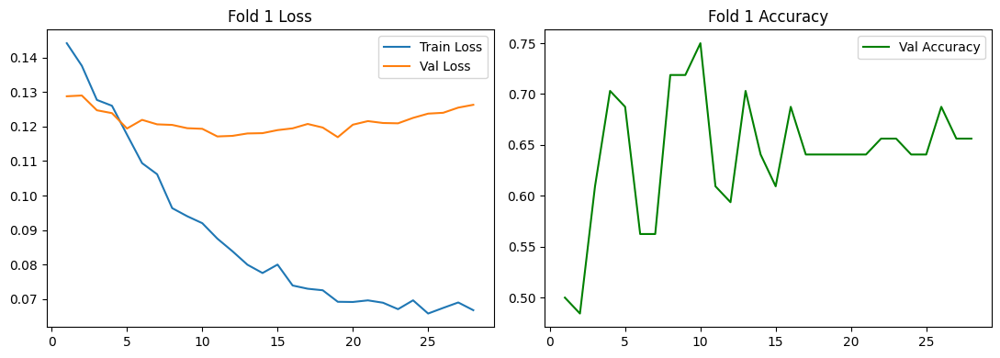

 🎯 Gate Attentions -> ResNet10: 0.524 | ResNet50: 0.217 | BrainIAC: 0.259


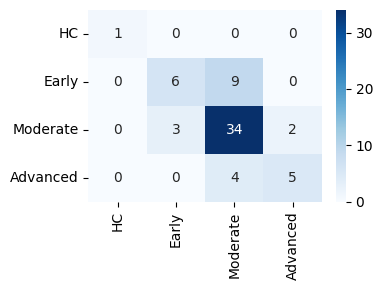

              precision    recall  f1-score   support

          HC       1.00      1.00      1.00         1
       Early       0.67      0.40      0.50        15
    Moderate       0.72      0.87      0.79        39
    Advanced       0.71      0.56      0.62         9

    accuracy                           0.72        64
   macro avg       0.78      0.71      0.73        64
weighted avg       0.71      0.72      0.70        64


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 2/10
 [Distribution] Real Raw Sample Sizes: [125  81 306  55]
  Epoch  10 | Train Loss: 0.0899 | Val Loss: 0.1520 | Val F1: 0.4765 | Val Acc: 0.5287
  Epoch  20 | Train Loss: 0.0651 | Val Loss: 0.1637 | Val F1: 0.5544 | Val Acc: 0.6322
  Epoch  30 | Train Loss: 0.0521 | Val Loss: 0.1955 | Val F1: 0.5628 | Val Acc: 0.6437
  Epoch  40 | Train Loss: 0.0446 | Val Loss: 0.2110 | Val F1: 0.6095 | Val Acc: 0.7011
  Epoch  50 | Train Loss: 0.0403 | Val Loss: 0.2347 | Val F1: 0.5868 | Val Acc: 0.6897
  Early stopping on 

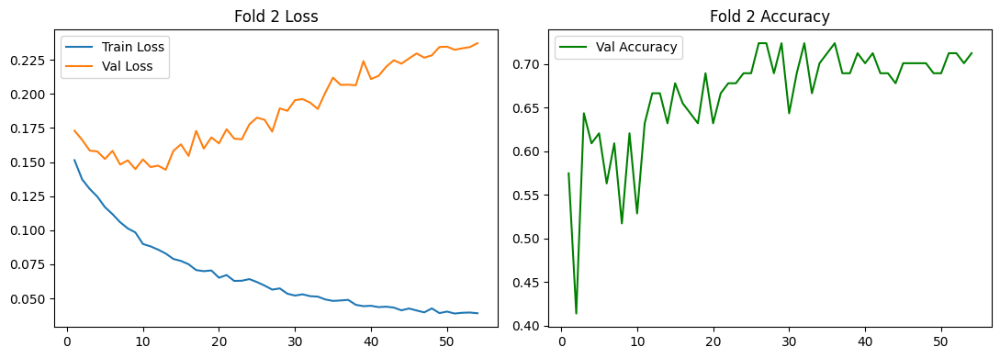

 🎯 Gate Attentions -> ResNet10: 0.605 | ResNet50: 0.258 | BrainIAC: 0.137


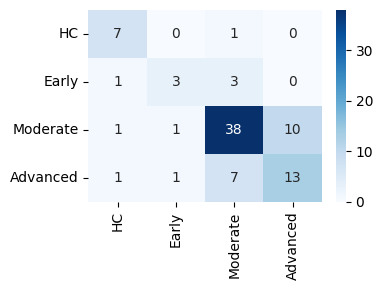

              precision    recall  f1-score   support

          HC       0.70      0.88      0.78         8
       Early       0.60      0.43      0.50         7
    Moderate       0.78      0.76      0.77        50
    Advanced       0.57      0.59      0.58        22

    accuracy                           0.70        87
   macro avg       0.66      0.66      0.66        87
weighted avg       0.70      0.70      0.70        87


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 3/10
 [Distribution] Real Raw Sample Sizes: [124  73 319  73]
  Epoch  10 | Train Loss: 0.0947 | Val Loss: 0.0781 | Val F1: 0.5137 | Val Acc: 0.4923
  Epoch  20 | Train Loss: 0.0660 | Val Loss: 0.0687 | Val F1: 0.6677 | Val Acc: 0.7231
  Epoch  30 | Train Loss: 0.0544 | Val Loss: 0.0644 | Val F1: 0.6024 | Val Acc: 0.6154
  Epoch  40 | Train Loss: 0.0543 | Val Loss: 0.0648 | Val F1: 0.5873 | Val Acc: 0.6462
  Early stopping on Epoch 40.


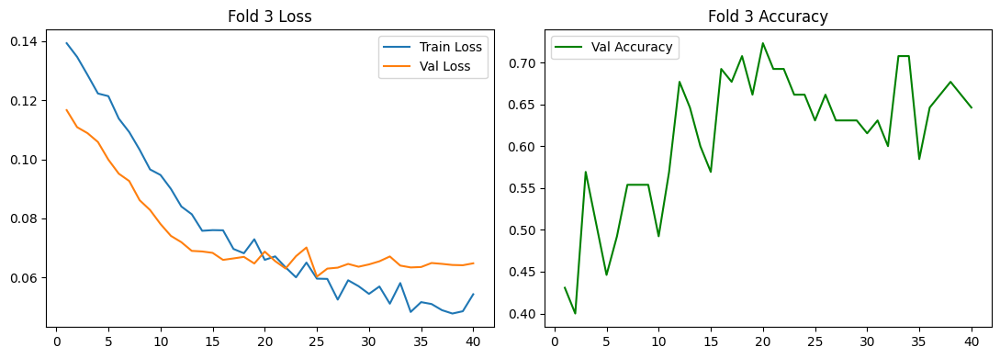

 🎯 Gate Attentions -> ResNet10: 0.508 | ResNet50: 0.299 | BrainIAC: 0.194


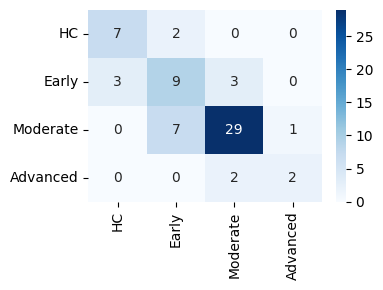

              precision    recall  f1-score   support

          HC       0.70      0.78      0.74         9
       Early       0.50      0.60      0.55        15
    Moderate       0.85      0.78      0.82        37
    Advanced       0.67      0.50      0.57         4

    accuracy                           0.72        65
   macro avg       0.68      0.67      0.67        65
weighted avg       0.74      0.72      0.73        65


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 4/10
 [Distribution] Real Raw Sample Sizes: [115  80 325  71]
  Epoch  10 | Train Loss: 0.0941 | Val Loss: 0.0916 | Val F1: 0.5977 | Val Acc: 0.6825
  Epoch  20 | Train Loss: 0.0670 | Val Loss: 0.1044 | Val F1: 0.6178 | Val Acc: 0.6984
  Epoch  30 | Train Loss: 0.0519 | Val Loss: 0.1100 | Val F1: 0.6362 | Val Acc: 0.6984
  Early stopping on Epoch 38.


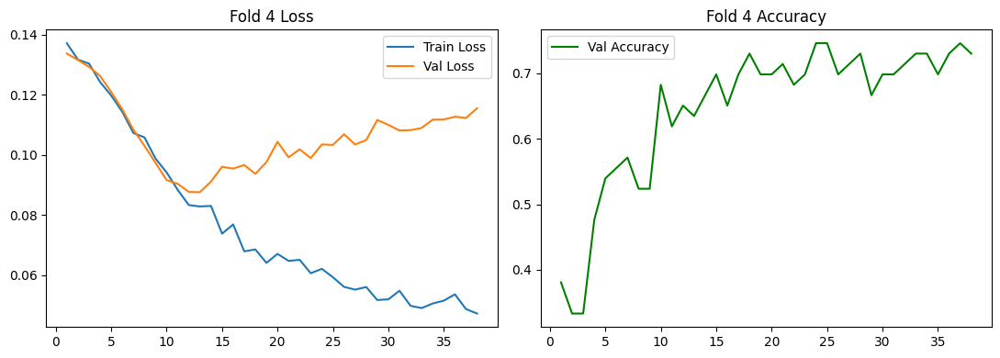

 🎯 Gate Attentions -> ResNet10: 0.517 | ResNet50: 0.267 | BrainIAC: 0.216


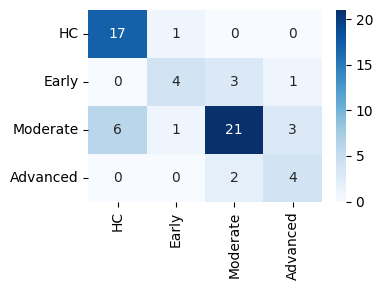

              precision    recall  f1-score   support

          HC       0.74      0.94      0.83        18
       Early       0.67      0.50      0.57         8
    Moderate       0.81      0.68      0.74        31
    Advanced       0.50      0.67      0.57         6

    accuracy                           0.73        63
   macro avg       0.68      0.70      0.68        63
weighted avg       0.74      0.73      0.73        63


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 5/10
 [Distribution] Real Raw Sample Sizes: [120  80 315  67]
  Epoch  10 | Train Loss: 0.0976 | Val Loss: 0.1312 | Val F1: 0.4683 | Val Acc: 0.5417
  Epoch  20 | Train Loss: 0.0651 | Val Loss: 0.1478 | Val F1: 0.4864 | Val Acc: 0.5139
  Epoch  30 | Train Loss: 0.0618 | Val Loss: 0.1620 | Val F1: 0.4874 | Val Acc: 0.5833
  Early stopping on Epoch 33.


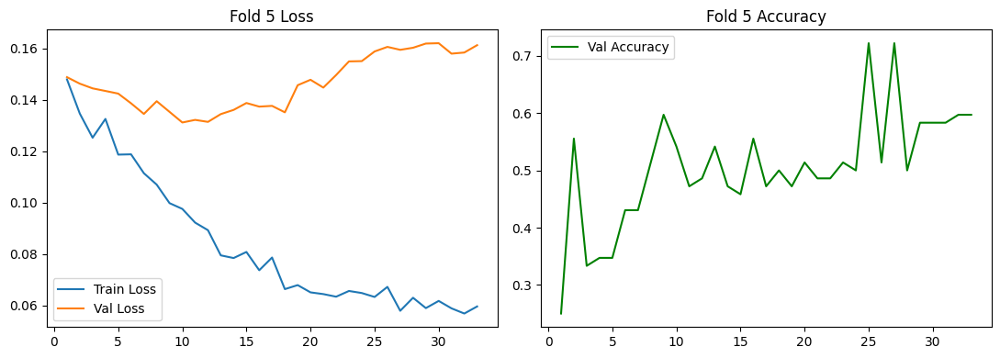

 🎯 Gate Attentions -> ResNet10: 0.506 | ResNet50: 0.299 | BrainIAC: 0.195


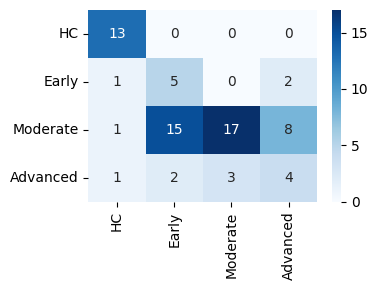

              precision    recall  f1-score   support

          HC       0.81      1.00      0.90        13
       Early       0.23      0.62      0.33         8
    Moderate       0.85      0.41      0.56        41
    Advanced       0.29      0.40      0.33        10

    accuracy                           0.54        72
   macro avg       0.54      0.61      0.53        72
weighted avg       0.70      0.54      0.56        72


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 6/10
 [Distribution] Real Raw Sample Sizes: [120  81 323  72]
  Epoch  10 | Train Loss: 0.0999 | Val Loss: 0.1038 | Val F1: 0.4410 | Val Acc: 0.5000
  Epoch  20 | Train Loss: 0.0655 | Val Loss: 0.0860 | Val F1: 0.5662 | Val Acc: 0.7069
  Epoch  30 | Train Loss: 0.0576 | Val Loss: 0.0886 | Val F1: 0.5519 | Val Acc: 0.6379
  Early stopping on Epoch 32.


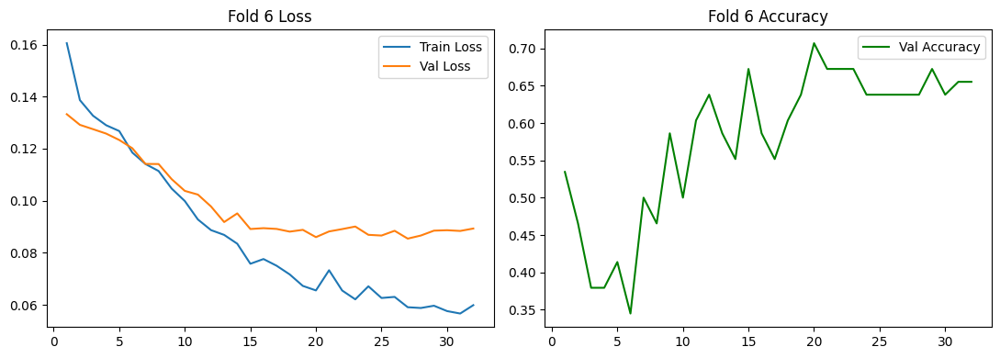

 🎯 Gate Attentions -> ResNet10: 0.490 | ResNet50: 0.306 | BrainIAC: 0.205


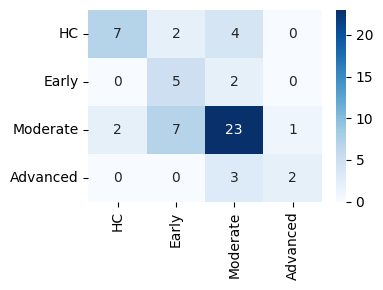

              precision    recall  f1-score   support

          HC       0.78      0.54      0.64        13
       Early       0.36      0.71      0.48         7
    Moderate       0.72      0.70      0.71        33
    Advanced       0.67      0.40      0.50         5

    accuracy                           0.64        58
   macro avg       0.63      0.59      0.58        58
weighted avg       0.68      0.64      0.65        58


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 7/10
 [Distribution] Real Raw Sample Sizes: [116  79 322  70]
  Epoch  10 | Train Loss: 0.0966 | Val Loss: 0.0967 | Val F1: 0.5364 | Val Acc: 0.5522
  Epoch  20 | Train Loss: 0.0675 | Val Loss: 0.0851 | Val F1: 0.5537 | Val Acc: 0.5672
  Epoch  30 | Train Loss: 0.0621 | Val Loss: 0.0935 | Val F1: 0.5943 | Val Acc: 0.5970
  Early stopping on Epoch 31.


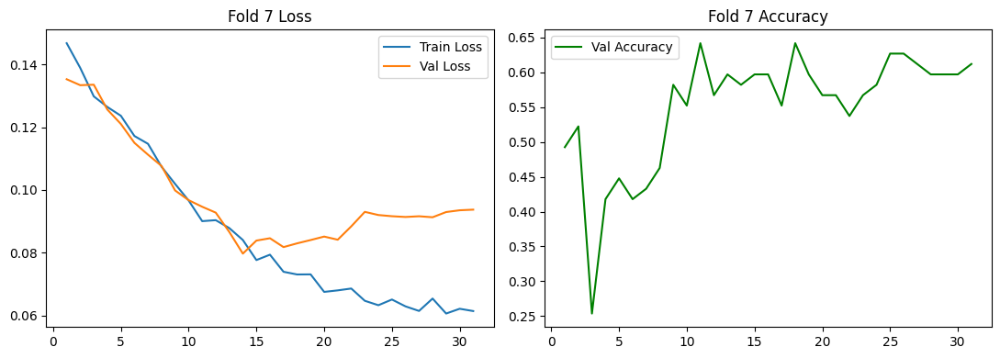

 🎯 Gate Attentions -> ResNet10: 0.497 | ResNet50: 0.273 | BrainIAC: 0.230


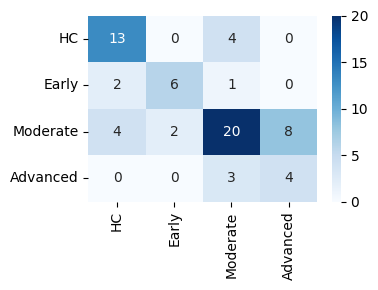

              precision    recall  f1-score   support

          HC       0.68      0.76      0.72        17
       Early       0.75      0.67      0.71         9
    Moderate       0.71      0.59      0.65        34
    Advanced       0.33      0.57      0.42         7

    accuracy                           0.64        67
   macro avg       0.62      0.65      0.62        67
weighted avg       0.67      0.64      0.65        67


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 8/10
 [Distribution] Real Raw Sample Sizes: [109  87 337  72]
  Epoch  10 | Train Loss: 0.0897 | Val Loss: 0.0978 | Val F1: 0.4952 | Val Acc: 0.7755
  Epoch  20 | Train Loss: 0.0637 | Val Loss: 0.0835 | Val F1: 0.5160 | Val Acc: 0.6939
  Epoch  30 | Train Loss: 0.0546 | Val Loss: 0.1095 | Val F1: 0.5670 | Val Acc: 0.7551
  Epoch  40 | Train Loss: 0.0466 | Val Loss: 0.1135 | Val F1: 0.5931 | Val Acc: 0.7551
  Epoch  50 | Train Loss: 0.0414 | Val Loss: 0.1294 | Val F1: 0.5780 | Val Acc: 0.7551
  Epoch  60 | Train 

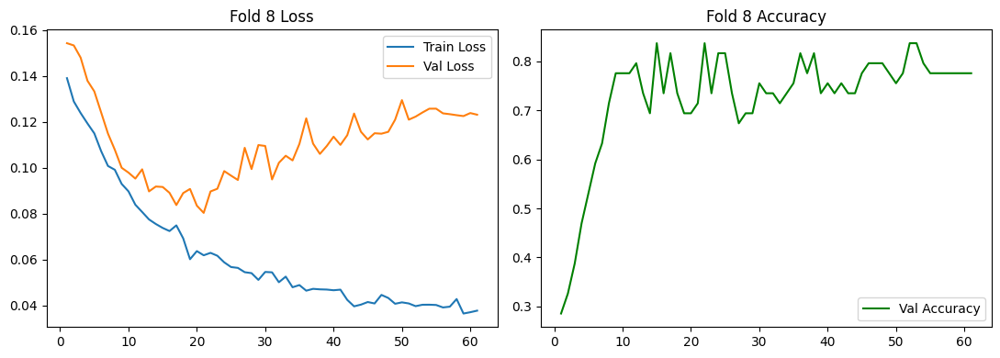

 🎯 Gate Attentions -> ResNet10: 0.619 | ResNet50: 0.226 | BrainIAC: 0.155


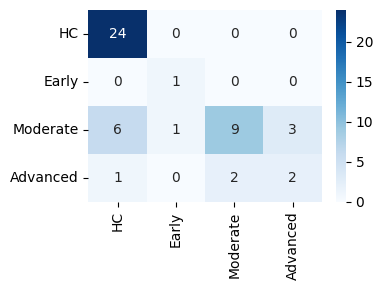

              precision    recall  f1-score   support

          HC       0.77      1.00      0.87        24
       Early       0.50      1.00      0.67         1
    Moderate       0.82      0.47      0.60        19
    Advanced       0.40      0.40      0.40         5

    accuracy                           0.73        49
   macro avg       0.62      0.72      0.63        49
weighted avg       0.75      0.73      0.71        49


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 9/10
 [Distribution] Real Raw Sample Sizes: [121  79 320  72]
  Epoch  10 | Train Loss: 0.0907 | Val Loss: 0.0910 | Val F1: 0.4813 | Val Acc: 0.5645
  Epoch  20 | Train Loss: 0.0673 | Val Loss: 0.0952 | Val F1: 0.5863 | Val Acc: 0.6774
  Epoch  30 | Train Loss: 0.0585 | Val Loss: 0.1113 | Val F1: 0.5122 | Val Acc: 0.6290
  Epoch  40 | Train Loss: 0.0528 | Val Loss: 0.1170 | Val F1: 0.5153 | Val Acc: 0.6452
  Early stopping on Epoch 40.


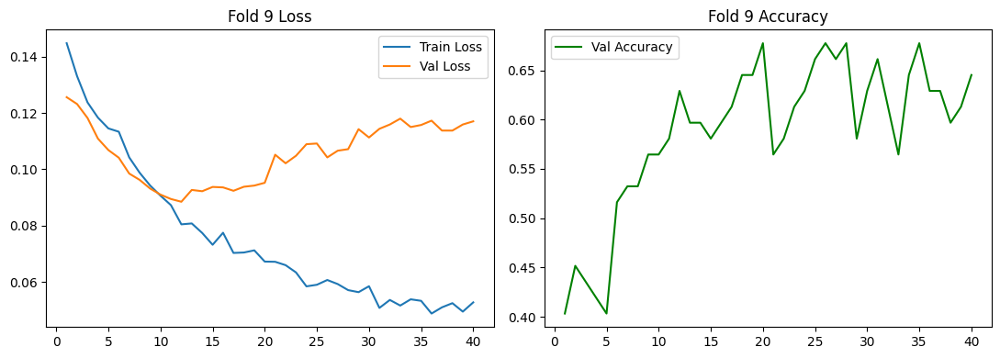

 🎯 Gate Attentions -> ResNet10: 0.501 | ResNet50: 0.260 | BrainIAC: 0.238


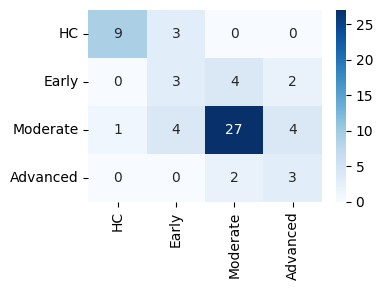

              precision    recall  f1-score   support

          HC       0.90      0.75      0.82        12
       Early       0.30      0.33      0.32         9
    Moderate       0.82      0.75      0.78        36
    Advanced       0.33      0.60      0.43         5

    accuracy                           0.68        62
   macro avg       0.59      0.61      0.59        62
weighted avg       0.72      0.68      0.69        62


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 10/10
 [Distribution] Real Raw Sample Sizes: [115  79 320  73]
  Epoch  10 | Train Loss: 0.0905 | Val Loss: 0.0878 | Val F1: 0.4936 | Val Acc: 0.5075
  Epoch  20 | Train Loss: 0.0662 | Val Loss: 0.0913 | Val F1: 0.5477 | Val Acc: 0.6567
  Epoch  30 | Train Loss: 0.0576 | Val Loss: 0.0948 | Val F1: 0.6121 | Val Acc: 0.7463
  Epoch  40 | Train Loss: 0.0540 | Val Loss: 0.1014 | Val F1: 0.5202 | Val Acc: 0.6866
  Epoch  50 | Train Loss: 0.0535 | Val Loss: 0.1026 | Val F1: 0.5202 | Val Acc: 0.6866
  Early stopping on

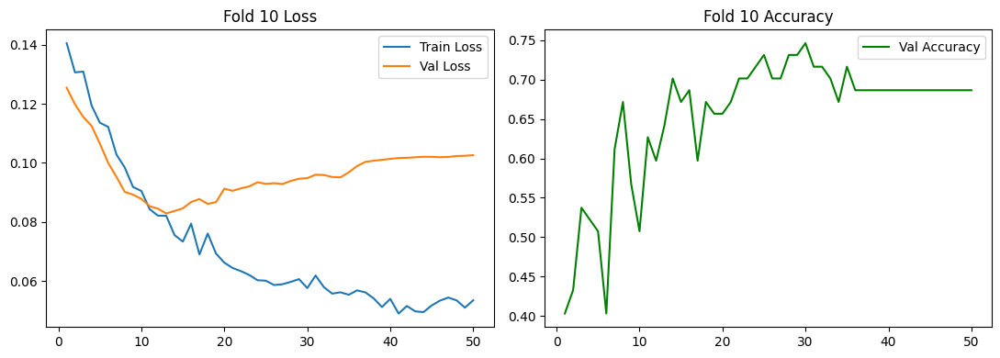

 🎯 Gate Attentions -> ResNet10: 0.520 | ResNet50: 0.284 | BrainIAC: 0.196


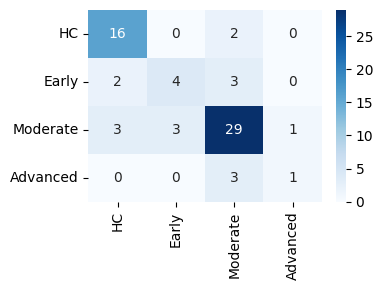

              precision    recall  f1-score   support

          HC       0.76      0.89      0.82        18
       Early       0.57      0.44      0.50         9
    Moderate       0.78      0.81      0.79        36
    Advanced       0.50      0.25      0.33         4

    accuracy                           0.75        67
   macro avg       0.65      0.60      0.61        67
weighted avg       0.73      0.75      0.73        67


OVERALL OOF MACRO F1 [NO SMOTE BASELINE]: 0.6293
Mean Global Gate Distribution across all Folds (R10 / R50 / BrainIAC): [0.5286306  0.26891112 0.20245835]


In [ ]:
sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_gate_means = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
    print(f"\n{'='*70}\nDYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r   = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_r10_raw[train_idx], X_r10_raw[val_idx]
    r50_train_r, r50_val_r = X_r50_raw[train_idx], X_r50_raw[val_idx]
    bi_train_r, bi_val_r = X_brainiac_raw[train_idx], X_brainiac_raw[val_idx]
    y_train, y_val       = y[train_idx], y[val_idx]

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [Distribution] Real Raw Sample Sizes: {class_counts}")

    scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
    scaler_r10 = StandardScaler(); r10_train = scaler_r10.fit_transform(r10_train_r); r10_val = scaler_r10.transform(r10_val_r)
    scaler_r50 = StandardScaler(); r50_train = scaler_r50.fit_transform(r50_train_r); r50_val = scaler_r50.transform(r50_val_r)
    scaler_bi = StandardScaler(); bi_train = scaler_bi.fit_transform(bi_train_r); bi_val = scaler_bi.transform(bi_val_r)

    # Directly pipeline original splits without synthetic sampling interventions
    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, bi_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, bi_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1], brainiac_dim=bi_train.shape[1], dropout=0.3
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=3e-4, weight_decay=1e-3)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    best_gate_mean = None
    patience_cnt = 0
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, xbi, yb in train_loader:
            xc, xr10, xr50, xbi, yb = xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xc, xr10, xr50, xbi)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list, gate_list = [], [], []
        with torch.no_grad():
            for xc, xr10, xr50, xbi, yb in val_loader:
                logits, _, gate_coeffs = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
                logits_list.append(logits.cpu())
                gate_list.append(gate_coeffs.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        gate_all = torch.cat(gate_list).numpy()
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            best_gate_mean = gate_all.mean(axis=0)
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df.index+1, hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df.index+1, hist_df['val_loss'], label='Val Loss')
    axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
    axes[1].plot(hist_df.index+1, hist_df['val_acc'], label='Val Accuracy', color='green')
    axes[1].set_title(f'Fold {fold+1} Accuracy'); axes[1].legend()
    plt.tight_layout(); plt.show(); plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, xbi, _ in val_loader:
            logits, _, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xbi.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    fold_gate_means.append(best_gate_mean)
    print(f" 🎯 Gate Attentions -> ResNet10: {best_gate_mean[0]:.3f} | ResNet50: {best_gate_mean[1]:.3f} | BrainIAC: {best_gate_mean[2]:.3f}")

    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])
    fig, ax = plt.subplots(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    plt.tight_layout(); plt.show(); plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1 [NO SMOTE BASELINE]: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")
print("Mean Global Gate Distribution across all Folds (R10 / R50 / BrainIAC):", np.array(fold_gate_means).mean(axis=0))

resent 10, 50 , swinbrat

In [ ]:
r10=resent10.copy()
r50=resnet50.copy()
swinbrat=swin.copy()

In [ ]:
import os
import gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE

# ======================================================================
# 🧬 STEP 1: CORRECTED MODALITY ALIGNMENT & MERGING
# ======================================================================

clin_features     = [col for col in clinical.columns if col.startswith('emb_')]
r10_features_raw  = [col for col in r10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw  = [col for col in r50.columns if col.startswith('mri_emb_')]
# Flexible identification for SwinBrAT feature prefixes
swinbrat_features_raw = [col for col in swinbrat.columns if col.startswith('mri_feat_') or col.startswith('swin_') or col.startswith('emb_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = r10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = r50[['Image_ID_T1'] + r50_features_raw].copy()

# Handle variations in the ID column name flexibly
swinbrat_id_col = 'image_id_t1' if 'image_id_t1' in swinbrat.columns else 'Image_ID_T1'
df_swinbrat_clean = swinbrat[[swinbrat_id_col] + swinbrat_features_raw].copy().rename(columns={swinbrat_id_col: 'Image_ID_T1'})

# Isolate features with explicit prefixes to prevent namespace collisions
df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})
df_swinbrat_clean = df_swinbrat_clean.rename(columns={col: f"swinbrat_{col}" for col in swinbrat_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]
swinbrat_features = [f"swinbrat_{col}" for col in swinbrat_features_raw]

# Sequential inner merges
merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_swinbrat_clean, on='Image_ID_T1', how='inner')

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_r10_raw      = merged_df[r10_features].values.astype(np.float32)
X_r50_raw      = merged_df[r50_features].values.astype(np.float32)
X_swinbrat_raw = merged_df[swinbrat_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

print(f"Alignment Complete. Merged Shape: {merged_df.shape}")
print(pd.Series(y).value_counts().sort_index())

# ======================================================================
# 🧠 STEP 2: MULTIMODAL DATASET & DYNAMIC GATED ARCHITECTURE
# ======================================================================

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, swinbrat, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.swinbrat = torch.tensor(swinbrat, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.swinbrat[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()

# ── 💡 DYNAMIC GATED FUSION MODEL WITH TRANSFER LEARNING PROJECTIONS ──
class MultimodalExcitationOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, swinbrat_dim,
                 embedding_dim=128, hidden_dim=64, num_classes=4, dropout=0.3):
        super().__init__()

        # Clinical Modality Feature Excitation Track
        self.clinical_excitation = nn.Sequential(
            nn.Linear(clinical_dim, clinical_dim // 2), nn.ReLU(),
            nn.Linear(clinical_dim // 2, clinical_dim), nn.Sigmoid()
        )
        self.clinical_proj = nn.Sequential(
            nn.Linear(clinical_dim, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU(), nn.Dropout(dropout)
        )

        # Imaging Projections (Learns adaptive transfer weights for each space)
        self.r10_proj = nn.Sequential(
            nn.Linear(r10_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.r50_proj = nn.Sequential(
            nn.Linear(r50_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )
        self.swinbrat_proj = nn.Sequential(
            nn.Linear(swinbrat_dim, 256), nn.ReLU(), nn.Dropout(dropout),
            nn.Linear(256, hidden_dim), nn.LayerNorm(hidden_dim), nn.ReLU()
        )

        # Dynamic Attention Gating Router
        self.gate_router = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim), nn.ReLU(),
            nn.Linear(hidden_dim, 3), nn.Softmax(dim=-1)
        )

        combined_img_dim = hidden_dim * 3
        fused_dim = hidden_dim + combined_img_dim

        self.fusion = nn.Sequential(
            nn.Linear(fused_dim, embedding_dim), nn.LayerNorm(embedding_dim), nn.ReLU(), nn.Dropout(dropout)
        )
        self.classifier = nn.Sequential(
            nn.Linear(embedding_dim, 32), nn.ReLU(), nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50, x_swinbrat):
        w_clin = self.clinical_excitation(x_clin)
        proj_clin = self.clinical_proj(x_clin * w_clin)

        p_r10      = self.r10_proj(x_r10)
        p_r50      = self.r50_proj(x_r50)
        p_swinbrat = self.swinbrat_proj(x_swinbrat)

        raw_stack = torch.cat([p_r10, p_r50, p_swinbrat], dim=1)
        gate_coefficients = self.gate_router(raw_stack)  # [Batch, 3]

        g_r10      = gate_coefficients[:, 0].unsqueeze(1)
        g_r50      = gate_coefficients[:, 1].unsqueeze(1)
        g_swinbrat = gate_coefficients[:, 2].unsqueeze(1)

        gated_img = torch.cat([p_r10 * g_r10, p_r50 * g_r50, p_swinbrat * g_swinbrat], dim=1)
        latent = self.fusion(torch.cat([proj_clin, gated_img], dim=1))

        return self.classifier(latent), latent, gate_coefficients

# ======================================================================
# 🚀 STEP 3: CROSS-VALIDATION LOOP WITH METRIC MONITORING
# ======================================================================

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 20
SMOTE_TARGET_RATIO = 0.6
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()


Alignment Complete. Merged Shape: (654, 1849)
0    133
1     88
2    356
3     77
Name: count, dtype: int64


In [ ]:
sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)
fold_gate_means = []

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    assert len(set(groups[train_idx]) & set(groups[val_idx])) == 0, f"PATNO leak in fold {fold+1}"
    print(f"\n{'='*70}\nDYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r   = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_r10_raw[train_idx], X_r10_raw[val_idx]
    r50_train_r, r50_val_r = X_r50_raw[train_idx], X_r50_raw[val_idx]
    sb_train_r, sb_val_r = X_swinbrat_raw[train_idx], X_swinbrat_raw[val_idx]
    y_train, y_val       = y[train_idx], y[val_idx]

    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    print(f" [Distribution] Real Raw Sample Sizes: {class_counts}")

    scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
    scaler_r10 = StandardScaler(); r10_train = scaler_r10.fit_transform(r10_train_r); r10_val = scaler_r10.transform(r10_val_r)
    scaler_r50 = StandardScaler(); r50_train = scaler_r50.fit_transform(r50_train_r); r50_val = scaler_r50.transform(r50_val_r)
    scaler_sb = StandardScaler(); sb_train = scaler_sb.fit_transform(sb_train_r); sb_val = scaler_sb.transform(sb_val_r)

    # Directly pipeline original splits without synthetic sampling interventions
    train_loader = DataLoader(MultimodalDataset(c_train, r10_train, r50_train, sb_train, y_train), batch_size=64, shuffle=True)
    val_loader   = DataLoader(MultimodalDataset(c_val, r10_val, r50_val, sb_val, y_val), batch_size=256, shuffle=False)

    model = MultimodalExcitationOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1],
        r50_dim=r50_train.shape[1], swinbrat_dim=sb_train.shape[1], dropout=0.4
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    best_gate_mean = None
    patience_cnt = 0
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, xsb, yb in train_loader:
            xc, xr10, xr50, xsb, yb = xc.to(device), xr10.to(device), xr50.to(device), xsb.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _, _ = model(xc, xr10, xr50, xsb)
            loss = criterion(logits, yb)
            loss.backward()
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list, gate_list = [], [], []
        with torch.no_grad():
            for xc, xr10, xr50, xsb, yb in val_loader:
                logits, _, gate_coeffs = model(xc.to(device), xr10.to(device), xr50.to(device), xsb.to(device))
                logits_list.append(logits.cpu())
                gate_list.append(gate_coeffs.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        gate_all = torch.cat(gate_list).numpy()
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
            best_gate_mean = gate_all.mean(axis=0)
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    hist_df = pd.DataFrame(history)
    fig, axes = plt.subplots(1, 2, figsize=(11, 4))
    axes[0].plot(hist_df.index+1, hist_df['train_loss'], label='Train Loss')
    axes[0].plot(hist_df.index+1, hist_df['val_loss'], label='Val Loss')
    axes[0].set_title(f'Fold {fold+1} Loss'); axes[0].legend()
    axes[1].plot(hist_df.index+1, hist_df['val_acc'], label='Val Accuracy', color='green')
    axes[1].set_title(f'Fold {fold+1} Accuracy'); axes[1].legend()
    plt.tight_layout(); plt.savefig(f'fold_{fold+1}_metrics_baseline.png'); plt.close()

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, xsb, _ in val_loader:
            logits, _, _ = model(xc.to(device), xr10.to(device), xr50.to(device), xsb.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    fold_gate_means.append(best_gate_mean)
    print(f" 🎯 Gate Attentions -> ResNet10: {best_gate_mean[0]:.3f} | ResNet50: {best_gate_mean[1]:.3f} | SwinBrAT: {best_gate_mean[2]:.3f}")

    cm = confusion_matrix(y_val, preds_final, labels=[0,1,2,3])
    fig, ax = plt.subplots(figsize=(4, 3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=list(labels_map.values()), yticklabels=list(labels_map.values()), ax=ax)
    plt.tight_layout(); plt.savefig(f'fold_{fold+1}_cm_baseline.png'); plt.close()

    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1 [NO SMOTE BASELINE]: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")
print("Mean Global Gate Distribution across all Folds (R10 / R50 / SwinBrAT):", np.array(fold_gate_means).mean(axis=0))


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 1/10
 [Distribution] Real Raw Sample Sizes: [132  73 317  68]
  Epoch  10 | Train Loss: 0.1292 | Val Loss: 0.1298 | Val F1: 0.3091 | Val Acc: 0.3750
  Epoch  20 | Train Loss: 0.1188 | Val Loss: 0.1263 | Val F1: 0.3403 | Val Acc: 0.5938
  Epoch  30 | Train Loss: 0.1039 | Val Loss: 0.1221 | Val F1: 0.3577 | Val Acc: 0.6094
  Early stopping on Epoch 37.
 🎯 Gate Attentions -> ResNet10: 0.416 | ResNet50: 0.265 | SwinBrAT: 0.319
              precision    recall  f1-score   support

          HC       0.50      1.00      0.67         1
       Early       0.26      0.60      0.37        15
    Moderate       0.75      0.54      0.63        39
    Advanced       0.00      0.00      0.00         9

    accuracy                           0.48        64
   macro avg       0.38      0.53      0.42        64
weighted avg       0.53      0.48      0.48        64


DYNAMIC GATED FUSION [NO SMOTE BASELINE]: FOLD 2/10
 [Distribution] Real Raw Sample Sizes

In [ ]:
import os
import gc
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import seaborn as sns
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from sklearn.model_selection import StratifiedGroupKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import f1_score, classification_report, confusion_matrix, accuracy_score

# ======================================================================
# 🧬 STEP 1: MODALITY ALIGNMENT & MERGING
# ======================================================================

clin_features    = [col for col in clinical.columns if col.startswith('emb_')]
r10_features_raw = [col for col in r10.columns if col.startswith('mri_r10_emb_')]
r50_features_raw = [col for col in r50.columns if col.startswith('mri_emb_')]

df_clin_clean = clinical[['Image_ID_T1', 'PATNO', 'EVENT_ID', 'stage_merged'] + clin_features].copy()
df_r10_clean  = r10[['Image_ID_T1'] + r10_features_raw].copy()
df_r50_clean  = r50[['Image_ID_T1'] + r50_features_raw].copy()

df_r50_clean = df_r50_clean.rename(columns={col: f"r50_{col}" for col in r50_features_raw})

r10_features = r10_features_raw
r50_features = [f"r50_{col}" for col in r50_features_raw]

merged_df = pd.merge(df_clin_clean, df_r10_clean, on='Image_ID_T1', how='inner')
merged_df = pd.merge(merged_df, df_r50_clean, on='Image_ID_T1', how='inner')

X_clinical_raw = merged_df[clin_features].values.astype(np.float32)
X_r10_raw      = merged_df[r10_features].values.astype(np.float32)
X_r50_raw      = merged_df[r50_features].values.astype(np.float32)

y = merged_df['stage_merged'].values.astype(int)
groups = merged_df['PATNO'].values

# ======================================================================
# 🧠 STEP 2: CROSS-ATTENTION MULTIMODAL ARCHITECTURE
# ======================================================================

class MultimodalDataset(Dataset):
    def __init__(self, clinical, r10, r50, targets):
        self.clinical = torch.tensor(clinical, dtype=torch.float32)
        self.r10      = torch.tensor(r10, dtype=torch.float32)
        self.r50      = torch.tensor(r50, dtype=torch.float32)
        self.targets  = torch.tensor(targets, dtype=torch.long)

    def __len__(self):
        return len(self.targets)

    def __getitem__(self, idx):
        return self.clinical[idx], self.r10[idx], self.r50[idx], self.targets[idx]

def encode_ordinal_targets(y_batch, num_classes=4):
    batch_size = y_batch.size(0)
    targets = torch.zeros(batch_size, num_classes - 1, device=y_batch.device)
    for i in range(1, num_classes):
        targets[:, i - 1] = (y_batch >= i).float()
    return targets

class OrdinalFocalLoss(nn.Module):
    def __init__(self, class_counts, num_classes=4, device='cpu', gamma=2.0):
        super().__init__()
        self.num_classes = num_classes
        self.gamma = gamma
        class_counts = np.asarray(class_counts, dtype=np.float64)
        total = class_counts.sum()
        alphas = []
        for i in range(1, num_classes):
            pos = class_counts[i:].sum()
            neg = total - pos
            alphas.append(min(np.sqrt(neg / (pos + 1e-6)), 3.0))
        self.alpha = torch.tensor(alphas, dtype=torch.float32, device=device)

    def forward(self, logits, targets_raw):
        targets = encode_ordinal_targets(targets_raw, self.num_classes)
        bce = F.binary_cross_entropy_with_logits(logits, targets, reduction='none')
        probs = torch.sigmoid(logits)
        pt = torch.where(targets == 1, probs, 1 - probs)
        focal = (1 - pt) ** self.gamma
        alpha = torch.where(targets == 1, self.alpha.unsqueeze(0).expand_as(targets), torch.ones_like(targets))
        return (alpha * focal * bce).mean()



class CrossAttentionFusionOrdinal(nn.Module):
    def __init__(self, clinical_dim, r10_dim, r50_dim, embed_dim=64, num_classes=4, dropout=0.4):
        super().__init__()

        # Isolation LayerNorms to balance variance scales
        self.ln_clin = nn.LayerNorm(clinical_dim)
        self.ln_r10  = nn.LayerNorm(r10_dim)
        self.ln_r50  = nn.LayerNorm(r50_dim)

        # Projections into shared embedding space
        self.proj_clin = nn.Linear(clinical_dim, embed_dim)
        self.proj_r10  = nn.Linear(r10_dim, embed_dim)
        self.proj_r50  = nn.Linear(r50_dim, embed_dim)

        # Cross-Attention Module (Query=Clinical, Key/Value=Imaging)
        self.cross_attn = nn.MultiheadAttention(embed_dim=embed_dim, num_heads=4, dropout=dropout, batch_first=True)

        self.fusion_mlp = nn.Sequential(
            nn.Linear(embed_dim * 2, embed_dim),
            nn.LayerNorm(embed_dim),
            nn.ReLU(),
            nn.Dropout(dropout)
        )
        self.classifier = nn.Sequential(
            nn.Linear(embed_dim, 32),
            nn.ReLU(),
            nn.Linear(32, num_classes - 1)
        )

    def forward(self, x_clin, x_r10, x_r50):
        # 1. Standardize and project
        p_clin = self.proj_clin(self.ln_clin(x_clin))    # [B, embed_dim]
        p_r10  = self.proj_r10(self.ln_r10(x_r10))      # [B, embed_dim]
        p_r50  = self.proj_r50(self.ln_r50(x_r50))      # [B, embed_dim]

        # 2. Format tensors for Attention Multihead Layer
        query = p_clin.unsqueeze(1)                     # [B, 1, embed_dim]
        keys_values = torch.stack([p_r10, p_r50], dim=1) # [B, 2, embed_dim]

        # 3. Compute cross-guided context vector
        attn_out, _ = self.cross_attn(query, keys_values, keys_values)
        attn_out = attn_out.squeeze(1)                  # [B, embed_dim]

        # 4. Concatenate query with context representation
        fused = torch.cat([p_clin, attn_out], dim=1)    # [B, embed_dim * 2]
        latent = self.fusion_mlp(fused)

        return self.classifier(latent), latent

# ======================================================================
# 🚀 STEP 3: CROSS-VALIDATION LOOP WITH SAMPLER
# ======================================================================

NUM_CLASSES = 4
N_FOLDS = 10
PATIENCE = 25
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
labels_map = {0: 'HC', 1: 'Early', 2: 'Moderate', 3: 'Advanced'}

def find_best_thresholds_vectorized(probs, y_true, num_classes=4, grid_points=7):
    n_thresh = num_classes - 1
    grids = [np.linspace(0.2, 0.8, grid_points) for _ in range(n_thresh)]
    mesh = np.array(np.meshgrid(*grids, indexing='ij')).reshape(n_thresh, -1).T
    preds_all = np.zeros((probs.shape[0], mesh.shape[0]), dtype=int)
    for i in range(n_thresh):
        preds_all += (probs[:, i:i+1] > mesh[:, i][None, :]).astype(int)
    y_col = y_true[:, None]
    f1_per_combo = np.zeros(mesh.shape[0])
    for c in range(num_classes):
        pred_c, true_c = (preds_all == c), (y_col == c)
        tp = (pred_c & true_c).sum(axis=0); fp = (pred_c & ~true_c).sum(axis=0); fn = (~pred_c & true_c).sum(axis=0)
        prec = tp / np.clip(tp + fp, 1, None); rec = tp / np.clip(tp + fn, 1, None)
        denom = prec + rec
        f1_per_combo += np.where(denom > 0, 2 * prec * rec / np.clip(denom, 1e-12, None), 0.0)
    f1_per_combo /= num_classes
    best_idx = np.argmax(f1_per_combo)
    return f1_per_combo[best_idx], mesh[best_idx].tolist()

sgkf = StratifiedGroupKFold(n_splits=N_FOLDS, shuffle=True, random_state=42)
oof_preds = np.zeros(len(y), dtype=int)

for fold, (train_idx, val_idx) in enumerate(sgkf.split(X_clinical_raw, y, groups)):
    print(f"\n{'='*70}\nCROSS-ATTENTION FUSION [NO-SMOTE SAMPLER]: FOLD {fold+1}/{N_FOLDS}\n{'='*70}")

    c_train_r, c_val_r     = X_clinical_raw[train_idx], X_clinical_raw[val_idx]
    r10_train_r, r10_val_r = X_r10_raw[train_idx], X_r10_raw[val_idx]
    r50_train_r, r50_val_r = X_r50_raw[train_idx], X_r50_raw[val_idx]
    y_train, y_val         = y[train_idx], y[val_idx]

    scaler_c = StandardScaler(); c_train = scaler_c.fit_transform(c_train_r); c_val = scaler_c.transform(c_val_r)
    scaler_r10 = StandardScaler(); r10_train = scaler_r10.fit_transform(r10_train_r); r10_val = scaler_r10.transform(r10_r_val_r if 'r10_r_val_r' in locals() else r10_val_r)
    scaler_r50 = StandardScaler(); r50_train = scaler_r50.fit_transform(r50_train_r); r50_val = scaler_r50.transform(r50_val_r)

    # ── ALGORITHMIC BALANCING: WEIGHTED RANDOM SAMPLER ──
    class_counts = np.bincount(y_train, minlength=NUM_CLASSES)
    class_weights = 1.0 / torch.tensor(class_counts, dtype=torch.float32)
    sample_weights = [class_weights[class_label] for class_label in y_train]
    sampler = WeightedRandomSampler(weights=sample_weights, num_samples=len(sample_weights), replacement=True)

    train_dataset = MultimodalDataset(c_train, r10_train, r50_train, y_train)
    val_dataset   = MultimodalDataset(c_val, r10_val, r50_val, y_val)

    train_loader = DataLoader(train_dataset, batch_size=64, sampler=sampler)
    val_loader   = DataLoader(val_dataset, batch_size=256, shuffle=False)

    model = CrossAttentionFusionOrdinal(
        clinical_dim=c_train.shape[1], r10_dim=r10_train.shape[1], r50_dim=r50_train.shape[1]
    ).to(device)

    criterion = OrdinalFocalLoss(class_counts, device=device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=1e-4, weight_decay=1e-2) # Lower LR + High Weight Decay
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', patience=5, factor=0.5)

    best_f1, best_state, best_thresholds = 0.0, None, [0.5, 0.5, 0.5]
    patience_cnt = 0
    history = {'train_loss': [], 'val_loss': [], 'val_acc': []}

    for epoch in range(100):
        model.train()
        train_loss_sum, n_batches = 0.0, 0
        for xc, xr10, xr50, yb in train_loader:
            xc, xr10, xr50, yb = xc.to(device), xr10.to(device), xr50.to(device), yb.to(device)
            optimizer.zero_grad()
            logits, _ = model(xc, xr10, xr50)
            loss = criterion(logits, yb)
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0) # Prevent gradient explosions
            optimizer.step()
            train_loss_sum += loss.item()
            n_batches += 1
        train_loss = train_loss_sum / n_batches

        model.eval()
        logits_list, y_list = [], []
        with torch.no_grad():
            for xc, xr10, xr50, yb in val_loader:
                logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
                logits_list.append(logits.cpu())
                y_list.extend(yb.numpy())

        val_logits = torch.cat(logits_list)
        y_val_arr = np.array(y_list)
        val_loss = criterion(val_logits.to(device), torch.tensor(y_val_arr).to(device)).item()

        probs = torch.sigmoid(val_logits)
        for i in range(1, probs.shape[1]):
            probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
        probs = probs.numpy()

        epoch_best_f1, epoch_best_t = find_best_thresholds_vectorized(probs, y_val_arr, NUM_CLASSES)
        preds_at_best = ((probs[:,0]>epoch_best_t[0]).astype(int) + (probs[:,1]>epoch_best_t[1]).astype(int) + (probs[:,2]>epoch_best_t[2]).astype(int))
        epoch_val_acc = accuracy_score(y_val_arr, preds_at_best)

        history['train_loss'].append(train_loss)
        history['val_loss'].append(val_loss)
        history['val_acc'].append(epoch_val_acc)

        scheduler.step(epoch_best_f1)
        if epoch_best_f1 > best_f1:
            best_f1, best_thresholds, patience_cnt = epoch_best_f1, epoch_best_t, 0
            best_state = {k: v.clone() for k, v in model.state_dict().items()}
        else:
            patience_cnt += 1

        if (epoch+1) % 10 == 0:
            print(f"  Epoch {epoch+1:3d} | Train Loss: {train_loss:.4f} | Val Loss: {val_loss:.4f} | Val F1: {epoch_best_f1:.4f} | Val Acc: {epoch_val_acc:.4f}")
        if patience_cnt >= PATIENCE:
            print(f"  Early stopping on Epoch {epoch+1}.")
            break

    model.load_state_dict(best_state)
    model.eval()
    preds_final = []
    with torch.no_grad():
        for xc, xr10, xr50, _ in val_loader:
            logits, _ = model(xc.to(device), xr10.to(device), xr50.to(device))
            probs = torch.sigmoid(logits)
            for i in range(1, probs.shape[1]): probs[:, i] = torch.minimum(probs[:, i], probs[:, i-1])
            t = torch.tensor(best_thresholds, device=probs.device)
            preds = (probs > t).sum(dim=1)
            preds_final.extend(preds.cpu().numpy())

    preds_final = np.array(preds_final)
    oof_preds[val_idx] = preds_final
    print(classification_report(y_val, preds_final, target_names=list(labels_map.values()), zero_division=0))

print(f"\n{'='*70}\nOVERALL OOF MACRO F1 [CROSS-ATTENTION EXECUTED]: {f1_score(y, oof_preds, average='macro'):.4f}\n{'='*70}")


CROSS-ATTENTION FUSION [NO-SMOTE SAMPLER]: FOLD 1/10
  Epoch  10 | Train Loss: 0.1491 | Val Loss: 0.1491 | Val F1: 0.3078 | Val Acc: 0.5938
  Epoch  20 | Train Loss: 0.1378 | Val Loss: 0.1428 | Val F1: 0.3497 | Val Acc: 0.5156
  Epoch  30 | Train Loss: 0.1327 | Val Loss: 0.1395 | Val F1: 0.3828 | Val Acc: 0.5781
  Early stopping on Epoch 39.
              precision    recall  f1-score   support

          HC       0.00      0.00      0.00         1
       Early       0.50      0.33      0.40        15
    Moderate       0.71      0.82      0.76        39
    Advanced       0.56      0.56      0.56         9

    accuracy                           0.66        64
   macro avg       0.44      0.43      0.43        64
weighted avg       0.63      0.66      0.64        64


CROSS-ATTENTION FUSION [NO-SMOTE SAMPLER]: FOLD 2/10
  Epoch  10 | Train Loss: 0.1552 | Val Loss: 0.1622 | Val F1: 0.3030 | Val Acc: 0.5862
  Epoch  20 | Train Loss: 0.1274 | Val Loss: 0.1530 | Val F1: 0.4654 | Val Acc: